# Afriat

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

In [3]:
torch.cuda.is_available()

False

In [4]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [5]:
adata_file_path = os.path.join(tardis.config.io_directories["processed"], "biolord_afriat.h5ad")
assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
adata = ad.read_h5ad(adata_file_path)
adata

AnnData object with n_obs × n_vars = 19053 × 5000
    obs: 'mouse', 'experiment', 'time_int', 'time_cat', 'zone', 'status_control'

In [6]:
model_level_metrics = [
    dict(
        metric_identifier = "metric_mi|status_control",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 256,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|zone",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|time_cat",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|mouse",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    )
]

In [7]:
warmup_epoch_range = [6, 48]
dtc_w1 = 100
dtc_w2 = 10

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = [False, False],
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "status_control",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = True,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = True,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    )
]

In [8]:
n_epochs_kl_warmup = 600

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(24 + 8 * len(disentenglement_targets_configurations)),
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.25,
    deeply_inject_disentengled_latents = True,
    include_auxillary_loss = True,
    beta_kl_weight = 0.5,
)

train_params = dict(
    max_epochs=600,
    train_size=0.8,
    batch_size=128,
    check_val_every_n_epoch=10,
    limit_train_batches=1.0, 
    limit_val_batches=1.0,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=False,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=1e-4,
        weight_decay=1e-4,
        optimizer="AdamW",
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=['zone', 'time_cat'],
    disentenglement_targets_configurations=disentenglement_targets_configurations,
    model_level_metrics=model_level_metrics,
    model_level_metrics_helper_covariates=['zone', 'status_control', 'time_cat', 'mouse']
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

tardis.MyModel.setup_wandb(
    wandb_configurations=tardis.config.wandb,
    hyperparams=dict(
        model_params=model_params,
        train_params=train_params,
        dataset_params=dataset_params,
    )
)

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

dir_path = os.path.join(
    tardis.config.io_directories["models"],
    "afriat_v1"
)

vae.save(
    dir_path,
    overwrite=True,
)

/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/scvi/data/fields/_base_field.py:64: UserWarning: adata.X does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)
/tmp/ipykernel_504092/1210881523.py:50: UserWarning: `(None, ['zone', 'time_cat'])` is defined as `batch_key` or `categorical_covariate`, it will be given to both encoder and decoder. Make sure this does not contain information of any of your disentenglement targets. For example, if `donor_id` is chosen as a batch key, do not disentengle donor level information such as `sex` or `age`. The decoder should not use the disentengled latent spaces, simply ignores, if it is already given a batch_key. 
  tardis.MyModel.setup_anndata(adata, **dataset_params)


W&B logger initialized with the following parameters: 
Entity: inecik-academic
Project: tardis_conference
ID: fbqjdudz
Name: imperial-bantha-133
Tags: tardis, conference, figures, final
Notes: Final runs for Tardis before conference.
URL: https://wandb.ai/inecik-academic/tardis_conference/runs/fbqjdudz
Directory: /lustre/groups/ml01/workspace/kemal.inecik/wandb/run-20240504_155910-fbqjdudz/files



/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...


GPU available: False, used: False


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..


`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Training:   0%|          | 0/600 [00:00<?, ?it/s]

Epoch 1/600:   0%|          | 0/600 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `status_control` for `training` set. Number of elements in each group: 2575,3319,9349
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `status_control` for `validation` set. Number of elements in each group: 630,790,2390
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


Epoch 1/600:   0%|          | 1/600 [00:08<1:24:42,  8.48s/it]

Epoch 1/600:   0%|          | 1/600 [00:08<1:24:42,  8.48s/it, v_num=dz_1, total_loss_train=3.68e+3, kl_local_train=49.2, tardis_status_control_0_train=31.4, tardis_status_control_1_train=26.7]

Epoch 2/600:   0%|          | 1/600 [00:08<1:24:42,  8.48s/it, v_num=dz_1, total_loss_train=3.68e+3, kl_local_train=49.2, tardis_status_control_0_train=31.4, tardis_status_control_1_train=26.7]

Epoch 2/600:   0%|          | 2/600 [00:15<1:18:24,  7.87s/it, v_num=dz_1, total_loss_train=3.68e+3, kl_local_train=49.2, tardis_status_control_0_train=31.4, tardis_status_control_1_train=26.7]

Epoch 2/600:   0%|          | 2/600 [00:15<1:18:24,  7.87s/it, v_num=dz_1, total_loss_train=3.22e+3, kl_local_train=72.7, tardis_status_control_0_train=31.5, tardis_status_control_1_train=26.4]

Epoch 3/600:   0%|          | 2/600 [00:15<1:18:24,  7.87s/it, v_num=dz_1, total_loss_train=3.22e+3, kl_local_train=72.7, tardis_status_control_0_train=31.5, tardis_status_control_1_train=26.4]

Epoch 3/600:   0%|          | 3/600 [00:23<1:17:50,  7.82s/it, v_num=dz_1, total_loss_train=3.22e+3, kl_local_train=72.7, tardis_status_control_0_train=31.5, tardis_status_control_1_train=26.4]

Epoch 3/600:   0%|          | 3/600 [00:23<1:17:50,  7.82s/it, v_num=dz_1, total_loss_train=3.21e+3, kl_local_train=73.5, tardis_status_control_0_train=32.3, tardis_status_control_1_train=25.2]

Epoch 4/600:   0%|          | 3/600 [00:23<1:17:50,  7.82s/it, v_num=dz_1, total_loss_train=3.21e+3, kl_local_train=73.5, tardis_status_control_0_train=32.3, tardis_status_control_1_train=25.2]

Epoch 4/600:   1%|          | 4/600 [00:31<1:16:19,  7.68s/it, v_num=dz_1, total_loss_train=3.21e+3, kl_local_train=73.5, tardis_status_control_0_train=32.3, tardis_status_control_1_train=25.2]

Epoch 4/600:   1%|          | 4/600 [00:31<1:16:19,  7.68s/it, v_num=dz_1, total_loss_train=3.2e+3, kl_local_train=69, tardis_status_control_0_train=33.4, tardis_status_control_1_train=23.7]   

Epoch 5/600:   1%|          | 4/600 [00:31<1:16:19,  7.68s/it, v_num=dz_1, total_loss_train=3.2e+3, kl_local_train=69, tardis_status_control_0_train=33.4, tardis_status_control_1_train=23.7]

Epoch 5/600:   1%|          | 5/600 [00:39<1:17:32,  7.82s/it, v_num=dz_1, total_loss_train=3.2e+3, kl_local_train=69, tardis_status_control_0_train=33.4, tardis_status_control_1_train=23.7]

Epoch 5/600:   1%|          | 5/600 [00:39<1:17:32,  7.82s/it, v_num=dz_1, total_loss_train=3.2e+3, kl_local_train=56.6, tardis_status_control_0_train=34.1, tardis_status_control_1_train=23]

Epoch 6/600:   1%|          | 5/600 [00:40<1:17:32,  7.82s/it, v_num=dz_1, total_loss_train=3.2e+3, kl_local_train=56.6, tardis_status_control_0_train=34.1, tardis_status_control_1_train=23]

Epoch 6/600:   1%|          | 6/600 [00:47<1:19:27,  8.03s/it, v_num=dz_1, total_loss_train=3.2e+3, kl_local_train=56.6, tardis_status_control_0_train=34.1, tardis_status_control_1_train=23]

Epoch 6/600:   1%|          | 6/600 [00:47<1:19:27,  8.03s/it, v_num=dz_1, total_loss_train=3.19e+3, kl_local_train=36.8, tardis_status_control_0_train=34.4, tardis_status_control_1_train=22.8, metric_mi|status_control_train=0.0183, metric_mi|zone_train=0.00799, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.035]

Epoch 7/600:   1%|          | 6/600 [00:47<1:19:27,  8.03s/it, v_num=dz_1, total_loss_train=3.19e+3, kl_local_train=36.8, tardis_status_control_0_train=34.4, tardis_status_control_1_train=22.8, metric_mi|status_control_train=0.0183, metric_mi|zone_train=0.00799, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.035]

Epoch 7/600:   1%|          | 7/600 [00:54<1:17:02,  7.79s/it, v_num=dz_1, total_loss_train=3.19e+3, kl_local_train=36.8, tardis_status_control_0_train=34.4, tardis_status_control_1_train=22.8, metric_mi|status_control_train=0.0183, metric_mi|zone_train=0.00799, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.035]

Epoch 7/600:   1%|          | 7/600 [00:54<1:17:02,  7.79s/it, v_num=dz_1, total_loss_train=3.17e+3, kl_local_train=39.7, tardis_status_control_0_train=34.2, tardis_status_control_1_train=23.1, metric_mi|status_control_train=0.0183, metric_mi|zone_train=0.00799, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.035]

Epoch 8/600:   1%|          | 7/600 [00:54<1:17:02,  7.79s/it, v_num=dz_1, total_loss_train=3.17e+3, kl_local_train=39.7, tardis_status_control_0_train=34.2, tardis_status_control_1_train=23.1, metric_mi|status_control_train=0.0183, metric_mi|zone_train=0.00799, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.035]

Epoch 8/600:   1%|▏         | 8/600 [01:02<1:15:45,  7.68s/it, v_num=dz_1, total_loss_train=3.17e+3, kl_local_train=39.7, tardis_status_control_0_train=34.2, tardis_status_control_1_train=23.1, metric_mi|status_control_train=0.0183, metric_mi|zone_train=0.00799, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.035]

Epoch 8/600:   1%|▏         | 8/600 [01:02<1:15:45,  7.68s/it, v_num=dz_1, total_loss_train=3.16e+3, kl_local_train=50.6, tardis_status_control_0_train=35.3, tardis_status_control_1_train=21.7, metric_mi|status_control_train=0.0183, metric_mi|zone_train=0.00799, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.035]

Epoch 9/600:   1%|▏         | 8/600 [01:02<1:15:45,  7.68s/it, v_num=dz_1, total_loss_train=3.16e+3, kl_local_train=50.6, tardis_status_control_0_train=35.3, tardis_status_control_1_train=21.7, metric_mi|status_control_train=0.0183, metric_mi|zone_train=0.00799, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.035]

Epoch 9/600:   2%|▏         | 9/600 [01:09<1:13:53,  7.50s/it, v_num=dz_1, total_loss_train=3.16e+3, kl_local_train=50.6, tardis_status_control_0_train=35.3, tardis_status_control_1_train=21.7, metric_mi|status_control_train=0.0183, metric_mi|zone_train=0.00799, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.035]

Epoch 9/600:   2%|▏         | 9/600 [01:09<1:13:53,  7.50s/it, v_num=dz_1, total_loss_train=3.14e+3, kl_local_train=59.5, tardis_status_control_0_train=35.6, tardis_status_control_1_train=21.3, metric_mi|status_control_train=0.0183, metric_mi|zone_train=0.00799, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.035]

Epoch 10/600:   2%|▏         | 9/600 [01:09<1:13:53,  7.50s/it, v_num=dz_1, total_loss_train=3.14e+3, kl_local_train=59.5, tardis_status_control_0_train=35.6, tardis_status_control_1_train=21.3, metric_mi|status_control_train=0.0183, metric_mi|zone_train=0.00799, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.035]

Epoch 10/600:   2%|▏         | 10/600 [01:17<1:13:52,  7.51s/it, v_num=dz_1, total_loss_train=3.14e+3, kl_local_train=59.5, tardis_status_control_0_train=35.6, tardis_status_control_1_train=21.3, metric_mi|status_control_train=0.0183, metric_mi|zone_train=0.00799, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.035]

Epoch 10/600:   2%|▏         | 10/600 [01:17<1:13:52,  7.51s/it, v_num=dz_1, total_loss_train=3.14e+3, kl_local_train=71.2, tardis_status_control_0_train=34.9, tardis_status_control_1_train=20.1, metric_mi|status_control_train=0.0183, metric_mi|zone_train=0.00799, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.035]

Epoch 11/600:   2%|▏         | 10/600 [01:17<1:13:52,  7.51s/it, v_num=dz_1, total_loss_train=3.14e+3, kl_local_train=71.2, tardis_status_control_0_train=34.9, tardis_status_control_1_train=20.1, metric_mi|status_control_train=0.0183, metric_mi|zone_train=0.00799, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.035]

Epoch 11/600:   2%|▏         | 11/600 [01:25<1:15:24,  7.68s/it, v_num=dz_1, total_loss_train=3.14e+3, kl_local_train=71.2, tardis_status_control_0_train=34.9, tardis_status_control_1_train=20.1, metric_mi|status_control_train=0.0183, metric_mi|zone_train=0.00799, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.035]

Epoch 11/600:   2%|▏         | 11/600 [01:25<1:15:24,  7.68s/it, v_num=dz_1, total_loss_train=3.13e+3, kl_local_train=98.6, tardis_status_control_0_train=32.1, tardis_status_control_1_train=17.3, metric_mi|status_control_train=0.0758, metric_mi|zone_train=0.0538, metric_mi|time_cat_train=0.0855, metric_mi|mouse_train=0.108] 

Epoch 12/600:   2%|▏         | 11/600 [01:25<1:15:24,  7.68s/it, v_num=dz_1, total_loss_train=3.13e+3, kl_local_train=98.6, tardis_status_control_0_train=32.1, tardis_status_control_1_train=17.3, metric_mi|status_control_train=0.0758, metric_mi|zone_train=0.0538, metric_mi|time_cat_train=0.0855, metric_mi|mouse_train=0.108]

Epoch 12/600:   2%|▏         | 12/600 [01:32<1:14:32,  7.61s/it, v_num=dz_1, total_loss_train=3.13e+3, kl_local_train=98.6, tardis_status_control_0_train=32.1, tardis_status_control_1_train=17.3, metric_mi|status_control_train=0.0758, metric_mi|zone_train=0.0538, metric_mi|time_cat_train=0.0855, metric_mi|mouse_train=0.108]

Epoch 12/600:   2%|▏         | 12/600 [01:32<1:14:32,  7.61s/it, v_num=dz_1, total_loss_train=3.13e+3, kl_local_train=135, tardis_status_control_0_train=28.4, tardis_status_control_1_train=14.2, metric_mi|status_control_train=0.0758, metric_mi|zone_train=0.0538, metric_mi|time_cat_train=0.0855, metric_mi|mouse_train=0.108] 

Epoch 13/600:   2%|▏         | 12/600 [01:32<1:14:32,  7.61s/it, v_num=dz_1, total_loss_train=3.13e+3, kl_local_train=135, tardis_status_control_0_train=28.4, tardis_status_control_1_train=14.2, metric_mi|status_control_train=0.0758, metric_mi|zone_train=0.0538, metric_mi|time_cat_train=0.0855, metric_mi|mouse_train=0.108]

Epoch 13/600:   2%|▏         | 13/600 [01:39<1:12:51,  7.45s/it, v_num=dz_1, total_loss_train=3.13e+3, kl_local_train=135, tardis_status_control_0_train=28.4, tardis_status_control_1_train=14.2, metric_mi|status_control_train=0.0758, metric_mi|zone_train=0.0538, metric_mi|time_cat_train=0.0855, metric_mi|mouse_train=0.108]

Epoch 13/600:   2%|▏         | 13/600 [01:39<1:12:51,  7.45s/it, v_num=dz_1, total_loss_train=3.12e+3, kl_local_train=146, tardis_status_control_0_train=25.7, tardis_status_control_1_train=12.6, metric_mi|status_control_train=0.0758, metric_mi|zone_train=0.0538, metric_mi|time_cat_train=0.0855, metric_mi|mouse_train=0.108]

Epoch 14/600:   2%|▏         | 13/600 [01:39<1:12:51,  7.45s/it, v_num=dz_1, total_loss_train=3.12e+3, kl_local_train=146, tardis_status_control_0_train=25.7, tardis_status_control_1_train=12.6, metric_mi|status_control_train=0.0758, metric_mi|zone_train=0.0538, metric_mi|time_cat_train=0.0855, metric_mi|mouse_train=0.108]

Epoch 14/600:   2%|▏         | 14/600 [01:47<1:12:32,  7.43s/it, v_num=dz_1, total_loss_train=3.12e+3, kl_local_train=146, tardis_status_control_0_train=25.7, tardis_status_control_1_train=12.6, metric_mi|status_control_train=0.0758, metric_mi|zone_train=0.0538, metric_mi|time_cat_train=0.0855, metric_mi|mouse_train=0.108]

Epoch 14/600:   2%|▏         | 14/600 [01:47<1:12:32,  7.43s/it, v_num=dz_1, total_loss_train=3.12e+3, kl_local_train=143, tardis_status_control_0_train=24.6, tardis_status_control_1_train=11.6, metric_mi|status_control_train=0.0758, metric_mi|zone_train=0.0538, metric_mi|time_cat_train=0.0855, metric_mi|mouse_train=0.108]

Epoch 15/600:   2%|▏         | 14/600 [01:47<1:12:32,  7.43s/it, v_num=dz_1, total_loss_train=3.12e+3, kl_local_train=143, tardis_status_control_0_train=24.6, tardis_status_control_1_train=11.6, metric_mi|status_control_train=0.0758, metric_mi|zone_train=0.0538, metric_mi|time_cat_train=0.0855, metric_mi|mouse_train=0.108]

Epoch 15/600:   2%|▎         | 15/600 [01:54<1:11:09,  7.30s/it, v_num=dz_1, total_loss_train=3.12e+3, kl_local_train=143, tardis_status_control_0_train=24.6, tardis_status_control_1_train=11.6, metric_mi|status_control_train=0.0758, metric_mi|zone_train=0.0538, metric_mi|time_cat_train=0.0855, metric_mi|mouse_train=0.108]

Epoch 15/600:   2%|▎         | 15/600 [01:54<1:11:09,  7.30s/it, v_num=dz_1, total_loss_train=3.11e+3, kl_local_train=136, tardis_status_control_0_train=23.6, tardis_status_control_1_train=11.2, metric_mi|status_control_train=0.0758, metric_mi|zone_train=0.0538, metric_mi|time_cat_train=0.0855, metric_mi|mouse_train=0.108]

Epoch 16/600:   2%|▎         | 15/600 [01:54<1:11:09,  7.30s/it, v_num=dz_1, total_loss_train=3.11e+3, kl_local_train=136, tardis_status_control_0_train=23.6, tardis_status_control_1_train=11.2, metric_mi|status_control_train=0.0758, metric_mi|zone_train=0.0538, metric_mi|time_cat_train=0.0855, metric_mi|mouse_train=0.108]

Epoch 16/600:   3%|▎         | 16/600 [02:02<1:13:32,  7.56s/it, v_num=dz_1, total_loss_train=3.11e+3, kl_local_train=136, tardis_status_control_0_train=23.6, tardis_status_control_1_train=11.2, metric_mi|status_control_train=0.0758, metric_mi|zone_train=0.0538, metric_mi|time_cat_train=0.0855, metric_mi|mouse_train=0.108]

Epoch 16/600:   3%|▎         | 16/600 [02:02<1:13:32,  7.56s/it, v_num=dz_1, total_loss_train=3.11e+3, kl_local_train=127, tardis_status_control_0_train=22.7, tardis_status_control_1_train=10.4, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.0504, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.146]  

Epoch 17/600:   3%|▎         | 16/600 [02:02<1:13:32,  7.56s/it, v_num=dz_1, total_loss_train=3.11e+3, kl_local_train=127, tardis_status_control_0_train=22.7, tardis_status_control_1_train=10.4, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.0504, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.146]

Epoch 17/600:   3%|▎         | 17/600 [02:08<1:11:15,  7.33s/it, v_num=dz_1, total_loss_train=3.11e+3, kl_local_train=127, tardis_status_control_0_train=22.7, tardis_status_control_1_train=10.4, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.0504, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.146]

Epoch 17/600:   3%|▎         | 17/600 [02:08<1:11:15,  7.33s/it, v_num=dz_1, total_loss_train=3.11e+3, kl_local_train=123, tardis_status_control_0_train=22.2, tardis_status_control_1_train=10, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.0504, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.146]  

Epoch 18/600:   3%|▎         | 17/600 [02:08<1:11:15,  7.33s/it, v_num=dz_1, total_loss_train=3.11e+3, kl_local_train=123, tardis_status_control_0_train=22.2, tardis_status_control_1_train=10, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.0504, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.146]

Epoch 18/600:   3%|▎         | 18/600 [02:16<1:10:36,  7.28s/it, v_num=dz_1, total_loss_train=3.11e+3, kl_local_train=123, tardis_status_control_0_train=22.2, tardis_status_control_1_train=10, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.0504, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.146]

Epoch 18/600:   3%|▎         | 18/600 [02:16<1:10:36,  7.28s/it, v_num=dz_1, total_loss_train=3.1e+3, kl_local_train=119, tardis_status_control_0_train=21.2, tardis_status_control_1_train=9.51, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.0504, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.146]

Epoch 19/600:   3%|▎         | 18/600 [02:16<1:10:36,  7.28s/it, v_num=dz_1, total_loss_train=3.1e+3, kl_local_train=119, tardis_status_control_0_train=21.2, tardis_status_control_1_train=9.51, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.0504, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.146]

Epoch 19/600:   3%|▎         | 19/600 [02:22<1:09:05,  7.14s/it, v_num=dz_1, total_loss_train=3.1e+3, kl_local_train=119, tardis_status_control_0_train=21.2, tardis_status_control_1_train=9.51, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.0504, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.146]

Epoch 19/600:   3%|▎         | 19/600 [02:22<1:09:05,  7.14s/it, v_num=dz_1, total_loss_train=3.1e+3, kl_local_train=116, tardis_status_control_0_train=19.4, tardis_status_control_1_train=8.76, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.0504, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.146]

Epoch 20/600:   3%|▎         | 19/600 [02:22<1:09:05,  7.14s/it, v_num=dz_1, total_loss_train=3.1e+3, kl_local_train=116, tardis_status_control_0_train=19.4, tardis_status_control_1_train=8.76, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.0504, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.146]

Epoch 20/600:   3%|▎         | 20/600 [02:30<1:08:53,  7.13s/it, v_num=dz_1, total_loss_train=3.1e+3, kl_local_train=116, tardis_status_control_0_train=19.4, tardis_status_control_1_train=8.76, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.0504, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.146]

Epoch 20/600:   3%|▎         | 20/600 [02:30<1:08:53,  7.13s/it, v_num=dz_1, total_loss_train=3.1e+3, kl_local_train=125, tardis_status_control_0_train=15.8, tardis_status_control_1_train=8.04, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.0504, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.146]

Epoch 21/600:   3%|▎         | 20/600 [02:30<1:08:53,  7.13s/it, v_num=dz_1, total_loss_train=3.1e+3, kl_local_train=125, tardis_status_control_0_train=15.8, tardis_status_control_1_train=8.04, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.0504, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.146]

Epoch 21/600:   4%|▎         | 21/600 [02:37<1:10:39,  7.32s/it, v_num=dz_1, total_loss_train=3.1e+3, kl_local_train=125, tardis_status_control_0_train=15.8, tardis_status_control_1_train=8.04, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.0504, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.146]

Epoch 21/600:   4%|▎         | 21/600 [02:37<1:10:39,  7.32s/it, v_num=dz_1, total_loss_train=3.1e+3, kl_local_train=129, tardis_status_control_0_train=12.7, tardis_status_control_1_train=7.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0453, metric_mi|time_cat_train=0.126, metric_mi|mouse_train=0.143]  

Epoch 22/600:   4%|▎         | 21/600 [02:37<1:10:39,  7.32s/it, v_num=dz_1, total_loss_train=3.1e+3, kl_local_train=129, tardis_status_control_0_train=12.7, tardis_status_control_1_train=7.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0453, metric_mi|time_cat_train=0.126, metric_mi|mouse_train=0.143]

Epoch 22/600:   4%|▎         | 22/600 [02:44<1:09:34,  7.22s/it, v_num=dz_1, total_loss_train=3.1e+3, kl_local_train=129, tardis_status_control_0_train=12.7, tardis_status_control_1_train=7.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0453, metric_mi|time_cat_train=0.126, metric_mi|mouse_train=0.143]

Epoch 22/600:   4%|▎         | 22/600 [02:44<1:09:34,  7.22s/it, v_num=dz_1, total_loss_train=3.09e+3, kl_local_train=133, tardis_status_control_0_train=9.99, tardis_status_control_1_train=6.41, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0453, metric_mi|time_cat_train=0.126, metric_mi|mouse_train=0.143]

Epoch 23/600:   4%|▎         | 22/600 [02:44<1:09:34,  7.22s/it, v_num=dz_1, total_loss_train=3.09e+3, kl_local_train=133, tardis_status_control_0_train=9.99, tardis_status_control_1_train=6.41, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0453, metric_mi|time_cat_train=0.126, metric_mi|mouse_train=0.143]

Epoch 23/600:   4%|▍         | 23/600 [02:51<1:08:40,  7.14s/it, v_num=dz_1, total_loss_train=3.09e+3, kl_local_train=133, tardis_status_control_0_train=9.99, tardis_status_control_1_train=6.41, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0453, metric_mi|time_cat_train=0.126, metric_mi|mouse_train=0.143]

Epoch 23/600:   4%|▍         | 23/600 [02:51<1:08:40,  7.14s/it, v_num=dz_1, total_loss_train=3.09e+3, kl_local_train=128, tardis_status_control_0_train=8.29, tardis_status_control_1_train=5.66, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0453, metric_mi|time_cat_train=0.126, metric_mi|mouse_train=0.143]

Epoch 24/600:   4%|▍         | 23/600 [02:51<1:08:40,  7.14s/it, v_num=dz_1, total_loss_train=3.09e+3, kl_local_train=128, tardis_status_control_0_train=8.29, tardis_status_control_1_train=5.66, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0453, metric_mi|time_cat_train=0.126, metric_mi|mouse_train=0.143]

Epoch 24/600:   4%|▍         | 24/600 [02:58<1:08:30,  7.14s/it, v_num=dz_1, total_loss_train=3.09e+3, kl_local_train=128, tardis_status_control_0_train=8.29, tardis_status_control_1_train=5.66, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0453, metric_mi|time_cat_train=0.126, metric_mi|mouse_train=0.143]

Epoch 24/600:   4%|▍         | 24/600 [02:58<1:08:30,  7.14s/it, v_num=dz_1, total_loss_train=3.09e+3, kl_local_train=123, tardis_status_control_0_train=7.52, tardis_status_control_1_train=5.17, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0453, metric_mi|time_cat_train=0.126, metric_mi|mouse_train=0.143]

Epoch 25/600:   4%|▍         | 24/600 [02:58<1:08:30,  7.14s/it, v_num=dz_1, total_loss_train=3.09e+3, kl_local_train=123, tardis_status_control_0_train=7.52, tardis_status_control_1_train=5.17, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0453, metric_mi|time_cat_train=0.126, metric_mi|mouse_train=0.143]

Epoch 25/600:   4%|▍         | 25/600 [03:05<1:07:30,  7.04s/it, v_num=dz_1, total_loss_train=3.09e+3, kl_local_train=123, tardis_status_control_0_train=7.52, tardis_status_control_1_train=5.17, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0453, metric_mi|time_cat_train=0.126, metric_mi|mouse_train=0.143]

Epoch 25/600:   4%|▍         | 25/600 [03:05<1:07:30,  7.04s/it, v_num=dz_1, total_loss_train=3.08e+3, kl_local_train=123, tardis_status_control_0_train=6.63, tardis_status_control_1_train=4.73, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0453, metric_mi|time_cat_train=0.126, metric_mi|mouse_train=0.143]

Epoch 26/600:   4%|▍         | 25/600 [03:06<1:07:30,  7.04s/it, v_num=dz_1, total_loss_train=3.08e+3, kl_local_train=123, tardis_status_control_0_train=6.63, tardis_status_control_1_train=4.73, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0453, metric_mi|time_cat_train=0.126, metric_mi|mouse_train=0.143]

Epoch 26/600:   4%|▍         | 26/600 [03:13<1:10:27,  7.37s/it, v_num=dz_1, total_loss_train=3.08e+3, kl_local_train=123, tardis_status_control_0_train=6.63, tardis_status_control_1_train=4.73, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0453, metric_mi|time_cat_train=0.126, metric_mi|mouse_train=0.143]

Epoch 26/600:   4%|▍         | 26/600 [03:13<1:10:27,  7.37s/it, v_num=dz_1, total_loss_train=3.08e+3, kl_local_train=120, tardis_status_control_0_train=6.47, tardis_status_control_1_train=4.3, metric_mi|status_control_train=0.265, metric_mi|zone_train=0.0364, metric_mi|time_cat_train=0.114, metric_mi|mouse_train=0.137]

Epoch 27/600:   4%|▍         | 26/600 [03:13<1:10:27,  7.37s/it, v_num=dz_1, total_loss_train=3.08e+3, kl_local_train=120, tardis_status_control_0_train=6.47, tardis_status_control_1_train=4.3, metric_mi|status_control_train=0.265, metric_mi|zone_train=0.0364, metric_mi|time_cat_train=0.114, metric_mi|mouse_train=0.137]

Epoch 27/600:   4%|▍         | 27/600 [03:20<1:08:50,  7.21s/it, v_num=dz_1, total_loss_train=3.08e+3, kl_local_train=120, tardis_status_control_0_train=6.47, tardis_status_control_1_train=4.3, metric_mi|status_control_train=0.265, metric_mi|zone_train=0.0364, metric_mi|time_cat_train=0.114, metric_mi|mouse_train=0.137]

Epoch 27/600:   4%|▍         | 27/600 [03:20<1:08:50,  7.21s/it, v_num=dz_1, total_loss_train=3.08e+3, kl_local_train=115, tardis_status_control_0_train=6.1, tardis_status_control_1_train=4.02, metric_mi|status_control_train=0.265, metric_mi|zone_train=0.0364, metric_mi|time_cat_train=0.114, metric_mi|mouse_train=0.137]

Epoch 28/600:   4%|▍         | 27/600 [03:20<1:08:50,  7.21s/it, v_num=dz_1, total_loss_train=3.08e+3, kl_local_train=115, tardis_status_control_0_train=6.1, tardis_status_control_1_train=4.02, metric_mi|status_control_train=0.265, metric_mi|zone_train=0.0364, metric_mi|time_cat_train=0.114, metric_mi|mouse_train=0.137]

Epoch 28/600:   5%|▍         | 28/600 [03:27<1:08:29,  7.18s/it, v_num=dz_1, total_loss_train=3.08e+3, kl_local_train=115, tardis_status_control_0_train=6.1, tardis_status_control_1_train=4.02, metric_mi|status_control_train=0.265, metric_mi|zone_train=0.0364, metric_mi|time_cat_train=0.114, metric_mi|mouse_train=0.137]

Epoch 28/600:   5%|▍         | 28/600 [03:27<1:08:29,  7.18s/it, v_num=dz_1, total_loss_train=3.08e+3, kl_local_train=111, tardis_status_control_0_train=6.04, tardis_status_control_1_train=3.81, metric_mi|status_control_train=0.265, metric_mi|zone_train=0.0364, metric_mi|time_cat_train=0.114, metric_mi|mouse_train=0.137]

Epoch 29/600:   5%|▍         | 28/600 [03:27<1:08:29,  7.18s/it, v_num=dz_1, total_loss_train=3.08e+3, kl_local_train=111, tardis_status_control_0_train=6.04, tardis_status_control_1_train=3.81, metric_mi|status_control_train=0.265, metric_mi|zone_train=0.0364, metric_mi|time_cat_train=0.114, metric_mi|mouse_train=0.137]

Epoch 29/600:   5%|▍         | 29/600 [03:34<1:07:22,  7.08s/it, v_num=dz_1, total_loss_train=3.08e+3, kl_local_train=111, tardis_status_control_0_train=6.04, tardis_status_control_1_train=3.81, metric_mi|status_control_train=0.265, metric_mi|zone_train=0.0364, metric_mi|time_cat_train=0.114, metric_mi|mouse_train=0.137]

Epoch 29/600:   5%|▍         | 29/600 [03:34<1:07:22,  7.08s/it, v_num=dz_1, total_loss_train=3.07e+3, kl_local_train=110, tardis_status_control_0_train=5.68, tardis_status_control_1_train=3.59, metric_mi|status_control_train=0.265, metric_mi|zone_train=0.0364, metric_mi|time_cat_train=0.114, metric_mi|mouse_train=0.137]

Epoch 30/600:   5%|▍         | 29/600 [03:34<1:07:22,  7.08s/it, v_num=dz_1, total_loss_train=3.07e+3, kl_local_train=110, tardis_status_control_0_train=5.68, tardis_status_control_1_train=3.59, metric_mi|status_control_train=0.265, metric_mi|zone_train=0.0364, metric_mi|time_cat_train=0.114, metric_mi|mouse_train=0.137]

Epoch 30/600:   5%|▌         | 30/600 [03:41<1:07:29,  7.10s/it, v_num=dz_1, total_loss_train=3.07e+3, kl_local_train=110, tardis_status_control_0_train=5.68, tardis_status_control_1_train=3.59, metric_mi|status_control_train=0.265, metric_mi|zone_train=0.0364, metric_mi|time_cat_train=0.114, metric_mi|mouse_train=0.137]

Epoch 30/600:   5%|▌         | 30/600 [03:41<1:07:29,  7.10s/it, v_num=dz_1, total_loss_train=3.07e+3, kl_local_train=107, tardis_status_control_0_train=5.49, tardis_status_control_1_train=3.46, metric_mi|status_control_train=0.265, metric_mi|zone_train=0.0364, metric_mi|time_cat_train=0.114, metric_mi|mouse_train=0.137]

Epoch 31/600:   5%|▌         | 30/600 [03:42<1:07:29,  7.10s/it, v_num=dz_1, total_loss_train=3.07e+3, kl_local_train=107, tardis_status_control_0_train=5.49, tardis_status_control_1_train=3.46, metric_mi|status_control_train=0.265, metric_mi|zone_train=0.0364, metric_mi|time_cat_train=0.114, metric_mi|mouse_train=0.137]

Epoch 31/600:   5%|▌         | 31/600 [03:49<1:09:18,  7.31s/it, v_num=dz_1, total_loss_train=3.07e+3, kl_local_train=107, tardis_status_control_0_train=5.49, tardis_status_control_1_train=3.46, metric_mi|status_control_train=0.265, metric_mi|zone_train=0.0364, metric_mi|time_cat_train=0.114, metric_mi|mouse_train=0.137]

Epoch 31/600:   5%|▌         | 31/600 [03:49<1:09:18,  7.31s/it, v_num=dz_1, total_loss_train=3.07e+3, kl_local_train=104, tardis_status_control_0_train=5.3, tardis_status_control_1_train=3.28, metric_mi|status_control_train=0.265, metric_mi|zone_train=0.0323, metric_mi|time_cat_train=0.103, metric_mi|mouse_train=0.131] 

Epoch 32/600:   5%|▌         | 31/600 [03:49<1:09:18,  7.31s/it, v_num=dz_1, total_loss_train=3.07e+3, kl_local_train=104, tardis_status_control_0_train=5.3, tardis_status_control_1_train=3.28, metric_mi|status_control_train=0.265, metric_mi|zone_train=0.0323, metric_mi|time_cat_train=0.103, metric_mi|mouse_train=0.131]

Epoch 32/600:   5%|▌         | 32/600 [03:56<1:08:44,  7.26s/it, v_num=dz_1, total_loss_train=3.07e+3, kl_local_train=104, tardis_status_control_0_train=5.3, tardis_status_control_1_train=3.28, metric_mi|status_control_train=0.265, metric_mi|zone_train=0.0323, metric_mi|time_cat_train=0.103, metric_mi|mouse_train=0.131]

Epoch 32/600:   5%|▌         | 32/600 [03:56<1:08:44,  7.26s/it, v_num=dz_1, total_loss_train=3.07e+3, kl_local_train=102, tardis_status_control_0_train=5.23, tardis_status_control_1_train=3.09, metric_mi|status_control_train=0.265, metric_mi|zone_train=0.0323, metric_mi|time_cat_train=0.103, metric_mi|mouse_train=0.131]

Epoch 33/600:   5%|▌         | 32/600 [03:56<1:08:44,  7.26s/it, v_num=dz_1, total_loss_train=3.07e+3, kl_local_train=102, tardis_status_control_0_train=5.23, tardis_status_control_1_train=3.09, metric_mi|status_control_train=0.265, metric_mi|zone_train=0.0323, metric_mi|time_cat_train=0.103, metric_mi|mouse_train=0.131]

Epoch 33/600:   6%|▌         | 33/600 [04:03<1:08:38,  7.26s/it, v_num=dz_1, total_loss_train=3.07e+3, kl_local_train=102, tardis_status_control_0_train=5.23, tardis_status_control_1_train=3.09, metric_mi|status_control_train=0.265, metric_mi|zone_train=0.0323, metric_mi|time_cat_train=0.103, metric_mi|mouse_train=0.131]

Epoch 33/600:   6%|▌         | 33/600 [04:03<1:08:38,  7.26s/it, v_num=dz_1, total_loss_train=3.07e+3, kl_local_train=102, tardis_status_control_0_train=5.22, tardis_status_control_1_train=3, metric_mi|status_control_train=0.265, metric_mi|zone_train=0.0323, metric_mi|time_cat_train=0.103, metric_mi|mouse_train=0.131]   

Epoch 34/600:   6%|▌         | 33/600 [04:04<1:08:38,  7.26s/it, v_num=dz_1, total_loss_train=3.07e+3, kl_local_train=102, tardis_status_control_0_train=5.22, tardis_status_control_1_train=3, metric_mi|status_control_train=0.265, metric_mi|zone_train=0.0323, metric_mi|time_cat_train=0.103, metric_mi|mouse_train=0.131]

Epoch 34/600:   6%|▌         | 34/600 [04:11<1:08:14,  7.23s/it, v_num=dz_1, total_loss_train=3.07e+3, kl_local_train=102, tardis_status_control_0_train=5.22, tardis_status_control_1_train=3, metric_mi|status_control_train=0.265, metric_mi|zone_train=0.0323, metric_mi|time_cat_train=0.103, metric_mi|mouse_train=0.131]

Epoch 34/600:   6%|▌         | 34/600 [04:11<1:08:14,  7.23s/it, v_num=dz_1, total_loss_train=3.06e+3, kl_local_train=102, tardis_status_control_0_train=5.29, tardis_status_control_1_train=2.88, metric_mi|status_control_train=0.265, metric_mi|zone_train=0.0323, metric_mi|time_cat_train=0.103, metric_mi|mouse_train=0.131]

Epoch 35/600:   6%|▌         | 34/600 [04:11<1:08:14,  7.23s/it, v_num=dz_1, total_loss_train=3.06e+3, kl_local_train=102, tardis_status_control_0_train=5.29, tardis_status_control_1_train=2.88, metric_mi|status_control_train=0.265, metric_mi|zone_train=0.0323, metric_mi|time_cat_train=0.103, metric_mi|mouse_train=0.131]

Epoch 35/600:   6%|▌         | 35/600 [04:18<1:07:07,  7.13s/it, v_num=dz_1, total_loss_train=3.06e+3, kl_local_train=102, tardis_status_control_0_train=5.29, tardis_status_control_1_train=2.88, metric_mi|status_control_train=0.265, metric_mi|zone_train=0.0323, metric_mi|time_cat_train=0.103, metric_mi|mouse_train=0.131]

Epoch 35/600:   6%|▌         | 35/600 [04:18<1:07:07,  7.13s/it, v_num=dz_1, total_loss_train=3.06e+3, kl_local_train=103, tardis_status_control_0_train=5.14, tardis_status_control_1_train=2.79, metric_mi|status_control_train=0.265, metric_mi|zone_train=0.0323, metric_mi|time_cat_train=0.103, metric_mi|mouse_train=0.131]

Epoch 36/600:   6%|▌         | 35/600 [04:18<1:07:07,  7.13s/it, v_num=dz_1, total_loss_train=3.06e+3, kl_local_train=103, tardis_status_control_0_train=5.14, tardis_status_control_1_train=2.79, metric_mi|status_control_train=0.265, metric_mi|zone_train=0.0323, metric_mi|time_cat_train=0.103, metric_mi|mouse_train=0.131]

Epoch 36/600:   6%|▌         | 36/600 [04:26<1:09:41,  7.41s/it, v_num=dz_1, total_loss_train=3.06e+3, kl_local_train=103, tardis_status_control_0_train=5.14, tardis_status_control_1_train=2.79, metric_mi|status_control_train=0.265, metric_mi|zone_train=0.0323, metric_mi|time_cat_train=0.103, metric_mi|mouse_train=0.131]

Epoch 36/600:   6%|▌         | 36/600 [04:26<1:09:41,  7.41s/it, v_num=dz_1, total_loss_train=3.06e+3, kl_local_train=102, tardis_status_control_0_train=5.03, tardis_status_control_1_train=2.74, metric_mi|status_control_train=0.277, metric_mi|zone_train=0.0313, metric_mi|time_cat_train=0.112, metric_mi|mouse_train=0.137]

Epoch 37/600:   6%|▌         | 36/600 [04:26<1:09:41,  7.41s/it, v_num=dz_1, total_loss_train=3.06e+3, kl_local_train=102, tardis_status_control_0_train=5.03, tardis_status_control_1_train=2.74, metric_mi|status_control_train=0.277, metric_mi|zone_train=0.0313, metric_mi|time_cat_train=0.112, metric_mi|mouse_train=0.137]

Epoch 37/600:   6%|▌         | 37/600 [04:32<1:08:02,  7.25s/it, v_num=dz_1, total_loss_train=3.06e+3, kl_local_train=102, tardis_status_control_0_train=5.03, tardis_status_control_1_train=2.74, metric_mi|status_control_train=0.277, metric_mi|zone_train=0.0313, metric_mi|time_cat_train=0.112, metric_mi|mouse_train=0.137]

Epoch 37/600:   6%|▌         | 37/600 [04:32<1:08:02,  7.25s/it, v_num=dz_1, total_loss_train=3.06e+3, kl_local_train=102, tardis_status_control_0_train=5.04, tardis_status_control_1_train=2.6, metric_mi|status_control_train=0.277, metric_mi|zone_train=0.0313, metric_mi|time_cat_train=0.112, metric_mi|mouse_train=0.137] 

Epoch 38/600:   6%|▌         | 37/600 [04:33<1:08:02,  7.25s/it, v_num=dz_1, total_loss_train=3.06e+3, kl_local_train=102, tardis_status_control_0_train=5.04, tardis_status_control_1_train=2.6, metric_mi|status_control_train=0.277, metric_mi|zone_train=0.0313, metric_mi|time_cat_train=0.112, metric_mi|mouse_train=0.137]

Epoch 38/600:   6%|▋         | 38/600 [04:40<1:07:43,  7.23s/it, v_num=dz_1, total_loss_train=3.06e+3, kl_local_train=102, tardis_status_control_0_train=5.04, tardis_status_control_1_train=2.6, metric_mi|status_control_train=0.277, metric_mi|zone_train=0.0313, metric_mi|time_cat_train=0.112, metric_mi|mouse_train=0.137]

Epoch 38/600:   6%|▋         | 38/600 [04:40<1:07:43,  7.23s/it, v_num=dz_1, total_loss_train=3.06e+3, kl_local_train=101, tardis_status_control_0_train=4.87, tardis_status_control_1_train=2.61, metric_mi|status_control_train=0.277, metric_mi|zone_train=0.0313, metric_mi|time_cat_train=0.112, metric_mi|mouse_train=0.137]

Epoch 39/600:   6%|▋         | 38/600 [04:40<1:07:43,  7.23s/it, v_num=dz_1, total_loss_train=3.06e+3, kl_local_train=101, tardis_status_control_0_train=4.87, tardis_status_control_1_train=2.61, metric_mi|status_control_train=0.277, metric_mi|zone_train=0.0313, metric_mi|time_cat_train=0.112, metric_mi|mouse_train=0.137]

Epoch 39/600:   6%|▋         | 39/600 [04:47<1:06:35,  7.12s/it, v_num=dz_1, total_loss_train=3.06e+3, kl_local_train=101, tardis_status_control_0_train=4.87, tardis_status_control_1_train=2.61, metric_mi|status_control_train=0.277, metric_mi|zone_train=0.0313, metric_mi|time_cat_train=0.112, metric_mi|mouse_train=0.137]

Epoch 39/600:   6%|▋         | 39/600 [04:47<1:06:35,  7.12s/it, v_num=dz_1, total_loss_train=3.06e+3, kl_local_train=99.1, tardis_status_control_0_train=4.88, tardis_status_control_1_train=2.49, metric_mi|status_control_train=0.277, metric_mi|zone_train=0.0313, metric_mi|time_cat_train=0.112, metric_mi|mouse_train=0.137]

Epoch 40/600:   6%|▋         | 39/600 [04:47<1:06:35,  7.12s/it, v_num=dz_1, total_loss_train=3.06e+3, kl_local_train=99.1, tardis_status_control_0_train=4.88, tardis_status_control_1_train=2.49, metric_mi|status_control_train=0.277, metric_mi|zone_train=0.0313, metric_mi|time_cat_train=0.112, metric_mi|mouse_train=0.137]

Epoch 40/600:   7%|▋         | 40/600 [04:54<1:06:21,  7.11s/it, v_num=dz_1, total_loss_train=3.06e+3, kl_local_train=99.1, tardis_status_control_0_train=4.88, tardis_status_control_1_train=2.49, metric_mi|status_control_train=0.277, metric_mi|zone_train=0.0313, metric_mi|time_cat_train=0.112, metric_mi|mouse_train=0.137]

Epoch 40/600:   7%|▋         | 40/600 [04:54<1:06:21,  7.11s/it, v_num=dz_1, total_loss_train=3.05e+3, kl_local_train=98.3, tardis_status_control_0_train=4.99, tardis_status_control_1_train=2.39, metric_mi|status_control_train=0.277, metric_mi|zone_train=0.0313, metric_mi|time_cat_train=0.112, metric_mi|mouse_train=0.137]

Epoch 41/600:   7%|▋         | 40/600 [04:55<1:06:21,  7.11s/it, v_num=dz_1, total_loss_train=3.05e+3, kl_local_train=98.3, tardis_status_control_0_train=4.99, tardis_status_control_1_train=2.39, metric_mi|status_control_train=0.277, metric_mi|zone_train=0.0313, metric_mi|time_cat_train=0.112, metric_mi|mouse_train=0.137]

Epoch 41/600:   7%|▋         | 41/600 [05:02<1:08:28,  7.35s/it, v_num=dz_1, total_loss_train=3.05e+3, kl_local_train=98.3, tardis_status_control_0_train=4.99, tardis_status_control_1_train=2.39, metric_mi|status_control_train=0.277, metric_mi|zone_train=0.0313, metric_mi|time_cat_train=0.112, metric_mi|mouse_train=0.137]

Epoch 41/600:   7%|▋         | 41/600 [05:02<1:08:28,  7.35s/it, v_num=dz_1, total_loss_train=3.05e+3, kl_local_train=99.1, tardis_status_control_0_train=4.64, tardis_status_control_1_train=2.44, metric_mi|status_control_train=0.294, metric_mi|zone_train=0.0293, metric_mi|time_cat_train=0.114, metric_mi|mouse_train=0.138]

Epoch 42/600:   7%|▋         | 41/600 [05:02<1:08:28,  7.35s/it, v_num=dz_1, total_loss_train=3.05e+3, kl_local_train=99.1, tardis_status_control_0_train=4.64, tardis_status_control_1_train=2.44, metric_mi|status_control_train=0.294, metric_mi|zone_train=0.0293, metric_mi|time_cat_train=0.114, metric_mi|mouse_train=0.138]

Epoch 42/600:   7%|▋         | 42/600 [05:09<1:07:39,  7.27s/it, v_num=dz_1, total_loss_train=3.05e+3, kl_local_train=99.1, tardis_status_control_0_train=4.64, tardis_status_control_1_train=2.44, metric_mi|status_control_train=0.294, metric_mi|zone_train=0.0293, metric_mi|time_cat_train=0.114, metric_mi|mouse_train=0.138]

Epoch 42/600:   7%|▋         | 42/600 [05:09<1:07:39,  7.27s/it, v_num=dz_1, total_loss_train=3.05e+3, kl_local_train=98.6, tardis_status_control_0_train=4.73, tardis_status_control_1_train=2.33, metric_mi|status_control_train=0.294, metric_mi|zone_train=0.0293, metric_mi|time_cat_train=0.114, metric_mi|mouse_train=0.138]

Epoch 43/600:   7%|▋         | 42/600 [05:09<1:07:39,  7.27s/it, v_num=dz_1, total_loss_train=3.05e+3, kl_local_train=98.6, tardis_status_control_0_train=4.73, tardis_status_control_1_train=2.33, metric_mi|status_control_train=0.294, metric_mi|zone_train=0.0293, metric_mi|time_cat_train=0.114, metric_mi|mouse_train=0.138]

Epoch 43/600:   7%|▋         | 43/600 [05:16<1:07:16,  7.25s/it, v_num=dz_1, total_loss_train=3.05e+3, kl_local_train=98.6, tardis_status_control_0_train=4.73, tardis_status_control_1_train=2.33, metric_mi|status_control_train=0.294, metric_mi|zone_train=0.0293, metric_mi|time_cat_train=0.114, metric_mi|mouse_train=0.138]

Epoch 43/600:   7%|▋         | 43/600 [05:16<1:07:16,  7.25s/it, v_num=dz_1, total_loss_train=3.05e+3, kl_local_train=99.6, tardis_status_control_0_train=4.6, tardis_status_control_1_train=2.34, metric_mi|status_control_train=0.294, metric_mi|zone_train=0.0293, metric_mi|time_cat_train=0.114, metric_mi|mouse_train=0.138] 

Epoch 44/600:   7%|▋         | 43/600 [05:16<1:07:16,  7.25s/it, v_num=dz_1, total_loss_train=3.05e+3, kl_local_train=99.6, tardis_status_control_0_train=4.6, tardis_status_control_1_train=2.34, metric_mi|status_control_train=0.294, metric_mi|zone_train=0.0293, metric_mi|time_cat_train=0.114, metric_mi|mouse_train=0.138]

Epoch 44/600:   7%|▋         | 44/600 [05:23<1:06:04,  7.13s/it, v_num=dz_1, total_loss_train=3.05e+3, kl_local_train=99.6, tardis_status_control_0_train=4.6, tardis_status_control_1_train=2.34, metric_mi|status_control_train=0.294, metric_mi|zone_train=0.0293, metric_mi|time_cat_train=0.114, metric_mi|mouse_train=0.138]

Epoch 44/600:   7%|▋         | 44/600 [05:23<1:06:04,  7.13s/it, v_num=dz_1, total_loss_train=3.05e+3, kl_local_train=99.3, tardis_status_control_0_train=4.71, tardis_status_control_1_train=2.26, metric_mi|status_control_train=0.294, metric_mi|zone_train=0.0293, metric_mi|time_cat_train=0.114, metric_mi|mouse_train=0.138]

Epoch 45/600:   7%|▋         | 44/600 [05:23<1:06:04,  7.13s/it, v_num=dz_1, total_loss_train=3.05e+3, kl_local_train=99.3, tardis_status_control_0_train=4.71, tardis_status_control_1_train=2.26, metric_mi|status_control_train=0.294, metric_mi|zone_train=0.0293, metric_mi|time_cat_train=0.114, metric_mi|mouse_train=0.138]

Epoch 45/600:   8%|▊         | 45/600 [05:30<1:05:57,  7.13s/it, v_num=dz_1, total_loss_train=3.05e+3, kl_local_train=99.3, tardis_status_control_0_train=4.71, tardis_status_control_1_train=2.26, metric_mi|status_control_train=0.294, metric_mi|zone_train=0.0293, metric_mi|time_cat_train=0.114, metric_mi|mouse_train=0.138]

Epoch 45/600:   8%|▊         | 45/600 [05:30<1:05:57,  7.13s/it, v_num=dz_1, total_loss_train=3.05e+3, kl_local_train=99.2, tardis_status_control_0_train=4.58, tardis_status_control_1_train=2.26, metric_mi|status_control_train=0.294, metric_mi|zone_train=0.0293, metric_mi|time_cat_train=0.114, metric_mi|mouse_train=0.138]

Epoch 46/600:   8%|▊         | 45/600 [05:31<1:05:57,  7.13s/it, v_num=dz_1, total_loss_train=3.05e+3, kl_local_train=99.2, tardis_status_control_0_train=4.58, tardis_status_control_1_train=2.26, metric_mi|status_control_train=0.294, metric_mi|zone_train=0.0293, metric_mi|time_cat_train=0.114, metric_mi|mouse_train=0.138]

Epoch 46/600:   8%|▊         | 46/600 [05:38<1:07:40,  7.33s/it, v_num=dz_1, total_loss_train=3.05e+3, kl_local_train=99.2, tardis_status_control_0_train=4.58, tardis_status_control_1_train=2.26, metric_mi|status_control_train=0.294, metric_mi|zone_train=0.0293, metric_mi|time_cat_train=0.114, metric_mi|mouse_train=0.138]

Epoch 46/600:   8%|▊         | 46/600 [05:38<1:07:40,  7.33s/it, v_num=dz_1, total_loss_train=3.04e+3, kl_local_train=98.3, tardis_status_control_0_train=4.38, tardis_status_control_1_train=2.22, metric_mi|status_control_train=0.27, metric_mi|zone_train=0.0268, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.134] 

Epoch 47/600:   8%|▊         | 46/600 [05:38<1:07:40,  7.33s/it, v_num=dz_1, total_loss_train=3.04e+3, kl_local_train=98.3, tardis_status_control_0_train=4.38, tardis_status_control_1_train=2.22, metric_mi|status_control_train=0.27, metric_mi|zone_train=0.0268, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.134]

Epoch 47/600:   8%|▊         | 47/600 [05:45<1:06:58,  7.27s/it, v_num=dz_1, total_loss_train=3.04e+3, kl_local_train=98.3, tardis_status_control_0_train=4.38, tardis_status_control_1_train=2.22, metric_mi|status_control_train=0.27, metric_mi|zone_train=0.0268, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.134]

Epoch 47/600:   8%|▊         | 47/600 [05:45<1:06:58,  7.27s/it, v_num=dz_1, total_loss_train=3.04e+3, kl_local_train=97.4, tardis_status_control_0_train=4.52, tardis_status_control_1_train=2.17, metric_mi|status_control_train=0.27, metric_mi|zone_train=0.0268, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.134]

Epoch 48/600:   8%|▊         | 47/600 [05:45<1:06:58,  7.27s/it, v_num=dz_1, total_loss_train=3.04e+3, kl_local_train=97.4, tardis_status_control_0_train=4.52, tardis_status_control_1_train=2.17, metric_mi|status_control_train=0.27, metric_mi|zone_train=0.0268, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.134]

Epoch 48/600:   8%|▊         | 48/600 [05:52<1:05:44,  7.15s/it, v_num=dz_1, total_loss_train=3.04e+3, kl_local_train=97.4, tardis_status_control_0_train=4.52, tardis_status_control_1_train=2.17, metric_mi|status_control_train=0.27, metric_mi|zone_train=0.0268, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.134]

Epoch 48/600:   8%|▊         | 48/600 [05:52<1:05:44,  7.15s/it, v_num=dz_1, total_loss_train=3.04e+3, kl_local_train=98, tardis_status_control_0_train=4.33, tardis_status_control_1_train=2.16, metric_mi|status_control_train=0.27, metric_mi|zone_train=0.0268, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.134]  

Epoch 49/600:   8%|▊         | 48/600 [05:52<1:05:44,  7.15s/it, v_num=dz_1, total_loss_train=3.04e+3, kl_local_train=98, tardis_status_control_0_train=4.33, tardis_status_control_1_train=2.16, metric_mi|status_control_train=0.27, metric_mi|zone_train=0.0268, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.134]

Epoch 49/600:   8%|▊         | 49/600 [05:59<1:05:37,  7.15s/it, v_num=dz_1, total_loss_train=3.04e+3, kl_local_train=98, tardis_status_control_0_train=4.33, tardis_status_control_1_train=2.16, metric_mi|status_control_train=0.27, metric_mi|zone_train=0.0268, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.134]

Epoch 49/600:   8%|▊         | 49/600 [05:59<1:05:37,  7.15s/it, v_num=dz_1, total_loss_train=3.04e+3, kl_local_train=95.7, tardis_status_control_0_train=4.35, tardis_status_control_1_train=2.1, metric_mi|status_control_train=0.27, metric_mi|zone_train=0.0268, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.134]

Epoch 50/600:   8%|▊         | 49/600 [05:59<1:05:37,  7.15s/it, v_num=dz_1, total_loss_train=3.04e+3, kl_local_train=95.7, tardis_status_control_0_train=4.35, tardis_status_control_1_train=2.1, metric_mi|status_control_train=0.27, metric_mi|zone_train=0.0268, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.134]

Epoch 50/600:   8%|▊         | 50/600 [06:06<1:04:47,  7.07s/it, v_num=dz_1, total_loss_train=3.04e+3, kl_local_train=95.7, tardis_status_control_0_train=4.35, tardis_status_control_1_train=2.1, metric_mi|status_control_train=0.27, metric_mi|zone_train=0.0268, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.134]

Epoch 50/600:   8%|▊         | 50/600 [06:06<1:04:47,  7.07s/it, v_num=dz_1, total_loss_train=3.04e+3, kl_local_train=96.5, tardis_status_control_0_train=4.33, tardis_status_control_1_train=2.09, metric_mi|status_control_train=0.27, metric_mi|zone_train=0.0268, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.134]

Epoch 51/600:   8%|▊         | 50/600 [06:07<1:04:47,  7.07s/it, v_num=dz_1, total_loss_train=3.04e+3, kl_local_train=96.5, tardis_status_control_0_train=4.33, tardis_status_control_1_train=2.09, metric_mi|status_control_train=0.27, metric_mi|zone_train=0.0268, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.134]

Epoch 51/600:   8%|▊         | 51/600 [06:14<1:07:25,  7.37s/it, v_num=dz_1, total_loss_train=3.04e+3, kl_local_train=96.5, tardis_status_control_0_train=4.33, tardis_status_control_1_train=2.09, metric_mi|status_control_train=0.27, metric_mi|zone_train=0.0268, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.134]

Epoch 51/600:   8%|▊         | 51/600 [06:14<1:07:25,  7.37s/it, v_num=dz_1, total_loss_train=3.04e+3, kl_local_train=95.6, tardis_status_control_0_train=4.27, tardis_status_control_1_train=2.03, metric_mi|status_control_train=0.261, metric_mi|zone_train=0.0253, metric_mi|time_cat_train=0.0946, metric_mi|mouse_train=0.125]

Epoch 52/600:   8%|▊         | 51/600 [06:14<1:07:25,  7.37s/it, v_num=dz_1, total_loss_train=3.04e+3, kl_local_train=95.6, tardis_status_control_0_train=4.27, tardis_status_control_1_train=2.03, metric_mi|status_control_train=0.261, metric_mi|zone_train=0.0253, metric_mi|time_cat_train=0.0946, metric_mi|mouse_train=0.125]

Epoch 52/600:   9%|▊         | 52/600 [06:21<1:05:54,  7.22s/it, v_num=dz_1, total_loss_train=3.04e+3, kl_local_train=95.6, tardis_status_control_0_train=4.27, tardis_status_control_1_train=2.03, metric_mi|status_control_train=0.261, metric_mi|zone_train=0.0253, metric_mi|time_cat_train=0.0946, metric_mi|mouse_train=0.125]

Epoch 52/600:   9%|▊         | 52/600 [06:21<1:05:54,  7.22s/it, v_num=dz_1, total_loss_train=3.03e+3, kl_local_train=96.1, tardis_status_control_0_train=4.36, tardis_status_control_1_train=2, metric_mi|status_control_train=0.261, metric_mi|zone_train=0.0253, metric_mi|time_cat_train=0.0946, metric_mi|mouse_train=0.125]   

Epoch 53/600:   9%|▊         | 52/600 [06:21<1:05:54,  7.22s/it, v_num=dz_1, total_loss_train=3.03e+3, kl_local_train=96.1, tardis_status_control_0_train=4.36, tardis_status_control_1_train=2, metric_mi|status_control_train=0.261, metric_mi|zone_train=0.0253, metric_mi|time_cat_train=0.0946, metric_mi|mouse_train=0.125]

Epoch 53/600:   9%|▉         | 53/600 [06:28<1:05:47,  7.22s/it, v_num=dz_1, total_loss_train=3.03e+3, kl_local_train=96.1, tardis_status_control_0_train=4.36, tardis_status_control_1_train=2, metric_mi|status_control_train=0.261, metric_mi|zone_train=0.0253, metric_mi|time_cat_train=0.0946, metric_mi|mouse_train=0.125]

Epoch 53/600:   9%|▉         | 53/600 [06:28<1:05:47,  7.22s/it, v_num=dz_1, total_loss_train=3.03e+3, kl_local_train=94.4, tardis_status_control_0_train=4.47, tardis_status_control_1_train=1.97, metric_mi|status_control_train=0.261, metric_mi|zone_train=0.0253, metric_mi|time_cat_train=0.0946, metric_mi|mouse_train=0.125]

Epoch 54/600:   9%|▉         | 53/600 [06:28<1:05:47,  7.22s/it, v_num=dz_1, total_loss_train=3.03e+3, kl_local_train=94.4, tardis_status_control_0_train=4.47, tardis_status_control_1_train=1.97, metric_mi|status_control_train=0.261, metric_mi|zone_train=0.0253, metric_mi|time_cat_train=0.0946, metric_mi|mouse_train=0.125]

Epoch 54/600:   9%|▉         | 54/600 [06:35<1:04:43,  7.11s/it, v_num=dz_1, total_loss_train=3.03e+3, kl_local_train=94.4, tardis_status_control_0_train=4.47, tardis_status_control_1_train=1.97, metric_mi|status_control_train=0.261, metric_mi|zone_train=0.0253, metric_mi|time_cat_train=0.0946, metric_mi|mouse_train=0.125]

Epoch 54/600:   9%|▉         | 54/600 [06:35<1:04:43,  7.11s/it, v_num=dz_1, total_loss_train=3.03e+3, kl_local_train=96.6, tardis_status_control_0_train=4.46, tardis_status_control_1_train=1.96, metric_mi|status_control_train=0.261, metric_mi|zone_train=0.0253, metric_mi|time_cat_train=0.0946, metric_mi|mouse_train=0.125]

Epoch 55/600:   9%|▉         | 54/600 [06:35<1:04:43,  7.11s/it, v_num=dz_1, total_loss_train=3.03e+3, kl_local_train=96.6, tardis_status_control_0_train=4.46, tardis_status_control_1_train=1.96, metric_mi|status_control_train=0.261, metric_mi|zone_train=0.0253, metric_mi|time_cat_train=0.0946, metric_mi|mouse_train=0.125]

Epoch 55/600:   9%|▉         | 55/600 [06:42<1:04:45,  7.13s/it, v_num=dz_1, total_loss_train=3.03e+3, kl_local_train=96.6, tardis_status_control_0_train=4.46, tardis_status_control_1_train=1.96, metric_mi|status_control_train=0.261, metric_mi|zone_train=0.0253, metric_mi|time_cat_train=0.0946, metric_mi|mouse_train=0.125]

Epoch 55/600:   9%|▉         | 55/600 [06:42<1:04:45,  7.13s/it, v_num=dz_1, total_loss_train=3.03e+3, kl_local_train=94.6, tardis_status_control_0_train=4.47, tardis_status_control_1_train=1.95, metric_mi|status_control_train=0.261, metric_mi|zone_train=0.0253, metric_mi|time_cat_train=0.0946, metric_mi|mouse_train=0.125]

Epoch 56/600:   9%|▉         | 55/600 [06:43<1:04:45,  7.13s/it, v_num=dz_1, total_loss_train=3.03e+3, kl_local_train=94.6, tardis_status_control_0_train=4.47, tardis_status_control_1_train=1.95, metric_mi|status_control_train=0.261, metric_mi|zone_train=0.0253, metric_mi|time_cat_train=0.0946, metric_mi|mouse_train=0.125]

Epoch 56/600:   9%|▉         | 56/600 [06:50<1:06:28,  7.33s/it, v_num=dz_1, total_loss_train=3.03e+3, kl_local_train=94.6, tardis_status_control_0_train=4.47, tardis_status_control_1_train=1.95, metric_mi|status_control_train=0.261, metric_mi|zone_train=0.0253, metric_mi|time_cat_train=0.0946, metric_mi|mouse_train=0.125]

Epoch 56/600:   9%|▉         | 56/600 [06:50<1:06:28,  7.33s/it, v_num=dz_1, total_loss_train=3.03e+3, kl_local_train=92.7, tardis_status_control_0_train=4.59, tardis_status_control_1_train=1.89, metric_mi|status_control_train=0.268, metric_mi|zone_train=0.0246, metric_mi|time_cat_train=0.102, metric_mi|mouse_train=0.129] 

Epoch 57/600:   9%|▉         | 56/600 [06:50<1:06:28,  7.33s/it, v_num=dz_1, total_loss_train=3.03e+3, kl_local_train=92.7, tardis_status_control_0_train=4.59, tardis_status_control_1_train=1.89, metric_mi|status_control_train=0.268, metric_mi|zone_train=0.0246, metric_mi|time_cat_train=0.102, metric_mi|mouse_train=0.129]

Epoch 57/600:  10%|▉         | 57/600 [06:57<1:05:51,  7.28s/it, v_num=dz_1, total_loss_train=3.03e+3, kl_local_train=92.7, tardis_status_control_0_train=4.59, tardis_status_control_1_train=1.89, metric_mi|status_control_train=0.268, metric_mi|zone_train=0.0246, metric_mi|time_cat_train=0.102, metric_mi|mouse_train=0.129]

Epoch 57/600:  10%|▉         | 57/600 [06:57<1:05:51,  7.28s/it, v_num=dz_1, total_loss_train=3.03e+3, kl_local_train=93, tardis_status_control_0_train=4.51, tardis_status_control_1_train=1.9, metric_mi|status_control_train=0.268, metric_mi|zone_train=0.0246, metric_mi|time_cat_train=0.102, metric_mi|mouse_train=0.129]   

Epoch 58/600:  10%|▉         | 57/600 [06:57<1:05:51,  7.28s/it, v_num=dz_1, total_loss_train=3.03e+3, kl_local_train=93, tardis_status_control_0_train=4.51, tardis_status_control_1_train=1.9, metric_mi|status_control_train=0.268, metric_mi|zone_train=0.0246, metric_mi|time_cat_train=0.102, metric_mi|mouse_train=0.129]

Epoch 58/600:  10%|▉         | 58/600 [07:04<1:04:38,  7.16s/it, v_num=dz_1, total_loss_train=3.03e+3, kl_local_train=93, tardis_status_control_0_train=4.51, tardis_status_control_1_train=1.9, metric_mi|status_control_train=0.268, metric_mi|zone_train=0.0246, metric_mi|time_cat_train=0.102, metric_mi|mouse_train=0.129]

Epoch 58/600:  10%|▉         | 58/600 [07:04<1:04:38,  7.16s/it, v_num=dz_1, total_loss_train=3.03e+3, kl_local_train=92.9, tardis_status_control_0_train=4.53, tardis_status_control_1_train=1.9, metric_mi|status_control_train=0.268, metric_mi|zone_train=0.0246, metric_mi|time_cat_train=0.102, metric_mi|mouse_train=0.129]

Epoch 59/600:  10%|▉         | 58/600 [07:04<1:04:38,  7.16s/it, v_num=dz_1, total_loss_train=3.03e+3, kl_local_train=92.9, tardis_status_control_0_train=4.53, tardis_status_control_1_train=1.9, metric_mi|status_control_train=0.268, metric_mi|zone_train=0.0246, metric_mi|time_cat_train=0.102, metric_mi|mouse_train=0.129]

Epoch 59/600:  10%|▉         | 59/600 [07:11<1:04:32,  7.16s/it, v_num=dz_1, total_loss_train=3.03e+3, kl_local_train=92.9, tardis_status_control_0_train=4.53, tardis_status_control_1_train=1.9, metric_mi|status_control_train=0.268, metric_mi|zone_train=0.0246, metric_mi|time_cat_train=0.102, metric_mi|mouse_train=0.129]

Epoch 59/600:  10%|▉         | 59/600 [07:11<1:04:32,  7.16s/it, v_num=dz_1, total_loss_train=3.02e+3, kl_local_train=91.8, tardis_status_control_0_train=4.57, tardis_status_control_1_train=1.88, metric_mi|status_control_train=0.268, metric_mi|zone_train=0.0246, metric_mi|time_cat_train=0.102, metric_mi|mouse_train=0.129]

Epoch 60/600:  10%|▉         | 59/600 [07:11<1:04:32,  7.16s/it, v_num=dz_1, total_loss_train=3.02e+3, kl_local_train=91.8, tardis_status_control_0_train=4.57, tardis_status_control_1_train=1.88, metric_mi|status_control_train=0.268, metric_mi|zone_train=0.0246, metric_mi|time_cat_train=0.102, metric_mi|mouse_train=0.129]

Epoch 60/600:  10%|█         | 60/600 [07:18<1:03:37,  7.07s/it, v_num=dz_1, total_loss_train=3.02e+3, kl_local_train=91.8, tardis_status_control_0_train=4.57, tardis_status_control_1_train=1.88, metric_mi|status_control_train=0.268, metric_mi|zone_train=0.0246, metric_mi|time_cat_train=0.102, metric_mi|mouse_train=0.129]

Epoch 60/600:  10%|█         | 60/600 [07:18<1:03:37,  7.07s/it, v_num=dz_1, total_loss_train=3.02e+3, kl_local_train=91.2, tardis_status_control_0_train=4.55, tardis_status_control_1_train=1.88, metric_mi|status_control_train=0.268, metric_mi|zone_train=0.0246, metric_mi|time_cat_train=0.102, metric_mi|mouse_train=0.129]

Epoch 61/600:  10%|█         | 60/600 [07:19<1:03:37,  7.07s/it, v_num=dz_1, total_loss_train=3.02e+3, kl_local_train=91.2, tardis_status_control_0_train=4.55, tardis_status_control_1_train=1.88, metric_mi|status_control_train=0.268, metric_mi|zone_train=0.0246, metric_mi|time_cat_train=0.102, metric_mi|mouse_train=0.129]

Epoch 61/600:  10%|█         | 61/600 [07:26<1:06:17,  7.38s/it, v_num=dz_1, total_loss_train=3.02e+3, kl_local_train=91.2, tardis_status_control_0_train=4.55, tardis_status_control_1_train=1.88, metric_mi|status_control_train=0.268, metric_mi|zone_train=0.0246, metric_mi|time_cat_train=0.102, metric_mi|mouse_train=0.129]

Epoch 61/600:  10%|█         | 61/600 [07:26<1:06:17,  7.38s/it, v_num=dz_1, total_loss_train=3.02e+3, kl_local_train=88.7, tardis_status_control_0_train=4.59, tardis_status_control_1_train=1.88, metric_mi|status_control_train=0.274, metric_mi|zone_train=0.0228, metric_mi|time_cat_train=0.0934, metric_mi|mouse_train=0.123]

Epoch 62/600:  10%|█         | 61/600 [07:26<1:06:17,  7.38s/it, v_num=dz_1, total_loss_train=3.02e+3, kl_local_train=88.7, tardis_status_control_0_train=4.59, tardis_status_control_1_train=1.88, metric_mi|status_control_train=0.274, metric_mi|zone_train=0.0228, metric_mi|time_cat_train=0.0934, metric_mi|mouse_train=0.123]

Epoch 62/600:  10%|█         | 62/600 [07:33<1:04:49,  7.23s/it, v_num=dz_1, total_loss_train=3.02e+3, kl_local_train=88.7, tardis_status_control_0_train=4.59, tardis_status_control_1_train=1.88, metric_mi|status_control_train=0.274, metric_mi|zone_train=0.0228, metric_mi|time_cat_train=0.0934, metric_mi|mouse_train=0.123]

Epoch 62/600:  10%|█         | 62/600 [07:33<1:04:49,  7.23s/it, v_num=dz_1, total_loss_train=3.02e+3, kl_local_train=89.9, tardis_status_control_0_train=4.61, tardis_status_control_1_train=1.87, metric_mi|status_control_train=0.274, metric_mi|zone_train=0.0228, metric_mi|time_cat_train=0.0934, metric_mi|mouse_train=0.123]

Epoch 63/600:  10%|█         | 62/600 [07:33<1:04:49,  7.23s/it, v_num=dz_1, total_loss_train=3.02e+3, kl_local_train=89.9, tardis_status_control_0_train=4.61, tardis_status_control_1_train=1.87, metric_mi|status_control_train=0.274, metric_mi|zone_train=0.0228, metric_mi|time_cat_train=0.0934, metric_mi|mouse_train=0.123]

Epoch 63/600:  10%|█         | 63/600 [07:40<1:04:31,  7.21s/it, v_num=dz_1, total_loss_train=3.02e+3, kl_local_train=89.9, tardis_status_control_0_train=4.61, tardis_status_control_1_train=1.87, metric_mi|status_control_train=0.274, metric_mi|zone_train=0.0228, metric_mi|time_cat_train=0.0934, metric_mi|mouse_train=0.123]

Epoch 63/600:  10%|█         | 63/600 [07:40<1:04:31,  7.21s/it, v_num=dz_1, total_loss_train=3.02e+3, kl_local_train=86.9, tardis_status_control_0_train=4.77, tardis_status_control_1_train=1.83, metric_mi|status_control_train=0.274, metric_mi|zone_train=0.0228, metric_mi|time_cat_train=0.0934, metric_mi|mouse_train=0.123]

Epoch 64/600:  10%|█         | 63/600 [07:40<1:04:31,  7.21s/it, v_num=dz_1, total_loss_train=3.02e+3, kl_local_train=86.9, tardis_status_control_0_train=4.77, tardis_status_control_1_train=1.83, metric_mi|status_control_train=0.274, metric_mi|zone_train=0.0228, metric_mi|time_cat_train=0.0934, metric_mi|mouse_train=0.123]

Epoch 64/600:  11%|█         | 64/600 [07:47<1:03:27,  7.10s/it, v_num=dz_1, total_loss_train=3.02e+3, kl_local_train=86.9, tardis_status_control_0_train=4.77, tardis_status_control_1_train=1.83, metric_mi|status_control_train=0.274, metric_mi|zone_train=0.0228, metric_mi|time_cat_train=0.0934, metric_mi|mouse_train=0.123]

Epoch 64/600:  11%|█         | 64/600 [07:47<1:03:27,  7.10s/it, v_num=dz_1, total_loss_train=3.02e+3, kl_local_train=87.9, tardis_status_control_0_train=4.79, tardis_status_control_1_train=1.83, metric_mi|status_control_train=0.274, metric_mi|zone_train=0.0228, metric_mi|time_cat_train=0.0934, metric_mi|mouse_train=0.123]

Epoch 65/600:  11%|█         | 64/600 [07:47<1:03:27,  7.10s/it, v_num=dz_1, total_loss_train=3.02e+3, kl_local_train=87.9, tardis_status_control_0_train=4.79, tardis_status_control_1_train=1.83, metric_mi|status_control_train=0.274, metric_mi|zone_train=0.0228, metric_mi|time_cat_train=0.0934, metric_mi|mouse_train=0.123]

Epoch 65/600:  11%|█         | 65/600 [07:54<1:03:38,  7.14s/it, v_num=dz_1, total_loss_train=3.02e+3, kl_local_train=87.9, tardis_status_control_0_train=4.79, tardis_status_control_1_train=1.83, metric_mi|status_control_train=0.274, metric_mi|zone_train=0.0228, metric_mi|time_cat_train=0.0934, metric_mi|mouse_train=0.123]

Epoch 65/600:  11%|█         | 65/600 [07:54<1:03:38,  7.14s/it, v_num=dz_1, total_loss_train=3.02e+3, kl_local_train=89.1, tardis_status_control_0_train=4.7, tardis_status_control_1_train=1.87, metric_mi|status_control_train=0.274, metric_mi|zone_train=0.0228, metric_mi|time_cat_train=0.0934, metric_mi|mouse_train=0.123] 

Epoch 66/600:  11%|█         | 65/600 [07:55<1:03:38,  7.14s/it, v_num=dz_1, total_loss_train=3.02e+3, kl_local_train=89.1, tardis_status_control_0_train=4.7, tardis_status_control_1_train=1.87, metric_mi|status_control_train=0.274, metric_mi|zone_train=0.0228, metric_mi|time_cat_train=0.0934, metric_mi|mouse_train=0.123]

Epoch 66/600:  11%|█         | 66/600 [08:02<1:05:14,  7.33s/it, v_num=dz_1, total_loss_train=3.02e+3, kl_local_train=89.1, tardis_status_control_0_train=4.7, tardis_status_control_1_train=1.87, metric_mi|status_control_train=0.274, metric_mi|zone_train=0.0228, metric_mi|time_cat_train=0.0934, metric_mi|mouse_train=0.123]

Epoch 66/600:  11%|█         | 66/600 [08:02<1:05:14,  7.33s/it, v_num=dz_1, total_loss_train=3.01e+3, kl_local_train=87.2, tardis_status_control_0_train=4.82, tardis_status_control_1_train=1.81, metric_mi|status_control_train=0.272, metric_mi|zone_train=0.0225, metric_mi|time_cat_train=0.09, metric_mi|mouse_train=0.12]  

Epoch 67/600:  11%|█         | 66/600 [08:02<1:05:14,  7.33s/it, v_num=dz_1, total_loss_train=3.01e+3, kl_local_train=87.2, tardis_status_control_0_train=4.82, tardis_status_control_1_train=1.81, metric_mi|status_control_train=0.272, metric_mi|zone_train=0.0225, metric_mi|time_cat_train=0.09, metric_mi|mouse_train=0.12]

Epoch 67/600:  11%|█         | 67/600 [08:09<1:04:32,  7.27s/it, v_num=dz_1, total_loss_train=3.01e+3, kl_local_train=87.2, tardis_status_control_0_train=4.82, tardis_status_control_1_train=1.81, metric_mi|status_control_train=0.272, metric_mi|zone_train=0.0225, metric_mi|time_cat_train=0.09, metric_mi|mouse_train=0.12]

Epoch 67/600:  11%|█         | 67/600 [08:09<1:04:32,  7.27s/it, v_num=dz_1, total_loss_train=3.01e+3, kl_local_train=87.2, tardis_status_control_0_train=4.82, tardis_status_control_1_train=1.83, metric_mi|status_control_train=0.272, metric_mi|zone_train=0.0225, metric_mi|time_cat_train=0.09, metric_mi|mouse_train=0.12]

Epoch 68/600:  11%|█         | 67/600 [08:09<1:04:32,  7.27s/it, v_num=dz_1, total_loss_train=3.01e+3, kl_local_train=87.2, tardis_status_control_0_train=4.82, tardis_status_control_1_train=1.83, metric_mi|status_control_train=0.272, metric_mi|zone_train=0.0225, metric_mi|time_cat_train=0.09, metric_mi|mouse_train=0.12]

Epoch 68/600:  11%|█▏        | 68/600 [08:16<1:03:21,  7.14s/it, v_num=dz_1, total_loss_train=3.01e+3, kl_local_train=87.2, tardis_status_control_0_train=4.82, tardis_status_control_1_train=1.83, metric_mi|status_control_train=0.272, metric_mi|zone_train=0.0225, metric_mi|time_cat_train=0.09, metric_mi|mouse_train=0.12]

Epoch 68/600:  11%|█▏        | 68/600 [08:16<1:03:21,  7.14s/it, v_num=dz_1, total_loss_train=3.01e+3, kl_local_train=86.5, tardis_status_control_0_train=4.79, tardis_status_control_1_train=1.8, metric_mi|status_control_train=0.272, metric_mi|zone_train=0.0225, metric_mi|time_cat_train=0.09, metric_mi|mouse_train=0.12] 

Epoch 69/600:  11%|█▏        | 68/600 [08:16<1:03:21,  7.14s/it, v_num=dz_1, total_loss_train=3.01e+3, kl_local_train=86.5, tardis_status_control_0_train=4.79, tardis_status_control_1_train=1.8, metric_mi|status_control_train=0.272, metric_mi|zone_train=0.0225, metric_mi|time_cat_train=0.09, metric_mi|mouse_train=0.12]

Epoch 69/600:  12%|█▏        | 69/600 [08:23<1:03:17,  7.15s/it, v_num=dz_1, total_loss_train=3.01e+3, kl_local_train=86.5, tardis_status_control_0_train=4.79, tardis_status_control_1_train=1.8, metric_mi|status_control_train=0.272, metric_mi|zone_train=0.0225, metric_mi|time_cat_train=0.09, metric_mi|mouse_train=0.12]

Epoch 69/600:  12%|█▏        | 69/600 [08:23<1:03:17,  7.15s/it, v_num=dz_1, total_loss_train=3.01e+3, kl_local_train=84.4, tardis_status_control_0_train=4.81, tardis_status_control_1_train=1.8, metric_mi|status_control_train=0.272, metric_mi|zone_train=0.0225, metric_mi|time_cat_train=0.09, metric_mi|mouse_train=0.12]

Epoch 70/600:  12%|█▏        | 69/600 [08:23<1:03:17,  7.15s/it, v_num=dz_1, total_loss_train=3.01e+3, kl_local_train=84.4, tardis_status_control_0_train=4.81, tardis_status_control_1_train=1.8, metric_mi|status_control_train=0.272, metric_mi|zone_train=0.0225, metric_mi|time_cat_train=0.09, metric_mi|mouse_train=0.12]

Epoch 70/600:  12%|█▏        | 70/600 [08:30<1:02:26,  7.07s/it, v_num=dz_1, total_loss_train=3.01e+3, kl_local_train=84.4, tardis_status_control_0_train=4.81, tardis_status_control_1_train=1.8, metric_mi|status_control_train=0.272, metric_mi|zone_train=0.0225, metric_mi|time_cat_train=0.09, metric_mi|mouse_train=0.12]

Epoch 70/600:  12%|█▏        | 70/600 [08:30<1:02:26,  7.07s/it, v_num=dz_1, total_loss_train=3.01e+3, kl_local_train=86.4, tardis_status_control_0_train=4.78, tardis_status_control_1_train=1.82, metric_mi|status_control_train=0.272, metric_mi|zone_train=0.0225, metric_mi|time_cat_train=0.09, metric_mi|mouse_train=0.12]

Epoch 71/600:  12%|█▏        | 70/600 [08:31<1:02:26,  7.07s/it, v_num=dz_1, total_loss_train=3.01e+3, kl_local_train=86.4, tardis_status_control_0_train=4.78, tardis_status_control_1_train=1.82, metric_mi|status_control_train=0.272, metric_mi|zone_train=0.0225, metric_mi|time_cat_train=0.09, metric_mi|mouse_train=0.12]

Epoch 71/600:  12%|█▏        | 71/600 [08:38<1:04:55,  7.36s/it, v_num=dz_1, total_loss_train=3.01e+3, kl_local_train=86.4, tardis_status_control_0_train=4.78, tardis_status_control_1_train=1.82, metric_mi|status_control_train=0.272, metric_mi|zone_train=0.0225, metric_mi|time_cat_train=0.09, metric_mi|mouse_train=0.12]

Epoch 71/600:  12%|█▏        | 71/600 [08:38<1:04:55,  7.36s/it, v_num=dz_1, total_loss_train=3.01e+3, kl_local_train=85.5, tardis_status_control_0_train=4.88, tardis_status_control_1_train=1.79, metric_mi|status_control_train=0.261, metric_mi|zone_train=0.0221, metric_mi|time_cat_train=0.0939, metric_mi|mouse_train=0.121]

Epoch 72/600:  12%|█▏        | 71/600 [08:38<1:04:55,  7.36s/it, v_num=dz_1, total_loss_train=3.01e+3, kl_local_train=85.5, tardis_status_control_0_train=4.88, tardis_status_control_1_train=1.79, metric_mi|status_control_train=0.261, metric_mi|zone_train=0.0221, metric_mi|time_cat_train=0.0939, metric_mi|mouse_train=0.121]

Epoch 72/600:  12%|█▏        | 72/600 [08:45<1:03:30,  7.22s/it, v_num=dz_1, total_loss_train=3.01e+3, kl_local_train=85.5, tardis_status_control_0_train=4.88, tardis_status_control_1_train=1.79, metric_mi|status_control_train=0.261, metric_mi|zone_train=0.0221, metric_mi|time_cat_train=0.0939, metric_mi|mouse_train=0.121]

Epoch 72/600:  12%|█▏        | 72/600 [08:45<1:03:30,  7.22s/it, v_num=dz_1, total_loss_train=3.01e+3, kl_local_train=86.7, tardis_status_control_0_train=4.91, tardis_status_control_1_train=1.82, metric_mi|status_control_train=0.261, metric_mi|zone_train=0.0221, metric_mi|time_cat_train=0.0939, metric_mi|mouse_train=0.121]

Epoch 73/600:  12%|█▏        | 72/600 [08:45<1:03:30,  7.22s/it, v_num=dz_1, total_loss_train=3.01e+3, kl_local_train=86.7, tardis_status_control_0_train=4.91, tardis_status_control_1_train=1.82, metric_mi|status_control_train=0.261, metric_mi|zone_train=0.0221, metric_mi|time_cat_train=0.0939, metric_mi|mouse_train=0.121]

Epoch 73/600:  12%|█▏        | 73/600 [08:52<1:03:21,  7.21s/it, v_num=dz_1, total_loss_train=3.01e+3, kl_local_train=86.7, tardis_status_control_0_train=4.91, tardis_status_control_1_train=1.82, metric_mi|status_control_train=0.261, metric_mi|zone_train=0.0221, metric_mi|time_cat_train=0.0939, metric_mi|mouse_train=0.121]

Epoch 73/600:  12%|█▏        | 73/600 [08:52<1:03:21,  7.21s/it, v_num=dz_1, total_loss_train=3e+3, kl_local_train=86, tardis_status_control_0_train=4.85, tardis_status_control_1_train=1.8, metric_mi|status_control_train=0.261, metric_mi|zone_train=0.0221, metric_mi|time_cat_train=0.0939, metric_mi|mouse_train=0.121]      

Epoch 74/600:  12%|█▏        | 73/600 [08:52<1:03:21,  7.21s/it, v_num=dz_1, total_loss_train=3e+3, kl_local_train=86, tardis_status_control_0_train=4.85, tardis_status_control_1_train=1.8, metric_mi|status_control_train=0.261, metric_mi|zone_train=0.0221, metric_mi|time_cat_train=0.0939, metric_mi|mouse_train=0.121]

Epoch 74/600:  12%|█▏        | 74/600 [08:59<1:02:21,  7.11s/it, v_num=dz_1, total_loss_train=3e+3, kl_local_train=86, tardis_status_control_0_train=4.85, tardis_status_control_1_train=1.8, metric_mi|status_control_train=0.261, metric_mi|zone_train=0.0221, metric_mi|time_cat_train=0.0939, metric_mi|mouse_train=0.121]

Epoch 74/600:  12%|█▏        | 74/600 [08:59<1:02:21,  7.11s/it, v_num=dz_1, total_loss_train=3e+3, kl_local_train=84.8, tardis_status_control_0_train=4.97, tardis_status_control_1_train=1.8, metric_mi|status_control_train=0.261, metric_mi|zone_train=0.0221, metric_mi|time_cat_train=0.0939, metric_mi|mouse_train=0.121]

Epoch 75/600:  12%|█▏        | 74/600 [08:59<1:02:21,  7.11s/it, v_num=dz_1, total_loss_train=3e+3, kl_local_train=84.8, tardis_status_control_0_train=4.97, tardis_status_control_1_train=1.8, metric_mi|status_control_train=0.261, metric_mi|zone_train=0.0221, metric_mi|time_cat_train=0.0939, metric_mi|mouse_train=0.121]

Epoch 75/600:  12%|█▎        | 75/600 [09:06<1:03:20,  7.24s/it, v_num=dz_1, total_loss_train=3e+3, kl_local_train=84.8, tardis_status_control_0_train=4.97, tardis_status_control_1_train=1.8, metric_mi|status_control_train=0.261, metric_mi|zone_train=0.0221, metric_mi|time_cat_train=0.0939, metric_mi|mouse_train=0.121]

Epoch 75/600:  12%|█▎        | 75/600 [09:06<1:03:20,  7.24s/it, v_num=dz_1, total_loss_train=3e+3, kl_local_train=84.9, tardis_status_control_0_train=5.07, tardis_status_control_1_train=1.81, metric_mi|status_control_train=0.261, metric_mi|zone_train=0.0221, metric_mi|time_cat_train=0.0939, metric_mi|mouse_train=0.121]

Epoch 76/600:  12%|█▎        | 75/600 [09:07<1:03:20,  7.24s/it, v_num=dz_1, total_loss_train=3e+3, kl_local_train=84.9, tardis_status_control_0_train=5.07, tardis_status_control_1_train=1.81, metric_mi|status_control_train=0.261, metric_mi|zone_train=0.0221, metric_mi|time_cat_train=0.0939, metric_mi|mouse_train=0.121]

Epoch 76/600:  13%|█▎        | 76/600 [09:14<1:05:43,  7.53s/it, v_num=dz_1, total_loss_train=3e+3, kl_local_train=84.9, tardis_status_control_0_train=5.07, tardis_status_control_1_train=1.81, metric_mi|status_control_train=0.261, metric_mi|zone_train=0.0221, metric_mi|time_cat_train=0.0939, metric_mi|mouse_train=0.121]

Epoch 76/600:  13%|█▎        | 76/600 [09:14<1:05:43,  7.53s/it, v_num=dz_1, total_loss_train=3e+3, kl_local_train=86.1, tardis_status_control_0_train=5.12, tardis_status_control_1_train=1.81, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0205, metric_mi|time_cat_train=0.0854, metric_mi|mouse_train=0.115]

Epoch 77/600:  13%|█▎        | 76/600 [09:14<1:05:43,  7.53s/it, v_num=dz_1, total_loss_train=3e+3, kl_local_train=86.1, tardis_status_control_0_train=5.12, tardis_status_control_1_train=1.81, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0205, metric_mi|time_cat_train=0.0854, metric_mi|mouse_train=0.115]

Epoch 77/600:  13%|█▎        | 77/600 [09:21<1:03:53,  7.33s/it, v_num=dz_1, total_loss_train=3e+3, kl_local_train=86.1, tardis_status_control_0_train=5.12, tardis_status_control_1_train=1.81, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0205, metric_mi|time_cat_train=0.0854, metric_mi|mouse_train=0.115]

Epoch 77/600:  13%|█▎        | 77/600 [09:21<1:03:53,  7.33s/it, v_num=dz_1, total_loss_train=3e+3, kl_local_train=84.8, tardis_status_control_0_train=5.02, tardis_status_control_1_train=1.82, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0205, metric_mi|time_cat_train=0.0854, metric_mi|mouse_train=0.115]

Epoch 78/600:  13%|█▎        | 77/600 [09:21<1:03:53,  7.33s/it, v_num=dz_1, total_loss_train=3e+3, kl_local_train=84.8, tardis_status_control_0_train=5.02, tardis_status_control_1_train=1.82, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0205, metric_mi|time_cat_train=0.0854, metric_mi|mouse_train=0.115]

Epoch 78/600:  13%|█▎        | 78/600 [09:29<1:03:27,  7.29s/it, v_num=dz_1, total_loss_train=3e+3, kl_local_train=84.8, tardis_status_control_0_train=5.02, tardis_status_control_1_train=1.82, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0205, metric_mi|time_cat_train=0.0854, metric_mi|mouse_train=0.115]

Epoch 78/600:  13%|█▎        | 78/600 [09:29<1:03:27,  7.29s/it, v_num=dz_1, total_loss_train=3e+3, kl_local_train=82.7, tardis_status_control_0_train=5, tardis_status_control_1_train=1.78, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0205, metric_mi|time_cat_train=0.0854, metric_mi|mouse_train=0.115]   

Epoch 79/600:  13%|█▎        | 78/600 [09:29<1:03:27,  7.29s/it, v_num=dz_1, total_loss_train=3e+3, kl_local_train=82.7, tardis_status_control_0_train=5, tardis_status_control_1_train=1.78, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0205, metric_mi|time_cat_train=0.0854, metric_mi|mouse_train=0.115]

Epoch 79/600:  13%|█▎        | 79/600 [09:35<1:02:19,  7.18s/it, v_num=dz_1, total_loss_train=3e+3, kl_local_train=82.7, tardis_status_control_0_train=5, tardis_status_control_1_train=1.78, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0205, metric_mi|time_cat_train=0.0854, metric_mi|mouse_train=0.115]

Epoch 79/600:  13%|█▎        | 79/600 [09:35<1:02:19,  7.18s/it, v_num=dz_1, total_loss_train=3e+3, kl_local_train=82.6, tardis_status_control_0_train=4.98, tardis_status_control_1_train=1.82, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0205, metric_mi|time_cat_train=0.0854, metric_mi|mouse_train=0.115]

Epoch 80/600:  13%|█▎        | 79/600 [09:35<1:02:19,  7.18s/it, v_num=dz_1, total_loss_train=3e+3, kl_local_train=82.6, tardis_status_control_0_train=4.98, tardis_status_control_1_train=1.82, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0205, metric_mi|time_cat_train=0.0854, metric_mi|mouse_train=0.115]

Epoch 80/600:  13%|█▎        | 80/600 [09:43<1:03:42,  7.35s/it, v_num=dz_1, total_loss_train=3e+3, kl_local_train=82.6, tardis_status_control_0_train=4.98, tardis_status_control_1_train=1.82, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0205, metric_mi|time_cat_train=0.0854, metric_mi|mouse_train=0.115]

Epoch 80/600:  13%|█▎        | 80/600 [09:43<1:03:42,  7.35s/it, v_num=dz_1, total_loss_train=3e+3, kl_local_train=82.4, tardis_status_control_0_train=5.01, tardis_status_control_1_train=1.83, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0205, metric_mi|time_cat_train=0.0854, metric_mi|mouse_train=0.115]

Epoch 81/600:  13%|█▎        | 80/600 [09:44<1:03:42,  7.35s/it, v_num=dz_1, total_loss_train=3e+3, kl_local_train=82.4, tardis_status_control_0_train=5.01, tardis_status_control_1_train=1.83, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0205, metric_mi|time_cat_train=0.0854, metric_mi|mouse_train=0.115]

Epoch 81/600:  14%|█▎        | 81/600 [09:51<1:04:55,  7.51s/it, v_num=dz_1, total_loss_train=3e+3, kl_local_train=82.4, tardis_status_control_0_train=5.01, tardis_status_control_1_train=1.83, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0205, metric_mi|time_cat_train=0.0854, metric_mi|mouse_train=0.115]

Epoch 81/600:  14%|█▎        | 81/600 [09:51<1:04:55,  7.51s/it, v_num=dz_1, total_loss_train=2.99e+3, kl_local_train=81.8, tardis_status_control_0_train=4.98, tardis_status_control_1_train=1.84, metric_mi|status_control_train=0.261, metric_mi|zone_train=0.0201, metric_mi|time_cat_train=0.0831, metric_mi|mouse_train=0.113]

Epoch 82/600:  14%|█▎        | 81/600 [09:51<1:04:55,  7.51s/it, v_num=dz_1, total_loss_train=2.99e+3, kl_local_train=81.8, tardis_status_control_0_train=4.98, tardis_status_control_1_train=1.84, metric_mi|status_control_train=0.261, metric_mi|zone_train=0.0201, metric_mi|time_cat_train=0.0831, metric_mi|mouse_train=0.113]

Epoch 82/600:  14%|█▎        | 82/600 [09:58<1:03:54,  7.40s/it, v_num=dz_1, total_loss_train=2.99e+3, kl_local_train=81.8, tardis_status_control_0_train=4.98, tardis_status_control_1_train=1.84, metric_mi|status_control_train=0.261, metric_mi|zone_train=0.0201, metric_mi|time_cat_train=0.0831, metric_mi|mouse_train=0.113]

Epoch 82/600:  14%|█▎        | 82/600 [09:58<1:03:54,  7.40s/it, v_num=dz_1, total_loss_train=2.99e+3, kl_local_train=81.7, tardis_status_control_0_train=5.05, tardis_status_control_1_train=1.82, metric_mi|status_control_train=0.261, metric_mi|zone_train=0.0201, metric_mi|time_cat_train=0.0831, metric_mi|mouse_train=0.113]

Epoch 83/600:  14%|█▎        | 82/600 [09:58<1:03:54,  7.40s/it, v_num=dz_1, total_loss_train=2.99e+3, kl_local_train=81.7, tardis_status_control_0_train=5.05, tardis_status_control_1_train=1.82, metric_mi|status_control_train=0.261, metric_mi|zone_train=0.0201, metric_mi|time_cat_train=0.0831, metric_mi|mouse_train=0.113]

Epoch 83/600:  14%|█▍        | 83/600 [10:05<1:02:19,  7.23s/it, v_num=dz_1, total_loss_train=2.99e+3, kl_local_train=81.7, tardis_status_control_0_train=5.05, tardis_status_control_1_train=1.82, metric_mi|status_control_train=0.261, metric_mi|zone_train=0.0201, metric_mi|time_cat_train=0.0831, metric_mi|mouse_train=0.113]

Epoch 83/600:  14%|█▍        | 83/600 [10:05<1:02:19,  7.23s/it, v_num=dz_1, total_loss_train=2.99e+3, kl_local_train=82.6, tardis_status_control_0_train=5.15, tardis_status_control_1_train=1.81, metric_mi|status_control_train=0.261, metric_mi|zone_train=0.0201, metric_mi|time_cat_train=0.0831, metric_mi|mouse_train=0.113]

Epoch 84/600:  14%|█▍        | 83/600 [10:05<1:02:19,  7.23s/it, v_num=dz_1, total_loss_train=2.99e+3, kl_local_train=82.6, tardis_status_control_0_train=5.15, tardis_status_control_1_train=1.81, metric_mi|status_control_train=0.261, metric_mi|zone_train=0.0201, metric_mi|time_cat_train=0.0831, metric_mi|mouse_train=0.113]

Epoch 84/600:  14%|█▍        | 84/600 [10:12<1:01:58,  7.21s/it, v_num=dz_1, total_loss_train=2.99e+3, kl_local_train=82.6, tardis_status_control_0_train=5.15, tardis_status_control_1_train=1.81, metric_mi|status_control_train=0.261, metric_mi|zone_train=0.0201, metric_mi|time_cat_train=0.0831, metric_mi|mouse_train=0.113]

Epoch 84/600:  14%|█▍        | 84/600 [10:12<1:01:58,  7.21s/it, v_num=dz_1, total_loss_train=2.99e+3, kl_local_train=80.5, tardis_status_control_0_train=5.07, tardis_status_control_1_train=1.83, metric_mi|status_control_train=0.261, metric_mi|zone_train=0.0201, metric_mi|time_cat_train=0.0831, metric_mi|mouse_train=0.113]

Epoch 85/600:  14%|█▍        | 84/600 [10:12<1:01:58,  7.21s/it, v_num=dz_1, total_loss_train=2.99e+3, kl_local_train=80.5, tardis_status_control_0_train=5.07, tardis_status_control_1_train=1.83, metric_mi|status_control_train=0.261, metric_mi|zone_train=0.0201, metric_mi|time_cat_train=0.0831, metric_mi|mouse_train=0.113]

Epoch 85/600:  14%|█▍        | 85/600 [10:20<1:02:13,  7.25s/it, v_num=dz_1, total_loss_train=2.99e+3, kl_local_train=80.5, tardis_status_control_0_train=5.07, tardis_status_control_1_train=1.83, metric_mi|status_control_train=0.261, metric_mi|zone_train=0.0201, metric_mi|time_cat_train=0.0831, metric_mi|mouse_train=0.113]

Epoch 85/600:  14%|█▍        | 85/600 [10:20<1:02:13,  7.25s/it, v_num=dz_1, total_loss_train=2.99e+3, kl_local_train=80.3, tardis_status_control_0_train=5.2, tardis_status_control_1_train=1.84, metric_mi|status_control_train=0.261, metric_mi|zone_train=0.0201, metric_mi|time_cat_train=0.0831, metric_mi|mouse_train=0.113] 

Epoch 86/600:  14%|█▍        | 85/600 [10:20<1:02:13,  7.25s/it, v_num=dz_1, total_loss_train=2.99e+3, kl_local_train=80.3, tardis_status_control_0_train=5.2, tardis_status_control_1_train=1.84, metric_mi|status_control_train=0.261, metric_mi|zone_train=0.0201, metric_mi|time_cat_train=0.0831, metric_mi|mouse_train=0.113]

Epoch 86/600:  14%|█▍        | 86/600 [10:28<1:04:19,  7.51s/it, v_num=dz_1, total_loss_train=2.99e+3, kl_local_train=80.3, tardis_status_control_0_train=5.2, tardis_status_control_1_train=1.84, metric_mi|status_control_train=0.261, metric_mi|zone_train=0.0201, metric_mi|time_cat_train=0.0831, metric_mi|mouse_train=0.113]

Epoch 86/600:  14%|█▍        | 86/600 [10:28<1:04:19,  7.51s/it, v_num=dz_1, total_loss_train=2.99e+3, kl_local_train=80, tardis_status_control_0_train=5.3, tardis_status_control_1_train=1.79, metric_mi|status_control_train=0.275, metric_mi|zone_train=0.0198, metric_mi|time_cat_train=0.0898, metric_mi|mouse_train=0.116]  

Epoch 87/600:  14%|█▍        | 86/600 [10:28<1:04:19,  7.51s/it, v_num=dz_1, total_loss_train=2.99e+3, kl_local_train=80, tardis_status_control_0_train=5.3, tardis_status_control_1_train=1.79, metric_mi|status_control_train=0.275, metric_mi|zone_train=0.0198, metric_mi|time_cat_train=0.0898, metric_mi|mouse_train=0.116]

Epoch 87/600:  14%|█▍        | 87/600 [10:34<1:02:29,  7.31s/it, v_num=dz_1, total_loss_train=2.99e+3, kl_local_train=80, tardis_status_control_0_train=5.3, tardis_status_control_1_train=1.79, metric_mi|status_control_train=0.275, metric_mi|zone_train=0.0198, metric_mi|time_cat_train=0.0898, metric_mi|mouse_train=0.116]

Epoch 87/600:  14%|█▍        | 87/600 [10:34<1:02:29,  7.31s/it, v_num=dz_1, total_loss_train=2.99e+3, kl_local_train=80.2, tardis_status_control_0_train=5.16, tardis_status_control_1_train=1.84, metric_mi|status_control_train=0.275, metric_mi|zone_train=0.0198, metric_mi|time_cat_train=0.0898, metric_mi|mouse_train=0.116]

Epoch 88/600:  14%|█▍        | 87/600 [10:34<1:02:29,  7.31s/it, v_num=dz_1, total_loss_train=2.99e+3, kl_local_train=80.2, tardis_status_control_0_train=5.16, tardis_status_control_1_train=1.84, metric_mi|status_control_train=0.275, metric_mi|zone_train=0.0198, metric_mi|time_cat_train=0.0898, metric_mi|mouse_train=0.116]

Epoch 88/600:  15%|█▍        | 88/600 [10:42<1:01:53,  7.25s/it, v_num=dz_1, total_loss_train=2.99e+3, kl_local_train=80.2, tardis_status_control_0_train=5.16, tardis_status_control_1_train=1.84, metric_mi|status_control_train=0.275, metric_mi|zone_train=0.0198, metric_mi|time_cat_train=0.0898, metric_mi|mouse_train=0.116]

Epoch 88/600:  15%|█▍        | 88/600 [10:42<1:01:53,  7.25s/it, v_num=dz_1, total_loss_train=2.99e+3, kl_local_train=80.9, tardis_status_control_0_train=5.31, tardis_status_control_1_train=1.83, metric_mi|status_control_train=0.275, metric_mi|zone_train=0.0198, metric_mi|time_cat_train=0.0898, metric_mi|mouse_train=0.116]

Epoch 89/600:  15%|█▍        | 88/600 [10:42<1:01:53,  7.25s/it, v_num=dz_1, total_loss_train=2.99e+3, kl_local_train=80.9, tardis_status_control_0_train=5.31, tardis_status_control_1_train=1.83, metric_mi|status_control_train=0.275, metric_mi|zone_train=0.0198, metric_mi|time_cat_train=0.0898, metric_mi|mouse_train=0.116]

Epoch 89/600:  15%|█▍        | 89/600 [10:49<1:01:30,  7.22s/it, v_num=dz_1, total_loss_train=2.99e+3, kl_local_train=80.9, tardis_status_control_0_train=5.31, tardis_status_control_1_train=1.83, metric_mi|status_control_train=0.275, metric_mi|zone_train=0.0198, metric_mi|time_cat_train=0.0898, metric_mi|mouse_train=0.116]

Epoch 89/600:  15%|█▍        | 89/600 [10:49<1:01:30,  7.22s/it, v_num=dz_1, total_loss_train=2.99e+3, kl_local_train=80.9, tardis_status_control_0_train=5.33, tardis_status_control_1_train=1.83, metric_mi|status_control_train=0.275, metric_mi|zone_train=0.0198, metric_mi|time_cat_train=0.0898, metric_mi|mouse_train=0.116]

Epoch 90/600:  15%|█▍        | 89/600 [10:49<1:01:30,  7.22s/it, v_num=dz_1, total_loss_train=2.99e+3, kl_local_train=80.9, tardis_status_control_0_train=5.33, tardis_status_control_1_train=1.83, metric_mi|status_control_train=0.275, metric_mi|zone_train=0.0198, metric_mi|time_cat_train=0.0898, metric_mi|mouse_train=0.116]

Epoch 90/600:  15%|█▌        | 90/600 [10:56<1:01:40,  7.26s/it, v_num=dz_1, total_loss_train=2.99e+3, kl_local_train=80.9, tardis_status_control_0_train=5.33, tardis_status_control_1_train=1.83, metric_mi|status_control_train=0.275, metric_mi|zone_train=0.0198, metric_mi|time_cat_train=0.0898, metric_mi|mouse_train=0.116]

Epoch 90/600:  15%|█▌        | 90/600 [10:56<1:01:40,  7.26s/it, v_num=dz_1, total_loss_train=2.98e+3, kl_local_train=80.9, tardis_status_control_0_train=5.38, tardis_status_control_1_train=1.82, metric_mi|status_control_train=0.275, metric_mi|zone_train=0.0198, metric_mi|time_cat_train=0.0898, metric_mi|mouse_train=0.116]

Epoch 91/600:  15%|█▌        | 90/600 [10:57<1:01:40,  7.26s/it, v_num=dz_1, total_loss_train=2.98e+3, kl_local_train=80.9, tardis_status_control_0_train=5.38, tardis_status_control_1_train=1.82, metric_mi|status_control_train=0.275, metric_mi|zone_train=0.0198, metric_mi|time_cat_train=0.0898, metric_mi|mouse_train=0.116]

Epoch 91/600:  15%|█▌        | 91/600 [11:04<1:03:44,  7.51s/it, v_num=dz_1, total_loss_train=2.98e+3, kl_local_train=80.9, tardis_status_control_0_train=5.38, tardis_status_control_1_train=1.82, metric_mi|status_control_train=0.275, metric_mi|zone_train=0.0198, metric_mi|time_cat_train=0.0898, metric_mi|mouse_train=0.116]

Epoch 91/600:  15%|█▌        | 91/600 [11:04<1:03:44,  7.51s/it, v_num=dz_1, total_loss_train=2.98e+3, kl_local_train=80.3, tardis_status_control_0_train=5.22, tardis_status_control_1_train=1.86, metric_mi|status_control_train=0.272, metric_mi|zone_train=0.0192, metric_mi|time_cat_train=0.0879, metric_mi|mouse_train=0.114]

Epoch 92/600:  15%|█▌        | 91/600 [11:04<1:03:44,  7.51s/it, v_num=dz_1, total_loss_train=2.98e+3, kl_local_train=80.3, tardis_status_control_0_train=5.22, tardis_status_control_1_train=1.86, metric_mi|status_control_train=0.272, metric_mi|zone_train=0.0192, metric_mi|time_cat_train=0.0879, metric_mi|mouse_train=0.114]

Epoch 92/600:  15%|█▌        | 92/600 [11:11<1:01:54,  7.31s/it, v_num=dz_1, total_loss_train=2.98e+3, kl_local_train=80.3, tardis_status_control_0_train=5.22, tardis_status_control_1_train=1.86, metric_mi|status_control_train=0.272, metric_mi|zone_train=0.0192, metric_mi|time_cat_train=0.0879, metric_mi|mouse_train=0.114]

Epoch 92/600:  15%|█▌        | 92/600 [11:11<1:01:54,  7.31s/it, v_num=dz_1, total_loss_train=2.98e+3, kl_local_train=80.3, tardis_status_control_0_train=5.37, tardis_status_control_1_train=1.85, metric_mi|status_control_train=0.272, metric_mi|zone_train=0.0192, metric_mi|time_cat_train=0.0879, metric_mi|mouse_train=0.114]

Epoch 93/600:  15%|█▌        | 92/600 [11:11<1:01:54,  7.31s/it, v_num=dz_1, total_loss_train=2.98e+3, kl_local_train=80.3, tardis_status_control_0_train=5.37, tardis_status_control_1_train=1.85, metric_mi|status_control_train=0.272, metric_mi|zone_train=0.0192, metric_mi|time_cat_train=0.0879, metric_mi|mouse_train=0.114]

Epoch 93/600:  16%|█▌        | 93/600 [11:18<1:01:20,  7.26s/it, v_num=dz_1, total_loss_train=2.98e+3, kl_local_train=80.3, tardis_status_control_0_train=5.37, tardis_status_control_1_train=1.85, metric_mi|status_control_train=0.272, metric_mi|zone_train=0.0192, metric_mi|time_cat_train=0.0879, metric_mi|mouse_train=0.114]

Epoch 93/600:  16%|█▌        | 93/600 [11:18<1:01:20,  7.26s/it, v_num=dz_1, total_loss_train=2.98e+3, kl_local_train=79.9, tardis_status_control_0_train=5.39, tardis_status_control_1_train=1.84, metric_mi|status_control_train=0.272, metric_mi|zone_train=0.0192, metric_mi|time_cat_train=0.0879, metric_mi|mouse_train=0.114]

Epoch 94/600:  16%|█▌        | 93/600 [11:18<1:01:20,  7.26s/it, v_num=dz_1, total_loss_train=2.98e+3, kl_local_train=79.9, tardis_status_control_0_train=5.39, tardis_status_control_1_train=1.84, metric_mi|status_control_train=0.272, metric_mi|zone_train=0.0192, metric_mi|time_cat_train=0.0879, metric_mi|mouse_train=0.114]

Epoch 94/600:  16%|█▌        | 94/600 [11:25<1:00:08,  7.13s/it, v_num=dz_1, total_loss_train=2.98e+3, kl_local_train=79.9, tardis_status_control_0_train=5.39, tardis_status_control_1_train=1.84, metric_mi|status_control_train=0.272, metric_mi|zone_train=0.0192, metric_mi|time_cat_train=0.0879, metric_mi|mouse_train=0.114]

Epoch 94/600:  16%|█▌        | 94/600 [11:25<1:00:08,  7.13s/it, v_num=dz_1, total_loss_train=2.98e+3, kl_local_train=79.2, tardis_status_control_0_train=5.37, tardis_status_control_1_train=1.85, metric_mi|status_control_train=0.272, metric_mi|zone_train=0.0192, metric_mi|time_cat_train=0.0879, metric_mi|mouse_train=0.114]

Epoch 95/600:  16%|█▌        | 94/600 [11:25<1:00:08,  7.13s/it, v_num=dz_1, total_loss_train=2.98e+3, kl_local_train=79.2, tardis_status_control_0_train=5.37, tardis_status_control_1_train=1.85, metric_mi|status_control_train=0.272, metric_mi|zone_train=0.0192, metric_mi|time_cat_train=0.0879, metric_mi|mouse_train=0.114]

Epoch 95/600:  16%|█▌        | 95/600 [11:33<1:01:13,  7.27s/it, v_num=dz_1, total_loss_train=2.98e+3, kl_local_train=79.2, tardis_status_control_0_train=5.37, tardis_status_control_1_train=1.85, metric_mi|status_control_train=0.272, metric_mi|zone_train=0.0192, metric_mi|time_cat_train=0.0879, metric_mi|mouse_train=0.114]

Epoch 95/600:  16%|█▌        | 95/600 [11:33<1:01:13,  7.27s/it, v_num=dz_1, total_loss_train=2.98e+3, kl_local_train=78.7, tardis_status_control_0_train=5.32, tardis_status_control_1_train=1.85, metric_mi|status_control_train=0.272, metric_mi|zone_train=0.0192, metric_mi|time_cat_train=0.0879, metric_mi|mouse_train=0.114]

Epoch 96/600:  16%|█▌        | 95/600 [11:34<1:01:13,  7.27s/it, v_num=dz_1, total_loss_train=2.98e+3, kl_local_train=78.7, tardis_status_control_0_train=5.32, tardis_status_control_1_train=1.85, metric_mi|status_control_train=0.272, metric_mi|zone_train=0.0192, metric_mi|time_cat_train=0.0879, metric_mi|mouse_train=0.114]

Epoch 96/600:  16%|█▌        | 96/600 [11:40<1:02:22,  7.43s/it, v_num=dz_1, total_loss_train=2.98e+3, kl_local_train=78.7, tardis_status_control_0_train=5.32, tardis_status_control_1_train=1.85, metric_mi|status_control_train=0.272, metric_mi|zone_train=0.0192, metric_mi|time_cat_train=0.0879, metric_mi|mouse_train=0.114]

Epoch 96/600:  16%|█▌        | 96/600 [11:40<1:02:22,  7.43s/it, v_num=dz_1, total_loss_train=2.98e+3, kl_local_train=78, tardis_status_control_0_train=5.39, tardis_status_control_1_train=1.83, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0181, metric_mi|time_cat_train=0.0844, metric_mi|mouse_train=0.111]  

Epoch 97/600:  16%|█▌        | 96/600 [11:40<1:02:22,  7.43s/it, v_num=dz_1, total_loss_train=2.98e+3, kl_local_train=78, tardis_status_control_0_train=5.39, tardis_status_control_1_train=1.83, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0181, metric_mi|time_cat_train=0.0844, metric_mi|mouse_train=0.111]

Epoch 97/600:  16%|█▌        | 97/600 [11:47<1:00:49,  7.25s/it, v_num=dz_1, total_loss_train=2.98e+3, kl_local_train=78, tardis_status_control_0_train=5.39, tardis_status_control_1_train=1.83, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0181, metric_mi|time_cat_train=0.0844, metric_mi|mouse_train=0.111]

Epoch 97/600:  16%|█▌        | 97/600 [11:47<1:00:49,  7.25s/it, v_num=dz_1, total_loss_train=2.98e+3, kl_local_train=77.6, tardis_status_control_0_train=5.45, tardis_status_control_1_train=1.84, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0181, metric_mi|time_cat_train=0.0844, metric_mi|mouse_train=0.111]

Epoch 98/600:  16%|█▌        | 97/600 [11:47<1:00:49,  7.25s/it, v_num=dz_1, total_loss_train=2.98e+3, kl_local_train=77.6, tardis_status_control_0_train=5.45, tardis_status_control_1_train=1.84, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0181, metric_mi|time_cat_train=0.0844, metric_mi|mouse_train=0.111]

Epoch 98/600:  16%|█▋        | 98/600 [11:54<58:33,  7.00s/it, v_num=dz_1, total_loss_train=2.98e+3, kl_local_train=77.6, tardis_status_control_0_train=5.45, tardis_status_control_1_train=1.84, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0181, metric_mi|time_cat_train=0.0844, metric_mi|mouse_train=0.111]  

Epoch 98/600:  16%|█▋        | 98/600 [11:54<58:33,  7.00s/it, v_num=dz_1, total_loss_train=2.98e+3, kl_local_train=78.3, tardis_status_control_0_train=5.46, tardis_status_control_1_train=1.84, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0181, metric_mi|time_cat_train=0.0844, metric_mi|mouse_train=0.111]

Epoch 99/600:  16%|█▋        | 98/600 [11:54<58:33,  7.00s/it, v_num=dz_1, total_loss_train=2.98e+3, kl_local_train=78.3, tardis_status_control_0_train=5.46, tardis_status_control_1_train=1.84, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0181, metric_mi|time_cat_train=0.0844, metric_mi|mouse_train=0.111]

Epoch 99/600:  16%|█▋        | 99/600 [12:00<56:55,  6.82s/it, v_num=dz_1, total_loss_train=2.98e+3, kl_local_train=78.3, tardis_status_control_0_train=5.46, tardis_status_control_1_train=1.84, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0181, metric_mi|time_cat_train=0.0844, metric_mi|mouse_train=0.111]

Epoch 99/600:  16%|█▋        | 99/600 [12:00<56:55,  6.82s/it, v_num=dz_1, total_loss_train=2.97e+3, kl_local_train=78, tardis_status_control_0_train=5.42, tardis_status_control_1_train=1.86, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0181, metric_mi|time_cat_train=0.0844, metric_mi|mouse_train=0.111]  

Epoch 100/600:  16%|█▋        | 99/600 [12:00<56:55,  6.82s/it, v_num=dz_1, total_loss_train=2.97e+3, kl_local_train=78, tardis_status_control_0_train=5.42, tardis_status_control_1_train=1.86, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0181, metric_mi|time_cat_train=0.0844, metric_mi|mouse_train=0.111]

Epoch 100/600:  17%|█▋        | 100/600 [12:07<57:27,  6.90s/it, v_num=dz_1, total_loss_train=2.97e+3, kl_local_train=78, tardis_status_control_0_train=5.42, tardis_status_control_1_train=1.86, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0181, metric_mi|time_cat_train=0.0844, metric_mi|mouse_train=0.111]

Epoch 100/600:  17%|█▋        | 100/600 [12:07<57:27,  6.90s/it, v_num=dz_1, total_loss_train=2.97e+3, kl_local_train=77.8, tardis_status_control_0_train=5.44, tardis_status_control_1_train=1.87, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0181, metric_mi|time_cat_train=0.0844, metric_mi|mouse_train=0.111]

Epoch 101/600:  17%|█▋        | 100/600 [12:08<57:27,  6.90s/it, v_num=dz_1, total_loss_train=2.97e+3, kl_local_train=77.8, tardis_status_control_0_train=5.44, tardis_status_control_1_train=1.87, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0181, metric_mi|time_cat_train=0.0844, metric_mi|mouse_train=0.111]

Epoch 101/600:  17%|█▋        | 101/600 [12:15<58:35,  7.04s/it, v_num=dz_1, total_loss_train=2.97e+3, kl_local_train=77.8, tardis_status_control_0_train=5.44, tardis_status_control_1_train=1.87, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0181, metric_mi|time_cat_train=0.0844, metric_mi|mouse_train=0.111]

Epoch 101/600:  17%|█▋        | 101/600 [12:15<58:35,  7.04s/it, v_num=dz_1, total_loss_train=2.97e+3, kl_local_train=76.4, tardis_status_control_0_train=5.51, tardis_status_control_1_train=1.84, metric_mi|status_control_train=0.263, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0851, metric_mi|mouse_train=0.111]

Epoch 102/600:  17%|█▋        | 101/600 [12:15<58:35,  7.04s/it, v_num=dz_1, total_loss_train=2.97e+3, kl_local_train=76.4, tardis_status_control_0_train=5.51, tardis_status_control_1_train=1.84, metric_mi|status_control_train=0.263, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0851, metric_mi|mouse_train=0.111]

Epoch 102/600:  17%|█▋        | 102/600 [12:21<56:49,  6.85s/it, v_num=dz_1, total_loss_train=2.97e+3, kl_local_train=76.4, tardis_status_control_0_train=5.51, tardis_status_control_1_train=1.84, metric_mi|status_control_train=0.263, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0851, metric_mi|mouse_train=0.111]

Epoch 102/600:  17%|█▋        | 102/600 [12:21<56:49,  6.85s/it, v_num=dz_1, total_loss_train=2.97e+3, kl_local_train=76.6, tardis_status_control_0_train=5.57, tardis_status_control_1_train=1.88, metric_mi|status_control_train=0.263, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0851, metric_mi|mouse_train=0.111]

Epoch 103/600:  17%|█▋        | 102/600 [12:21<56:49,  6.85s/it, v_num=dz_1, total_loss_train=2.97e+3, kl_local_train=76.6, tardis_status_control_0_train=5.57, tardis_status_control_1_train=1.88, metric_mi|status_control_train=0.263, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0851, metric_mi|mouse_train=0.111]

Epoch 103/600:  17%|█▋        | 103/600 [12:27<55:35,  6.71s/it, v_num=dz_1, total_loss_train=2.97e+3, kl_local_train=76.6, tardis_status_control_0_train=5.57, tardis_status_control_1_train=1.88, metric_mi|status_control_train=0.263, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0851, metric_mi|mouse_train=0.111]

Epoch 103/600:  17%|█▋        | 103/600 [12:27<55:35,  6.71s/it, v_num=dz_1, total_loss_train=2.97e+3, kl_local_train=77.5, tardis_status_control_0_train=5.59, tardis_status_control_1_train=1.86, metric_mi|status_control_train=0.263, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0851, metric_mi|mouse_train=0.111]

Epoch 104/600:  17%|█▋        | 103/600 [12:27<55:35,  6.71s/it, v_num=dz_1, total_loss_train=2.97e+3, kl_local_train=77.5, tardis_status_control_0_train=5.59, tardis_status_control_1_train=1.86, metric_mi|status_control_train=0.263, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0851, metric_mi|mouse_train=0.111]

Epoch 104/600:  17%|█▋        | 104/600 [12:34<54:40,  6.61s/it, v_num=dz_1, total_loss_train=2.97e+3, kl_local_train=77.5, tardis_status_control_0_train=5.59, tardis_status_control_1_train=1.86, metric_mi|status_control_train=0.263, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0851, metric_mi|mouse_train=0.111]

Epoch 104/600:  17%|█▋        | 104/600 [12:34<54:40,  6.61s/it, v_num=dz_1, total_loss_train=2.97e+3, kl_local_train=76.4, tardis_status_control_0_train=5.68, tardis_status_control_1_train=1.86, metric_mi|status_control_train=0.263, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0851, metric_mi|mouse_train=0.111]

Epoch 105/600:  17%|█▋        | 104/600 [12:34<54:40,  6.61s/it, v_num=dz_1, total_loss_train=2.97e+3, kl_local_train=76.4, tardis_status_control_0_train=5.68, tardis_status_control_1_train=1.86, metric_mi|status_control_train=0.263, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0851, metric_mi|mouse_train=0.111]

Epoch 105/600:  18%|█▊        | 105/600 [12:41<55:14,  6.70s/it, v_num=dz_1, total_loss_train=2.97e+3, kl_local_train=76.4, tardis_status_control_0_train=5.68, tardis_status_control_1_train=1.86, metric_mi|status_control_train=0.263, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0851, metric_mi|mouse_train=0.111]

Epoch 105/600:  18%|█▊        | 105/600 [12:41<55:14,  6.70s/it, v_num=dz_1, total_loss_train=2.97e+3, kl_local_train=76.2, tardis_status_control_0_train=5.54, tardis_status_control_1_train=1.89, metric_mi|status_control_train=0.263, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0851, metric_mi|mouse_train=0.111]

Epoch 106/600:  18%|█▊        | 105/600 [12:41<55:14,  6.70s/it, v_num=dz_1, total_loss_train=2.97e+3, kl_local_train=76.2, tardis_status_control_0_train=5.54, tardis_status_control_1_train=1.89, metric_mi|status_control_train=0.263, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0851, metric_mi|mouse_train=0.111]

Epoch 106/600:  18%|█▊        | 106/600 [12:48<56:31,  6.87s/it, v_num=dz_1, total_loss_train=2.97e+3, kl_local_train=76.2, tardis_status_control_0_train=5.54, tardis_status_control_1_train=1.89, metric_mi|status_control_train=0.263, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0851, metric_mi|mouse_train=0.111]

Epoch 106/600:  18%|█▊        | 106/600 [12:48<56:31,  6.87s/it, v_num=dz_1, total_loss_train=2.97e+3, kl_local_train=76, tardis_status_control_0_train=5.71, tardis_status_control_1_train=1.85, metric_mi|status_control_train=0.274, metric_mi|zone_train=0.0178, metric_mi|time_cat_train=0.0911, metric_mi|mouse_train=0.114]  

Epoch 107/600:  18%|█▊        | 106/600 [12:48<56:31,  6.87s/it, v_num=dz_1, total_loss_train=2.97e+3, kl_local_train=76, tardis_status_control_0_train=5.71, tardis_status_control_1_train=1.85, metric_mi|status_control_train=0.274, metric_mi|zone_train=0.0178, metric_mi|time_cat_train=0.0911, metric_mi|mouse_train=0.114]

Epoch 107/600:  18%|█▊        | 107/600 [12:54<55:23,  6.74s/it, v_num=dz_1, total_loss_train=2.97e+3, kl_local_train=76, tardis_status_control_0_train=5.71, tardis_status_control_1_train=1.85, metric_mi|status_control_train=0.274, metric_mi|zone_train=0.0178, metric_mi|time_cat_train=0.0911, metric_mi|mouse_train=0.114]

Epoch 107/600:  18%|█▊        | 107/600 [12:54<55:23,  6.74s/it, v_num=dz_1, total_loss_train=2.97e+3, kl_local_train=76.5, tardis_status_control_0_train=5.7, tardis_status_control_1_train=1.9, metric_mi|status_control_train=0.274, metric_mi|zone_train=0.0178, metric_mi|time_cat_train=0.0911, metric_mi|mouse_train=0.114]

Epoch 108/600:  18%|█▊        | 107/600 [12:54<55:23,  6.74s/it, v_num=dz_1, total_loss_train=2.97e+3, kl_local_train=76.5, tardis_status_control_0_train=5.7, tardis_status_control_1_train=1.9, metric_mi|status_control_train=0.274, metric_mi|zone_train=0.0178, metric_mi|time_cat_train=0.0911, metric_mi|mouse_train=0.114]

Epoch 108/600:  18%|█▊        | 108/600 [13:01<54:26,  6.64s/it, v_num=dz_1, total_loss_train=2.97e+3, kl_local_train=76.5, tardis_status_control_0_train=5.7, tardis_status_control_1_train=1.9, metric_mi|status_control_train=0.274, metric_mi|zone_train=0.0178, metric_mi|time_cat_train=0.0911, metric_mi|mouse_train=0.114]

Epoch 108/600:  18%|█▊        | 108/600 [13:01<54:26,  6.64s/it, v_num=dz_1, total_loss_train=2.97e+3, kl_local_train=77.1, tardis_status_control_0_train=5.75, tardis_status_control_1_train=1.89, metric_mi|status_control_train=0.274, metric_mi|zone_train=0.0178, metric_mi|time_cat_train=0.0911, metric_mi|mouse_train=0.114]

Epoch 109/600:  18%|█▊        | 108/600 [13:01<54:26,  6.64s/it, v_num=dz_1, total_loss_train=2.97e+3, kl_local_train=77.1, tardis_status_control_0_train=5.75, tardis_status_control_1_train=1.89, metric_mi|status_control_train=0.274, metric_mi|zone_train=0.0178, metric_mi|time_cat_train=0.0911, metric_mi|mouse_train=0.114]

Epoch 109/600:  18%|█▊        | 109/600 [13:07<53:42,  6.56s/it, v_num=dz_1, total_loss_train=2.97e+3, kl_local_train=77.1, tardis_status_control_0_train=5.75, tardis_status_control_1_train=1.89, metric_mi|status_control_train=0.274, metric_mi|zone_train=0.0178, metric_mi|time_cat_train=0.0911, metric_mi|mouse_train=0.114]

Epoch 109/600:  18%|█▊        | 109/600 [13:07<53:42,  6.56s/it, v_num=dz_1, total_loss_train=2.96e+3, kl_local_train=77.5, tardis_status_control_0_train=5.71, tardis_status_control_1_train=1.91, metric_mi|status_control_train=0.274, metric_mi|zone_train=0.0178, metric_mi|time_cat_train=0.0911, metric_mi|mouse_train=0.114]

Epoch 110/600:  18%|█▊        | 109/600 [13:07<53:42,  6.56s/it, v_num=dz_1, total_loss_train=2.96e+3, kl_local_train=77.5, tardis_status_control_0_train=5.71, tardis_status_control_1_train=1.91, metric_mi|status_control_train=0.274, metric_mi|zone_train=0.0178, metric_mi|time_cat_train=0.0911, metric_mi|mouse_train=0.114]

Epoch 110/600:  18%|█▊        | 110/600 [13:14<53:41,  6.57s/it, v_num=dz_1, total_loss_train=2.96e+3, kl_local_train=77.5, tardis_status_control_0_train=5.71, tardis_status_control_1_train=1.91, metric_mi|status_control_train=0.274, metric_mi|zone_train=0.0178, metric_mi|time_cat_train=0.0911, metric_mi|mouse_train=0.114]

Epoch 110/600:  18%|█▊        | 110/600 [13:14<53:41,  6.57s/it, v_num=dz_1, total_loss_train=2.96e+3, kl_local_train=76.7, tardis_status_control_0_train=5.75, tardis_status_control_1_train=1.94, metric_mi|status_control_train=0.274, metric_mi|zone_train=0.0178, metric_mi|time_cat_train=0.0911, metric_mi|mouse_train=0.114]

Epoch 111/600:  18%|█▊        | 110/600 [13:15<53:41,  6.57s/it, v_num=dz_1, total_loss_train=2.96e+3, kl_local_train=76.7, tardis_status_control_0_train=5.75, tardis_status_control_1_train=1.94, metric_mi|status_control_train=0.274, metric_mi|zone_train=0.0178, metric_mi|time_cat_train=0.0911, metric_mi|mouse_train=0.114]

Epoch 111/600:  18%|█▊        | 111/600 [13:21<55:22,  6.79s/it, v_num=dz_1, total_loss_train=2.96e+3, kl_local_train=76.7, tardis_status_control_0_train=5.75, tardis_status_control_1_train=1.94, metric_mi|status_control_train=0.274, metric_mi|zone_train=0.0178, metric_mi|time_cat_train=0.0911, metric_mi|mouse_train=0.114]

Epoch 111/600:  18%|█▊        | 111/600 [13:21<55:22,  6.79s/it, v_num=dz_1, total_loss_train=2.96e+3, kl_local_train=75.6, tardis_status_control_0_train=5.8, tardis_status_control_1_train=1.91, metric_mi|status_control_train=0.268, metric_mi|zone_train=0.017, metric_mi|time_cat_train=0.0816, metric_mi|mouse_train=0.108]  

Epoch 112/600:  18%|█▊        | 111/600 [13:21<55:22,  6.79s/it, v_num=dz_1, total_loss_train=2.96e+3, kl_local_train=75.6, tardis_status_control_0_train=5.8, tardis_status_control_1_train=1.91, metric_mi|status_control_train=0.268, metric_mi|zone_train=0.017, metric_mi|time_cat_train=0.0816, metric_mi|mouse_train=0.108]

Epoch 112/600:  19%|█▊        | 112/600 [13:27<54:19,  6.68s/it, v_num=dz_1, total_loss_train=2.96e+3, kl_local_train=75.6, tardis_status_control_0_train=5.8, tardis_status_control_1_train=1.91, metric_mi|status_control_train=0.268, metric_mi|zone_train=0.017, metric_mi|time_cat_train=0.0816, metric_mi|mouse_train=0.108]

Epoch 112/600:  19%|█▊        | 112/600 [13:27<54:19,  6.68s/it, v_num=dz_1, total_loss_train=2.96e+3, kl_local_train=75.4, tardis_status_control_0_train=5.71, tardis_status_control_1_train=1.93, metric_mi|status_control_train=0.268, metric_mi|zone_train=0.017, metric_mi|time_cat_train=0.0816, metric_mi|mouse_train=0.108]

Epoch 113/600:  19%|█▊        | 112/600 [13:27<54:19,  6.68s/it, v_num=dz_1, total_loss_train=2.96e+3, kl_local_train=75.4, tardis_status_control_0_train=5.71, tardis_status_control_1_train=1.93, metric_mi|status_control_train=0.268, metric_mi|zone_train=0.017, metric_mi|time_cat_train=0.0816, metric_mi|mouse_train=0.108]

Epoch 113/600:  19%|█▉        | 113/600 [13:34<53:35,  6.60s/it, v_num=dz_1, total_loss_train=2.96e+3, kl_local_train=75.4, tardis_status_control_0_train=5.71, tardis_status_control_1_train=1.93, metric_mi|status_control_train=0.268, metric_mi|zone_train=0.017, metric_mi|time_cat_train=0.0816, metric_mi|mouse_train=0.108]

Epoch 113/600:  19%|█▉        | 113/600 [13:34<53:35,  6.60s/it, v_num=dz_1, total_loss_train=2.96e+3, kl_local_train=74.6, tardis_status_control_0_train=5.78, tardis_status_control_1_train=1.91, metric_mi|status_control_train=0.268, metric_mi|zone_train=0.017, metric_mi|time_cat_train=0.0816, metric_mi|mouse_train=0.108]

Epoch 114/600:  19%|█▉        | 113/600 [13:34<53:35,  6.60s/it, v_num=dz_1, total_loss_train=2.96e+3, kl_local_train=74.6, tardis_status_control_0_train=5.78, tardis_status_control_1_train=1.91, metric_mi|status_control_train=0.268, metric_mi|zone_train=0.017, metric_mi|time_cat_train=0.0816, metric_mi|mouse_train=0.108]

Epoch 114/600:  19%|█▉        | 114/600 [13:40<53:01,  6.55s/it, v_num=dz_1, total_loss_train=2.96e+3, kl_local_train=74.6, tardis_status_control_0_train=5.78, tardis_status_control_1_train=1.91, metric_mi|status_control_train=0.268, metric_mi|zone_train=0.017, metric_mi|time_cat_train=0.0816, metric_mi|mouse_train=0.108]

Epoch 114/600:  19%|█▉        | 114/600 [13:40<53:01,  6.55s/it, v_num=dz_1, total_loss_train=2.96e+3, kl_local_train=73.9, tardis_status_control_0_train=5.79, tardis_status_control_1_train=1.92, metric_mi|status_control_train=0.268, metric_mi|zone_train=0.017, metric_mi|time_cat_train=0.0816, metric_mi|mouse_train=0.108]

Epoch 115/600:  19%|█▉        | 114/600 [13:40<53:01,  6.55s/it, v_num=dz_1, total_loss_train=2.96e+3, kl_local_train=73.9, tardis_status_control_0_train=5.79, tardis_status_control_1_train=1.92, metric_mi|status_control_train=0.268, metric_mi|zone_train=0.017, metric_mi|time_cat_train=0.0816, metric_mi|mouse_train=0.108]

Epoch 115/600:  19%|█▉        | 115/600 [13:47<53:45,  6.65s/it, v_num=dz_1, total_loss_train=2.96e+3, kl_local_train=73.9, tardis_status_control_0_train=5.79, tardis_status_control_1_train=1.92, metric_mi|status_control_train=0.268, metric_mi|zone_train=0.017, metric_mi|time_cat_train=0.0816, metric_mi|mouse_train=0.108]

Epoch 115/600:  19%|█▉        | 115/600 [13:47<53:45,  6.65s/it, v_num=dz_1, total_loss_train=2.96e+3, kl_local_train=74.8, tardis_status_control_0_train=5.8, tardis_status_control_1_train=1.95, metric_mi|status_control_train=0.268, metric_mi|zone_train=0.017, metric_mi|time_cat_train=0.0816, metric_mi|mouse_train=0.108] 

Epoch 116/600:  19%|█▉        | 115/600 [13:48<53:45,  6.65s/it, v_num=dz_1, total_loss_train=2.96e+3, kl_local_train=74.8, tardis_status_control_0_train=5.8, tardis_status_control_1_train=1.95, metric_mi|status_control_train=0.268, metric_mi|zone_train=0.017, metric_mi|time_cat_train=0.0816, metric_mi|mouse_train=0.108]

Epoch 116/600:  19%|█▉        | 116/600 [13:54<55:19,  6.86s/it, v_num=dz_1, total_loss_train=2.96e+3, kl_local_train=74.8, tardis_status_control_0_train=5.8, tardis_status_control_1_train=1.95, metric_mi|status_control_train=0.268, metric_mi|zone_train=0.017, metric_mi|time_cat_train=0.0816, metric_mi|mouse_train=0.108]

Epoch 116/600:  19%|█▉        | 116/600 [13:54<55:19,  6.86s/it, v_num=dz_1, total_loss_train=2.96e+3, kl_local_train=74.1, tardis_status_control_0_train=5.89, tardis_status_control_1_train=1.93, metric_mi|status_control_train=0.262, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.0787, metric_mi|mouse_train=0.105]

Epoch 117/600:  19%|█▉        | 116/600 [13:54<55:19,  6.86s/it, v_num=dz_1, total_loss_train=2.96e+3, kl_local_train=74.1, tardis_status_control_0_train=5.89, tardis_status_control_1_train=1.93, metric_mi|status_control_train=0.262, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.0787, metric_mi|mouse_train=0.105]

Epoch 117/600:  20%|█▉        | 117/600 [14:01<55:07,  6.85s/it, v_num=dz_1, total_loss_train=2.96e+3, kl_local_train=74.1, tardis_status_control_0_train=5.89, tardis_status_control_1_train=1.93, metric_mi|status_control_train=0.262, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.0787, metric_mi|mouse_train=0.105]

Epoch 117/600:  20%|█▉        | 117/600 [14:01<55:07,  6.85s/it, v_num=dz_1, total_loss_train=2.96e+3, kl_local_train=74.6, tardis_status_control_0_train=5.83, tardis_status_control_1_train=1.95, metric_mi|status_control_train=0.262, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.0787, metric_mi|mouse_train=0.105]

Epoch 118/600:  20%|█▉        | 117/600 [14:01<55:07,  6.85s/it, v_num=dz_1, total_loss_train=2.96e+3, kl_local_train=74.6, tardis_status_control_0_train=5.83, tardis_status_control_1_train=1.95, metric_mi|status_control_train=0.262, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.0787, metric_mi|mouse_train=0.105]

Epoch 118/600:  20%|█▉        | 118/600 [14:09<55:56,  6.96s/it, v_num=dz_1, total_loss_train=2.96e+3, kl_local_train=74.6, tardis_status_control_0_train=5.83, tardis_status_control_1_train=1.95, metric_mi|status_control_train=0.262, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.0787, metric_mi|mouse_train=0.105]

Epoch 118/600:  20%|█▉        | 118/600 [14:09<55:56,  6.96s/it, v_num=dz_1, total_loss_train=2.96e+3, kl_local_train=74.3, tardis_status_control_0_train=5.94, tardis_status_control_1_train=1.93, metric_mi|status_control_train=0.262, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.0787, metric_mi|mouse_train=0.105]

Epoch 119/600:  20%|█▉        | 118/600 [14:09<55:56,  6.96s/it, v_num=dz_1, total_loss_train=2.96e+3, kl_local_train=74.3, tardis_status_control_0_train=5.94, tardis_status_control_1_train=1.93, metric_mi|status_control_train=0.262, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.0787, metric_mi|mouse_train=0.105]

Epoch 119/600:  20%|█▉        | 119/600 [14:15<55:30,  6.92s/it, v_num=dz_1, total_loss_train=2.96e+3, kl_local_train=74.3, tardis_status_control_0_train=5.94, tardis_status_control_1_train=1.93, metric_mi|status_control_train=0.262, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.0787, metric_mi|mouse_train=0.105]

Epoch 119/600:  20%|█▉        | 119/600 [14:15<55:30,  6.92s/it, v_num=dz_1, total_loss_train=2.95e+3, kl_local_train=74.5, tardis_status_control_0_train=5.94, tardis_status_control_1_train=1.96, metric_mi|status_control_train=0.262, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.0787, metric_mi|mouse_train=0.105]

Epoch 120/600:  20%|█▉        | 119/600 [14:15<55:30,  6.92s/it, v_num=dz_1, total_loss_train=2.95e+3, kl_local_train=74.5, tardis_status_control_0_train=5.94, tardis_status_control_1_train=1.96, metric_mi|status_control_train=0.262, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.0787, metric_mi|mouse_train=0.105]

Epoch 120/600:  20%|██        | 120/600 [14:23<57:16,  7.16s/it, v_num=dz_1, total_loss_train=2.95e+3, kl_local_train=74.5, tardis_status_control_0_train=5.94, tardis_status_control_1_train=1.96, metric_mi|status_control_train=0.262, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.0787, metric_mi|mouse_train=0.105]

Epoch 120/600:  20%|██        | 120/600 [14:23<57:16,  7.16s/it, v_num=dz_1, total_loss_train=2.95e+3, kl_local_train=74, tardis_status_control_0_train=5.95, tardis_status_control_1_train=1.97, metric_mi|status_control_train=0.262, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.0787, metric_mi|mouse_train=0.105]  

Epoch 121/600:  20%|██        | 120/600 [14:24<57:16,  7.16s/it, v_num=dz_1, total_loss_train=2.95e+3, kl_local_train=74, tardis_status_control_0_train=5.95, tardis_status_control_1_train=1.97, metric_mi|status_control_train=0.262, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.0787, metric_mi|mouse_train=0.105]

Epoch 121/600:  20%|██        | 121/600 [14:31<58:38,  7.35s/it, v_num=dz_1, total_loss_train=2.95e+3, kl_local_train=74, tardis_status_control_0_train=5.95, tardis_status_control_1_train=1.97, metric_mi|status_control_train=0.262, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.0787, metric_mi|mouse_train=0.105]

Epoch 121/600:  20%|██        | 121/600 [14:31<58:38,  7.35s/it, v_num=dz_1, total_loss_train=2.95e+3, kl_local_train=73.3, tardis_status_control_0_train=6, tardis_status_control_1_train=1.95, metric_mi|status_control_train=0.274, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.0817, metric_mi|mouse_train=0.107] 

Epoch 122/600:  20%|██        | 121/600 [14:31<58:38,  7.35s/it, v_num=dz_1, total_loss_train=2.95e+3, kl_local_train=73.3, tardis_status_control_0_train=6, tardis_status_control_1_train=1.95, metric_mi|status_control_train=0.274, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.0817, metric_mi|mouse_train=0.107]

Epoch 122/600:  20%|██        | 122/600 [14:38<58:11,  7.30s/it, v_num=dz_1, total_loss_train=2.95e+3, kl_local_train=73.3, tardis_status_control_0_train=6, tardis_status_control_1_train=1.95, metric_mi|status_control_train=0.274, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.0817, metric_mi|mouse_train=0.107]

Epoch 122/600:  20%|██        | 122/600 [14:38<58:11,  7.30s/it, v_num=dz_1, total_loss_train=2.95e+3, kl_local_train=73.4, tardis_status_control_0_train=6.03, tardis_status_control_1_train=1.94, metric_mi|status_control_train=0.274, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.0817, metric_mi|mouse_train=0.107]

Epoch 123/600:  20%|██        | 122/600 [14:38<58:11,  7.30s/it, v_num=dz_1, total_loss_train=2.95e+3, kl_local_train=73.4, tardis_status_control_0_train=6.03, tardis_status_control_1_train=1.94, metric_mi|status_control_train=0.274, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.0817, metric_mi|mouse_train=0.107]

Epoch 123/600:  20%|██        | 123/600 [14:45<56:59,  7.17s/it, v_num=dz_1, total_loss_train=2.95e+3, kl_local_train=73.4, tardis_status_control_0_train=6.03, tardis_status_control_1_train=1.94, metric_mi|status_control_train=0.274, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.0817, metric_mi|mouse_train=0.107]

Epoch 123/600:  20%|██        | 123/600 [14:45<56:59,  7.17s/it, v_num=dz_1, total_loss_train=2.95e+3, kl_local_train=73.5, tardis_status_control_0_train=6.04, tardis_status_control_1_train=2, metric_mi|status_control_train=0.274, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.0817, metric_mi|mouse_train=0.107]   

Epoch 124/600:  20%|██        | 123/600 [14:45<56:59,  7.17s/it, v_num=dz_1, total_loss_train=2.95e+3, kl_local_train=73.5, tardis_status_control_0_train=6.04, tardis_status_control_1_train=2, metric_mi|status_control_train=0.274, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.0817, metric_mi|mouse_train=0.107]

Epoch 124/600:  21%|██        | 124/600 [14:52<56:57,  7.18s/it, v_num=dz_1, total_loss_train=2.95e+3, kl_local_train=73.5, tardis_status_control_0_train=6.04, tardis_status_control_1_train=2, metric_mi|status_control_train=0.274, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.0817, metric_mi|mouse_train=0.107]

Epoch 124/600:  21%|██        | 124/600 [14:52<56:57,  7.18s/it, v_num=dz_1, total_loss_train=2.95e+3, kl_local_train=73.6, tardis_status_control_0_train=6, tardis_status_control_1_train=1.97, metric_mi|status_control_train=0.274, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.0817, metric_mi|mouse_train=0.107]

Epoch 125/600:  21%|██        | 124/600 [14:52<56:57,  7.18s/it, v_num=dz_1, total_loss_train=2.95e+3, kl_local_train=73.6, tardis_status_control_0_train=6, tardis_status_control_1_train=1.97, metric_mi|status_control_train=0.274, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.0817, metric_mi|mouse_train=0.107]

Epoch 125/600:  21%|██        | 125/600 [14:59<57:12,  7.23s/it, v_num=dz_1, total_loss_train=2.95e+3, kl_local_train=73.6, tardis_status_control_0_train=6, tardis_status_control_1_train=1.97, metric_mi|status_control_train=0.274, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.0817, metric_mi|mouse_train=0.107]

Epoch 125/600:  21%|██        | 125/600 [14:59<57:12,  7.23s/it, v_num=dz_1, total_loss_train=2.95e+3, kl_local_train=73.1, tardis_status_control_0_train=6.1, tardis_status_control_1_train=1.99, metric_mi|status_control_train=0.274, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.0817, metric_mi|mouse_train=0.107]

Epoch 126/600:  21%|██        | 125/600 [15:00<57:12,  7.23s/it, v_num=dz_1, total_loss_train=2.95e+3, kl_local_train=73.1, tardis_status_control_0_train=6.1, tardis_status_control_1_train=1.99, metric_mi|status_control_train=0.274, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.0817, metric_mi|mouse_train=0.107]

Epoch 126/600:  21%|██        | 126/600 [15:08<59:15,  7.50s/it, v_num=dz_1, total_loss_train=2.95e+3, kl_local_train=73.1, tardis_status_control_0_train=6.1, tardis_status_control_1_train=1.99, metric_mi|status_control_train=0.274, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.0817, metric_mi|mouse_train=0.107]

Epoch 126/600:  21%|██        | 126/600 [15:08<59:15,  7.50s/it, v_num=dz_1, total_loss_train=2.95e+3, kl_local_train=73.1, tardis_status_control_0_train=6.17, tardis_status_control_1_train=1.98, metric_mi|status_control_train=0.264, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0748, metric_mi|mouse_train=0.101]

Epoch 127/600:  21%|██        | 126/600 [15:08<59:15,  7.50s/it, v_num=dz_1, total_loss_train=2.95e+3, kl_local_train=73.1, tardis_status_control_0_train=6.17, tardis_status_control_1_train=1.98, metric_mi|status_control_train=0.264, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0748, metric_mi|mouse_train=0.101]

Epoch 127/600:  21%|██        | 127/600 [15:14<57:37,  7.31s/it, v_num=dz_1, total_loss_train=2.95e+3, kl_local_train=73.1, tardis_status_control_0_train=6.17, tardis_status_control_1_train=1.98, metric_mi|status_control_train=0.264, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0748, metric_mi|mouse_train=0.101]

Epoch 127/600:  21%|██        | 127/600 [15:14<57:37,  7.31s/it, v_num=dz_1, total_loss_train=2.95e+3, kl_local_train=73.5, tardis_status_control_0_train=6.19, tardis_status_control_1_train=2, metric_mi|status_control_train=0.264, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0748, metric_mi|mouse_train=0.101]   

Epoch 128/600:  21%|██        | 127/600 [15:14<57:37,  7.31s/it, v_num=dz_1, total_loss_train=2.95e+3, kl_local_train=73.5, tardis_status_control_0_train=6.19, tardis_status_control_1_train=2, metric_mi|status_control_train=0.264, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0748, metric_mi|mouse_train=0.101]

Epoch 128/600:  21%|██▏       | 128/600 [15:22<57:14,  7.28s/it, v_num=dz_1, total_loss_train=2.95e+3, kl_local_train=73.5, tardis_status_control_0_train=6.19, tardis_status_control_1_train=2, metric_mi|status_control_train=0.264, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0748, metric_mi|mouse_train=0.101]

Epoch 128/600:  21%|██▏       | 128/600 [15:22<57:14,  7.28s/it, v_num=dz_1, total_loss_train=2.95e+3, kl_local_train=73.7, tardis_status_control_0_train=6.15, tardis_status_control_1_train=2.03, metric_mi|status_control_train=0.264, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0748, metric_mi|mouse_train=0.101]

Epoch 129/600:  21%|██▏       | 128/600 [15:22<57:14,  7.28s/it, v_num=dz_1, total_loss_train=2.95e+3, kl_local_train=73.7, tardis_status_control_0_train=6.15, tardis_status_control_1_train=2.03, metric_mi|status_control_train=0.264, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0748, metric_mi|mouse_train=0.101]

Epoch 129/600:  22%|██▏       | 129/600 [15:28<56:04,  7.14s/it, v_num=dz_1, total_loss_train=2.95e+3, kl_local_train=73.7, tardis_status_control_0_train=6.15, tardis_status_control_1_train=2.03, metric_mi|status_control_train=0.264, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0748, metric_mi|mouse_train=0.101]

Epoch 129/600:  22%|██▏       | 129/600 [15:28<56:04,  7.14s/it, v_num=dz_1, total_loss_train=2.95e+3, kl_local_train=74, tardis_status_control_0_train=6.21, tardis_status_control_1_train=2, metric_mi|status_control_train=0.264, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0748, metric_mi|mouse_train=0.101]     

Epoch 130/600:  22%|██▏       | 129/600 [15:28<56:04,  7.14s/it, v_num=dz_1, total_loss_train=2.95e+3, kl_local_train=74, tardis_status_control_0_train=6.21, tardis_status_control_1_train=2, metric_mi|status_control_train=0.264, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0748, metric_mi|mouse_train=0.101]

Epoch 130/600:  22%|██▏       | 130/600 [15:36<57:08,  7.29s/it, v_num=dz_1, total_loss_train=2.95e+3, kl_local_train=74, tardis_status_control_0_train=6.21, tardis_status_control_1_train=2, metric_mi|status_control_train=0.264, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0748, metric_mi|mouse_train=0.101]

Epoch 130/600:  22%|██▏       | 130/600 [15:36<57:08,  7.29s/it, v_num=dz_1, total_loss_train=2.94e+3, kl_local_train=73.2, tardis_status_control_0_train=6.14, tardis_status_control_1_train=2.02, metric_mi|status_control_train=0.264, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0748, metric_mi|mouse_train=0.101]

Epoch 131/600:  22%|██▏       | 130/600 [15:37<57:08,  7.29s/it, v_num=dz_1, total_loss_train=2.94e+3, kl_local_train=73.2, tardis_status_control_0_train=6.14, tardis_status_control_1_train=2.02, metric_mi|status_control_train=0.264, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0748, metric_mi|mouse_train=0.101]

Epoch 131/600:  22%|██▏       | 131/600 [15:44<58:07,  7.44s/it, v_num=dz_1, total_loss_train=2.94e+3, kl_local_train=73.2, tardis_status_control_0_train=6.14, tardis_status_control_1_train=2.02, metric_mi|status_control_train=0.264, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0748, metric_mi|mouse_train=0.101]

Epoch 131/600:  22%|██▏       | 131/600 [15:44<58:07,  7.44s/it, v_num=dz_1, total_loss_train=2.94e+3, kl_local_train=72.6, tardis_status_control_0_train=6.06, tardis_status_control_1_train=2.05, metric_mi|status_control_train=0.275, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.0899, metric_mi|mouse_train=0.11] 

Epoch 132/600:  22%|██▏       | 131/600 [15:44<58:07,  7.44s/it, v_num=dz_1, total_loss_train=2.94e+3, kl_local_train=72.6, tardis_status_control_0_train=6.06, tardis_status_control_1_train=2.05, metric_mi|status_control_train=0.275, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.0899, metric_mi|mouse_train=0.11]

Epoch 132/600:  22%|██▏       | 132/600 [15:51<57:25,  7.36s/it, v_num=dz_1, total_loss_train=2.94e+3, kl_local_train=72.6, tardis_status_control_0_train=6.06, tardis_status_control_1_train=2.05, metric_mi|status_control_train=0.275, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.0899, metric_mi|mouse_train=0.11]

Epoch 132/600:  22%|██▏       | 132/600 [15:51<57:25,  7.36s/it, v_num=dz_1, total_loss_train=2.94e+3, kl_local_train=71.8, tardis_status_control_0_train=6.29, tardis_status_control_1_train=2, metric_mi|status_control_train=0.275, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.0899, metric_mi|mouse_train=0.11]   

Epoch 133/600:  22%|██▏       | 132/600 [15:51<57:25,  7.36s/it, v_num=dz_1, total_loss_train=2.94e+3, kl_local_train=71.8, tardis_status_control_0_train=6.29, tardis_status_control_1_train=2, metric_mi|status_control_train=0.275, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.0899, metric_mi|mouse_train=0.11]

Epoch 133/600:  22%|██▏       | 133/600 [15:58<56:04,  7.21s/it, v_num=dz_1, total_loss_train=2.94e+3, kl_local_train=71.8, tardis_status_control_0_train=6.29, tardis_status_control_1_train=2, metric_mi|status_control_train=0.275, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.0899, metric_mi|mouse_train=0.11]

Epoch 133/600:  22%|██▏       | 133/600 [15:58<56:04,  7.21s/it, v_num=dz_1, total_loss_train=2.94e+3, kl_local_train=72.5, tardis_status_control_0_train=6.2, tardis_status_control_1_train=2.05, metric_mi|status_control_train=0.275, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.0899, metric_mi|mouse_train=0.11]

Epoch 134/600:  22%|██▏       | 133/600 [15:58<56:04,  7.21s/it, v_num=dz_1, total_loss_train=2.94e+3, kl_local_train=72.5, tardis_status_control_0_train=6.2, tardis_status_control_1_train=2.05, metric_mi|status_control_train=0.275, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.0899, metric_mi|mouse_train=0.11]

Epoch 134/600:  22%|██▏       | 134/600 [16:05<55:49,  7.19s/it, v_num=dz_1, total_loss_train=2.94e+3, kl_local_train=72.5, tardis_status_control_0_train=6.2, tardis_status_control_1_train=2.05, metric_mi|status_control_train=0.275, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.0899, metric_mi|mouse_train=0.11]

Epoch 134/600:  22%|██▏       | 134/600 [16:05<55:49,  7.19s/it, v_num=dz_1, total_loss_train=2.94e+3, kl_local_train=72.2, tardis_status_control_0_train=6.28, tardis_status_control_1_train=2.05, metric_mi|status_control_train=0.275, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.0899, metric_mi|mouse_train=0.11]

Epoch 135/600:  22%|██▏       | 134/600 [16:05<55:49,  7.19s/it, v_num=dz_1, total_loss_train=2.94e+3, kl_local_train=72.2, tardis_status_control_0_train=6.28, tardis_status_control_1_train=2.05, metric_mi|status_control_train=0.275, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.0899, metric_mi|mouse_train=0.11]

Epoch 135/600:  22%|██▎       | 135/600 [16:12<56:04,  7.24s/it, v_num=dz_1, total_loss_train=2.94e+3, kl_local_train=72.2, tardis_status_control_0_train=6.28, tardis_status_control_1_train=2.05, metric_mi|status_control_train=0.275, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.0899, metric_mi|mouse_train=0.11]

Epoch 135/600:  22%|██▎       | 135/600 [16:12<56:04,  7.24s/it, v_num=dz_1, total_loss_train=2.94e+3, kl_local_train=71.6, tardis_status_control_0_train=6.26, tardis_status_control_1_train=2.04, metric_mi|status_control_train=0.275, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.0899, metric_mi|mouse_train=0.11]

Epoch 136/600:  22%|██▎       | 135/600 [16:13<56:04,  7.24s/it, v_num=dz_1, total_loss_train=2.94e+3, kl_local_train=71.6, tardis_status_control_0_train=6.26, tardis_status_control_1_train=2.04, metric_mi|status_control_train=0.275, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.0899, metric_mi|mouse_train=0.11]

Epoch 136/600:  23%|██▎       | 136/600 [16:21<58:01,  7.50s/it, v_num=dz_1, total_loss_train=2.94e+3, kl_local_train=71.6, tardis_status_control_0_train=6.26, tardis_status_control_1_train=2.04, metric_mi|status_control_train=0.275, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.0899, metric_mi|mouse_train=0.11]

Epoch 136/600:  23%|██▎       | 136/600 [16:21<58:01,  7.50s/it, v_num=dz_1, total_loss_train=2.94e+3, kl_local_train=72.2, tardis_status_control_0_train=6.24, tardis_status_control_1_train=2.04, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.016, metric_mi|time_cat_train=0.0798, metric_mi|mouse_train=0.103]

Epoch 137/600:  23%|██▎       | 136/600 [16:21<58:01,  7.50s/it, v_num=dz_1, total_loss_train=2.94e+3, kl_local_train=72.2, tardis_status_control_0_train=6.24, tardis_status_control_1_train=2.04, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.016, metric_mi|time_cat_train=0.0798, metric_mi|mouse_train=0.103]

Epoch 137/600:  23%|██▎       | 137/600 [16:27<56:20,  7.30s/it, v_num=dz_1, total_loss_train=2.94e+3, kl_local_train=72.2, tardis_status_control_0_train=6.24, tardis_status_control_1_train=2.04, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.016, metric_mi|time_cat_train=0.0798, metric_mi|mouse_train=0.103]

Epoch 137/600:  23%|██▎       | 137/600 [16:27<56:20,  7.30s/it, v_num=dz_1, total_loss_train=2.94e+3, kl_local_train=72, tardis_status_control_0_train=6.26, tardis_status_control_1_train=2.06, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.016, metric_mi|time_cat_train=0.0798, metric_mi|mouse_train=0.103]  

Epoch 138/600:  23%|██▎       | 137/600 [16:27<56:20,  7.30s/it, v_num=dz_1, total_loss_train=2.94e+3, kl_local_train=72, tardis_status_control_0_train=6.26, tardis_status_control_1_train=2.06, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.016, metric_mi|time_cat_train=0.0798, metric_mi|mouse_train=0.103]

Epoch 138/600:  23%|██▎       | 138/600 [16:35<55:56,  7.26s/it, v_num=dz_1, total_loss_train=2.94e+3, kl_local_train=72, tardis_status_control_0_train=6.26, tardis_status_control_1_train=2.06, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.016, metric_mi|time_cat_train=0.0798, metric_mi|mouse_train=0.103]

Epoch 138/600:  23%|██▎       | 138/600 [16:35<55:56,  7.26s/it, v_num=dz_1, total_loss_train=2.94e+3, kl_local_train=70.5, tardis_status_control_0_train=6.33, tardis_status_control_1_train=2.04, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.016, metric_mi|time_cat_train=0.0798, metric_mi|mouse_train=0.103]

Epoch 139/600:  23%|██▎       | 138/600 [16:35<55:56,  7.26s/it, v_num=dz_1, total_loss_train=2.94e+3, kl_local_train=70.5, tardis_status_control_0_train=6.33, tardis_status_control_1_train=2.04, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.016, metric_mi|time_cat_train=0.0798, metric_mi|mouse_train=0.103]

Epoch 139/600:  23%|██▎       | 139/600 [16:41<54:49,  7.13s/it, v_num=dz_1, total_loss_train=2.94e+3, kl_local_train=70.5, tardis_status_control_0_train=6.33, tardis_status_control_1_train=2.04, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.016, metric_mi|time_cat_train=0.0798, metric_mi|mouse_train=0.103]

Epoch 139/600:  23%|██▎       | 139/600 [16:41<54:49,  7.13s/it, v_num=dz_1, total_loss_train=2.94e+3, kl_local_train=70.8, tardis_status_control_0_train=6.4, tardis_status_control_1_train=2.04, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.016, metric_mi|time_cat_train=0.0798, metric_mi|mouse_train=0.103] 

Epoch 140/600:  23%|██▎       | 139/600 [16:41<54:49,  7.13s/it, v_num=dz_1, total_loss_train=2.94e+3, kl_local_train=70.8, tardis_status_control_0_train=6.4, tardis_status_control_1_train=2.04, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.016, metric_mi|time_cat_train=0.0798, metric_mi|mouse_train=0.103]

Epoch 140/600:  23%|██▎       | 140/600 [16:49<55:55,  7.29s/it, v_num=dz_1, total_loss_train=2.94e+3, kl_local_train=70.8, tardis_status_control_0_train=6.4, tardis_status_control_1_train=2.04, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.016, metric_mi|time_cat_train=0.0798, metric_mi|mouse_train=0.103]

Epoch 140/600:  23%|██▎       | 140/600 [16:49<55:55,  7.29s/it, v_num=dz_1, total_loss_train=2.94e+3, kl_local_train=71, tardis_status_control_0_train=6.41, tardis_status_control_1_train=2.06, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.016, metric_mi|time_cat_train=0.0798, metric_mi|mouse_train=0.103] 

Epoch 141/600:  23%|██▎       | 140/600 [16:50<55:55,  7.29s/it, v_num=dz_1, total_loss_train=2.94e+3, kl_local_train=71, tardis_status_control_0_train=6.41, tardis_status_control_1_train=2.06, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.016, metric_mi|time_cat_train=0.0798, metric_mi|mouse_train=0.103]

Epoch 141/600:  24%|██▎       | 141/600 [16:57<56:54,  7.44s/it, v_num=dz_1, total_loss_train=2.94e+3, kl_local_train=71, tardis_status_control_0_train=6.41, tardis_status_control_1_train=2.06, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.016, metric_mi|time_cat_train=0.0798, metric_mi|mouse_train=0.103]

Epoch 141/600:  24%|██▎       | 141/600 [16:57<56:54,  7.44s/it, v_num=dz_1, total_loss_train=2.94e+3, kl_local_train=70.4, tardis_status_control_0_train=6.34, tardis_status_control_1_train=2.08, metric_mi|status_control_train=0.292, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0861, metric_mi|mouse_train=0.107]

Epoch 142/600:  24%|██▎       | 141/600 [16:57<56:54,  7.44s/it, v_num=dz_1, total_loss_train=2.94e+3, kl_local_train=70.4, tardis_status_control_0_train=6.34, tardis_status_control_1_train=2.08, metric_mi|status_control_train=0.292, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0861, metric_mi|mouse_train=0.107]

Epoch 142/600:  24%|██▎       | 142/600 [17:04<55:27,  7.27s/it, v_num=dz_1, total_loss_train=2.94e+3, kl_local_train=70.4, tardis_status_control_0_train=6.34, tardis_status_control_1_train=2.08, metric_mi|status_control_train=0.292, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0861, metric_mi|mouse_train=0.107]

Epoch 142/600:  24%|██▎       | 142/600 [17:04<55:27,  7.27s/it, v_num=dz_1, total_loss_train=2.93e+3, kl_local_train=70.3, tardis_status_control_0_train=6.35, tardis_status_control_1_train=2.08, metric_mi|status_control_train=0.292, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0861, metric_mi|mouse_train=0.107]

Epoch 143/600:  24%|██▎       | 142/600 [17:04<55:27,  7.27s/it, v_num=dz_1, total_loss_train=2.93e+3, kl_local_train=70.3, tardis_status_control_0_train=6.35, tardis_status_control_1_train=2.08, metric_mi|status_control_train=0.292, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0861, metric_mi|mouse_train=0.107]

Epoch 143/600:  24%|██▍       | 143/600 [17:11<55:15,  7.26s/it, v_num=dz_1, total_loss_train=2.93e+3, kl_local_train=70.3, tardis_status_control_0_train=6.35, tardis_status_control_1_train=2.08, metric_mi|status_control_train=0.292, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0861, metric_mi|mouse_train=0.107]

Epoch 143/600:  24%|██▍       | 143/600 [17:11<55:15,  7.26s/it, v_num=dz_1, total_loss_train=2.93e+3, kl_local_train=70.9, tardis_status_control_0_train=6.5, tardis_status_control_1_train=2.09, metric_mi|status_control_train=0.292, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0861, metric_mi|mouse_train=0.107] 

Epoch 144/600:  24%|██▍       | 143/600 [17:11<55:15,  7.26s/it, v_num=dz_1, total_loss_train=2.93e+3, kl_local_train=70.9, tardis_status_control_0_train=6.5, tardis_status_control_1_train=2.09, metric_mi|status_control_train=0.292, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0861, metric_mi|mouse_train=0.107]

Epoch 144/600:  24%|██▍       | 144/600 [17:18<54:13,  7.13s/it, v_num=dz_1, total_loss_train=2.93e+3, kl_local_train=70.9, tardis_status_control_0_train=6.5, tardis_status_control_1_train=2.09, metric_mi|status_control_train=0.292, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0861, metric_mi|mouse_train=0.107]

Epoch 144/600:  24%|██▍       | 144/600 [17:18<54:13,  7.13s/it, v_num=dz_1, total_loss_train=2.93e+3, kl_local_train=71.2, tardis_status_control_0_train=6.54, tardis_status_control_1_train=2.08, metric_mi|status_control_train=0.292, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0861, metric_mi|mouse_train=0.107]

Epoch 145/600:  24%|██▍       | 144/600 [17:18<54:13,  7.13s/it, v_num=dz_1, total_loss_train=2.93e+3, kl_local_train=71.2, tardis_status_control_0_train=6.54, tardis_status_control_1_train=2.08, metric_mi|status_control_train=0.292, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0861, metric_mi|mouse_train=0.107]

Epoch 145/600:  24%|██▍       | 145/600 [17:26<55:34,  7.33s/it, v_num=dz_1, total_loss_train=2.93e+3, kl_local_train=71.2, tardis_status_control_0_train=6.54, tardis_status_control_1_train=2.08, metric_mi|status_control_train=0.292, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0861, metric_mi|mouse_train=0.107]

Epoch 145/600:  24%|██▍       | 145/600 [17:26<55:34,  7.33s/it, v_num=dz_1, total_loss_train=2.93e+3, kl_local_train=70.6, tardis_status_control_0_train=6.43, tardis_status_control_1_train=2.12, metric_mi|status_control_train=0.292, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0861, metric_mi|mouse_train=0.107]

Epoch 146/600:  24%|██▍       | 145/600 [17:27<55:34,  7.33s/it, v_num=dz_1, total_loss_train=2.93e+3, kl_local_train=70.6, tardis_status_control_0_train=6.43, tardis_status_control_1_train=2.12, metric_mi|status_control_train=0.292, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0861, metric_mi|mouse_train=0.107]

Epoch 146/600:  24%|██▍       | 146/600 [17:33<56:35,  7.48s/it, v_num=dz_1, total_loss_train=2.93e+3, kl_local_train=70.6, tardis_status_control_0_train=6.43, tardis_status_control_1_train=2.12, metric_mi|status_control_train=0.292, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0861, metric_mi|mouse_train=0.107]

Epoch 146/600:  24%|██▍       | 146/600 [17:33<56:35,  7.48s/it, v_num=dz_1, total_loss_train=2.93e+3, kl_local_train=70.9, tardis_status_control_0_train=6.53, tardis_status_control_1_train=2.13, metric_mi|status_control_train=0.298, metric_mi|zone_train=0.0162, metric_mi|time_cat_train=0.086, metric_mi|mouse_train=0.106] 

Epoch 147/600:  24%|██▍       | 146/600 [17:33<56:35,  7.48s/it, v_num=dz_1, total_loss_train=2.93e+3, kl_local_train=70.9, tardis_status_control_0_train=6.53, tardis_status_control_1_train=2.13, metric_mi|status_control_train=0.298, metric_mi|zone_train=0.0162, metric_mi|time_cat_train=0.086, metric_mi|mouse_train=0.106]

Epoch 147/600:  24%|██▍       | 147/600 [17:41<55:51,  7.40s/it, v_num=dz_1, total_loss_train=2.93e+3, kl_local_train=70.9, tardis_status_control_0_train=6.53, tardis_status_control_1_train=2.13, metric_mi|status_control_train=0.298, metric_mi|zone_train=0.0162, metric_mi|time_cat_train=0.086, metric_mi|mouse_train=0.106]

Epoch 147/600:  24%|██▍       | 147/600 [17:41<55:51,  7.40s/it, v_num=dz_1, total_loss_train=2.93e+3, kl_local_train=70.7, tardis_status_control_0_train=6.38, tardis_status_control_1_train=2.14, metric_mi|status_control_train=0.298, metric_mi|zone_train=0.0162, metric_mi|time_cat_train=0.086, metric_mi|mouse_train=0.106]

Epoch 148/600:  24%|██▍       | 147/600 [17:41<55:51,  7.40s/it, v_num=dz_1, total_loss_train=2.93e+3, kl_local_train=70.7, tardis_status_control_0_train=6.38, tardis_status_control_1_train=2.14, metric_mi|status_control_train=0.298, metric_mi|zone_train=0.0162, metric_mi|time_cat_train=0.086, metric_mi|mouse_train=0.106]

Epoch 148/600:  25%|██▍       | 148/600 [17:48<55:28,  7.36s/it, v_num=dz_1, total_loss_train=2.93e+3, kl_local_train=70.7, tardis_status_control_0_train=6.38, tardis_status_control_1_train=2.14, metric_mi|status_control_train=0.298, metric_mi|zone_train=0.0162, metric_mi|time_cat_train=0.086, metric_mi|mouse_train=0.106]

Epoch 148/600:  25%|██▍       | 148/600 [17:48<55:28,  7.36s/it, v_num=dz_1, total_loss_train=2.93e+3, kl_local_train=70.3, tardis_status_control_0_train=6.51, tardis_status_control_1_train=2.13, metric_mi|status_control_train=0.298, metric_mi|zone_train=0.0162, metric_mi|time_cat_train=0.086, metric_mi|mouse_train=0.106]

Epoch 149/600:  25%|██▍       | 148/600 [17:48<55:28,  7.36s/it, v_num=dz_1, total_loss_train=2.93e+3, kl_local_train=70.3, tardis_status_control_0_train=6.51, tardis_status_control_1_train=2.13, metric_mi|status_control_train=0.298, metric_mi|zone_train=0.0162, metric_mi|time_cat_train=0.086, metric_mi|mouse_train=0.106]

Epoch 149/600:  25%|██▍       | 149/600 [17:55<54:09,  7.21s/it, v_num=dz_1, total_loss_train=2.93e+3, kl_local_train=70.3, tardis_status_control_0_train=6.51, tardis_status_control_1_train=2.13, metric_mi|status_control_train=0.298, metric_mi|zone_train=0.0162, metric_mi|time_cat_train=0.086, metric_mi|mouse_train=0.106]

Epoch 149/600:  25%|██▍       | 149/600 [17:55<54:09,  7.21s/it, v_num=dz_1, total_loss_train=2.93e+3, kl_local_train=70.3, tardis_status_control_0_train=6.62, tardis_status_control_1_train=2.12, metric_mi|status_control_train=0.298, metric_mi|zone_train=0.0162, metric_mi|time_cat_train=0.086, metric_mi|mouse_train=0.106]

Epoch 150/600:  25%|██▍       | 149/600 [17:55<54:09,  7.21s/it, v_num=dz_1, total_loss_train=2.93e+3, kl_local_train=70.3, tardis_status_control_0_train=6.62, tardis_status_control_1_train=2.12, metric_mi|status_control_train=0.298, metric_mi|zone_train=0.0162, metric_mi|time_cat_train=0.086, metric_mi|mouse_train=0.106]

Epoch 150/600:  25%|██▌       | 150/600 [18:03<55:24,  7.39s/it, v_num=dz_1, total_loss_train=2.93e+3, kl_local_train=70.3, tardis_status_control_0_train=6.62, tardis_status_control_1_train=2.12, metric_mi|status_control_train=0.298, metric_mi|zone_train=0.0162, metric_mi|time_cat_train=0.086, metric_mi|mouse_train=0.106]

Epoch 150/600:  25%|██▌       | 150/600 [18:03<55:24,  7.39s/it, v_num=dz_1, total_loss_train=2.93e+3, kl_local_train=69.9, tardis_status_control_0_train=6.56, tardis_status_control_1_train=2.14, metric_mi|status_control_train=0.298, metric_mi|zone_train=0.0162, metric_mi|time_cat_train=0.086, metric_mi|mouse_train=0.106]

Epoch 151/600:  25%|██▌       | 150/600 [18:03<55:24,  7.39s/it, v_num=dz_1, total_loss_train=2.93e+3, kl_local_train=69.9, tardis_status_control_0_train=6.56, tardis_status_control_1_train=2.14, metric_mi|status_control_train=0.298, metric_mi|zone_train=0.0162, metric_mi|time_cat_train=0.086, metric_mi|mouse_train=0.106]

Epoch 151/600:  25%|██▌       | 151/600 [18:11<57:03,  7.62s/it, v_num=dz_1, total_loss_train=2.93e+3, kl_local_train=69.9, tardis_status_control_0_train=6.56, tardis_status_control_1_train=2.14, metric_mi|status_control_train=0.298, metric_mi|zone_train=0.0162, metric_mi|time_cat_train=0.086, metric_mi|mouse_train=0.106]

Epoch 151/600:  25%|██▌       | 151/600 [18:11<57:03,  7.62s/it, v_num=dz_1, total_loss_train=2.93e+3, kl_local_train=70.2, tardis_status_control_0_train=6.59, tardis_status_control_1_train=2.14, metric_mi|status_control_train=0.265, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.0784, metric_mi|mouse_train=0.101]

Epoch 152/600:  25%|██▌       | 151/600 [18:11<57:03,  7.62s/it, v_num=dz_1, total_loss_train=2.93e+3, kl_local_train=70.2, tardis_status_control_0_train=6.59, tardis_status_control_1_train=2.14, metric_mi|status_control_train=0.265, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.0784, metric_mi|mouse_train=0.101]

Epoch 152/600:  25%|██▌       | 152/600 [18:18<55:10,  7.39s/it, v_num=dz_1, total_loss_train=2.93e+3, kl_local_train=70.2, tardis_status_control_0_train=6.59, tardis_status_control_1_train=2.14, metric_mi|status_control_train=0.265, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.0784, metric_mi|mouse_train=0.101]

Epoch 152/600:  25%|██▌       | 152/600 [18:18<55:10,  7.39s/it, v_num=dz_1, total_loss_train=2.93e+3, kl_local_train=70.1, tardis_status_control_0_train=6.59, tardis_status_control_1_train=2.13, metric_mi|status_control_train=0.265, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.0784, metric_mi|mouse_train=0.101]

Epoch 153/600:  25%|██▌       | 152/600 [18:18<55:10,  7.39s/it, v_num=dz_1, total_loss_train=2.93e+3, kl_local_train=70.1, tardis_status_control_0_train=6.59, tardis_status_control_1_train=2.13, metric_mi|status_control_train=0.265, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.0784, metric_mi|mouse_train=0.101]

Epoch 153/600:  26%|██▌       | 153/600 [18:24<53:51,  7.23s/it, v_num=dz_1, total_loss_train=2.93e+3, kl_local_train=70.1, tardis_status_control_0_train=6.59, tardis_status_control_1_train=2.13, metric_mi|status_control_train=0.265, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.0784, metric_mi|mouse_train=0.101]

Epoch 153/600:  26%|██▌       | 153/600 [18:24<53:51,  7.23s/it, v_num=dz_1, total_loss_train=2.93e+3, kl_local_train=70.1, tardis_status_control_0_train=6.64, tardis_status_control_1_train=2.16, metric_mi|status_control_train=0.265, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.0784, metric_mi|mouse_train=0.101]

Epoch 154/600:  26%|██▌       | 153/600 [18:24<53:51,  7.23s/it, v_num=dz_1, total_loss_train=2.93e+3, kl_local_train=70.1, tardis_status_control_0_train=6.64, tardis_status_control_1_train=2.16, metric_mi|status_control_train=0.265, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.0784, metric_mi|mouse_train=0.101]

Epoch 154/600:  26%|██▌       | 154/600 [18:32<53:53,  7.25s/it, v_num=dz_1, total_loss_train=2.93e+3, kl_local_train=70.1, tardis_status_control_0_train=6.64, tardis_status_control_1_train=2.16, metric_mi|status_control_train=0.265, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.0784, metric_mi|mouse_train=0.101]

Epoch 154/600:  26%|██▌       | 154/600 [18:32<53:53,  7.25s/it, v_num=dz_1, total_loss_train=2.93e+3, kl_local_train=69.9, tardis_status_control_0_train=6.8, tardis_status_control_1_train=2.16, metric_mi|status_control_train=0.265, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.0784, metric_mi|mouse_train=0.101] 

Epoch 155/600:  26%|██▌       | 154/600 [18:32<53:53,  7.25s/it, v_num=dz_1, total_loss_train=2.93e+3, kl_local_train=69.9, tardis_status_control_0_train=6.8, tardis_status_control_1_train=2.16, metric_mi|status_control_train=0.265, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.0784, metric_mi|mouse_train=0.101]

Epoch 155/600:  26%|██▌       | 155/600 [18:39<53:58,  7.28s/it, v_num=dz_1, total_loss_train=2.93e+3, kl_local_train=69.9, tardis_status_control_0_train=6.8, tardis_status_control_1_train=2.16, metric_mi|status_control_train=0.265, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.0784, metric_mi|mouse_train=0.101]

Epoch 155/600:  26%|██▌       | 155/600 [18:39<53:58,  7.28s/it, v_num=dz_1, total_loss_train=2.92e+3, kl_local_train=69.4, tardis_status_control_0_train=6.71, tardis_status_control_1_train=2.17, metric_mi|status_control_train=0.265, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.0784, metric_mi|mouse_train=0.101]

Epoch 156/600:  26%|██▌       | 155/600 [18:40<53:58,  7.28s/it, v_num=dz_1, total_loss_train=2.92e+3, kl_local_train=69.4, tardis_status_control_0_train=6.71, tardis_status_control_1_train=2.17, metric_mi|status_control_train=0.265, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.0784, metric_mi|mouse_train=0.101]

Epoch 156/600:  26%|██▌       | 156/600 [18:47<55:36,  7.52s/it, v_num=dz_1, total_loss_train=2.92e+3, kl_local_train=69.4, tardis_status_control_0_train=6.71, tardis_status_control_1_train=2.17, metric_mi|status_control_train=0.265, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.0784, metric_mi|mouse_train=0.101]

Epoch 156/600:  26%|██▌       | 156/600 [18:47<55:36,  7.52s/it, v_num=dz_1, total_loss_train=2.92e+3, kl_local_train=69.2, tardis_status_control_0_train=6.63, tardis_status_control_1_train=2.17, metric_mi|status_control_train=0.296, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.0936, metric_mi|mouse_train=0.109]

Epoch 157/600:  26%|██▌       | 156/600 [18:47<55:36,  7.52s/it, v_num=dz_1, total_loss_train=2.92e+3, kl_local_train=69.2, tardis_status_control_0_train=6.63, tardis_status_control_1_train=2.17, metric_mi|status_control_train=0.296, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.0936, metric_mi|mouse_train=0.109]

Epoch 157/600:  26%|██▌       | 157/600 [18:54<53:59,  7.31s/it, v_num=dz_1, total_loss_train=2.92e+3, kl_local_train=69.2, tardis_status_control_0_train=6.63, tardis_status_control_1_train=2.17, metric_mi|status_control_train=0.296, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.0936, metric_mi|mouse_train=0.109]

Epoch 157/600:  26%|██▌       | 157/600 [18:54<53:59,  7.31s/it, v_num=dz_1, total_loss_train=2.92e+3, kl_local_train=69.4, tardis_status_control_0_train=6.67, tardis_status_control_1_train=2.15, metric_mi|status_control_train=0.296, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.0936, metric_mi|mouse_train=0.109]

Epoch 158/600:  26%|██▌       | 157/600 [18:54<53:59,  7.31s/it, v_num=dz_1, total_loss_train=2.92e+3, kl_local_train=69.4, tardis_status_control_0_train=6.67, tardis_status_control_1_train=2.15, metric_mi|status_control_train=0.296, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.0936, metric_mi|mouse_train=0.109]

Epoch 158/600:  26%|██▋       | 158/600 [19:01<53:54,  7.32s/it, v_num=dz_1, total_loss_train=2.92e+3, kl_local_train=69.4, tardis_status_control_0_train=6.67, tardis_status_control_1_train=2.15, metric_mi|status_control_train=0.296, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.0936, metric_mi|mouse_train=0.109]

Epoch 158/600:  26%|██▋       | 158/600 [19:01<53:54,  7.32s/it, v_num=dz_1, total_loss_train=2.92e+3, kl_local_train=69.1, tardis_status_control_0_train=6.55, tardis_status_control_1_train=2.17, metric_mi|status_control_train=0.296, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.0936, metric_mi|mouse_train=0.109]

Epoch 159/600:  26%|██▋       | 158/600 [19:01<53:54,  7.32s/it, v_num=dz_1, total_loss_train=2.92e+3, kl_local_train=69.1, tardis_status_control_0_train=6.55, tardis_status_control_1_train=2.17, metric_mi|status_control_train=0.296, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.0936, metric_mi|mouse_train=0.109]

Epoch 159/600:  26%|██▋       | 159/600 [19:08<52:46,  7.18s/it, v_num=dz_1, total_loss_train=2.92e+3, kl_local_train=69.1, tardis_status_control_0_train=6.55, tardis_status_control_1_train=2.17, metric_mi|status_control_train=0.296, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.0936, metric_mi|mouse_train=0.109]

Epoch 159/600:  26%|██▋       | 159/600 [19:08<52:46,  7.18s/it, v_num=dz_1, total_loss_train=2.92e+3, kl_local_train=69, tardis_status_control_0_train=6.64, tardis_status_control_1_train=2.18, metric_mi|status_control_train=0.296, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.0936, metric_mi|mouse_train=0.109]  

Epoch 160/600:  26%|██▋       | 159/600 [19:08<52:46,  7.18s/it, v_num=dz_1, total_loss_train=2.92e+3, kl_local_train=69, tardis_status_control_0_train=6.64, tardis_status_control_1_train=2.18, metric_mi|status_control_train=0.296, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.0936, metric_mi|mouse_train=0.109]

Epoch 160/600:  27%|██▋       | 160/600 [19:16<54:05,  7.38s/it, v_num=dz_1, total_loss_train=2.92e+3, kl_local_train=69, tardis_status_control_0_train=6.64, tardis_status_control_1_train=2.18, metric_mi|status_control_train=0.296, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.0936, metric_mi|mouse_train=0.109]

Epoch 160/600:  27%|██▋       | 160/600 [19:16<54:05,  7.38s/it, v_num=dz_1, total_loss_train=2.92e+3, kl_local_train=69.1, tardis_status_control_0_train=6.79, tardis_status_control_1_train=2.19, metric_mi|status_control_train=0.296, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.0936, metric_mi|mouse_train=0.109]

Epoch 161/600:  27%|██▋       | 160/600 [19:17<54:05,  7.38s/it, v_num=dz_1, total_loss_train=2.92e+3, kl_local_train=69.1, tardis_status_control_0_train=6.79, tardis_status_control_1_train=2.19, metric_mi|status_control_train=0.296, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.0936, metric_mi|mouse_train=0.109]

Epoch 161/600:  27%|██▋       | 161/600 [19:24<55:45,  7.62s/it, v_num=dz_1, total_loss_train=2.92e+3, kl_local_train=69.1, tardis_status_control_0_train=6.79, tardis_status_control_1_train=2.19, metric_mi|status_control_train=0.296, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.0936, metric_mi|mouse_train=0.109]

Epoch 161/600:  27%|██▋       | 161/600 [19:24<55:45,  7.62s/it, v_num=dz_1, total_loss_train=2.92e+3, kl_local_train=69.4, tardis_status_control_0_train=6.74, tardis_status_control_1_train=2.22, metric_mi|status_control_train=0.292, metric_mi|zone_train=0.0161, metric_mi|time_cat_train=0.0822, metric_mi|mouse_train=0.102]

Epoch 162/600:  27%|██▋       | 161/600 [19:24<55:45,  7.62s/it, v_num=dz_1, total_loss_train=2.92e+3, kl_local_train=69.4, tardis_status_control_0_train=6.74, tardis_status_control_1_train=2.22, metric_mi|status_control_train=0.292, metric_mi|zone_train=0.0161, metric_mi|time_cat_train=0.0822, metric_mi|mouse_train=0.102]

Epoch 162/600:  27%|██▋       | 162/600 [19:31<53:59,  7.40s/it, v_num=dz_1, total_loss_train=2.92e+3, kl_local_train=69.4, tardis_status_control_0_train=6.74, tardis_status_control_1_train=2.22, metric_mi|status_control_train=0.292, metric_mi|zone_train=0.0161, metric_mi|time_cat_train=0.0822, metric_mi|mouse_train=0.102]

Epoch 162/600:  27%|██▋       | 162/600 [19:31<53:59,  7.40s/it, v_num=dz_1, total_loss_train=2.92e+3, kl_local_train=69.4, tardis_status_control_0_train=6.8, tardis_status_control_1_train=2.21, metric_mi|status_control_train=0.292, metric_mi|zone_train=0.0161, metric_mi|time_cat_train=0.0822, metric_mi|mouse_train=0.102] 

Epoch 163/600:  27%|██▋       | 162/600 [19:31<53:59,  7.40s/it, v_num=dz_1, total_loss_train=2.92e+3, kl_local_train=69.4, tardis_status_control_0_train=6.8, tardis_status_control_1_train=2.21, metric_mi|status_control_train=0.292, metric_mi|zone_train=0.0161, metric_mi|time_cat_train=0.0822, metric_mi|mouse_train=0.102]

Epoch 163/600:  27%|██▋       | 163/600 [19:38<53:37,  7.36s/it, v_num=dz_1, total_loss_train=2.92e+3, kl_local_train=69.4, tardis_status_control_0_train=6.8, tardis_status_control_1_train=2.21, metric_mi|status_control_train=0.292, metric_mi|zone_train=0.0161, metric_mi|time_cat_train=0.0822, metric_mi|mouse_train=0.102]

Epoch 163/600:  27%|██▋       | 163/600 [19:38<53:37,  7.36s/it, v_num=dz_1, total_loss_train=2.92e+3, kl_local_train=68.9, tardis_status_control_0_train=6.7, tardis_status_control_1_train=2.19, metric_mi|status_control_train=0.292, metric_mi|zone_train=0.0161, metric_mi|time_cat_train=0.0822, metric_mi|mouse_train=0.102]

Epoch 164/600:  27%|██▋       | 163/600 [19:38<53:37,  7.36s/it, v_num=dz_1, total_loss_train=2.92e+3, kl_local_train=68.9, tardis_status_control_0_train=6.7, tardis_status_control_1_train=2.19, metric_mi|status_control_train=0.292, metric_mi|zone_train=0.0161, metric_mi|time_cat_train=0.0822, metric_mi|mouse_train=0.102]

Epoch 164/600:  27%|██▋       | 164/600 [19:45<52:21,  7.21s/it, v_num=dz_1, total_loss_train=2.92e+3, kl_local_train=68.9, tardis_status_control_0_train=6.7, tardis_status_control_1_train=2.19, metric_mi|status_control_train=0.292, metric_mi|zone_train=0.0161, metric_mi|time_cat_train=0.0822, metric_mi|mouse_train=0.102]

Epoch 164/600:  27%|██▋       | 164/600 [19:45<52:21,  7.21s/it, v_num=dz_1, total_loss_train=2.92e+3, kl_local_train=68.9, tardis_status_control_0_train=6.83, tardis_status_control_1_train=2.23, metric_mi|status_control_train=0.292, metric_mi|zone_train=0.0161, metric_mi|time_cat_train=0.0822, metric_mi|mouse_train=0.102]

Epoch 165/600:  27%|██▋       | 164/600 [19:45<52:21,  7.21s/it, v_num=dz_1, total_loss_train=2.92e+3, kl_local_train=68.9, tardis_status_control_0_train=6.83, tardis_status_control_1_train=2.23, metric_mi|status_control_train=0.292, metric_mi|zone_train=0.0161, metric_mi|time_cat_train=0.0822, metric_mi|mouse_train=0.102]

Epoch 165/600:  28%|██▊       | 165/600 [19:53<53:39,  7.40s/it, v_num=dz_1, total_loss_train=2.92e+3, kl_local_train=68.9, tardis_status_control_0_train=6.83, tardis_status_control_1_train=2.23, metric_mi|status_control_train=0.292, metric_mi|zone_train=0.0161, metric_mi|time_cat_train=0.0822, metric_mi|mouse_train=0.102]

Epoch 165/600:  28%|██▊       | 165/600 [19:53<53:39,  7.40s/it, v_num=dz_1, total_loss_train=2.92e+3, kl_local_train=69.4, tardis_status_control_0_train=6.77, tardis_status_control_1_train=2.21, metric_mi|status_control_train=0.292, metric_mi|zone_train=0.0161, metric_mi|time_cat_train=0.0822, metric_mi|mouse_train=0.102]

Epoch 166/600:  28%|██▊       | 165/600 [19:54<53:39,  7.40s/it, v_num=dz_1, total_loss_train=2.92e+3, kl_local_train=69.4, tardis_status_control_0_train=6.77, tardis_status_control_1_train=2.21, metric_mi|status_control_train=0.292, metric_mi|zone_train=0.0161, metric_mi|time_cat_train=0.0822, metric_mi|mouse_train=0.102]

Epoch 166/600:  28%|██▊       | 166/600 [20:01<54:42,  7.56s/it, v_num=dz_1, total_loss_train=2.92e+3, kl_local_train=69.4, tardis_status_control_0_train=6.77, tardis_status_control_1_train=2.21, metric_mi|status_control_train=0.292, metric_mi|zone_train=0.0161, metric_mi|time_cat_train=0.0822, metric_mi|mouse_train=0.102]

Epoch 166/600:  28%|██▊       | 166/600 [20:01<54:42,  7.56s/it, v_num=dz_1, total_loss_train=2.92e+3, kl_local_train=68.3, tardis_status_control_0_train=6.84, tardis_status_control_1_train=2.21, metric_mi|status_control_train=0.289, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.0866, metric_mi|mouse_train=0.105]

Epoch 167/600:  28%|██▊       | 166/600 [20:01<54:42,  7.56s/it, v_num=dz_1, total_loss_train=2.92e+3, kl_local_train=68.3, tardis_status_control_0_train=6.84, tardis_status_control_1_train=2.21, metric_mi|status_control_train=0.289, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.0866, metric_mi|mouse_train=0.105]

Epoch 167/600:  28%|██▊       | 167/600 [20:08<54:00,  7.48s/it, v_num=dz_1, total_loss_train=2.92e+3, kl_local_train=68.3, tardis_status_control_0_train=6.84, tardis_status_control_1_train=2.21, metric_mi|status_control_train=0.289, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.0866, metric_mi|mouse_train=0.105]

Epoch 167/600:  28%|██▊       | 167/600 [20:08<54:00,  7.48s/it, v_num=dz_1, total_loss_train=2.92e+3, kl_local_train=69, tardis_status_control_0_train=6.96, tardis_status_control_1_train=2.22, metric_mi|status_control_train=0.289, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.0866, metric_mi|mouse_train=0.105]  

Epoch 168/600:  28%|██▊       | 167/600 [20:08<54:00,  7.48s/it, v_num=dz_1, total_loss_train=2.92e+3, kl_local_train=69, tardis_status_control_0_train=6.96, tardis_status_control_1_train=2.22, metric_mi|status_control_train=0.289, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.0866, metric_mi|mouse_train=0.105]

Epoch 168/600:  28%|██▊       | 168/600 [20:15<52:34,  7.30s/it, v_num=dz_1, total_loss_train=2.92e+3, kl_local_train=69, tardis_status_control_0_train=6.96, tardis_status_control_1_train=2.22, metric_mi|status_control_train=0.289, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.0866, metric_mi|mouse_train=0.105]

Epoch 168/600:  28%|██▊       | 168/600 [20:15<52:34,  7.30s/it, v_num=dz_1, total_loss_train=2.92e+3, kl_local_train=69.1, tardis_status_control_0_train=6.96, tardis_status_control_1_train=2.22, metric_mi|status_control_train=0.289, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.0866, metric_mi|mouse_train=0.105]

Epoch 169/600:  28%|██▊       | 168/600 [20:15<52:34,  7.30s/it, v_num=dz_1, total_loss_train=2.92e+3, kl_local_train=69.1, tardis_status_control_0_train=6.96, tardis_status_control_1_train=2.22, metric_mi|status_control_train=0.289, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.0866, metric_mi|mouse_train=0.105]

Epoch 169/600:  28%|██▊       | 169/600 [20:22<52:32,  7.31s/it, v_num=dz_1, total_loss_train=2.92e+3, kl_local_train=69.1, tardis_status_control_0_train=6.96, tardis_status_control_1_train=2.22, metric_mi|status_control_train=0.289, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.0866, metric_mi|mouse_train=0.105]

Epoch 169/600:  28%|██▊       | 169/600 [20:22<52:32,  7.31s/it, v_num=dz_1, total_loss_train=2.92e+3, kl_local_train=68.6, tardis_status_control_0_train=7.01, tardis_status_control_1_train=2.23, metric_mi|status_control_train=0.289, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.0866, metric_mi|mouse_train=0.105]

Epoch 170/600:  28%|██▊       | 169/600 [20:22<52:32,  7.31s/it, v_num=dz_1, total_loss_train=2.92e+3, kl_local_train=68.6, tardis_status_control_0_train=7.01, tardis_status_control_1_train=2.23, metric_mi|status_control_train=0.289, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.0866, metric_mi|mouse_train=0.105]

Epoch 170/600:  28%|██▊       | 170/600 [20:30<53:21,  7.45s/it, v_num=dz_1, total_loss_train=2.92e+3, kl_local_train=68.6, tardis_status_control_0_train=7.01, tardis_status_control_1_train=2.23, metric_mi|status_control_train=0.289, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.0866, metric_mi|mouse_train=0.105]

Epoch 170/600:  28%|██▊       | 170/600 [20:30<53:21,  7.45s/it, v_num=dz_1, total_loss_train=2.91e+3, kl_local_train=68, tardis_status_control_0_train=6.86, tardis_status_control_1_train=2.23, metric_mi|status_control_train=0.289, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.0866, metric_mi|mouse_train=0.105]  

Epoch 171/600:  28%|██▊       | 170/600 [20:31<53:21,  7.45s/it, v_num=dz_1, total_loss_train=2.91e+3, kl_local_train=68, tardis_status_control_0_train=6.86, tardis_status_control_1_train=2.23, metric_mi|status_control_train=0.289, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.0866, metric_mi|mouse_train=0.105]

Epoch 171/600:  28%|██▊       | 171/600 [20:38<53:55,  7.54s/it, v_num=dz_1, total_loss_train=2.91e+3, kl_local_train=68, tardis_status_control_0_train=6.86, tardis_status_control_1_train=2.23, metric_mi|status_control_train=0.289, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.0866, metric_mi|mouse_train=0.105]

Epoch 171/600:  28%|██▊       | 171/600 [20:38<53:55,  7.54s/it, v_num=dz_1, total_loss_train=2.91e+3, kl_local_train=68.3, tardis_status_control_0_train=6.93, tardis_status_control_1_train=2.28, metric_mi|status_control_train=0.282, metric_mi|zone_train=0.0154, metric_mi|time_cat_train=0.0878, metric_mi|mouse_train=0.105]

Epoch 172/600:  28%|██▊       | 171/600 [20:38<53:55,  7.54s/it, v_num=dz_1, total_loss_train=2.91e+3, kl_local_train=68.3, tardis_status_control_0_train=6.93, tardis_status_control_1_train=2.28, metric_mi|status_control_train=0.282, metric_mi|zone_train=0.0154, metric_mi|time_cat_train=0.0878, metric_mi|mouse_train=0.105]

Epoch 172/600:  29%|██▊       | 172/600 [20:45<53:11,  7.46s/it, v_num=dz_1, total_loss_train=2.91e+3, kl_local_train=68.3, tardis_status_control_0_train=6.93, tardis_status_control_1_train=2.28, metric_mi|status_control_train=0.282, metric_mi|zone_train=0.0154, metric_mi|time_cat_train=0.0878, metric_mi|mouse_train=0.105]

Epoch 172/600:  29%|██▊       | 172/600 [20:45<53:11,  7.46s/it, v_num=dz_1, total_loss_train=2.91e+3, kl_local_train=68, tardis_status_control_0_train=6.98, tardis_status_control_1_train=2.25, metric_mi|status_control_train=0.282, metric_mi|zone_train=0.0154, metric_mi|time_cat_train=0.0878, metric_mi|mouse_train=0.105]  

Epoch 173/600:  29%|██▊       | 172/600 [20:45<53:11,  7.46s/it, v_num=dz_1, total_loss_train=2.91e+3, kl_local_train=68, tardis_status_control_0_train=6.98, tardis_status_control_1_train=2.25, metric_mi|status_control_train=0.282, metric_mi|zone_train=0.0154, metric_mi|time_cat_train=0.0878, metric_mi|mouse_train=0.105]

Epoch 173/600:  29%|██▉       | 173/600 [20:52<51:51,  7.29s/it, v_num=dz_1, total_loss_train=2.91e+3, kl_local_train=68, tardis_status_control_0_train=6.98, tardis_status_control_1_train=2.25, metric_mi|status_control_train=0.282, metric_mi|zone_train=0.0154, metric_mi|time_cat_train=0.0878, metric_mi|mouse_train=0.105]

Epoch 173/600:  29%|██▉       | 173/600 [20:52<51:51,  7.29s/it, v_num=dz_1, total_loss_train=2.91e+3, kl_local_train=68.5, tardis_status_control_0_train=6.94, tardis_status_control_1_train=2.29, metric_mi|status_control_train=0.282, metric_mi|zone_train=0.0154, metric_mi|time_cat_train=0.0878, metric_mi|mouse_train=0.105]

Epoch 174/600:  29%|██▉       | 173/600 [20:52<51:51,  7.29s/it, v_num=dz_1, total_loss_train=2.91e+3, kl_local_train=68.5, tardis_status_control_0_train=6.94, tardis_status_control_1_train=2.29, metric_mi|status_control_train=0.282, metric_mi|zone_train=0.0154, metric_mi|time_cat_train=0.0878, metric_mi|mouse_train=0.105]

Epoch 174/600:  29%|██▉       | 174/600 [20:59<51:45,  7.29s/it, v_num=dz_1, total_loss_train=2.91e+3, kl_local_train=68.5, tardis_status_control_0_train=6.94, tardis_status_control_1_train=2.29, metric_mi|status_control_train=0.282, metric_mi|zone_train=0.0154, metric_mi|time_cat_train=0.0878, metric_mi|mouse_train=0.105]

Epoch 174/600:  29%|██▉       | 174/600 [20:59<51:45,  7.29s/it, v_num=dz_1, total_loss_train=2.91e+3, kl_local_train=68.3, tardis_status_control_0_train=7.05, tardis_status_control_1_train=2.28, metric_mi|status_control_train=0.282, metric_mi|zone_train=0.0154, metric_mi|time_cat_train=0.0878, metric_mi|mouse_train=0.105]

Epoch 175/600:  29%|██▉       | 174/600 [20:59<51:45,  7.29s/it, v_num=dz_1, total_loss_train=2.91e+3, kl_local_train=68.3, tardis_status_control_0_train=7.05, tardis_status_control_1_train=2.28, metric_mi|status_control_train=0.282, metric_mi|zone_train=0.0154, metric_mi|time_cat_train=0.0878, metric_mi|mouse_train=0.105]

Epoch 175/600:  29%|██▉       | 175/600 [21:07<51:37,  7.29s/it, v_num=dz_1, total_loss_train=2.91e+3, kl_local_train=68.3, tardis_status_control_0_train=7.05, tardis_status_control_1_train=2.28, metric_mi|status_control_train=0.282, metric_mi|zone_train=0.0154, metric_mi|time_cat_train=0.0878, metric_mi|mouse_train=0.105]

Epoch 175/600:  29%|██▉       | 175/600 [21:07<51:37,  7.29s/it, v_num=dz_1, total_loss_train=2.91e+3, kl_local_train=68, tardis_status_control_0_train=7.09, tardis_status_control_1_train=2.28, metric_mi|status_control_train=0.282, metric_mi|zone_train=0.0154, metric_mi|time_cat_train=0.0878, metric_mi|mouse_train=0.105]  

Epoch 176/600:  29%|██▉       | 175/600 [21:08<51:37,  7.29s/it, v_num=dz_1, total_loss_train=2.91e+3, kl_local_train=68, tardis_status_control_0_train=7.09, tardis_status_control_1_train=2.28, metric_mi|status_control_train=0.282, metric_mi|zone_train=0.0154, metric_mi|time_cat_train=0.0878, metric_mi|mouse_train=0.105]

Epoch 176/600:  29%|██▉       | 176/600 [21:15<53:27,  7.56s/it, v_num=dz_1, total_loss_train=2.91e+3, kl_local_train=68, tardis_status_control_0_train=7.09, tardis_status_control_1_train=2.28, metric_mi|status_control_train=0.282, metric_mi|zone_train=0.0154, metric_mi|time_cat_train=0.0878, metric_mi|mouse_train=0.105]

Epoch 176/600:  29%|██▉       | 176/600 [21:15<53:27,  7.56s/it, v_num=dz_1, total_loss_train=2.91e+3, kl_local_train=67.8, tardis_status_control_0_train=7.08, tardis_status_control_1_train=2.3, metric_mi|status_control_train=0.295, metric_mi|zone_train=0.0159, metric_mi|time_cat_train=0.0927, metric_mi|mouse_train=0.107]

Epoch 177/600:  29%|██▉       | 176/600 [21:15<53:27,  7.56s/it, v_num=dz_1, total_loss_train=2.91e+3, kl_local_train=67.8, tardis_status_control_0_train=7.08, tardis_status_control_1_train=2.3, metric_mi|status_control_train=0.295, metric_mi|zone_train=0.0159, metric_mi|time_cat_train=0.0927, metric_mi|mouse_train=0.107]

Epoch 177/600:  30%|██▉       | 177/600 [21:22<51:50,  7.35s/it, v_num=dz_1, total_loss_train=2.91e+3, kl_local_train=67.8, tardis_status_control_0_train=7.08, tardis_status_control_1_train=2.3, metric_mi|status_control_train=0.295, metric_mi|zone_train=0.0159, metric_mi|time_cat_train=0.0927, metric_mi|mouse_train=0.107]

Epoch 177/600:  30%|██▉       | 177/600 [21:22<51:50,  7.35s/it, v_num=dz_1, total_loss_train=2.91e+3, kl_local_train=68.4, tardis_status_control_0_train=7.05, tardis_status_control_1_train=2.32, metric_mi|status_control_train=0.295, metric_mi|zone_train=0.0159, metric_mi|time_cat_train=0.0927, metric_mi|mouse_train=0.107]

Epoch 178/600:  30%|██▉       | 177/600 [21:22<51:50,  7.35s/it, v_num=dz_1, total_loss_train=2.91e+3, kl_local_train=68.4, tardis_status_control_0_train=7.05, tardis_status_control_1_train=2.32, metric_mi|status_control_train=0.295, metric_mi|zone_train=0.0159, metric_mi|time_cat_train=0.0927, metric_mi|mouse_train=0.107]

Epoch 178/600:  30%|██▉       | 178/600 [21:29<51:36,  7.34s/it, v_num=dz_1, total_loss_train=2.91e+3, kl_local_train=68.4, tardis_status_control_0_train=7.05, tardis_status_control_1_train=2.32, metric_mi|status_control_train=0.295, metric_mi|zone_train=0.0159, metric_mi|time_cat_train=0.0927, metric_mi|mouse_train=0.107]

Epoch 178/600:  30%|██▉       | 178/600 [21:29<51:36,  7.34s/it, v_num=dz_1, total_loss_train=2.91e+3, kl_local_train=67.9, tardis_status_control_0_train=7.06, tardis_status_control_1_train=2.3, metric_mi|status_control_train=0.295, metric_mi|zone_train=0.0159, metric_mi|time_cat_train=0.0927, metric_mi|mouse_train=0.107] 

Epoch 179/600:  30%|██▉       | 178/600 [21:29<51:36,  7.34s/it, v_num=dz_1, total_loss_train=2.91e+3, kl_local_train=67.9, tardis_status_control_0_train=7.06, tardis_status_control_1_train=2.3, metric_mi|status_control_train=0.295, metric_mi|zone_train=0.0159, metric_mi|time_cat_train=0.0927, metric_mi|mouse_train=0.107]

Epoch 179/600:  30%|██▉       | 179/600 [21:36<50:29,  7.19s/it, v_num=dz_1, total_loss_train=2.91e+3, kl_local_train=67.9, tardis_status_control_0_train=7.06, tardis_status_control_1_train=2.3, metric_mi|status_control_train=0.295, metric_mi|zone_train=0.0159, metric_mi|time_cat_train=0.0927, metric_mi|mouse_train=0.107]

Epoch 179/600:  30%|██▉       | 179/600 [21:36<50:29,  7.19s/it, v_num=dz_1, total_loss_train=2.91e+3, kl_local_train=67.6, tardis_status_control_0_train=7.2, tardis_status_control_1_train=2.3, metric_mi|status_control_train=0.295, metric_mi|zone_train=0.0159, metric_mi|time_cat_train=0.0927, metric_mi|mouse_train=0.107] 

Epoch 180/600:  30%|██▉       | 179/600 [21:36<50:29,  7.19s/it, v_num=dz_1, total_loss_train=2.91e+3, kl_local_train=67.6, tardis_status_control_0_train=7.2, tardis_status_control_1_train=2.3, metric_mi|status_control_train=0.295, metric_mi|zone_train=0.0159, metric_mi|time_cat_train=0.0927, metric_mi|mouse_train=0.107]

Epoch 180/600:  30%|███       | 180/600 [21:44<51:26,  7.35s/it, v_num=dz_1, total_loss_train=2.91e+3, kl_local_train=67.6, tardis_status_control_0_train=7.2, tardis_status_control_1_train=2.3, metric_mi|status_control_train=0.295, metric_mi|zone_train=0.0159, metric_mi|time_cat_train=0.0927, metric_mi|mouse_train=0.107]

Epoch 180/600:  30%|███       | 180/600 [21:44<51:26,  7.35s/it, v_num=dz_1, total_loss_train=2.91e+3, kl_local_train=67.5, tardis_status_control_0_train=7.15, tardis_status_control_1_train=2.34, metric_mi|status_control_train=0.295, metric_mi|zone_train=0.0159, metric_mi|time_cat_train=0.0927, metric_mi|mouse_train=0.107]

Epoch 181/600:  30%|███       | 180/600 [21:45<51:26,  7.35s/it, v_num=dz_1, total_loss_train=2.91e+3, kl_local_train=67.5, tardis_status_control_0_train=7.15, tardis_status_control_1_train=2.34, metric_mi|status_control_train=0.295, metric_mi|zone_train=0.0159, metric_mi|time_cat_train=0.0927, metric_mi|mouse_train=0.107]

Epoch 181/600:  30%|███       | 181/600 [21:52<52:19,  7.49s/it, v_num=dz_1, total_loss_train=2.91e+3, kl_local_train=67.5, tardis_status_control_0_train=7.15, tardis_status_control_1_train=2.34, metric_mi|status_control_train=0.295, metric_mi|zone_train=0.0159, metric_mi|time_cat_train=0.0927, metric_mi|mouse_train=0.107]

Epoch 181/600:  30%|███       | 181/600 [21:52<52:19,  7.49s/it, v_num=dz_1, total_loss_train=2.91e+3, kl_local_train=67.5, tardis_status_control_0_train=7.21, tardis_status_control_1_train=2.34, metric_mi|status_control_train=0.294, metric_mi|zone_train=0.015, metric_mi|time_cat_train=0.0861, metric_mi|mouse_train=0.103] 

Epoch 182/600:  30%|███       | 181/600 [21:52<52:19,  7.49s/it, v_num=dz_1, total_loss_train=2.91e+3, kl_local_train=67.5, tardis_status_control_0_train=7.21, tardis_status_control_1_train=2.34, metric_mi|status_control_train=0.294, metric_mi|zone_train=0.015, metric_mi|time_cat_train=0.0861, metric_mi|mouse_train=0.103]

Epoch 182/600:  30%|███       | 182/600 [21:59<51:40,  7.42s/it, v_num=dz_1, total_loss_train=2.91e+3, kl_local_train=67.5, tardis_status_control_0_train=7.21, tardis_status_control_1_train=2.34, metric_mi|status_control_train=0.294, metric_mi|zone_train=0.015, metric_mi|time_cat_train=0.0861, metric_mi|mouse_train=0.103]

Epoch 182/600:  30%|███       | 182/600 [21:59<51:40,  7.42s/it, v_num=dz_1, total_loss_train=2.91e+3, kl_local_train=67.8, tardis_status_control_0_train=7.21, tardis_status_control_1_train=2.35, metric_mi|status_control_train=0.294, metric_mi|zone_train=0.015, metric_mi|time_cat_train=0.0861, metric_mi|mouse_train=0.103]

Epoch 183/600:  30%|███       | 182/600 [21:59<51:40,  7.42s/it, v_num=dz_1, total_loss_train=2.91e+3, kl_local_train=67.8, tardis_status_control_0_train=7.21, tardis_status_control_1_train=2.35, metric_mi|status_control_train=0.294, metric_mi|zone_train=0.015, metric_mi|time_cat_train=0.0861, metric_mi|mouse_train=0.103]

Epoch 183/600:  30%|███       | 183/600 [22:06<50:25,  7.26s/it, v_num=dz_1, total_loss_train=2.91e+3, kl_local_train=67.8, tardis_status_control_0_train=7.21, tardis_status_control_1_train=2.35, metric_mi|status_control_train=0.294, metric_mi|zone_train=0.015, metric_mi|time_cat_train=0.0861, metric_mi|mouse_train=0.103]

Epoch 183/600:  30%|███       | 183/600 [22:06<50:25,  7.26s/it, v_num=dz_1, total_loss_train=2.91e+3, kl_local_train=67.8, tardis_status_control_0_train=7.26, tardis_status_control_1_train=2.36, metric_mi|status_control_train=0.294, metric_mi|zone_train=0.015, metric_mi|time_cat_train=0.0861, metric_mi|mouse_train=0.103]

Epoch 184/600:  30%|███       | 183/600 [22:06<50:25,  7.26s/it, v_num=dz_1, total_loss_train=2.91e+3, kl_local_train=67.8, tardis_status_control_0_train=7.26, tardis_status_control_1_train=2.36, metric_mi|status_control_train=0.294, metric_mi|zone_train=0.015, metric_mi|time_cat_train=0.0861, metric_mi|mouse_train=0.103]

Epoch 184/600:  31%|███       | 184/600 [22:13<50:24,  7.27s/it, v_num=dz_1, total_loss_train=2.91e+3, kl_local_train=67.8, tardis_status_control_0_train=7.26, tardis_status_control_1_train=2.36, metric_mi|status_control_train=0.294, metric_mi|zone_train=0.015, metric_mi|time_cat_train=0.0861, metric_mi|mouse_train=0.103]

Epoch 184/600:  31%|███       | 184/600 [22:13<50:24,  7.27s/it, v_num=dz_1, total_loss_train=2.91e+3, kl_local_train=67.5, tardis_status_control_0_train=7.22, tardis_status_control_1_train=2.35, metric_mi|status_control_train=0.294, metric_mi|zone_train=0.015, metric_mi|time_cat_train=0.0861, metric_mi|mouse_train=0.103]

Epoch 185/600:  31%|███       | 184/600 [22:13<50:24,  7.27s/it, v_num=dz_1, total_loss_train=2.91e+3, kl_local_train=67.5, tardis_status_control_0_train=7.22, tardis_status_control_1_train=2.35, metric_mi|status_control_train=0.294, metric_mi|zone_train=0.015, metric_mi|time_cat_train=0.0861, metric_mi|mouse_train=0.103]

Epoch 185/600:  31%|███       | 185/600 [22:20<50:27,  7.29s/it, v_num=dz_1, total_loss_train=2.91e+3, kl_local_train=67.5, tardis_status_control_0_train=7.22, tardis_status_control_1_train=2.35, metric_mi|status_control_train=0.294, metric_mi|zone_train=0.015, metric_mi|time_cat_train=0.0861, metric_mi|mouse_train=0.103]

Epoch 185/600:  31%|███       | 185/600 [22:20<50:27,  7.29s/it, v_num=dz_1, total_loss_train=2.91e+3, kl_local_train=67.8, tardis_status_control_0_train=7.24, tardis_status_control_1_train=2.34, metric_mi|status_control_train=0.294, metric_mi|zone_train=0.015, metric_mi|time_cat_train=0.0861, metric_mi|mouse_train=0.103]

Epoch 186/600:  31%|███       | 185/600 [22:21<50:27,  7.29s/it, v_num=dz_1, total_loss_train=2.91e+3, kl_local_train=67.8, tardis_status_control_0_train=7.24, tardis_status_control_1_train=2.34, metric_mi|status_control_train=0.294, metric_mi|zone_train=0.015, metric_mi|time_cat_train=0.0861, metric_mi|mouse_train=0.103]

Epoch 186/600:  31%|███       | 186/600 [22:28<52:13,  7.57s/it, v_num=dz_1, total_loss_train=2.91e+3, kl_local_train=67.8, tardis_status_control_0_train=7.24, tardis_status_control_1_train=2.34, metric_mi|status_control_train=0.294, metric_mi|zone_train=0.015, metric_mi|time_cat_train=0.0861, metric_mi|mouse_train=0.103]

Epoch 186/600:  31%|███       | 186/600 [22:28<52:13,  7.57s/it, v_num=dz_1, total_loss_train=2.9e+3, kl_local_train=67.4, tardis_status_control_0_train=7.17, tardis_status_control_1_train=2.36, metric_mi|status_control_train=0.276, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.0728, metric_mi|mouse_train=0.095]

Epoch 187/600:  31%|███       | 186/600 [22:28<52:13,  7.57s/it, v_num=dz_1, total_loss_train=2.9e+3, kl_local_train=67.4, tardis_status_control_0_train=7.17, tardis_status_control_1_train=2.36, metric_mi|status_control_train=0.276, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.0728, metric_mi|mouse_train=0.095]

Epoch 187/600:  31%|███       | 187/600 [22:35<50:38,  7.36s/it, v_num=dz_1, total_loss_train=2.9e+3, kl_local_train=67.4, tardis_status_control_0_train=7.17, tardis_status_control_1_train=2.36, metric_mi|status_control_train=0.276, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.0728, metric_mi|mouse_train=0.095]

Epoch 187/600:  31%|███       | 187/600 [22:35<50:38,  7.36s/it, v_num=dz_1, total_loss_train=2.9e+3, kl_local_train=67.5, tardis_status_control_0_train=7.31, tardis_status_control_1_train=2.37, metric_mi|status_control_train=0.276, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.0728, metric_mi|mouse_train=0.095]

Epoch 188/600:  31%|███       | 187/600 [22:35<50:38,  7.36s/it, v_num=dz_1, total_loss_train=2.9e+3, kl_local_train=67.5, tardis_status_control_0_train=7.31, tardis_status_control_1_train=2.37, metric_mi|status_control_train=0.276, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.0728, metric_mi|mouse_train=0.095]

Epoch 188/600:  31%|███▏      | 188/600 [22:43<50:27,  7.35s/it, v_num=dz_1, total_loss_train=2.9e+3, kl_local_train=67.5, tardis_status_control_0_train=7.31, tardis_status_control_1_train=2.37, metric_mi|status_control_train=0.276, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.0728, metric_mi|mouse_train=0.095]

Epoch 188/600:  31%|███▏      | 188/600 [22:43<50:27,  7.35s/it, v_num=dz_1, total_loss_train=2.9e+3, kl_local_train=67.6, tardis_status_control_0_train=7.36, tardis_status_control_1_train=2.34, metric_mi|status_control_train=0.276, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.0728, metric_mi|mouse_train=0.095]

Epoch 189/600:  31%|███▏      | 188/600 [22:43<50:27,  7.35s/it, v_num=dz_1, total_loss_train=2.9e+3, kl_local_train=67.6, tardis_status_control_0_train=7.36, tardis_status_control_1_train=2.34, metric_mi|status_control_train=0.276, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.0728, metric_mi|mouse_train=0.095]

Epoch 189/600:  32%|███▏      | 189/600 [22:50<49:22,  7.21s/it, v_num=dz_1, total_loss_train=2.9e+3, kl_local_train=67.6, tardis_status_control_0_train=7.36, tardis_status_control_1_train=2.34, metric_mi|status_control_train=0.276, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.0728, metric_mi|mouse_train=0.095]

Epoch 189/600:  32%|███▏      | 189/600 [22:50<49:22,  7.21s/it, v_num=dz_1, total_loss_train=2.9e+3, kl_local_train=67.4, tardis_status_control_0_train=7.24, tardis_status_control_1_train=2.38, metric_mi|status_control_train=0.276, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.0728, metric_mi|mouse_train=0.095]

Epoch 190/600:  32%|███▏      | 189/600 [22:50<49:22,  7.21s/it, v_num=dz_1, total_loss_train=2.9e+3, kl_local_train=67.4, tardis_status_control_0_train=7.24, tardis_status_control_1_train=2.38, metric_mi|status_control_train=0.276, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.0728, metric_mi|mouse_train=0.095]

Epoch 190/600:  32%|███▏      | 190/600 [22:57<49:48,  7.29s/it, v_num=dz_1, total_loss_train=2.9e+3, kl_local_train=67.4, tardis_status_control_0_train=7.24, tardis_status_control_1_train=2.38, metric_mi|status_control_train=0.276, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.0728, metric_mi|mouse_train=0.095]

Epoch 190/600:  32%|███▏      | 190/600 [22:57<49:48,  7.29s/it, v_num=dz_1, total_loss_train=2.9e+3, kl_local_train=66.2, tardis_status_control_0_train=7.37, tardis_status_control_1_train=2.39, metric_mi|status_control_train=0.276, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.0728, metric_mi|mouse_train=0.095]

Epoch 191/600:  32%|███▏      | 190/600 [22:58<49:48,  7.29s/it, v_num=dz_1, total_loss_train=2.9e+3, kl_local_train=66.2, tardis_status_control_0_train=7.37, tardis_status_control_1_train=2.39, metric_mi|status_control_train=0.276, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.0728, metric_mi|mouse_train=0.095]

Epoch 191/600:  32%|███▏      | 191/600 [23:05<51:04,  7.49s/it, v_num=dz_1, total_loss_train=2.9e+3, kl_local_train=66.2, tardis_status_control_0_train=7.37, tardis_status_control_1_train=2.39, metric_mi|status_control_train=0.276, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.0728, metric_mi|mouse_train=0.095]

Epoch 191/600:  32%|███▏      | 191/600 [23:05<51:04,  7.49s/it, v_num=dz_1, total_loss_train=2.9e+3, kl_local_train=67, tardis_status_control_0_train=7.3, tardis_status_control_1_train=2.37, metric_mi|status_control_train=0.288, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.0847, metric_mi|mouse_train=0.101]   

Epoch 192/600:  32%|███▏      | 191/600 [23:05<51:04,  7.49s/it, v_num=dz_1, total_loss_train=2.9e+3, kl_local_train=67, tardis_status_control_0_train=7.3, tardis_status_control_1_train=2.37, metric_mi|status_control_train=0.288, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.0847, metric_mi|mouse_train=0.101]

Epoch 192/600:  32%|███▏      | 192/600 [23:12<50:05,  7.37s/it, v_num=dz_1, total_loss_train=2.9e+3, kl_local_train=67, tardis_status_control_0_train=7.3, tardis_status_control_1_train=2.37, metric_mi|status_control_train=0.288, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.0847, metric_mi|mouse_train=0.101]

Epoch 192/600:  32%|███▏      | 192/600 [23:12<50:05,  7.37s/it, v_num=dz_1, total_loss_train=2.9e+3, kl_local_train=66.7, tardis_status_control_0_train=7.32, tardis_status_control_1_train=2.39, metric_mi|status_control_train=0.288, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.0847, metric_mi|mouse_train=0.101]

Epoch 193/600:  32%|███▏      | 192/600 [23:12<50:05,  7.37s/it, v_num=dz_1, total_loss_train=2.9e+3, kl_local_train=66.7, tardis_status_control_0_train=7.32, tardis_status_control_1_train=2.39, metric_mi|status_control_train=0.288, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.0847, metric_mi|mouse_train=0.101]

Epoch 193/600:  32%|███▏      | 193/600 [23:19<49:43,  7.33s/it, v_num=dz_1, total_loss_train=2.9e+3, kl_local_train=66.7, tardis_status_control_0_train=7.32, tardis_status_control_1_train=2.39, metric_mi|status_control_train=0.288, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.0847, metric_mi|mouse_train=0.101]

Epoch 193/600:  32%|███▏      | 193/600 [23:19<49:43,  7.33s/it, v_num=dz_1, total_loss_train=2.9e+3, kl_local_train=66.3, tardis_status_control_0_train=7.33, tardis_status_control_1_train=2.37, metric_mi|status_control_train=0.288, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.0847, metric_mi|mouse_train=0.101]

Epoch 194/600:  32%|███▏      | 193/600 [23:19<49:43,  7.33s/it, v_num=dz_1, total_loss_train=2.9e+3, kl_local_train=66.3, tardis_status_control_0_train=7.33, tardis_status_control_1_train=2.37, metric_mi|status_control_train=0.288, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.0847, metric_mi|mouse_train=0.101]

Epoch 194/600:  32%|███▏      | 194/600 [23:26<48:38,  7.19s/it, v_num=dz_1, total_loss_train=2.9e+3, kl_local_train=66.3, tardis_status_control_0_train=7.33, tardis_status_control_1_train=2.37, metric_mi|status_control_train=0.288, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.0847, metric_mi|mouse_train=0.101]

Epoch 194/600:  32%|███▏      | 194/600 [23:26<48:38,  7.19s/it, v_num=dz_1, total_loss_train=2.9e+3, kl_local_train=66.1, tardis_status_control_0_train=7.4, tardis_status_control_1_train=2.41, metric_mi|status_control_train=0.288, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.0847, metric_mi|mouse_train=0.101] 

Epoch 195/600:  32%|███▏      | 194/600 [23:26<48:38,  7.19s/it, v_num=dz_1, total_loss_train=2.9e+3, kl_local_train=66.1, tardis_status_control_0_train=7.4, tardis_status_control_1_train=2.41, metric_mi|status_control_train=0.288, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.0847, metric_mi|mouse_train=0.101]

Epoch 195/600:  32%|███▎      | 195/600 [23:34<49:33,  7.34s/it, v_num=dz_1, total_loss_train=2.9e+3, kl_local_train=66.1, tardis_status_control_0_train=7.4, tardis_status_control_1_train=2.41, metric_mi|status_control_train=0.288, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.0847, metric_mi|mouse_train=0.101]

Epoch 195/600:  32%|███▎      | 195/600 [23:34<49:33,  7.34s/it, v_num=dz_1, total_loss_train=2.9e+3, kl_local_train=66.2, tardis_status_control_0_train=7.44, tardis_status_control_1_train=2.41, metric_mi|status_control_train=0.288, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.0847, metric_mi|mouse_train=0.101]

Epoch 196/600:  32%|███▎      | 195/600 [23:35<49:33,  7.34s/it, v_num=dz_1, total_loss_train=2.9e+3, kl_local_train=66.2, tardis_status_control_0_train=7.44, tardis_status_control_1_train=2.41, metric_mi|status_control_train=0.288, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.0847, metric_mi|mouse_train=0.101]

Epoch 196/600:  33%|███▎      | 196/600 [23:42<50:21,  7.48s/it, v_num=dz_1, total_loss_train=2.9e+3, kl_local_train=66.2, tardis_status_control_0_train=7.44, tardis_status_control_1_train=2.41, metric_mi|status_control_train=0.288, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.0847, metric_mi|mouse_train=0.101]

Epoch 196/600:  33%|███▎      | 196/600 [23:42<50:21,  7.48s/it, v_num=dz_1, total_loss_train=2.9e+3, kl_local_train=66.4, tardis_status_control_0_train=7.38, tardis_status_control_1_train=2.42, metric_mi|status_control_train=0.291, metric_mi|zone_train=0.015, metric_mi|time_cat_train=0.0799, metric_mi|mouse_train=0.0986]

Epoch 197/600:  33%|███▎      | 196/600 [23:42<50:21,  7.48s/it, v_num=dz_1, total_loss_train=2.9e+3, kl_local_train=66.4, tardis_status_control_0_train=7.38, tardis_status_control_1_train=2.42, metric_mi|status_control_train=0.291, metric_mi|zone_train=0.015, metric_mi|time_cat_train=0.0799, metric_mi|mouse_train=0.0986]

Epoch 197/600:  33%|███▎      | 197/600 [23:49<49:43,  7.40s/it, v_num=dz_1, total_loss_train=2.9e+3, kl_local_train=66.4, tardis_status_control_0_train=7.38, tardis_status_control_1_train=2.42, metric_mi|status_control_train=0.291, metric_mi|zone_train=0.015, metric_mi|time_cat_train=0.0799, metric_mi|mouse_train=0.0986]

Epoch 197/600:  33%|███▎      | 197/600 [23:49<49:43,  7.40s/it, v_num=dz_1, total_loss_train=2.9e+3, kl_local_train=65.5, tardis_status_control_0_train=7.42, tardis_status_control_1_train=2.39, metric_mi|status_control_train=0.291, metric_mi|zone_train=0.015, metric_mi|time_cat_train=0.0799, metric_mi|mouse_train=0.0986]

Epoch 198/600:  33%|███▎      | 197/600 [23:49<49:43,  7.40s/it, v_num=dz_1, total_loss_train=2.9e+3, kl_local_train=65.5, tardis_status_control_0_train=7.42, tardis_status_control_1_train=2.39, metric_mi|status_control_train=0.291, metric_mi|zone_train=0.015, metric_mi|time_cat_train=0.0799, metric_mi|mouse_train=0.0986]

Epoch 198/600:  33%|███▎      | 198/600 [23:56<48:30,  7.24s/it, v_num=dz_1, total_loss_train=2.9e+3, kl_local_train=65.5, tardis_status_control_0_train=7.42, tardis_status_control_1_train=2.39, metric_mi|status_control_train=0.291, metric_mi|zone_train=0.015, metric_mi|time_cat_train=0.0799, metric_mi|mouse_train=0.0986]

Epoch 198/600:  33%|███▎      | 198/600 [23:56<48:30,  7.24s/it, v_num=dz_1, total_loss_train=2.9e+3, kl_local_train=65.9, tardis_status_control_0_train=7.43, tardis_status_control_1_train=2.43, metric_mi|status_control_train=0.291, metric_mi|zone_train=0.015, metric_mi|time_cat_train=0.0799, metric_mi|mouse_train=0.0986]

Epoch 199/600:  33%|███▎      | 198/600 [23:56<48:30,  7.24s/it, v_num=dz_1, total_loss_train=2.9e+3, kl_local_train=65.9, tardis_status_control_0_train=7.43, tardis_status_control_1_train=2.43, metric_mi|status_control_train=0.291, metric_mi|zone_train=0.015, metric_mi|time_cat_train=0.0799, metric_mi|mouse_train=0.0986]

Epoch 199/600:  33%|███▎      | 199/600 [24:03<48:20,  7.23s/it, v_num=dz_1, total_loss_train=2.9e+3, kl_local_train=65.9, tardis_status_control_0_train=7.43, tardis_status_control_1_train=2.43, metric_mi|status_control_train=0.291, metric_mi|zone_train=0.015, metric_mi|time_cat_train=0.0799, metric_mi|mouse_train=0.0986]

Epoch 199/600:  33%|███▎      | 199/600 [24:03<48:20,  7.23s/it, v_num=dz_1, total_loss_train=2.9e+3, kl_local_train=65.9, tardis_status_control_0_train=7.49, tardis_status_control_1_train=2.43, metric_mi|status_control_train=0.291, metric_mi|zone_train=0.015, metric_mi|time_cat_train=0.0799, metric_mi|mouse_train=0.0986]

Epoch 200/600:  33%|███▎      | 199/600 [24:03<48:20,  7.23s/it, v_num=dz_1, total_loss_train=2.9e+3, kl_local_train=65.9, tardis_status_control_0_train=7.49, tardis_status_control_1_train=2.43, metric_mi|status_control_train=0.291, metric_mi|zone_train=0.015, metric_mi|time_cat_train=0.0799, metric_mi|mouse_train=0.0986]

Epoch 200/600:  33%|███▎      | 200/600 [24:10<48:25,  7.26s/it, v_num=dz_1, total_loss_train=2.9e+3, kl_local_train=65.9, tardis_status_control_0_train=7.49, tardis_status_control_1_train=2.43, metric_mi|status_control_train=0.291, metric_mi|zone_train=0.015, metric_mi|time_cat_train=0.0799, metric_mi|mouse_train=0.0986]

Epoch 200/600:  33%|███▎      | 200/600 [24:10<48:25,  7.26s/it, v_num=dz_1, total_loss_train=2.9e+3, kl_local_train=65.8, tardis_status_control_0_train=7.52, tardis_status_control_1_train=2.44, metric_mi|status_control_train=0.291, metric_mi|zone_train=0.015, metric_mi|time_cat_train=0.0799, metric_mi|mouse_train=0.0986]

Epoch 201/600:  33%|███▎      | 200/600 [24:11<48:25,  7.26s/it, v_num=dz_1, total_loss_train=2.9e+3, kl_local_train=65.8, tardis_status_control_0_train=7.52, tardis_status_control_1_train=2.44, metric_mi|status_control_train=0.291, metric_mi|zone_train=0.015, metric_mi|time_cat_train=0.0799, metric_mi|mouse_train=0.0986]

Epoch 201/600:  34%|███▎      | 201/600 [24:18<50:00,  7.52s/it, v_num=dz_1, total_loss_train=2.9e+3, kl_local_train=65.8, tardis_status_control_0_train=7.52, tardis_status_control_1_train=2.44, metric_mi|status_control_train=0.291, metric_mi|zone_train=0.015, metric_mi|time_cat_train=0.0799, metric_mi|mouse_train=0.0986]

Epoch 201/600:  34%|███▎      | 201/600 [24:18<50:00,  7.52s/it, v_num=dz_1, total_loss_train=2.9e+3, kl_local_train=66, tardis_status_control_0_train=7.61, tardis_status_control_1_train=2.39, metric_mi|status_control_train=0.272, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.0851, metric_mi|mouse_train=0.101]  

Epoch 202/600:  34%|███▎      | 201/600 [24:18<50:00,  7.52s/it, v_num=dz_1, total_loss_train=2.9e+3, kl_local_train=66, tardis_status_control_0_train=7.61, tardis_status_control_1_train=2.39, metric_mi|status_control_train=0.272, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.0851, metric_mi|mouse_train=0.101]

Epoch 202/600:  34%|███▎      | 202/600 [24:25<48:37,  7.33s/it, v_num=dz_1, total_loss_train=2.9e+3, kl_local_train=66, tardis_status_control_0_train=7.61, tardis_status_control_1_train=2.39, metric_mi|status_control_train=0.272, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.0851, metric_mi|mouse_train=0.101]

Epoch 202/600:  34%|███▎      | 202/600 [24:25<48:37,  7.33s/it, v_num=dz_1, total_loss_train=2.9e+3, kl_local_train=65.9, tardis_status_control_0_train=7.53, tardis_status_control_1_train=2.44, metric_mi|status_control_train=0.272, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.0851, metric_mi|mouse_train=0.101]

Epoch 203/600:  34%|███▎      | 202/600 [24:25<48:37,  7.33s/it, v_num=dz_1, total_loss_train=2.9e+3, kl_local_train=65.9, tardis_status_control_0_train=7.53, tardis_status_control_1_train=2.44, metric_mi|status_control_train=0.272, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.0851, metric_mi|mouse_train=0.101]

Epoch 203/600:  34%|███▍      | 203/600 [24:32<48:09,  7.28s/it, v_num=dz_1, total_loss_train=2.9e+3, kl_local_train=65.9, tardis_status_control_0_train=7.53, tardis_status_control_1_train=2.44, metric_mi|status_control_train=0.272, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.0851, metric_mi|mouse_train=0.101]

Epoch 203/600:  34%|███▍      | 203/600 [24:32<48:09,  7.28s/it, v_num=dz_1, total_loss_train=2.9e+3, kl_local_train=66, tardis_status_control_0_train=7.64, tardis_status_control_1_train=2.44, metric_mi|status_control_train=0.272, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.0851, metric_mi|mouse_train=0.101]  

Epoch 204/600:  34%|███▍      | 203/600 [24:32<48:09,  7.28s/it, v_num=dz_1, total_loss_train=2.9e+3, kl_local_train=66, tardis_status_control_0_train=7.64, tardis_status_control_1_train=2.44, metric_mi|status_control_train=0.272, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.0851, metric_mi|mouse_train=0.101]

Epoch 204/600:  34%|███▍      | 204/600 [24:39<47:14,  7.16s/it, v_num=dz_1, total_loss_train=2.9e+3, kl_local_train=66, tardis_status_control_0_train=7.64, tardis_status_control_1_train=2.44, metric_mi|status_control_train=0.272, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.0851, metric_mi|mouse_train=0.101]

Epoch 204/600:  34%|███▍      | 204/600 [24:39<47:14,  7.16s/it, v_num=dz_1, total_loss_train=2.9e+3, kl_local_train=66, tardis_status_control_0_train=7.51, tardis_status_control_1_train=2.5, metric_mi|status_control_train=0.272, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.0851, metric_mi|mouse_train=0.101] 

Epoch 205/600:  34%|███▍      | 204/600 [24:39<47:14,  7.16s/it, v_num=dz_1, total_loss_train=2.9e+3, kl_local_train=66, tardis_status_control_0_train=7.51, tardis_status_control_1_train=2.5, metric_mi|status_control_train=0.272, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.0851, metric_mi|mouse_train=0.101]

Epoch 205/600:  34%|███▍      | 205/600 [24:47<48:01,  7.29s/it, v_num=dz_1, total_loss_train=2.9e+3, kl_local_train=66, tardis_status_control_0_train=7.51, tardis_status_control_1_train=2.5, metric_mi|status_control_train=0.272, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.0851, metric_mi|mouse_train=0.101]

Epoch 205/600:  34%|███▍      | 205/600 [24:47<48:01,  7.29s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=65.5, tardis_status_control_0_train=7.6, tardis_status_control_1_train=2.44, metric_mi|status_control_train=0.272, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.0851, metric_mi|mouse_train=0.101]

Epoch 206/600:  34%|███▍      | 205/600 [24:48<48:01,  7.29s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=65.5, tardis_status_control_0_train=7.6, tardis_status_control_1_train=2.44, metric_mi|status_control_train=0.272, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.0851, metric_mi|mouse_train=0.101]

Epoch 206/600:  34%|███▍      | 206/600 [24:55<49:08,  7.48s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=65.5, tardis_status_control_0_train=7.6, tardis_status_control_1_train=2.44, metric_mi|status_control_train=0.272, metric_mi|zone_train=0.0146, metric_mi|time_cat_train=0.0851, metric_mi|mouse_train=0.101]

Epoch 206/600:  34%|███▍      | 206/600 [24:55<49:08,  7.48s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=65.5, tardis_status_control_0_train=7.54, tardis_status_control_1_train=2.47, metric_mi|status_control_train=0.297, metric_mi|zone_train=0.0148, metric_mi|time_cat_train=0.0876, metric_mi|mouse_train=0.102]

Epoch 207/600:  34%|███▍      | 206/600 [24:55<49:08,  7.48s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=65.5, tardis_status_control_0_train=7.54, tardis_status_control_1_train=2.47, metric_mi|status_control_train=0.297, metric_mi|zone_train=0.0148, metric_mi|time_cat_train=0.0876, metric_mi|mouse_train=0.102]

Epoch 207/600:  34%|███▍      | 207/600 [25:02<48:13,  7.36s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=65.5, tardis_status_control_0_train=7.54, tardis_status_control_1_train=2.47, metric_mi|status_control_train=0.297, metric_mi|zone_train=0.0148, metric_mi|time_cat_train=0.0876, metric_mi|mouse_train=0.102]

Epoch 207/600:  34%|███▍      | 207/600 [25:02<48:13,  7.36s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=65.7, tardis_status_control_0_train=7.61, tardis_status_control_1_train=2.48, metric_mi|status_control_train=0.297, metric_mi|zone_train=0.0148, metric_mi|time_cat_train=0.0876, metric_mi|mouse_train=0.102]

Epoch 208/600:  34%|███▍      | 207/600 [25:02<48:13,  7.36s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=65.7, tardis_status_control_0_train=7.61, tardis_status_control_1_train=2.48, metric_mi|status_control_train=0.297, metric_mi|zone_train=0.0148, metric_mi|time_cat_train=0.0876, metric_mi|mouse_train=0.102]

Epoch 208/600:  35%|███▍      | 208/600 [25:09<47:42,  7.30s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=65.7, tardis_status_control_0_train=7.61, tardis_status_control_1_train=2.48, metric_mi|status_control_train=0.297, metric_mi|zone_train=0.0148, metric_mi|time_cat_train=0.0876, metric_mi|mouse_train=0.102]

Epoch 208/600:  35%|███▍      | 208/600 [25:09<47:42,  7.30s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=65.5, tardis_status_control_0_train=7.63, tardis_status_control_1_train=2.46, metric_mi|status_control_train=0.297, metric_mi|zone_train=0.0148, metric_mi|time_cat_train=0.0876, metric_mi|mouse_train=0.102]

Epoch 209/600:  35%|███▍      | 208/600 [25:09<47:42,  7.30s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=65.5, tardis_status_control_0_train=7.63, tardis_status_control_1_train=2.46, metric_mi|status_control_train=0.297, metric_mi|zone_train=0.0148, metric_mi|time_cat_train=0.0876, metric_mi|mouse_train=0.102]

Epoch 209/600:  35%|███▍      | 209/600 [25:16<46:45,  7.18s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=65.5, tardis_status_control_0_train=7.63, tardis_status_control_1_train=2.46, metric_mi|status_control_train=0.297, metric_mi|zone_train=0.0148, metric_mi|time_cat_train=0.0876, metric_mi|mouse_train=0.102]

Epoch 209/600:  35%|███▍      | 209/600 [25:16<46:45,  7.18s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=65.8, tardis_status_control_0_train=7.6, tardis_status_control_1_train=2.49, metric_mi|status_control_train=0.297, metric_mi|zone_train=0.0148, metric_mi|time_cat_train=0.0876, metric_mi|mouse_train=0.102] 

Epoch 210/600:  35%|███▍      | 209/600 [25:16<46:45,  7.18s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=65.8, tardis_status_control_0_train=7.6, tardis_status_control_1_train=2.49, metric_mi|status_control_train=0.297, metric_mi|zone_train=0.0148, metric_mi|time_cat_train=0.0876, metric_mi|mouse_train=0.102]

Epoch 210/600:  35%|███▌      | 210/600 [25:24<47:31,  7.31s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=65.8, tardis_status_control_0_train=7.6, tardis_status_control_1_train=2.49, metric_mi|status_control_train=0.297, metric_mi|zone_train=0.0148, metric_mi|time_cat_train=0.0876, metric_mi|mouse_train=0.102]

Epoch 210/600:  35%|███▌      | 210/600 [25:24<47:31,  7.31s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=65.3, tardis_status_control_0_train=7.69, tardis_status_control_1_train=2.49, metric_mi|status_control_train=0.297, metric_mi|zone_train=0.0148, metric_mi|time_cat_train=0.0876, metric_mi|mouse_train=0.102]

Epoch 211/600:  35%|███▌      | 210/600 [25:25<47:31,  7.31s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=65.3, tardis_status_control_0_train=7.69, tardis_status_control_1_train=2.49, metric_mi|status_control_train=0.297, metric_mi|zone_train=0.0148, metric_mi|time_cat_train=0.0876, metric_mi|mouse_train=0.102]

Epoch 211/600:  35%|███▌      | 211/600 [25:31<48:23,  7.46s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=65.3, tardis_status_control_0_train=7.69, tardis_status_control_1_train=2.49, metric_mi|status_control_train=0.297, metric_mi|zone_train=0.0148, metric_mi|time_cat_train=0.0876, metric_mi|mouse_train=0.102]

Epoch 211/600:  35%|███▌      | 211/600 [25:31<48:23,  7.46s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=65.4, tardis_status_control_0_train=7.54, tardis_status_control_1_train=2.5, metric_mi|status_control_train=0.29, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.0822, metric_mi|mouse_train=0.0993] 

Epoch 212/600:  35%|███▌      | 211/600 [25:31<48:23,  7.46s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=65.4, tardis_status_control_0_train=7.54, tardis_status_control_1_train=2.5, metric_mi|status_control_train=0.29, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.0822, metric_mi|mouse_train=0.0993]

Epoch 212/600:  35%|███▌      | 212/600 [25:39<47:34,  7.36s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=65.4, tardis_status_control_0_train=7.54, tardis_status_control_1_train=2.5, metric_mi|status_control_train=0.29, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.0822, metric_mi|mouse_train=0.0993]

Epoch 212/600:  35%|███▌      | 212/600 [25:39<47:34,  7.36s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=64.7, tardis_status_control_0_train=7.68, tardis_status_control_1_train=2.49, metric_mi|status_control_train=0.29, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.0822, metric_mi|mouse_train=0.0993]

Epoch 213/600:  35%|███▌      | 212/600 [25:39<47:34,  7.36s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=64.7, tardis_status_control_0_train=7.68, tardis_status_control_1_train=2.49, metric_mi|status_control_train=0.29, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.0822, metric_mi|mouse_train=0.0993]

Epoch 213/600:  36%|███▌      | 213/600 [25:45<46:32,  7.21s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=64.7, tardis_status_control_0_train=7.68, tardis_status_control_1_train=2.49, metric_mi|status_control_train=0.29, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.0822, metric_mi|mouse_train=0.0993]

Epoch 213/600:  36%|███▌      | 213/600 [25:45<46:32,  7.21s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=64.7, tardis_status_control_0_train=7.71, tardis_status_control_1_train=2.49, metric_mi|status_control_train=0.29, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.0822, metric_mi|mouse_train=0.0993]

Epoch 214/600:  36%|███▌      | 213/600 [25:45<46:32,  7.21s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=64.7, tardis_status_control_0_train=7.71, tardis_status_control_1_train=2.49, metric_mi|status_control_train=0.29, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.0822, metric_mi|mouse_train=0.0993]

Epoch 214/600:  36%|███▌      | 214/600 [25:53<46:14,  7.19s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=64.7, tardis_status_control_0_train=7.71, tardis_status_control_1_train=2.49, metric_mi|status_control_train=0.29, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.0822, metric_mi|mouse_train=0.0993]

Epoch 214/600:  36%|███▌      | 214/600 [25:53<46:14,  7.19s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=64.6, tardis_status_control_0_train=7.67, tardis_status_control_1_train=2.52, metric_mi|status_control_train=0.29, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.0822, metric_mi|mouse_train=0.0993]

Epoch 215/600:  36%|███▌      | 214/600 [25:53<46:14,  7.19s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=64.6, tardis_status_control_0_train=7.67, tardis_status_control_1_train=2.52, metric_mi|status_control_train=0.29, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.0822, metric_mi|mouse_train=0.0993]

Epoch 215/600:  36%|███▌      | 215/600 [26:00<46:27,  7.24s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=64.6, tardis_status_control_0_train=7.67, tardis_status_control_1_train=2.52, metric_mi|status_control_train=0.29, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.0822, metric_mi|mouse_train=0.0993]

Epoch 215/600:  36%|███▌      | 215/600 [26:00<46:27,  7.24s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=64.3, tardis_status_control_0_train=7.74, tardis_status_control_1_train=2.53, metric_mi|status_control_train=0.29, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.0822, metric_mi|mouse_train=0.0993]

Epoch 216/600:  36%|███▌      | 215/600 [26:01<46:27,  7.24s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=64.3, tardis_status_control_0_train=7.74, tardis_status_control_1_train=2.53, metric_mi|status_control_train=0.29, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.0822, metric_mi|mouse_train=0.0993]

Epoch 216/600:  36%|███▌      | 216/600 [26:08<47:55,  7.49s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=64.3, tardis_status_control_0_train=7.74, tardis_status_control_1_train=2.53, metric_mi|status_control_train=0.29, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.0822, metric_mi|mouse_train=0.0993]

Epoch 216/600:  36%|███▌      | 216/600 [26:08<47:55,  7.49s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=64.5, tardis_status_control_0_train=7.7, tardis_status_control_1_train=2.51, metric_mi|status_control_train=0.278, metric_mi|zone_train=0.014, metric_mi|time_cat_train=0.0694, metric_mi|mouse_train=0.0917] 

Epoch 217/600:  36%|███▌      | 216/600 [26:08<47:55,  7.49s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=64.5, tardis_status_control_0_train=7.7, tardis_status_control_1_train=2.51, metric_mi|status_control_train=0.278, metric_mi|zone_train=0.014, metric_mi|time_cat_train=0.0694, metric_mi|mouse_train=0.0917]

Epoch 217/600:  36%|███▌      | 217/600 [26:15<46:37,  7.31s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=64.5, tardis_status_control_0_train=7.7, tardis_status_control_1_train=2.51, metric_mi|status_control_train=0.278, metric_mi|zone_train=0.014, metric_mi|time_cat_train=0.0694, metric_mi|mouse_train=0.0917]

Epoch 217/600:  36%|███▌      | 217/600 [26:15<46:37,  7.31s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=64.7, tardis_status_control_0_train=7.73, tardis_status_control_1_train=2.53, metric_mi|status_control_train=0.278, metric_mi|zone_train=0.014, metric_mi|time_cat_train=0.0694, metric_mi|mouse_train=0.0917]

Epoch 218/600:  36%|███▌      | 217/600 [26:15<46:37,  7.31s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=64.7, tardis_status_control_0_train=7.73, tardis_status_control_1_train=2.53, metric_mi|status_control_train=0.278, metric_mi|zone_train=0.014, metric_mi|time_cat_train=0.0694, metric_mi|mouse_train=0.0917]

Epoch 218/600:  36%|███▋      | 218/600 [26:22<46:16,  7.27s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=64.7, tardis_status_control_0_train=7.73, tardis_status_control_1_train=2.53, metric_mi|status_control_train=0.278, metric_mi|zone_train=0.014, metric_mi|time_cat_train=0.0694, metric_mi|mouse_train=0.0917]

Epoch 218/600:  36%|███▋      | 218/600 [26:22<46:16,  7.27s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=64.2, tardis_status_control_0_train=7.69, tardis_status_control_1_train=2.53, metric_mi|status_control_train=0.278, metric_mi|zone_train=0.014, metric_mi|time_cat_train=0.0694, metric_mi|mouse_train=0.0917]

Epoch 219/600:  36%|███▋      | 218/600 [26:22<46:16,  7.27s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=64.2, tardis_status_control_0_train=7.69, tardis_status_control_1_train=2.53, metric_mi|status_control_train=0.278, metric_mi|zone_train=0.014, metric_mi|time_cat_train=0.0694, metric_mi|mouse_train=0.0917]

Epoch 219/600:  36%|███▋      | 219/600 [26:29<45:42,  7.20s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=64.2, tardis_status_control_0_train=7.69, tardis_status_control_1_train=2.53, metric_mi|status_control_train=0.278, metric_mi|zone_train=0.014, metric_mi|time_cat_train=0.0694, metric_mi|mouse_train=0.0917]

Epoch 219/600:  36%|███▋      | 219/600 [26:29<45:42,  7.20s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=64.4, tardis_status_control_0_train=7.77, tardis_status_control_1_train=2.53, metric_mi|status_control_train=0.278, metric_mi|zone_train=0.014, metric_mi|time_cat_train=0.0694, metric_mi|mouse_train=0.0917]

Epoch 220/600:  36%|███▋      | 219/600 [26:29<45:42,  7.20s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=64.4, tardis_status_control_0_train=7.77, tardis_status_control_1_train=2.53, metric_mi|status_control_train=0.278, metric_mi|zone_train=0.014, metric_mi|time_cat_train=0.0694, metric_mi|mouse_train=0.0917]

Epoch 220/600:  37%|███▋      | 220/600 [26:37<45:58,  7.26s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=64.4, tardis_status_control_0_train=7.77, tardis_status_control_1_train=2.53, metric_mi|status_control_train=0.278, metric_mi|zone_train=0.014, metric_mi|time_cat_train=0.0694, metric_mi|mouse_train=0.0917]

Epoch 220/600:  37%|███▋      | 220/600 [26:37<45:58,  7.26s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=64.5, tardis_status_control_0_train=7.77, tardis_status_control_1_train=2.55, metric_mi|status_control_train=0.278, metric_mi|zone_train=0.014, metric_mi|time_cat_train=0.0694, metric_mi|mouse_train=0.0917]

Epoch 221/600:  37%|███▋      | 220/600 [26:37<45:58,  7.26s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=64.5, tardis_status_control_0_train=7.77, tardis_status_control_1_train=2.55, metric_mi|status_control_train=0.278, metric_mi|zone_train=0.014, metric_mi|time_cat_train=0.0694, metric_mi|mouse_train=0.0917]

Epoch 221/600:  37%|███▋      | 221/600 [26:45<47:24,  7.50s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=64.5, tardis_status_control_0_train=7.77, tardis_status_control_1_train=2.55, metric_mi|status_control_train=0.278, metric_mi|zone_train=0.014, metric_mi|time_cat_train=0.0694, metric_mi|mouse_train=0.0917]

Epoch 221/600:  37%|███▋      | 221/600 [26:45<47:24,  7.50s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=64.3, tardis_status_control_0_train=7.91, tardis_status_control_1_train=2.53, metric_mi|status_control_train=0.287, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.0806, metric_mi|mouse_train=0.0977]

Epoch 222/600:  37%|███▋      | 221/600 [26:45<47:24,  7.50s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=64.3, tardis_status_control_0_train=7.91, tardis_status_control_1_train=2.53, metric_mi|status_control_train=0.287, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.0806, metric_mi|mouse_train=0.0977]

Epoch 222/600:  37%|███▋      | 222/600 [26:51<46:00,  7.30s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=64.3, tardis_status_control_0_train=7.91, tardis_status_control_1_train=2.53, metric_mi|status_control_train=0.287, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.0806, metric_mi|mouse_train=0.0977]

Epoch 222/600:  37%|███▋      | 222/600 [26:51<46:00,  7.30s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=64.2, tardis_status_control_0_train=7.8, tardis_status_control_1_train=2.57, metric_mi|status_control_train=0.287, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.0806, metric_mi|mouse_train=0.0977] 

Epoch 223/600:  37%|███▋      | 222/600 [26:51<46:00,  7.30s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=64.2, tardis_status_control_0_train=7.8, tardis_status_control_1_train=2.57, metric_mi|status_control_train=0.287, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.0806, metric_mi|mouse_train=0.0977]

Epoch 223/600:  37%|███▋      | 223/600 [26:58<45:28,  7.24s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=64.2, tardis_status_control_0_train=7.8, tardis_status_control_1_train=2.57, metric_mi|status_control_train=0.287, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.0806, metric_mi|mouse_train=0.0977]

Epoch 223/600:  37%|███▋      | 223/600 [26:58<45:28,  7.24s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=64.3, tardis_status_control_0_train=7.86, tardis_status_control_1_train=2.53, metric_mi|status_control_train=0.287, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.0806, metric_mi|mouse_train=0.0977]

Epoch 224/600:  37%|███▋      | 223/600 [26:59<45:28,  7.24s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=64.3, tardis_status_control_0_train=7.86, tardis_status_control_1_train=2.53, metric_mi|status_control_train=0.287, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.0806, metric_mi|mouse_train=0.0977]

Epoch 224/600:  37%|███▋      | 224/600 [27:05<44:38,  7.12s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=64.3, tardis_status_control_0_train=7.86, tardis_status_control_1_train=2.53, metric_mi|status_control_train=0.287, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.0806, metric_mi|mouse_train=0.0977]

Epoch 224/600:  37%|███▋      | 224/600 [27:05<44:38,  7.12s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=64, tardis_status_control_0_train=7.8, tardis_status_control_1_train=2.6, metric_mi|status_control_train=0.287, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.0806, metric_mi|mouse_train=0.0977]    

Epoch 225/600:  37%|███▋      | 224/600 [27:05<44:38,  7.12s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=64, tardis_status_control_0_train=7.8, tardis_status_control_1_train=2.6, metric_mi|status_control_train=0.287, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.0806, metric_mi|mouse_train=0.0977]

Epoch 225/600:  38%|███▊      | 225/600 [27:13<45:25,  7.27s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=64, tardis_status_control_0_train=7.8, tardis_status_control_1_train=2.6, metric_mi|status_control_train=0.287, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.0806, metric_mi|mouse_train=0.0977]

Epoch 225/600:  38%|███▊      | 225/600 [27:13<45:25,  7.27s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=64, tardis_status_control_0_train=7.76, tardis_status_control_1_train=2.55, metric_mi|status_control_train=0.287, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.0806, metric_mi|mouse_train=0.0977]

Epoch 226/600:  38%|███▊      | 225/600 [27:14<45:25,  7.27s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=64, tardis_status_control_0_train=7.76, tardis_status_control_1_train=2.55, metric_mi|status_control_train=0.287, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.0806, metric_mi|mouse_train=0.0977]

Epoch 226/600:  38%|███▊      | 226/600 [27:21<46:31,  7.46s/it, v_num=dz_1, total_loss_train=2.89e+3, kl_local_train=64, tardis_status_control_0_train=7.76, tardis_status_control_1_train=2.55, metric_mi|status_control_train=0.287, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.0806, metric_mi|mouse_train=0.0977]

Epoch 226/600:  38%|███▊      | 226/600 [27:21<46:31,  7.46s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=64.1, tardis_status_control_0_train=7.81, tardis_status_control_1_train=2.59, metric_mi|status_control_train=0.28, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.0836, metric_mi|mouse_train=0.0991]

Epoch 227/600:  38%|███▊      | 226/600 [27:21<46:31,  7.46s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=64.1, tardis_status_control_0_train=7.81, tardis_status_control_1_train=2.59, metric_mi|status_control_train=0.28, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.0836, metric_mi|mouse_train=0.0991]

Epoch 227/600:  38%|███▊      | 227/600 [27:28<45:18,  7.29s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=64.1, tardis_status_control_0_train=7.81, tardis_status_control_1_train=2.59, metric_mi|status_control_train=0.28, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.0836, metric_mi|mouse_train=0.0991]

Epoch 227/600:  38%|███▊      | 227/600 [27:28<45:18,  7.29s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=63.6, tardis_status_control_0_train=7.82, tardis_status_control_1_train=2.58, metric_mi|status_control_train=0.28, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.0836, metric_mi|mouse_train=0.0991]

Epoch 228/600:  38%|███▊      | 227/600 [27:28<45:18,  7.29s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=63.6, tardis_status_control_0_train=7.82, tardis_status_control_1_train=2.58, metric_mi|status_control_train=0.28, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.0836, metric_mi|mouse_train=0.0991]

Epoch 228/600:  38%|███▊      | 228/600 [27:35<44:19,  7.15s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=63.6, tardis_status_control_0_train=7.82, tardis_status_control_1_train=2.58, metric_mi|status_control_train=0.28, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.0836, metric_mi|mouse_train=0.0991]

Epoch 228/600:  38%|███▊      | 228/600 [27:35<44:19,  7.15s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=63.7, tardis_status_control_0_train=7.86, tardis_status_control_1_train=2.59, metric_mi|status_control_train=0.28, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.0836, metric_mi|mouse_train=0.0991]

Epoch 229/600:  38%|███▊      | 228/600 [27:35<44:19,  7.15s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=63.7, tardis_status_control_0_train=7.86, tardis_status_control_1_train=2.59, metric_mi|status_control_train=0.28, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.0836, metric_mi|mouse_train=0.0991]

Epoch 229/600:  38%|███▊      | 229/600 [27:42<44:03,  7.13s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=63.7, tardis_status_control_0_train=7.86, tardis_status_control_1_train=2.59, metric_mi|status_control_train=0.28, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.0836, metric_mi|mouse_train=0.0991]

Epoch 229/600:  38%|███▊      | 229/600 [27:42<44:03,  7.13s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=63, tardis_status_control_0_train=7.9, tardis_status_control_1_train=2.59, metric_mi|status_control_train=0.28, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.0836, metric_mi|mouse_train=0.0991]   

Epoch 230/600:  38%|███▊      | 229/600 [27:42<44:03,  7.13s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=63, tardis_status_control_0_train=7.9, tardis_status_control_1_train=2.59, metric_mi|status_control_train=0.28, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.0836, metric_mi|mouse_train=0.0991]

Epoch 230/600:  38%|███▊      | 230/600 [27:49<44:17,  7.18s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=63, tardis_status_control_0_train=7.9, tardis_status_control_1_train=2.59, metric_mi|status_control_train=0.28, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.0836, metric_mi|mouse_train=0.0991]

Epoch 230/600:  38%|███▊      | 230/600 [27:49<44:17,  7.18s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=63.1, tardis_status_control_0_train=7.99, tardis_status_control_1_train=2.56, metric_mi|status_control_train=0.28, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.0836, metric_mi|mouse_train=0.0991]

Epoch 231/600:  38%|███▊      | 230/600 [27:50<44:17,  7.18s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=63.1, tardis_status_control_0_train=7.99, tardis_status_control_1_train=2.56, metric_mi|status_control_train=0.28, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.0836, metric_mi|mouse_train=0.0991]

Epoch 231/600:  38%|███▊      | 231/600 [27:57<45:42,  7.43s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=63.1, tardis_status_control_0_train=7.99, tardis_status_control_1_train=2.56, metric_mi|status_control_train=0.28, metric_mi|zone_train=0.0144, metric_mi|time_cat_train=0.0836, metric_mi|mouse_train=0.0991]

Epoch 231/600:  38%|███▊      | 231/600 [27:57<45:42,  7.43s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=63.8, tardis_status_control_0_train=7.97, tardis_status_control_1_train=2.58, metric_mi|status_control_train=0.274, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.0758, metric_mi|mouse_train=0.0945]

Epoch 232/600:  38%|███▊      | 231/600 [27:57<45:42,  7.43s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=63.8, tardis_status_control_0_train=7.97, tardis_status_control_1_train=2.58, metric_mi|status_control_train=0.274, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.0758, metric_mi|mouse_train=0.0945]

Epoch 232/600:  39%|███▊      | 232/600 [28:04<44:25,  7.24s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=63.8, tardis_status_control_0_train=7.97, tardis_status_control_1_train=2.58, metric_mi|status_control_train=0.274, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.0758, metric_mi|mouse_train=0.0945]

Epoch 232/600:  39%|███▊      | 232/600 [28:04<44:25,  7.24s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=63.9, tardis_status_control_0_train=7.97, tardis_status_control_1_train=2.58, metric_mi|status_control_train=0.274, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.0758, metric_mi|mouse_train=0.0945]

Epoch 233/600:  39%|███▊      | 232/600 [28:04<44:25,  7.24s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=63.9, tardis_status_control_0_train=7.97, tardis_status_control_1_train=2.58, metric_mi|status_control_train=0.274, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.0758, metric_mi|mouse_train=0.0945]

Epoch 233/600:  39%|███▉      | 233/600 [28:11<43:58,  7.19s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=63.9, tardis_status_control_0_train=7.97, tardis_status_control_1_train=2.58, metric_mi|status_control_train=0.274, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.0758, metric_mi|mouse_train=0.0945]

Epoch 233/600:  39%|███▉      | 233/600 [28:11<43:58,  7.19s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=63, tardis_status_control_0_train=7.96, tardis_status_control_1_train=2.58, metric_mi|status_control_train=0.274, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.0758, metric_mi|mouse_train=0.0945]  

Epoch 234/600:  39%|███▉      | 233/600 [28:11<43:58,  7.19s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=63, tardis_status_control_0_train=7.96, tardis_status_control_1_train=2.58, metric_mi|status_control_train=0.274, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.0758, metric_mi|mouse_train=0.0945]

Epoch 234/600:  39%|███▉      | 234/600 [28:18<43:11,  7.08s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=63, tardis_status_control_0_train=7.96, tardis_status_control_1_train=2.58, metric_mi|status_control_train=0.274, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.0758, metric_mi|mouse_train=0.0945]

Epoch 234/600:  39%|███▉      | 234/600 [28:18<43:11,  7.08s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=63.2, tardis_status_control_0_train=8, tardis_status_control_1_train=2.63, metric_mi|status_control_train=0.274, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.0758, metric_mi|mouse_train=0.0945] 

Epoch 235/600:  39%|███▉      | 234/600 [28:18<43:11,  7.08s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=63.2, tardis_status_control_0_train=8, tardis_status_control_1_train=2.63, metric_mi|status_control_train=0.274, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.0758, metric_mi|mouse_train=0.0945]

Epoch 235/600:  39%|███▉      | 235/600 [28:25<43:52,  7.21s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=63.2, tardis_status_control_0_train=8, tardis_status_control_1_train=2.63, metric_mi|status_control_train=0.274, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.0758, metric_mi|mouse_train=0.0945]

Epoch 235/600:  39%|███▉      | 235/600 [28:25<43:52,  7.21s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=63.5, tardis_status_control_0_train=8.09, tardis_status_control_1_train=2.61, metric_mi|status_control_train=0.274, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.0758, metric_mi|mouse_train=0.0945]

Epoch 236/600:  39%|███▉      | 235/600 [28:26<43:52,  7.21s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=63.5, tardis_status_control_0_train=8.09, tardis_status_control_1_train=2.61, metric_mi|status_control_train=0.274, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.0758, metric_mi|mouse_train=0.0945]

Epoch 236/600:  39%|███▉      | 236/600 [28:33<44:43,  7.37s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=63.5, tardis_status_control_0_train=8.09, tardis_status_control_1_train=2.61, metric_mi|status_control_train=0.274, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.0758, metric_mi|mouse_train=0.0945]

Epoch 236/600:  39%|███▉      | 236/600 [28:33<44:43,  7.37s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=63.5, tardis_status_control_0_train=8.07, tardis_status_control_1_train=2.61, metric_mi|status_control_train=0.299, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.0812, metric_mi|mouse_train=0.0973]

Epoch 237/600:  39%|███▉      | 236/600 [28:33<44:43,  7.37s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=63.5, tardis_status_control_0_train=8.07, tardis_status_control_1_train=2.61, metric_mi|status_control_train=0.299, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.0812, metric_mi|mouse_train=0.0973]

Epoch 237/600:  40%|███▉      | 237/600 [28:40<43:59,  7.27s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=63.5, tardis_status_control_0_train=8.07, tardis_status_control_1_train=2.61, metric_mi|status_control_train=0.299, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.0812, metric_mi|mouse_train=0.0973]

Epoch 237/600:  40%|███▉      | 237/600 [28:40<43:59,  7.27s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=63.1, tardis_status_control_0_train=8.16, tardis_status_control_1_train=2.59, metric_mi|status_control_train=0.299, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.0812, metric_mi|mouse_train=0.0973]

Epoch 238/600:  40%|███▉      | 237/600 [28:40<43:59,  7.27s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=63.1, tardis_status_control_0_train=8.16, tardis_status_control_1_train=2.59, metric_mi|status_control_train=0.299, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.0812, metric_mi|mouse_train=0.0973]

Epoch 238/600:  40%|███▉      | 238/600 [28:47<43:04,  7.14s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=63.1, tardis_status_control_0_train=8.16, tardis_status_control_1_train=2.59, metric_mi|status_control_train=0.299, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.0812, metric_mi|mouse_train=0.0973]

Epoch 238/600:  40%|███▉      | 238/600 [28:47<43:04,  7.14s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=63.1, tardis_status_control_0_train=8.14, tardis_status_control_1_train=2.63, metric_mi|status_control_train=0.299, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.0812, metric_mi|mouse_train=0.0973]

Epoch 239/600:  40%|███▉      | 238/600 [28:47<43:04,  7.14s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=63.1, tardis_status_control_0_train=8.14, tardis_status_control_1_train=2.63, metric_mi|status_control_train=0.299, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.0812, metric_mi|mouse_train=0.0973]

Epoch 239/600:  40%|███▉      | 239/600 [28:54<42:41,  7.10s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=63.1, tardis_status_control_0_train=8.14, tardis_status_control_1_train=2.63, metric_mi|status_control_train=0.299, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.0812, metric_mi|mouse_train=0.0973]

Epoch 239/600:  40%|███▉      | 239/600 [28:54<42:41,  7.10s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=62.7, tardis_status_control_0_train=8.12, tardis_status_control_1_train=2.61, metric_mi|status_control_train=0.299, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.0812, metric_mi|mouse_train=0.0973]

Epoch 240/600:  40%|███▉      | 239/600 [28:54<42:41,  7.10s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=62.7, tardis_status_control_0_train=8.12, tardis_status_control_1_train=2.61, metric_mi|status_control_train=0.299, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.0812, metric_mi|mouse_train=0.0973]

Epoch 240/600:  40%|████      | 240/600 [29:01<43:21,  7.23s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=62.7, tardis_status_control_0_train=8.12, tardis_status_control_1_train=2.61, metric_mi|status_control_train=0.299, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.0812, metric_mi|mouse_train=0.0973]

Epoch 240/600:  40%|████      | 240/600 [29:01<43:21,  7.23s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=62.9, tardis_status_control_0_train=8.11, tardis_status_control_1_train=2.64, metric_mi|status_control_train=0.299, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.0812, metric_mi|mouse_train=0.0973]

Epoch 241/600:  40%|████      | 240/600 [29:02<43:21,  7.23s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=62.9, tardis_status_control_0_train=8.11, tardis_status_control_1_train=2.64, metric_mi|status_control_train=0.299, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.0812, metric_mi|mouse_train=0.0973]

Epoch 241/600:  40%|████      | 241/600 [29:09<44:07,  7.38s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=62.9, tardis_status_control_0_train=8.11, tardis_status_control_1_train=2.64, metric_mi|status_control_train=0.299, metric_mi|zone_train=0.0141, metric_mi|time_cat_train=0.0812, metric_mi|mouse_train=0.0973]

Epoch 241/600:  40%|████      | 241/600 [29:09<44:07,  7.38s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=62.8, tardis_status_control_0_train=8.14, tardis_status_control_1_train=2.64, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.0704, metric_mi|mouse_train=0.0907]

Epoch 242/600:  40%|████      | 241/600 [29:09<44:07,  7.38s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=62.8, tardis_status_control_0_train=8.14, tardis_status_control_1_train=2.64, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.0704, metric_mi|mouse_train=0.0907]

Epoch 242/600:  40%|████      | 242/600 [29:16<43:24,  7.28s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=62.8, tardis_status_control_0_train=8.14, tardis_status_control_1_train=2.64, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.0704, metric_mi|mouse_train=0.0907]

Epoch 242/600:  40%|████      | 242/600 [29:16<43:24,  7.28s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=62.7, tardis_status_control_0_train=8.13, tardis_status_control_1_train=2.64, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.0704, metric_mi|mouse_train=0.0907]

Epoch 243/600:  40%|████      | 242/600 [29:16<43:24,  7.28s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=62.7, tardis_status_control_0_train=8.13, tardis_status_control_1_train=2.64, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.0704, metric_mi|mouse_train=0.0907]

Epoch 243/600:  40%|████      | 243/600 [29:23<42:26,  7.13s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=62.7, tardis_status_control_0_train=8.13, tardis_status_control_1_train=2.64, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.0704, metric_mi|mouse_train=0.0907]

Epoch 243/600:  40%|████      | 243/600 [29:23<42:26,  7.13s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=62.6, tardis_status_control_0_train=8.18, tardis_status_control_1_train=2.65, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.0704, metric_mi|mouse_train=0.0907]

Epoch 244/600:  40%|████      | 243/600 [29:23<42:26,  7.13s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=62.6, tardis_status_control_0_train=8.18, tardis_status_control_1_train=2.65, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.0704, metric_mi|mouse_train=0.0907]

Epoch 244/600:  41%|████      | 244/600 [29:30<42:06,  7.10s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=62.6, tardis_status_control_0_train=8.18, tardis_status_control_1_train=2.65, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.0704, metric_mi|mouse_train=0.0907]

Epoch 244/600:  41%|████      | 244/600 [29:30<42:06,  7.10s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=62.4, tardis_status_control_0_train=8.15, tardis_status_control_1_train=2.7, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.0704, metric_mi|mouse_train=0.0907] 

Epoch 245/600:  41%|████      | 244/600 [29:30<42:06,  7.10s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=62.4, tardis_status_control_0_train=8.15, tardis_status_control_1_train=2.7, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.0704, metric_mi|mouse_train=0.0907]

Epoch 245/600:  41%|████      | 245/600 [29:37<42:19,  7.15s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=62.4, tardis_status_control_0_train=8.15, tardis_status_control_1_train=2.7, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.0704, metric_mi|mouse_train=0.0907]

Epoch 245/600:  41%|████      | 245/600 [29:37<42:19,  7.15s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=62, tardis_status_control_0_train=8.22, tardis_status_control_1_train=2.65, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.0704, metric_mi|mouse_train=0.0907] 

Epoch 246/600:  41%|████      | 245/600 [29:38<42:19,  7.15s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=62, tardis_status_control_0_train=8.22, tardis_status_control_1_train=2.65, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.0704, metric_mi|mouse_train=0.0907]

Epoch 246/600:  41%|████      | 246/600 [29:45<43:34,  7.39s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=62, tardis_status_control_0_train=8.22, tardis_status_control_1_train=2.65, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.0704, metric_mi|mouse_train=0.0907]

Epoch 246/600:  41%|████      | 246/600 [29:45<43:34,  7.39s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=62, tardis_status_control_0_train=8.2, tardis_status_control_1_train=2.68, metric_mi|status_control_train=0.296, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.0832, metric_mi|mouse_train=0.098]  

Epoch 247/600:  41%|████      | 246/600 [29:45<43:34,  7.39s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=62, tardis_status_control_0_train=8.2, tardis_status_control_1_train=2.68, metric_mi|status_control_train=0.296, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.0832, metric_mi|mouse_train=0.098]

Epoch 247/600:  41%|████      | 247/600 [29:52<42:23,  7.21s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=62, tardis_status_control_0_train=8.2, tardis_status_control_1_train=2.68, metric_mi|status_control_train=0.296, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.0832, metric_mi|mouse_train=0.098]

Epoch 247/600:  41%|████      | 247/600 [29:52<42:23,  7.21s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=62.2, tardis_status_control_0_train=8.16, tardis_status_control_1_train=2.67, metric_mi|status_control_train=0.296, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.0832, metric_mi|mouse_train=0.098]

Epoch 248/600:  41%|████      | 247/600 [29:52<42:23,  7.21s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=62.2, tardis_status_control_0_train=8.16, tardis_status_control_1_train=2.67, metric_mi|status_control_train=0.296, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.0832, metric_mi|mouse_train=0.098]

Epoch 248/600:  41%|████▏     | 248/600 [29:59<41:32,  7.08s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=62.2, tardis_status_control_0_train=8.16, tardis_status_control_1_train=2.67, metric_mi|status_control_train=0.296, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.0832, metric_mi|mouse_train=0.098]

Epoch 248/600:  41%|████▏     | 248/600 [29:59<41:32,  7.08s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=61.9, tardis_status_control_0_train=8.2, tardis_status_control_1_train=2.67, metric_mi|status_control_train=0.296, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.0832, metric_mi|mouse_train=0.098] 

Epoch 249/600:  41%|████▏     | 248/600 [29:59<41:32,  7.08s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=61.9, tardis_status_control_0_train=8.2, tardis_status_control_1_train=2.67, metric_mi|status_control_train=0.296, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.0832, metric_mi|mouse_train=0.098]

Epoch 249/600:  42%|████▏     | 249/600 [30:06<41:27,  7.09s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=61.9, tardis_status_control_0_train=8.2, tardis_status_control_1_train=2.67, metric_mi|status_control_train=0.296, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.0832, metric_mi|mouse_train=0.098]

Epoch 249/600:  42%|████▏     | 249/600 [30:06<41:27,  7.09s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=61.6, tardis_status_control_0_train=8.22, tardis_status_control_1_train=2.7, metric_mi|status_control_train=0.296, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.0832, metric_mi|mouse_train=0.098]

Epoch 250/600:  42%|████▏     | 249/600 [30:06<41:27,  7.09s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=61.6, tardis_status_control_0_train=8.22, tardis_status_control_1_train=2.7, metric_mi|status_control_train=0.296, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.0832, metric_mi|mouse_train=0.098]

Epoch 250/600:  42%|████▏     | 250/600 [30:14<42:25,  7.27s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=61.6, tardis_status_control_0_train=8.22, tardis_status_control_1_train=2.7, metric_mi|status_control_train=0.296, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.0832, metric_mi|mouse_train=0.098]

Epoch 250/600:  42%|████▏     | 250/600 [30:14<42:25,  7.27s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=61.8, tardis_status_control_0_train=8.15, tardis_status_control_1_train=2.71, metric_mi|status_control_train=0.296, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.0832, metric_mi|mouse_train=0.098]

Epoch 251/600:  42%|████▏     | 250/600 [30:14<42:25,  7.27s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=61.8, tardis_status_control_0_train=8.15, tardis_status_control_1_train=2.71, metric_mi|status_control_train=0.296, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.0832, metric_mi|mouse_train=0.098]

Epoch 251/600:  42%|████▏     | 251/600 [30:21<43:13,  7.43s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=61.8, tardis_status_control_0_train=8.15, tardis_status_control_1_train=2.71, metric_mi|status_control_train=0.296, metric_mi|zone_train=0.0145, metric_mi|time_cat_train=0.0832, metric_mi|mouse_train=0.098]

Epoch 251/600:  42%|████▏     | 251/600 [30:21<43:13,  7.43s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=62.1, tardis_status_control_0_train=8.28, tardis_status_control_1_train=2.71, metric_mi|status_control_train=0.265, metric_mi|zone_train=0.0138, metric_mi|time_cat_train=0.071, metric_mi|mouse_train=0.0906]

Epoch 252/600:  42%|████▏     | 251/600 [30:21<43:13,  7.43s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=62.1, tardis_status_control_0_train=8.28, tardis_status_control_1_train=2.71, metric_mi|status_control_train=0.265, metric_mi|zone_train=0.0138, metric_mi|time_cat_train=0.071, metric_mi|mouse_train=0.0906]

Epoch 252/600:  42%|████▏     | 252/600 [30:28<42:14,  7.28s/it, v_num=dz_1, total_loss_train=2.88e+3, kl_local_train=62.1, tardis_status_control_0_train=8.28, tardis_status_control_1_train=2.71, metric_mi|status_control_train=0.265, metric_mi|zone_train=0.0138, metric_mi|time_cat_train=0.071, metric_mi|mouse_train=0.0906]

Epoch 252/600:  42%|████▏     | 252/600 [30:28<42:14,  7.28s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=61.6, tardis_status_control_0_train=8.34, tardis_status_control_1_train=2.74, metric_mi|status_control_train=0.265, metric_mi|zone_train=0.0138, metric_mi|time_cat_train=0.071, metric_mi|mouse_train=0.0906]

Epoch 253/600:  42%|████▏     | 252/600 [30:28<42:14,  7.28s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=61.6, tardis_status_control_0_train=8.34, tardis_status_control_1_train=2.74, metric_mi|status_control_train=0.265, metric_mi|zone_train=0.0138, metric_mi|time_cat_train=0.071, metric_mi|mouse_train=0.0906]

Epoch 253/600:  42%|████▏     | 253/600 [30:35<41:41,  7.21s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=61.6, tardis_status_control_0_train=8.34, tardis_status_control_1_train=2.74, metric_mi|status_control_train=0.265, metric_mi|zone_train=0.0138, metric_mi|time_cat_train=0.071, metric_mi|mouse_train=0.0906]

Epoch 253/600:  42%|████▏     | 253/600 [30:35<41:41,  7.21s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=61.7, tardis_status_control_0_train=8.35, tardis_status_control_1_train=2.72, metric_mi|status_control_train=0.265, metric_mi|zone_train=0.0138, metric_mi|time_cat_train=0.071, metric_mi|mouse_train=0.0906]

Epoch 254/600:  42%|████▏     | 253/600 [30:35<41:41,  7.21s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=61.7, tardis_status_control_0_train=8.35, tardis_status_control_1_train=2.72, metric_mi|status_control_train=0.265, metric_mi|zone_train=0.0138, metric_mi|time_cat_train=0.071, metric_mi|mouse_train=0.0906]

Epoch 254/600:  42%|████▏     | 254/600 [30:42<41:23,  7.18s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=61.7, tardis_status_control_0_train=8.35, tardis_status_control_1_train=2.72, metric_mi|status_control_train=0.265, metric_mi|zone_train=0.0138, metric_mi|time_cat_train=0.071, metric_mi|mouse_train=0.0906]

Epoch 254/600:  42%|████▏     | 254/600 [30:42<41:23,  7.18s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=61.7, tardis_status_control_0_train=8.34, tardis_status_control_1_train=2.71, metric_mi|status_control_train=0.265, metric_mi|zone_train=0.0138, metric_mi|time_cat_train=0.071, metric_mi|mouse_train=0.0906]

Epoch 255/600:  42%|████▏     | 254/600 [30:42<41:23,  7.18s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=61.7, tardis_status_control_0_train=8.34, tardis_status_control_1_train=2.71, metric_mi|status_control_train=0.265, metric_mi|zone_train=0.0138, metric_mi|time_cat_train=0.071, metric_mi|mouse_train=0.0906]

Epoch 255/600:  42%|████▎     | 255/600 [30:50<41:26,  7.21s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=61.7, tardis_status_control_0_train=8.34, tardis_status_control_1_train=2.71, metric_mi|status_control_train=0.265, metric_mi|zone_train=0.0138, metric_mi|time_cat_train=0.071, metric_mi|mouse_train=0.0906]

Epoch 255/600:  42%|████▎     | 255/600 [30:50<41:26,  7.21s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=61.6, tardis_status_control_0_train=8.33, tardis_status_control_1_train=2.74, metric_mi|status_control_train=0.265, metric_mi|zone_train=0.0138, metric_mi|time_cat_train=0.071, metric_mi|mouse_train=0.0906]

Epoch 256/600:  42%|████▎     | 255/600 [30:51<41:26,  7.21s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=61.6, tardis_status_control_0_train=8.33, tardis_status_control_1_train=2.74, metric_mi|status_control_train=0.265, metric_mi|zone_train=0.0138, metric_mi|time_cat_train=0.071, metric_mi|mouse_train=0.0906]

Epoch 256/600:  43%|████▎     | 256/600 [30:58<42:45,  7.46s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=61.6, tardis_status_control_0_train=8.33, tardis_status_control_1_train=2.74, metric_mi|status_control_train=0.265, metric_mi|zone_train=0.0138, metric_mi|time_cat_train=0.071, metric_mi|mouse_train=0.0906]

Epoch 256/600:  43%|████▎     | 256/600 [30:58<42:45,  7.46s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=61.5, tardis_status_control_0_train=8.36, tardis_status_control_1_train=2.78, metric_mi|status_control_train=0.263, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0753, metric_mi|mouse_train=0.0931]

Epoch 257/600:  43%|████▎     | 256/600 [30:58<42:45,  7.46s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=61.5, tardis_status_control_0_train=8.36, tardis_status_control_1_train=2.78, metric_mi|status_control_train=0.263, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0753, metric_mi|mouse_train=0.0931]

Epoch 257/600:  43%|████▎     | 257/600 [31:05<41:35,  7.28s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=61.5, tardis_status_control_0_train=8.36, tardis_status_control_1_train=2.78, metric_mi|status_control_train=0.263, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0753, metric_mi|mouse_train=0.0931]

Epoch 257/600:  43%|████▎     | 257/600 [31:05<41:35,  7.28s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=62, tardis_status_control_0_train=8.44, tardis_status_control_1_train=2.76, metric_mi|status_control_train=0.263, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0753, metric_mi|mouse_train=0.0931]  

Epoch 258/600:  43%|████▎     | 257/600 [31:05<41:35,  7.28s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=62, tardis_status_control_0_train=8.44, tardis_status_control_1_train=2.76, metric_mi|status_control_train=0.263, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0753, metric_mi|mouse_train=0.0931]

Epoch 258/600:  43%|████▎     | 258/600 [31:12<41:08,  7.22s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=62, tardis_status_control_0_train=8.44, tardis_status_control_1_train=2.76, metric_mi|status_control_train=0.263, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0753, metric_mi|mouse_train=0.0931]

Epoch 258/600:  43%|████▎     | 258/600 [31:12<41:08,  7.22s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=61.8, tardis_status_control_0_train=8.46, tardis_status_control_1_train=2.76, metric_mi|status_control_train=0.263, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0753, metric_mi|mouse_train=0.0931]

Epoch 259/600:  43%|████▎     | 258/600 [31:12<41:08,  7.22s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=61.8, tardis_status_control_0_train=8.46, tardis_status_control_1_train=2.76, metric_mi|status_control_train=0.263, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0753, metric_mi|mouse_train=0.0931]

Epoch 259/600:  43%|████▎     | 259/600 [31:19<40:24,  7.11s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=61.8, tardis_status_control_0_train=8.46, tardis_status_control_1_train=2.76, metric_mi|status_control_train=0.263, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0753, metric_mi|mouse_train=0.0931]

Epoch 259/600:  43%|████▎     | 259/600 [31:19<40:24,  7.11s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=61.4, tardis_status_control_0_train=8.49, tardis_status_control_1_train=2.78, metric_mi|status_control_train=0.263, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0753, metric_mi|mouse_train=0.0931]

Epoch 260/600:  43%|████▎     | 259/600 [31:19<40:24,  7.11s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=61.4, tardis_status_control_0_train=8.49, tardis_status_control_1_train=2.78, metric_mi|status_control_train=0.263, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0753, metric_mi|mouse_train=0.0931]

Epoch 260/600:  43%|████▎     | 260/600 [31:26<40:40,  7.18s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=61.4, tardis_status_control_0_train=8.49, tardis_status_control_1_train=2.78, metric_mi|status_control_train=0.263, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0753, metric_mi|mouse_train=0.0931]

Epoch 260/600:  43%|████▎     | 260/600 [31:26<40:40,  7.18s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=61.3, tardis_status_control_0_train=8.39, tardis_status_control_1_train=2.79, metric_mi|status_control_train=0.263, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0753, metric_mi|mouse_train=0.0931]

Epoch 261/600:  43%|████▎     | 260/600 [31:27<40:40,  7.18s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=61.3, tardis_status_control_0_train=8.39, tardis_status_control_1_train=2.79, metric_mi|status_control_train=0.263, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0753, metric_mi|mouse_train=0.0931]

Epoch 261/600:  44%|████▎     | 261/600 [31:34<41:56,  7.42s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=61.3, tardis_status_control_0_train=8.39, tardis_status_control_1_train=2.79, metric_mi|status_control_train=0.263, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0753, metric_mi|mouse_train=0.0931]

Epoch 261/600:  44%|████▎     | 261/600 [31:34<41:56,  7.42s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=61.1, tardis_status_control_0_train=8.46, tardis_status_control_1_train=2.8, metric_mi|status_control_train=0.262, metric_mi|zone_train=0.0136, metric_mi|time_cat_train=0.0823, metric_mi|mouse_train=0.0971] 

Epoch 262/600:  44%|████▎     | 261/600 [31:34<41:56,  7.42s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=61.1, tardis_status_control_0_train=8.46, tardis_status_control_1_train=2.8, metric_mi|status_control_train=0.262, metric_mi|zone_train=0.0136, metric_mi|time_cat_train=0.0823, metric_mi|mouse_train=0.0971]

Epoch 262/600:  44%|████▎     | 262/600 [31:41<41:11,  7.31s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=61.1, tardis_status_control_0_train=8.46, tardis_status_control_1_train=2.8, metric_mi|status_control_train=0.262, metric_mi|zone_train=0.0136, metric_mi|time_cat_train=0.0823, metric_mi|mouse_train=0.0971]

Epoch 262/600:  44%|████▎     | 262/600 [31:41<41:11,  7.31s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=61.1, tardis_status_control_0_train=8.47, tardis_status_control_1_train=2.78, metric_mi|status_control_train=0.262, metric_mi|zone_train=0.0136, metric_mi|time_cat_train=0.0823, metric_mi|mouse_train=0.0971]

Epoch 263/600:  44%|████▎     | 262/600 [31:41<41:11,  7.31s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=61.1, tardis_status_control_0_train=8.47, tardis_status_control_1_train=2.78, metric_mi|status_control_train=0.262, metric_mi|zone_train=0.0136, metric_mi|time_cat_train=0.0823, metric_mi|mouse_train=0.0971]

Epoch 263/600:  44%|████▍     | 263/600 [31:48<40:19,  7.18s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=61.1, tardis_status_control_0_train=8.47, tardis_status_control_1_train=2.78, metric_mi|status_control_train=0.262, metric_mi|zone_train=0.0136, metric_mi|time_cat_train=0.0823, metric_mi|mouse_train=0.0971]

Epoch 263/600:  44%|████▍     | 263/600 [31:48<40:19,  7.18s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=60.8, tardis_status_control_0_train=8.46, tardis_status_control_1_train=2.81, metric_mi|status_control_train=0.262, metric_mi|zone_train=0.0136, metric_mi|time_cat_train=0.0823, metric_mi|mouse_train=0.0971]

Epoch 264/600:  44%|████▍     | 263/600 [31:48<40:19,  7.18s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=60.8, tardis_status_control_0_train=8.46, tardis_status_control_1_train=2.81, metric_mi|status_control_train=0.262, metric_mi|zone_train=0.0136, metric_mi|time_cat_train=0.0823, metric_mi|mouse_train=0.0971]

Epoch 264/600:  44%|████▍     | 264/600 [31:55<39:55,  7.13s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=60.8, tardis_status_control_0_train=8.46, tardis_status_control_1_train=2.81, metric_mi|status_control_train=0.262, metric_mi|zone_train=0.0136, metric_mi|time_cat_train=0.0823, metric_mi|mouse_train=0.0971]

Epoch 264/600:  44%|████▍     | 264/600 [31:55<39:55,  7.13s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=61, tardis_status_control_0_train=8.49, tardis_status_control_1_train=2.82, metric_mi|status_control_train=0.262, metric_mi|zone_train=0.0136, metric_mi|time_cat_train=0.0823, metric_mi|mouse_train=0.0971]  

Epoch 265/600:  44%|████▍     | 264/600 [31:55<39:55,  7.13s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=61, tardis_status_control_0_train=8.49, tardis_status_control_1_train=2.82, metric_mi|status_control_train=0.262, metric_mi|zone_train=0.0136, metric_mi|time_cat_train=0.0823, metric_mi|mouse_train=0.0971]

Epoch 265/600:  44%|████▍     | 265/600 [32:02<40:21,  7.23s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=61, tardis_status_control_0_train=8.49, tardis_status_control_1_train=2.82, metric_mi|status_control_train=0.262, metric_mi|zone_train=0.0136, metric_mi|time_cat_train=0.0823, metric_mi|mouse_train=0.0971]

Epoch 265/600:  44%|████▍     | 265/600 [32:02<40:21,  7.23s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=60.8, tardis_status_control_0_train=8.45, tardis_status_control_1_train=2.82, metric_mi|status_control_train=0.262, metric_mi|zone_train=0.0136, metric_mi|time_cat_train=0.0823, metric_mi|mouse_train=0.0971]

Epoch 266/600:  44%|████▍     | 265/600 [32:03<40:21,  7.23s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=60.8, tardis_status_control_0_train=8.45, tardis_status_control_1_train=2.82, metric_mi|status_control_train=0.262, metric_mi|zone_train=0.0136, metric_mi|time_cat_train=0.0823, metric_mi|mouse_train=0.0971]

Epoch 266/600:  44%|████▍     | 266/600 [32:10<41:36,  7.47s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=60.8, tardis_status_control_0_train=8.45, tardis_status_control_1_train=2.82, metric_mi|status_control_train=0.262, metric_mi|zone_train=0.0136, metric_mi|time_cat_train=0.0823, metric_mi|mouse_train=0.0971]

Epoch 266/600:  44%|████▍     | 266/600 [32:10<41:36,  7.47s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=60.7, tardis_status_control_0_train=8.58, tardis_status_control_1_train=2.83, metric_mi|status_control_train=0.263, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.0932]

Epoch 267/600:  44%|████▍     | 266/600 [32:10<41:36,  7.47s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=60.7, tardis_status_control_0_train=8.58, tardis_status_control_1_train=2.83, metric_mi|status_control_train=0.263, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.0932]

Epoch 267/600:  44%|████▍     | 267/600 [32:17<40:28,  7.29s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=60.7, tardis_status_control_0_train=8.58, tardis_status_control_1_train=2.83, metric_mi|status_control_train=0.263, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.0932]

Epoch 267/600:  44%|████▍     | 267/600 [32:17<40:28,  7.29s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=60.6, tardis_status_control_0_train=8.48, tardis_status_control_1_train=2.81, metric_mi|status_control_train=0.263, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.0932]

Epoch 268/600:  44%|████▍     | 267/600 [32:17<40:28,  7.29s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=60.6, tardis_status_control_0_train=8.48, tardis_status_control_1_train=2.81, metric_mi|status_control_train=0.263, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.0932]

Epoch 268/600:  45%|████▍     | 268/600 [32:24<39:49,  7.20s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=60.6, tardis_status_control_0_train=8.48, tardis_status_control_1_train=2.81, metric_mi|status_control_train=0.263, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.0932]

Epoch 268/600:  45%|████▍     | 268/600 [32:24<39:49,  7.20s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=60.6, tardis_status_control_0_train=8.6, tardis_status_control_1_train=2.83, metric_mi|status_control_train=0.263, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.0932] 

Epoch 269/600:  45%|████▍     | 268/600 [32:24<39:49,  7.20s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=60.6, tardis_status_control_0_train=8.6, tardis_status_control_1_train=2.83, metric_mi|status_control_train=0.263, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.0932]

Epoch 269/600:  45%|████▍     | 269/600 [32:31<39:24,  7.14s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=60.6, tardis_status_control_0_train=8.6, tardis_status_control_1_train=2.83, metric_mi|status_control_train=0.263, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.0932]

Epoch 269/600:  45%|████▍     | 269/600 [32:31<39:24,  7.14s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=60.9, tardis_status_control_0_train=8.67, tardis_status_control_1_train=2.83, metric_mi|status_control_train=0.263, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.0932]

Epoch 270/600:  45%|████▍     | 269/600 [32:31<39:24,  7.14s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=60.9, tardis_status_control_0_train=8.67, tardis_status_control_1_train=2.83, metric_mi|status_control_train=0.263, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.0932]

Epoch 270/600:  45%|████▌     | 270/600 [32:39<39:55,  7.26s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=60.9, tardis_status_control_0_train=8.67, tardis_status_control_1_train=2.83, metric_mi|status_control_train=0.263, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.0932]

Epoch 270/600:  45%|████▌     | 270/600 [32:39<39:55,  7.26s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=60.5, tardis_status_control_0_train=8.59, tardis_status_control_1_train=2.84, metric_mi|status_control_train=0.263, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.0932]

Epoch 271/600:  45%|████▌     | 270/600 [32:40<39:55,  7.26s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=60.5, tardis_status_control_0_train=8.59, tardis_status_control_1_train=2.84, metric_mi|status_control_train=0.263, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.0932]

Epoch 271/600:  45%|████▌     | 271/600 [32:47<40:44,  7.43s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=60.5, tardis_status_control_0_train=8.59, tardis_status_control_1_train=2.84, metric_mi|status_control_train=0.263, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.0932]

Epoch 271/600:  45%|████▌     | 271/600 [32:47<40:44,  7.43s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=60.7, tardis_status_control_0_train=8.63, tardis_status_control_1_train=2.85, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.0735, metric_mi|mouse_train=0.0913]

Epoch 272/600:  45%|████▌     | 271/600 [32:47<40:44,  7.43s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=60.7, tardis_status_control_0_train=8.63, tardis_status_control_1_train=2.85, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.0735, metric_mi|mouse_train=0.0913]

Epoch 272/600:  45%|████▌     | 272/600 [32:53<39:42,  7.26s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=60.7, tardis_status_control_0_train=8.63, tardis_status_control_1_train=2.85, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.0735, metric_mi|mouse_train=0.0913]

Epoch 272/600:  45%|████▌     | 272/600 [32:53<39:42,  7.26s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=60.5, tardis_status_control_0_train=8.47, tardis_status_control_1_train=2.86, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.0735, metric_mi|mouse_train=0.0913]

Epoch 273/600:  45%|████▌     | 272/600 [32:53<39:42,  7.26s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=60.5, tardis_status_control_0_train=8.47, tardis_status_control_1_train=2.86, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.0735, metric_mi|mouse_train=0.0913]

Epoch 273/600:  46%|████▌     | 273/600 [33:01<39:24,  7.23s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=60.5, tardis_status_control_0_train=8.47, tardis_status_control_1_train=2.86, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.0735, metric_mi|mouse_train=0.0913]

Epoch 273/600:  46%|████▌     | 273/600 [33:01<39:24,  7.23s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=60.7, tardis_status_control_0_train=8.51, tardis_status_control_1_train=2.88, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.0735, metric_mi|mouse_train=0.0913]

Epoch 274/600:  46%|████▌     | 273/600 [33:01<39:24,  7.23s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=60.7, tardis_status_control_0_train=8.51, tardis_status_control_1_train=2.88, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.0735, metric_mi|mouse_train=0.0913]

Epoch 274/600:  46%|████▌     | 274/600 [33:07<38:46,  7.14s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=60.7, tardis_status_control_0_train=8.51, tardis_status_control_1_train=2.88, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.0735, metric_mi|mouse_train=0.0913]

Epoch 274/600:  46%|████▌     | 274/600 [33:07<38:46,  7.14s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=60.2, tardis_status_control_0_train=8.62, tardis_status_control_1_train=2.87, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.0735, metric_mi|mouse_train=0.0913]

Epoch 275/600:  46%|████▌     | 274/600 [33:07<38:46,  7.14s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=60.2, tardis_status_control_0_train=8.62, tardis_status_control_1_train=2.87, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.0735, metric_mi|mouse_train=0.0913]

Epoch 275/600:  46%|████▌     | 275/600 [33:14<38:28,  7.10s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=60.2, tardis_status_control_0_train=8.62, tardis_status_control_1_train=2.87, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.0735, metric_mi|mouse_train=0.0913]

Epoch 275/600:  46%|████▌     | 275/600 [33:14<38:28,  7.10s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=60.2, tardis_status_control_0_train=8.58, tardis_status_control_1_train=2.89, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.0735, metric_mi|mouse_train=0.0913]

Epoch 276/600:  46%|████▌     | 275/600 [33:15<38:28,  7.10s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=60.2, tardis_status_control_0_train=8.58, tardis_status_control_1_train=2.89, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.0735, metric_mi|mouse_train=0.0913]

Epoch 276/600:  46%|████▌     | 276/600 [33:22<39:28,  7.31s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=60.2, tardis_status_control_0_train=8.58, tardis_status_control_1_train=2.89, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.0735, metric_mi|mouse_train=0.0913]

Epoch 276/600:  46%|████▌     | 276/600 [33:22<39:28,  7.31s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=60.1, tardis_status_control_0_train=8.67, tardis_status_control_1_train=2.87, metric_mi|status_control_train=0.266, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.0759, metric_mi|mouse_train=0.0926]

Epoch 277/600:  46%|████▌     | 276/600 [33:22<39:28,  7.31s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=60.1, tardis_status_control_0_train=8.67, tardis_status_control_1_train=2.87, metric_mi|status_control_train=0.266, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.0759, metric_mi|mouse_train=0.0926]

Epoch 277/600:  46%|████▌     | 277/600 [33:29<39:02,  7.25s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=60.1, tardis_status_control_0_train=8.67, tardis_status_control_1_train=2.87, metric_mi|status_control_train=0.266, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.0759, metric_mi|mouse_train=0.0926]

Epoch 277/600:  46%|████▌     | 277/600 [33:29<39:02,  7.25s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=59.9, tardis_status_control_0_train=8.58, tardis_status_control_1_train=2.93, metric_mi|status_control_train=0.266, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.0759, metric_mi|mouse_train=0.0926]

Epoch 278/600:  46%|████▌     | 277/600 [33:29<39:02,  7.25s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=59.9, tardis_status_control_0_train=8.58, tardis_status_control_1_train=2.93, metric_mi|status_control_train=0.266, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.0759, metric_mi|mouse_train=0.0926]

Epoch 278/600:  46%|████▋     | 278/600 [33:36<38:21,  7.15s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=59.9, tardis_status_control_0_train=8.58, tardis_status_control_1_train=2.93, metric_mi|status_control_train=0.266, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.0759, metric_mi|mouse_train=0.0926]

Epoch 278/600:  46%|████▋     | 278/600 [33:36<38:21,  7.15s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=59.9, tardis_status_control_0_train=8.77, tardis_status_control_1_train=2.87, metric_mi|status_control_train=0.266, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.0759, metric_mi|mouse_train=0.0926]

Epoch 279/600:  46%|████▋     | 278/600 [33:36<38:21,  7.15s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=59.9, tardis_status_control_0_train=8.77, tardis_status_control_1_train=2.87, metric_mi|status_control_train=0.266, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.0759, metric_mi|mouse_train=0.0926]

Epoch 279/600:  46%|████▋     | 279/600 [33:43<38:01,  7.11s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=59.9, tardis_status_control_0_train=8.77, tardis_status_control_1_train=2.87, metric_mi|status_control_train=0.266, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.0759, metric_mi|mouse_train=0.0926]

Epoch 279/600:  46%|████▋     | 279/600 [33:43<38:01,  7.11s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=59.9, tardis_status_control_0_train=8.69, tardis_status_control_1_train=2.89, metric_mi|status_control_train=0.266, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.0759, metric_mi|mouse_train=0.0926]

Epoch 280/600:  46%|████▋     | 279/600 [33:43<38:01,  7.11s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=59.9, tardis_status_control_0_train=8.69, tardis_status_control_1_train=2.89, metric_mi|status_control_train=0.266, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.0759, metric_mi|mouse_train=0.0926]

Epoch 280/600:  47%|████▋     | 280/600 [33:51<38:09,  7.15s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=59.9, tardis_status_control_0_train=8.69, tardis_status_control_1_train=2.89, metric_mi|status_control_train=0.266, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.0759, metric_mi|mouse_train=0.0926]

Epoch 280/600:  47%|████▋     | 280/600 [33:51<38:09,  7.15s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=60.1, tardis_status_control_0_train=8.82, tardis_status_control_1_train=2.89, metric_mi|status_control_train=0.266, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.0759, metric_mi|mouse_train=0.0926]

Epoch 281/600:  47%|████▋     | 280/600 [33:52<38:09,  7.15s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=60.1, tardis_status_control_0_train=8.82, tardis_status_control_1_train=2.89, metric_mi|status_control_train=0.266, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.0759, metric_mi|mouse_train=0.0926]

Epoch 281/600:  47%|████▋     | 281/600 [33:59<39:18,  7.39s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=60.1, tardis_status_control_0_train=8.82, tardis_status_control_1_train=2.89, metric_mi|status_control_train=0.266, metric_mi|zone_train=0.0135, metric_mi|time_cat_train=0.0759, metric_mi|mouse_train=0.0926]

Epoch 281/600:  47%|████▋     | 281/600 [33:59<39:18,  7.39s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=59.6, tardis_status_control_0_train=8.76, tardis_status_control_1_train=2.91, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.089]  

Epoch 282/600:  47%|████▋     | 281/600 [33:59<39:18,  7.39s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=59.6, tardis_status_control_0_train=8.76, tardis_status_control_1_train=2.91, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.089]

Epoch 282/600:  47%|████▋     | 282/600 [34:05<38:20,  7.23s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=59.6, tardis_status_control_0_train=8.76, tardis_status_control_1_train=2.91, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.089]

Epoch 282/600:  47%|████▋     | 282/600 [34:05<38:20,  7.23s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=59.5, tardis_status_control_0_train=8.73, tardis_status_control_1_train=2.89, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.089]

Epoch 283/600:  47%|████▋     | 282/600 [34:05<38:20,  7.23s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=59.5, tardis_status_control_0_train=8.73, tardis_status_control_1_train=2.89, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.089]

Epoch 283/600:  47%|████▋     | 283/600 [34:12<37:50,  7.16s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=59.5, tardis_status_control_0_train=8.73, tardis_status_control_1_train=2.89, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.089]

Epoch 283/600:  47%|████▋     | 283/600 [34:12<37:50,  7.16s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=59.8, tardis_status_control_0_train=8.84, tardis_status_control_1_train=2.92, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.089]

Epoch 284/600:  47%|████▋     | 283/600 [34:12<37:50,  7.16s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=59.8, tardis_status_control_0_train=8.84, tardis_status_control_1_train=2.92, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.089]

Epoch 284/600:  47%|████▋     | 284/600 [34:19<37:08,  7.05s/it, v_num=dz_1, total_loss_train=2.87e+3, kl_local_train=59.8, tardis_status_control_0_train=8.84, tardis_status_control_1_train=2.92, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.089]

Epoch 284/600:  47%|████▋     | 284/600 [34:19<37:08,  7.05s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=59.4, tardis_status_control_0_train=8.77, tardis_status_control_1_train=2.91, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.089]

Epoch 285/600:  47%|████▋     | 284/600 [34:19<37:08,  7.05s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=59.4, tardis_status_control_0_train=8.77, tardis_status_control_1_train=2.91, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.089]

Epoch 285/600:  48%|████▊     | 285/600 [34:27<37:55,  7.22s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=59.4, tardis_status_control_0_train=8.77, tardis_status_control_1_train=2.91, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.089]

Epoch 285/600:  48%|████▊     | 285/600 [34:27<37:55,  7.22s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=59.3, tardis_status_control_0_train=8.75, tardis_status_control_1_train=2.94, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.089]

Epoch 286/600:  48%|████▊     | 285/600 [34:28<37:55,  7.22s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=59.3, tardis_status_control_0_train=8.75, tardis_status_control_1_train=2.94, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.089]

Epoch 286/600:  48%|████▊     | 286/600 [34:35<38:44,  7.40s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=59.3, tardis_status_control_0_train=8.75, tardis_status_control_1_train=2.94, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.013, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.089]

Epoch 286/600:  48%|████▊     | 286/600 [34:35<38:44,  7.40s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=59.4, tardis_status_control_0_train=8.82, tardis_status_control_1_train=2.92, metric_mi|status_control_train=0.266, metric_mi|zone_train=0.0136, metric_mi|time_cat_train=0.0753, metric_mi|mouse_train=0.0919]

Epoch 287/600:  48%|████▊     | 286/600 [34:35<38:44,  7.40s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=59.4, tardis_status_control_0_train=8.82, tardis_status_control_1_train=2.92, metric_mi|status_control_train=0.266, metric_mi|zone_train=0.0136, metric_mi|time_cat_train=0.0753, metric_mi|mouse_train=0.0919]

Epoch 287/600:  48%|████▊     | 287/600 [34:42<37:57,  7.28s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=59.4, tardis_status_control_0_train=8.82, tardis_status_control_1_train=2.92, metric_mi|status_control_train=0.266, metric_mi|zone_train=0.0136, metric_mi|time_cat_train=0.0753, metric_mi|mouse_train=0.0919]

Epoch 287/600:  48%|████▊     | 287/600 [34:42<37:57,  7.28s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=59.3, tardis_status_control_0_train=8.81, tardis_status_control_1_train=2.9, metric_mi|status_control_train=0.266, metric_mi|zone_train=0.0136, metric_mi|time_cat_train=0.0753, metric_mi|mouse_train=0.0919] 

Epoch 288/600:  48%|████▊     | 287/600 [34:42<37:57,  7.28s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=59.3, tardis_status_control_0_train=8.81, tardis_status_control_1_train=2.9, metric_mi|status_control_train=0.266, metric_mi|zone_train=0.0136, metric_mi|time_cat_train=0.0753, metric_mi|mouse_train=0.0919]

Epoch 288/600:  48%|████▊     | 288/600 [34:48<37:07,  7.14s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=59.3, tardis_status_control_0_train=8.81, tardis_status_control_1_train=2.9, metric_mi|status_control_train=0.266, metric_mi|zone_train=0.0136, metric_mi|time_cat_train=0.0753, metric_mi|mouse_train=0.0919]

Epoch 288/600:  48%|████▊     | 288/600 [34:48<37:07,  7.14s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=59.1, tardis_status_control_0_train=8.83, tardis_status_control_1_train=2.94, metric_mi|status_control_train=0.266, metric_mi|zone_train=0.0136, metric_mi|time_cat_train=0.0753, metric_mi|mouse_train=0.0919]

Epoch 289/600:  48%|████▊     | 288/600 [34:48<37:07,  7.14s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=59.1, tardis_status_control_0_train=8.83, tardis_status_control_1_train=2.94, metric_mi|status_control_train=0.266, metric_mi|zone_train=0.0136, metric_mi|time_cat_train=0.0753, metric_mi|mouse_train=0.0919]

Epoch 289/600:  48%|████▊     | 289/600 [34:55<36:53,  7.12s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=59.1, tardis_status_control_0_train=8.83, tardis_status_control_1_train=2.94, metric_mi|status_control_train=0.266, metric_mi|zone_train=0.0136, metric_mi|time_cat_train=0.0753, metric_mi|mouse_train=0.0919]

Epoch 289/600:  48%|████▊     | 289/600 [34:55<36:53,  7.12s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=59.6, tardis_status_control_0_train=8.75, tardis_status_control_1_train=2.97, metric_mi|status_control_train=0.266, metric_mi|zone_train=0.0136, metric_mi|time_cat_train=0.0753, metric_mi|mouse_train=0.0919]

Epoch 290/600:  48%|████▊     | 289/600 [34:55<36:53,  7.12s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=59.6, tardis_status_control_0_train=8.75, tardis_status_control_1_train=2.97, metric_mi|status_control_train=0.266, metric_mi|zone_train=0.0136, metric_mi|time_cat_train=0.0753, metric_mi|mouse_train=0.0919]

Epoch 290/600:  48%|████▊     | 290/600 [35:03<37:03,  7.17s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=59.6, tardis_status_control_0_train=8.75, tardis_status_control_1_train=2.97, metric_mi|status_control_train=0.266, metric_mi|zone_train=0.0136, metric_mi|time_cat_train=0.0753, metric_mi|mouse_train=0.0919]

Epoch 290/600:  48%|████▊     | 290/600 [35:03<37:03,  7.17s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=59.1, tardis_status_control_0_train=8.91, tardis_status_control_1_train=2.95, metric_mi|status_control_train=0.266, metric_mi|zone_train=0.0136, metric_mi|time_cat_train=0.0753, metric_mi|mouse_train=0.0919]

Epoch 291/600:  48%|████▊     | 290/600 [35:04<37:03,  7.17s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=59.1, tardis_status_control_0_train=8.91, tardis_status_control_1_train=2.95, metric_mi|status_control_train=0.266, metric_mi|zone_train=0.0136, metric_mi|time_cat_train=0.0753, metric_mi|mouse_train=0.0919]

Epoch 291/600:  48%|████▊     | 291/600 [35:11<38:09,  7.41s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=59.1, tardis_status_control_0_train=8.91, tardis_status_control_1_train=2.95, metric_mi|status_control_train=0.266, metric_mi|zone_train=0.0136, metric_mi|time_cat_train=0.0753, metric_mi|mouse_train=0.0919]

Epoch 291/600:  48%|████▊     | 291/600 [35:11<38:09,  7.41s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=58.9, tardis_status_control_0_train=8.94, tardis_status_control_1_train=2.94, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0128, metric_mi|time_cat_train=0.0705, metric_mi|mouse_train=0.0887]

Epoch 292/600:  48%|████▊     | 291/600 [35:11<38:09,  7.41s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=58.9, tardis_status_control_0_train=8.94, tardis_status_control_1_train=2.94, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0128, metric_mi|time_cat_train=0.0705, metric_mi|mouse_train=0.0887]

Epoch 292/600:  49%|████▊     | 292/600 [35:18<37:18,  7.27s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=58.9, tardis_status_control_0_train=8.94, tardis_status_control_1_train=2.94, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0128, metric_mi|time_cat_train=0.0705, metric_mi|mouse_train=0.0887]

Epoch 292/600:  49%|████▊     | 292/600 [35:18<37:18,  7.27s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=58.8, tardis_status_control_0_train=8.94, tardis_status_control_1_train=2.96, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0128, metric_mi|time_cat_train=0.0705, metric_mi|mouse_train=0.0887]

Epoch 293/600:  49%|████▊     | 292/600 [35:18<37:18,  7.27s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=58.8, tardis_status_control_0_train=8.94, tardis_status_control_1_train=2.96, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0128, metric_mi|time_cat_train=0.0705, metric_mi|mouse_train=0.0887]

Epoch 293/600:  49%|████▉     | 293/600 [35:25<37:03,  7.24s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=58.8, tardis_status_control_0_train=8.94, tardis_status_control_1_train=2.96, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0128, metric_mi|time_cat_train=0.0705, metric_mi|mouse_train=0.0887]

Epoch 293/600:  49%|████▉     | 293/600 [35:25<37:03,  7.24s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=58.8, tardis_status_control_0_train=8.93, tardis_status_control_1_train=2.98, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0128, metric_mi|time_cat_train=0.0705, metric_mi|mouse_train=0.0887]

Epoch 294/600:  49%|████▉     | 293/600 [35:25<37:03,  7.24s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=58.8, tardis_status_control_0_train=8.93, tardis_status_control_1_train=2.98, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0128, metric_mi|time_cat_train=0.0705, metric_mi|mouse_train=0.0887]

Epoch 294/600:  49%|████▉     | 294/600 [35:32<36:25,  7.14s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=58.8, tardis_status_control_0_train=8.93, tardis_status_control_1_train=2.98, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0128, metric_mi|time_cat_train=0.0705, metric_mi|mouse_train=0.0887]

Epoch 294/600:  49%|████▉     | 294/600 [35:32<36:25,  7.14s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=59, tardis_status_control_0_train=8.95, tardis_status_control_1_train=2.99, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0128, metric_mi|time_cat_train=0.0705, metric_mi|mouse_train=0.0887]  

Epoch 295/600:  49%|████▉     | 294/600 [35:32<36:25,  7.14s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=59, tardis_status_control_0_train=8.95, tardis_status_control_1_train=2.99, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0128, metric_mi|time_cat_train=0.0705, metric_mi|mouse_train=0.0887]

Epoch 295/600:  49%|████▉     | 295/600 [35:39<36:51,  7.25s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=59, tardis_status_control_0_train=8.95, tardis_status_control_1_train=2.99, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0128, metric_mi|time_cat_train=0.0705, metric_mi|mouse_train=0.0887]

Epoch 295/600:  49%|████▉     | 295/600 [35:39<36:51,  7.25s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=59, tardis_status_control_0_train=8.98, tardis_status_control_1_train=2.97, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0128, metric_mi|time_cat_train=0.0705, metric_mi|mouse_train=0.0887]

Epoch 296/600:  49%|████▉     | 295/600 [35:40<36:51,  7.25s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=59, tardis_status_control_0_train=8.98, tardis_status_control_1_train=2.97, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0128, metric_mi|time_cat_train=0.0705, metric_mi|mouse_train=0.0887]

Epoch 296/600:  49%|████▉     | 296/600 [35:47<37:39,  7.43s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=59, tardis_status_control_0_train=8.98, tardis_status_control_1_train=2.97, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0128, metric_mi|time_cat_train=0.0705, metric_mi|mouse_train=0.0887]

Epoch 296/600:  49%|████▉     | 296/600 [35:47<37:39,  7.43s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=59.2, tardis_status_control_0_train=9.02, tardis_status_control_1_train=3, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0725, metric_mi|mouse_train=0.0895] 

Epoch 297/600:  49%|████▉     | 296/600 [35:47<37:39,  7.43s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=59.2, tardis_status_control_0_train=9.02, tardis_status_control_1_train=3, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0725, metric_mi|mouse_train=0.0895]

Epoch 297/600:  50%|████▉     | 297/600 [35:54<37:07,  7.35s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=59.2, tardis_status_control_0_train=9.02, tardis_status_control_1_train=3, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0725, metric_mi|mouse_train=0.0895]

Epoch 297/600:  50%|████▉     | 297/600 [35:54<37:07,  7.35s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=59.2, tardis_status_control_0_train=9.01, tardis_status_control_1_train=2.97, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0725, metric_mi|mouse_train=0.0895]

Epoch 298/600:  50%|████▉     | 297/600 [35:54<37:07,  7.35s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=59.2, tardis_status_control_0_train=9.01, tardis_status_control_1_train=2.97, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0725, metric_mi|mouse_train=0.0895]

Epoch 298/600:  50%|████▉     | 298/600 [36:01<36:18,  7.21s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=59.2, tardis_status_control_0_train=9.01, tardis_status_control_1_train=2.97, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0725, metric_mi|mouse_train=0.0895]

Epoch 298/600:  50%|████▉     | 298/600 [36:01<36:18,  7.21s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=58.8, tardis_status_control_0_train=9.06, tardis_status_control_1_train=2.99, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0725, metric_mi|mouse_train=0.0895]

Epoch 299/600:  50%|████▉     | 298/600 [36:01<36:18,  7.21s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=58.8, tardis_status_control_0_train=9.06, tardis_status_control_1_train=2.99, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0725, metric_mi|mouse_train=0.0895]

Epoch 299/600:  50%|████▉     | 299/600 [36:08<36:05,  7.19s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=58.8, tardis_status_control_0_train=9.06, tardis_status_control_1_train=2.99, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0725, metric_mi|mouse_train=0.0895]

Epoch 299/600:  50%|████▉     | 299/600 [36:08<36:05,  7.19s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=58.6, tardis_status_control_0_train=8.99, tardis_status_control_1_train=3.01, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0725, metric_mi|mouse_train=0.0895]

Epoch 300/600:  50%|████▉     | 299/600 [36:08<36:05,  7.19s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=58.6, tardis_status_control_0_train=8.99, tardis_status_control_1_train=3.01, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0725, metric_mi|mouse_train=0.0895]

Epoch 300/600:  50%|█████     | 300/600 [36:16<36:02,  7.21s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=58.6, tardis_status_control_0_train=8.99, tardis_status_control_1_train=3.01, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0725, metric_mi|mouse_train=0.0895]

Epoch 300/600:  50%|█████     | 300/600 [36:16<36:02,  7.21s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=58.6, tardis_status_control_0_train=9.05, tardis_status_control_1_train=3, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0725, metric_mi|mouse_train=0.0895]   

Epoch 301/600:  50%|█████     | 300/600 [36:17<36:02,  7.21s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=58.6, tardis_status_control_0_train=9.05, tardis_status_control_1_train=3, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0725, metric_mi|mouse_train=0.0895]

Epoch 301/600:  50%|█████     | 301/600 [36:24<37:16,  7.48s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=58.6, tardis_status_control_0_train=9.05, tardis_status_control_1_train=3, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0725, metric_mi|mouse_train=0.0895]

Epoch 301/600:  50%|█████     | 301/600 [36:24<37:16,  7.48s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=58.7, tardis_status_control_0_train=9.08, tardis_status_control_1_train=3.01, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.0916]

Epoch 302/600:  50%|█████     | 301/600 [36:24<37:16,  7.48s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=58.7, tardis_status_control_0_train=9.08, tardis_status_control_1_train=3.01, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.0916]

Epoch 302/600:  50%|█████     | 302/600 [36:31<36:16,  7.30s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=58.7, tardis_status_control_0_train=9.08, tardis_status_control_1_train=3.01, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.0916]

Epoch 302/600:  50%|█████     | 302/600 [36:31<36:16,  7.30s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=58.5, tardis_status_control_0_train=9.05, tardis_status_control_1_train=3.01, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.0916]

Epoch 303/600:  50%|█████     | 302/600 [36:31<36:16,  7.30s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=58.5, tardis_status_control_0_train=9.05, tardis_status_control_1_train=3.01, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.0916]

Epoch 303/600:  50%|█████     | 303/600 [36:38<35:59,  7.27s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=58.5, tardis_status_control_0_train=9.05, tardis_status_control_1_train=3.01, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.0916]

Epoch 303/600:  50%|█████     | 303/600 [36:38<35:59,  7.27s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57.9, tardis_status_control_0_train=9.04, tardis_status_control_1_train=2.98, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.0916]

Epoch 304/600:  50%|█████     | 303/600 [36:38<35:59,  7.27s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57.9, tardis_status_control_0_train=9.04, tardis_status_control_1_train=2.98, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.0916]

Epoch 304/600:  51%|█████     | 304/600 [36:45<35:19,  7.16s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57.9, tardis_status_control_0_train=9.04, tardis_status_control_1_train=2.98, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.0916]

Epoch 304/600:  51%|█████     | 304/600 [36:45<35:19,  7.16s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57.8, tardis_status_control_0_train=9.05, tardis_status_control_1_train=3.01, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.0916]

Epoch 305/600:  51%|█████     | 304/600 [36:45<35:19,  7.16s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57.8, tardis_status_control_0_train=9.05, tardis_status_control_1_train=3.01, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.0916]

Epoch 305/600:  51%|█████     | 305/600 [36:52<35:47,  7.28s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57.8, tardis_status_control_0_train=9.05, tardis_status_control_1_train=3.01, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.0916]

Epoch 305/600:  51%|█████     | 305/600 [36:52<35:47,  7.28s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57.8, tardis_status_control_0_train=9.16, tardis_status_control_1_train=3.03, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.0916]

Epoch 306/600:  51%|█████     | 305/600 [36:53<35:47,  7.28s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57.8, tardis_status_control_0_train=9.16, tardis_status_control_1_train=3.03, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.0916]

Epoch 306/600:  51%|█████     | 306/600 [37:00<36:54,  7.53s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57.8, tardis_status_control_0_train=9.16, tardis_status_control_1_train=3.03, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0134, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.0916]

Epoch 306/600:  51%|█████     | 306/600 [37:00<36:54,  7.53s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57.9, tardis_status_control_0_train=9.15, tardis_status_control_1_train=3.01, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0662, metric_mi|mouse_train=0.0854]

Epoch 307/600:  51%|█████     | 306/600 [37:00<36:54,  7.53s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57.9, tardis_status_control_0_train=9.15, tardis_status_control_1_train=3.01, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0662, metric_mi|mouse_train=0.0854]

Epoch 307/600:  51%|█████     | 307/600 [37:07<35:50,  7.34s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57.9, tardis_status_control_0_train=9.15, tardis_status_control_1_train=3.01, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0662, metric_mi|mouse_train=0.0854]

Epoch 307/600:  51%|█████     | 307/600 [37:07<35:50,  7.34s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=58.1, tardis_status_control_0_train=9.11, tardis_status_control_1_train=3.03, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0662, metric_mi|mouse_train=0.0854]

Epoch 308/600:  51%|█████     | 307/600 [37:07<35:50,  7.34s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=58.1, tardis_status_control_0_train=9.11, tardis_status_control_1_train=3.03, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0662, metric_mi|mouse_train=0.0854]

Epoch 308/600:  51%|█████▏    | 308/600 [37:14<35:28,  7.29s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=58.1, tardis_status_control_0_train=9.11, tardis_status_control_1_train=3.03, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0662, metric_mi|mouse_train=0.0854]

Epoch 308/600:  51%|█████▏    | 308/600 [37:14<35:28,  7.29s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57.9, tardis_status_control_0_train=9.03, tardis_status_control_1_train=3.04, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0662, metric_mi|mouse_train=0.0854]

Epoch 309/600:  51%|█████▏    | 308/600 [37:14<35:28,  7.29s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57.9, tardis_status_control_0_train=9.03, tardis_status_control_1_train=3.04, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0662, metric_mi|mouse_train=0.0854]

Epoch 309/600:  52%|█████▏    | 309/600 [37:21<34:48,  7.18s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57.9, tardis_status_control_0_train=9.03, tardis_status_control_1_train=3.04, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0662, metric_mi|mouse_train=0.0854]

Epoch 309/600:  52%|█████▏    | 309/600 [37:21<34:48,  7.18s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57.8, tardis_status_control_0_train=9.07, tardis_status_control_1_train=3.03, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0662, metric_mi|mouse_train=0.0854]

Epoch 310/600:  52%|█████▏    | 309/600 [37:21<34:48,  7.18s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57.8, tardis_status_control_0_train=9.07, tardis_status_control_1_train=3.03, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0662, metric_mi|mouse_train=0.0854]

Epoch 310/600:  52%|█████▏    | 310/600 [37:29<35:07,  7.27s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57.8, tardis_status_control_0_train=9.07, tardis_status_control_1_train=3.03, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0662, metric_mi|mouse_train=0.0854]

Epoch 310/600:  52%|█████▏    | 310/600 [37:29<35:07,  7.27s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57.8, tardis_status_control_0_train=9.17, tardis_status_control_1_train=3.06, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0662, metric_mi|mouse_train=0.0854]

Epoch 311/600:  52%|█████▏    | 310/600 [37:30<35:07,  7.27s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57.8, tardis_status_control_0_train=9.17, tardis_status_control_1_train=3.06, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0662, metric_mi|mouse_train=0.0854]

Epoch 311/600:  52%|█████▏    | 311/600 [37:37<35:49,  7.44s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57.8, tardis_status_control_0_train=9.17, tardis_status_control_1_train=3.06, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0662, metric_mi|mouse_train=0.0854]

Epoch 311/600:  52%|█████▏    | 311/600 [37:37<35:49,  7.44s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57.7, tardis_status_control_0_train=9.26, tardis_status_control_1_train=3.05, metric_mi|status_control_train=0.264, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.0718, metric_mi|mouse_train=0.0885]

Epoch 312/600:  52%|█████▏    | 311/600 [37:37<35:49,  7.44s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57.7, tardis_status_control_0_train=9.26, tardis_status_control_1_train=3.05, metric_mi|status_control_train=0.264, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.0718, metric_mi|mouse_train=0.0885]

Epoch 312/600:  52%|█████▏    | 312/600 [37:44<35:22,  7.37s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57.7, tardis_status_control_0_train=9.26, tardis_status_control_1_train=3.05, metric_mi|status_control_train=0.264, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.0718, metric_mi|mouse_train=0.0885]

Epoch 312/600:  52%|█████▏    | 312/600 [37:44<35:22,  7.37s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57.5, tardis_status_control_0_train=9.17, tardis_status_control_1_train=3.05, metric_mi|status_control_train=0.264, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.0718, metric_mi|mouse_train=0.0885]

Epoch 313/600:  52%|█████▏    | 312/600 [37:44<35:22,  7.37s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57.5, tardis_status_control_0_train=9.17, tardis_status_control_1_train=3.05, metric_mi|status_control_train=0.264, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.0718, metric_mi|mouse_train=0.0885]

Epoch 313/600:  52%|█████▏    | 313/600 [37:51<34:35,  7.23s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57.5, tardis_status_control_0_train=9.17, tardis_status_control_1_train=3.05, metric_mi|status_control_train=0.264, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.0718, metric_mi|mouse_train=0.0885]

Epoch 313/600:  52%|█████▏    | 313/600 [37:51<34:35,  7.23s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57.5, tardis_status_control_0_train=9.21, tardis_status_control_1_train=3.07, metric_mi|status_control_train=0.264, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.0718, metric_mi|mouse_train=0.0885]

Epoch 314/600:  52%|█████▏    | 313/600 [37:51<34:35,  7.23s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57.5, tardis_status_control_0_train=9.21, tardis_status_control_1_train=3.07, metric_mi|status_control_train=0.264, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.0718, metric_mi|mouse_train=0.0885]

Epoch 314/600:  52%|█████▏    | 314/600 [37:58<34:23,  7.21s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57.5, tardis_status_control_0_train=9.21, tardis_status_control_1_train=3.07, metric_mi|status_control_train=0.264, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.0718, metric_mi|mouse_train=0.0885]

Epoch 314/600:  52%|█████▏    | 314/600 [37:58<34:23,  7.21s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57.4, tardis_status_control_0_train=9.29, tardis_status_control_1_train=3.09, metric_mi|status_control_train=0.264, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.0718, metric_mi|mouse_train=0.0885]

Epoch 315/600:  52%|█████▏    | 314/600 [37:58<34:23,  7.21s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57.4, tardis_status_control_0_train=9.29, tardis_status_control_1_train=3.09, metric_mi|status_control_train=0.264, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.0718, metric_mi|mouse_train=0.0885]

Epoch 315/600:  52%|█████▎    | 315/600 [38:05<34:31,  7.27s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57.4, tardis_status_control_0_train=9.29, tardis_status_control_1_train=3.09, metric_mi|status_control_train=0.264, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.0718, metric_mi|mouse_train=0.0885]

Epoch 315/600:  52%|█████▎    | 315/600 [38:05<34:31,  7.27s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57.3, tardis_status_control_0_train=9.26, tardis_status_control_1_train=3.06, metric_mi|status_control_train=0.264, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.0718, metric_mi|mouse_train=0.0885]

Epoch 316/600:  52%|█████▎    | 315/600 [38:06<34:31,  7.27s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57.3, tardis_status_control_0_train=9.26, tardis_status_control_1_train=3.06, metric_mi|status_control_train=0.264, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.0718, metric_mi|mouse_train=0.0885]

Epoch 316/600:  53%|█████▎    | 316/600 [38:13<35:36,  7.52s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57.3, tardis_status_control_0_train=9.26, tardis_status_control_1_train=3.06, metric_mi|status_control_train=0.264, metric_mi|zone_train=0.0133, metric_mi|time_cat_train=0.0718, metric_mi|mouse_train=0.0885]

Epoch 316/600:  53%|█████▎    | 316/600 [38:13<35:36,  7.52s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57.7, tardis_status_control_0_train=9.18, tardis_status_control_1_train=3.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0585, metric_mi|mouse_train=0.0805]  

Epoch 317/600:  53%|█████▎    | 316/600 [38:13<35:36,  7.52s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57.7, tardis_status_control_0_train=9.18, tardis_status_control_1_train=3.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0585, metric_mi|mouse_train=0.0805]

Epoch 317/600:  53%|█████▎    | 317/600 [38:21<34:57,  7.41s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57.7, tardis_status_control_0_train=9.18, tardis_status_control_1_train=3.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0585, metric_mi|mouse_train=0.0805]

Epoch 317/600:  53%|█████▎    | 317/600 [38:21<34:57,  7.41s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57.4, tardis_status_control_0_train=9.27, tardis_status_control_1_train=3.09, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0585, metric_mi|mouse_train=0.0805]

Epoch 318/600:  53%|█████▎    | 317/600 [38:21<34:57,  7.41s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57.4, tardis_status_control_0_train=9.27, tardis_status_control_1_train=3.09, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0585, metric_mi|mouse_train=0.0805]

Epoch 318/600:  53%|█████▎    | 318/600 [38:28<34:06,  7.26s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57.4, tardis_status_control_0_train=9.27, tardis_status_control_1_train=3.09, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0585, metric_mi|mouse_train=0.0805]

Epoch 318/600:  53%|█████▎    | 318/600 [38:28<34:06,  7.26s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57, tardis_status_control_0_train=9.2, tardis_status_control_1_train=3.09, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0585, metric_mi|mouse_train=0.0805]   

Epoch 319/600:  53%|█████▎    | 318/600 [38:28<34:06,  7.26s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57, tardis_status_control_0_train=9.2, tardis_status_control_1_train=3.09, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0585, metric_mi|mouse_train=0.0805]

Epoch 319/600:  53%|█████▎    | 319/600 [38:35<33:54,  7.24s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57, tardis_status_control_0_train=9.2, tardis_status_control_1_train=3.09, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0585, metric_mi|mouse_train=0.0805]

Epoch 319/600:  53%|█████▎    | 319/600 [38:35<33:54,  7.24s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57.1, tardis_status_control_0_train=9.23, tardis_status_control_1_train=3.13, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0585, metric_mi|mouse_train=0.0805]

Epoch 320/600:  53%|█████▎    | 319/600 [38:35<33:54,  7.24s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57.1, tardis_status_control_0_train=9.23, tardis_status_control_1_train=3.13, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0585, metric_mi|mouse_train=0.0805]

Epoch 320/600:  53%|█████▎    | 320/600 [38:42<33:52,  7.26s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57.1, tardis_status_control_0_train=9.23, tardis_status_control_1_train=3.13, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0585, metric_mi|mouse_train=0.0805]

Epoch 320/600:  53%|█████▎    | 320/600 [38:42<33:52,  7.26s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57.2, tardis_status_control_0_train=9.44, tardis_status_control_1_train=3.09, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0585, metric_mi|mouse_train=0.0805]

Epoch 321/600:  53%|█████▎    | 320/600 [38:43<33:52,  7.26s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57.2, tardis_status_control_0_train=9.44, tardis_status_control_1_train=3.09, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0585, metric_mi|mouse_train=0.0805]

Epoch 321/600:  54%|█████▎    | 321/600 [38:50<34:57,  7.52s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57.2, tardis_status_control_0_train=9.44, tardis_status_control_1_train=3.09, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0585, metric_mi|mouse_train=0.0805]

Epoch 321/600:  54%|█████▎    | 321/600 [38:50<34:57,  7.52s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57.1, tardis_status_control_0_train=9.34, tardis_status_control_1_train=3.11, metric_mi|status_control_train=0.261, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.0757, metric_mi|mouse_train=0.0903]

Epoch 322/600:  54%|█████▎    | 321/600 [38:50<34:57,  7.52s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57.1, tardis_status_control_0_train=9.34, tardis_status_control_1_train=3.11, metric_mi|status_control_train=0.261, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.0757, metric_mi|mouse_train=0.0903]

Epoch 322/600:  54%|█████▎    | 322/600 [38:57<33:57,  7.33s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57.1, tardis_status_control_0_train=9.34, tardis_status_control_1_train=3.11, metric_mi|status_control_train=0.261, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.0757, metric_mi|mouse_train=0.0903]

Epoch 322/600:  54%|█████▎    | 322/600 [38:57<33:57,  7.33s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57.2, tardis_status_control_0_train=9.27, tardis_status_control_1_train=3.11, metric_mi|status_control_train=0.261, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.0757, metric_mi|mouse_train=0.0903]

Epoch 323/600:  54%|█████▎    | 322/600 [38:57<33:57,  7.33s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57.2, tardis_status_control_0_train=9.27, tardis_status_control_1_train=3.11, metric_mi|status_control_train=0.261, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.0757, metric_mi|mouse_train=0.0903]

Epoch 323/600:  54%|█████▍    | 323/600 [39:04<33:36,  7.28s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57.2, tardis_status_control_0_train=9.27, tardis_status_control_1_train=3.11, metric_mi|status_control_train=0.261, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.0757, metric_mi|mouse_train=0.0903]

Epoch 323/600:  54%|█████▍    | 323/600 [39:04<33:36,  7.28s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57, tardis_status_control_0_train=9.28, tardis_status_control_1_train=3.11, metric_mi|status_control_train=0.261, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.0757, metric_mi|mouse_train=0.0903]  

Epoch 324/600:  54%|█████▍    | 323/600 [39:04<33:36,  7.28s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57, tardis_status_control_0_train=9.28, tardis_status_control_1_train=3.11, metric_mi|status_control_train=0.261, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.0757, metric_mi|mouse_train=0.0903]

Epoch 324/600:  54%|█████▍    | 324/600 [39:11<32:57,  7.16s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57, tardis_status_control_0_train=9.28, tardis_status_control_1_train=3.11, metric_mi|status_control_train=0.261, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.0757, metric_mi|mouse_train=0.0903]

Epoch 324/600:  54%|█████▍    | 324/600 [39:11<32:57,  7.16s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57.1, tardis_status_control_0_train=9.33, tardis_status_control_1_train=3.12, metric_mi|status_control_train=0.261, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.0757, metric_mi|mouse_train=0.0903]

Epoch 325/600:  54%|█████▍    | 324/600 [39:11<32:57,  7.16s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57.1, tardis_status_control_0_train=9.33, tardis_status_control_1_train=3.12, metric_mi|status_control_train=0.261, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.0757, metric_mi|mouse_train=0.0903]

Epoch 325/600:  54%|█████▍    | 325/600 [39:19<33:26,  7.29s/it, v_num=dz_1, total_loss_train=2.86e+3, kl_local_train=57.1, tardis_status_control_0_train=9.33, tardis_status_control_1_train=3.12, metric_mi|status_control_train=0.261, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.0757, metric_mi|mouse_train=0.0903]

Epoch 325/600:  54%|█████▍    | 325/600 [39:19<33:26,  7.29s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=56.9, tardis_status_control_0_train=9.32, tardis_status_control_1_train=3.15, metric_mi|status_control_train=0.261, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.0757, metric_mi|mouse_train=0.0903]

Epoch 326/600:  54%|█████▍    | 325/600 [39:20<33:26,  7.29s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=56.9, tardis_status_control_0_train=9.32, tardis_status_control_1_train=3.15, metric_mi|status_control_train=0.261, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.0757, metric_mi|mouse_train=0.0903]

Epoch 326/600:  54%|█████▍    | 326/600 [39:27<34:03,  7.46s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=56.9, tardis_status_control_0_train=9.32, tardis_status_control_1_train=3.15, metric_mi|status_control_train=0.261, metric_mi|zone_train=0.0132, metric_mi|time_cat_train=0.0757, metric_mi|mouse_train=0.0903]

Epoch 326/600:  54%|█████▍    | 326/600 [39:27<34:03,  7.46s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=56.6, tardis_status_control_0_train=9.26, tardis_status_control_1_train=3.13, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0686, metric_mi|mouse_train=0.0862]

Epoch 327/600:  54%|█████▍    | 326/600 [39:27<34:03,  7.46s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=56.6, tardis_status_control_0_train=9.26, tardis_status_control_1_train=3.13, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0686, metric_mi|mouse_train=0.0862]

Epoch 327/600:  55%|█████▍    | 327/600 [39:33<33:11,  7.29s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=56.6, tardis_status_control_0_train=9.26, tardis_status_control_1_train=3.13, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0686, metric_mi|mouse_train=0.0862]

Epoch 327/600:  55%|█████▍    | 327/600 [39:33<33:11,  7.29s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=56.7, tardis_status_control_0_train=9.31, tardis_status_control_1_train=3.11, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0686, metric_mi|mouse_train=0.0862]

Epoch 328/600:  55%|█████▍    | 327/600 [39:33<33:11,  7.29s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=56.7, tardis_status_control_0_train=9.31, tardis_status_control_1_train=3.11, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0686, metric_mi|mouse_train=0.0862]

Epoch 328/600:  55%|█████▍    | 328/600 [39:41<32:52,  7.25s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=56.7, tardis_status_control_0_train=9.31, tardis_status_control_1_train=3.11, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0686, metric_mi|mouse_train=0.0862]

Epoch 328/600:  55%|█████▍    | 328/600 [39:41<32:52,  7.25s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=56.4, tardis_status_control_0_train=9.4, tardis_status_control_1_train=3.15, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0686, metric_mi|mouse_train=0.0862] 

Epoch 329/600:  55%|█████▍    | 328/600 [39:41<32:52,  7.25s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=56.4, tardis_status_control_0_train=9.4, tardis_status_control_1_train=3.15, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0686, metric_mi|mouse_train=0.0862]

Epoch 329/600:  55%|█████▍    | 329/600 [39:47<32:18,  7.15s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=56.4, tardis_status_control_0_train=9.4, tardis_status_control_1_train=3.15, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0686, metric_mi|mouse_train=0.0862]

Epoch 329/600:  55%|█████▍    | 329/600 [39:47<32:18,  7.15s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=56.4, tardis_status_control_0_train=9.34, tardis_status_control_1_train=3.15, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0686, metric_mi|mouse_train=0.0862]

Epoch 330/600:  55%|█████▍    | 329/600 [39:48<32:18,  7.15s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=56.4, tardis_status_control_0_train=9.34, tardis_status_control_1_train=3.15, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0686, metric_mi|mouse_train=0.0862]

Epoch 330/600:  55%|█████▌    | 330/600 [39:55<32:41,  7.26s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=56.4, tardis_status_control_0_train=9.34, tardis_status_control_1_train=3.15, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0686, metric_mi|mouse_train=0.0862]

Epoch 330/600:  55%|█████▌    | 330/600 [39:55<32:41,  7.26s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=56.5, tardis_status_control_0_train=9.25, tardis_status_control_1_train=3.14, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0686, metric_mi|mouse_train=0.0862]

Epoch 331/600:  55%|█████▌    | 330/600 [39:56<32:41,  7.26s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=56.5, tardis_status_control_0_train=9.25, tardis_status_control_1_train=3.14, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0686, metric_mi|mouse_train=0.0862]

Epoch 331/600:  55%|█████▌    | 331/600 [40:03<33:24,  7.45s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=56.5, tardis_status_control_0_train=9.25, tardis_status_control_1_train=3.14, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0686, metric_mi|mouse_train=0.0862]

Epoch 331/600:  55%|█████▌    | 331/600 [40:03<33:24,  7.45s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=56.4, tardis_status_control_0_train=9.44, tardis_status_control_1_train=3.12, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0681, metric_mi|mouse_train=0.0856] 

Epoch 332/600:  55%|█████▌    | 331/600 [40:03<33:24,  7.45s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=56.4, tardis_status_control_0_train=9.44, tardis_status_control_1_train=3.12, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0681, metric_mi|mouse_train=0.0856]

Epoch 332/600:  55%|█████▌    | 332/600 [40:10<32:49,  7.35s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=56.4, tardis_status_control_0_train=9.44, tardis_status_control_1_train=3.12, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0681, metric_mi|mouse_train=0.0856]

Epoch 332/600:  55%|█████▌    | 332/600 [40:10<32:49,  7.35s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=56.9, tardis_status_control_0_train=9.49, tardis_status_control_1_train=3.17, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0681, metric_mi|mouse_train=0.0856]

Epoch 333/600:  55%|█████▌    | 332/600 [40:10<32:49,  7.35s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=56.9, tardis_status_control_0_train=9.49, tardis_status_control_1_train=3.17, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0681, metric_mi|mouse_train=0.0856]

Epoch 333/600:  56%|█████▌    | 333/600 [40:17<32:23,  7.28s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=56.9, tardis_status_control_0_train=9.49, tardis_status_control_1_train=3.17, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0681, metric_mi|mouse_train=0.0856]

Epoch 333/600:  56%|█████▌    | 333/600 [40:17<32:23,  7.28s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=56.7, tardis_status_control_0_train=9.42, tardis_status_control_1_train=3.15, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0681, metric_mi|mouse_train=0.0856]

Epoch 334/600:  56%|█████▌    | 333/600 [40:17<32:23,  7.28s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=56.7, tardis_status_control_0_train=9.42, tardis_status_control_1_train=3.15, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0681, metric_mi|mouse_train=0.0856]

Epoch 334/600:  56%|█████▌    | 334/600 [40:24<31:49,  7.18s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=56.7, tardis_status_control_0_train=9.42, tardis_status_control_1_train=3.15, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0681, metric_mi|mouse_train=0.0856]

Epoch 334/600:  56%|█████▌    | 334/600 [40:24<31:49,  7.18s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=56.7, tardis_status_control_0_train=9.42, tardis_status_control_1_train=3.17, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0681, metric_mi|mouse_train=0.0856]

Epoch 335/600:  56%|█████▌    | 334/600 [40:24<31:49,  7.18s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=56.7, tardis_status_control_0_train=9.42, tardis_status_control_1_train=3.17, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0681, metric_mi|mouse_train=0.0856]

Epoch 335/600:  56%|█████▌    | 335/600 [40:31<31:56,  7.23s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=56.7, tardis_status_control_0_train=9.42, tardis_status_control_1_train=3.17, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0681, metric_mi|mouse_train=0.0856]

Epoch 335/600:  56%|█████▌    | 335/600 [40:31<31:56,  7.23s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=56.1, tardis_status_control_0_train=9.47, tardis_status_control_1_train=3.17, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0681, metric_mi|mouse_train=0.0856]

Epoch 336/600:  56%|█████▌    | 335/600 [40:33<31:56,  7.23s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=56.1, tardis_status_control_0_train=9.47, tardis_status_control_1_train=3.17, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0681, metric_mi|mouse_train=0.0856]

Epoch 336/600:  56%|█████▌    | 336/600 [40:39<32:42,  7.43s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=56.1, tardis_status_control_0_train=9.47, tardis_status_control_1_train=3.17, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0681, metric_mi|mouse_train=0.0856]

Epoch 336/600:  56%|█████▌    | 336/600 [40:39<32:42,  7.43s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=56.6, tardis_status_control_0_train=9.48, tardis_status_control_1_train=3.18, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.0859]

Epoch 337/600:  56%|█████▌    | 336/600 [40:39<32:42,  7.43s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=56.6, tardis_status_control_0_train=9.48, tardis_status_control_1_train=3.18, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.0859]

Epoch 337/600:  56%|█████▌    | 337/600 [40:46<32:09,  7.34s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=56.6, tardis_status_control_0_train=9.48, tardis_status_control_1_train=3.18, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.0859]

Epoch 337/600:  56%|█████▌    | 337/600 [40:46<32:09,  7.34s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=56.3, tardis_status_control_0_train=9.58, tardis_status_control_1_train=3.2, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.0859] 

Epoch 338/600:  56%|█████▌    | 337/600 [40:46<32:09,  7.34s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=56.3, tardis_status_control_0_train=9.58, tardis_status_control_1_train=3.2, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.0859]

Epoch 338/600:  56%|█████▋    | 338/600 [40:53<31:21,  7.18s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=56.3, tardis_status_control_0_train=9.58, tardis_status_control_1_train=3.2, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.0859]

Epoch 338/600:  56%|█████▋    | 338/600 [40:53<31:21,  7.18s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=56.1, tardis_status_control_0_train=9.4, tardis_status_control_1_train=3.19, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.0859]

Epoch 339/600:  56%|█████▋    | 338/600 [40:53<31:21,  7.18s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=56.1, tardis_status_control_0_train=9.4, tardis_status_control_1_train=3.19, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.0859]

Epoch 339/600:  56%|█████▋    | 339/600 [41:00<30:48,  7.08s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=56.1, tardis_status_control_0_train=9.4, tardis_status_control_1_train=3.19, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.0859]

Epoch 339/600:  56%|█████▋    | 339/600 [41:00<30:48,  7.08s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=56.2, tardis_status_control_0_train=9.49, tardis_status_control_1_train=3.18, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.0859]

Epoch 340/600:  56%|█████▋    | 339/600 [41:00<30:48,  7.08s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=56.2, tardis_status_control_0_train=9.49, tardis_status_control_1_train=3.18, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.0859]

Epoch 340/600:  57%|█████▋    | 340/600 [41:08<31:20,  7.23s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=56.2, tardis_status_control_0_train=9.49, tardis_status_control_1_train=3.18, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.0859]

Epoch 340/600:  57%|█████▋    | 340/600 [41:08<31:20,  7.23s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=55.9, tardis_status_control_0_train=9.42, tardis_status_control_1_train=3.17, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.0859]

Epoch 341/600:  57%|█████▋    | 340/600 [41:09<31:20,  7.23s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=55.9, tardis_status_control_0_train=9.42, tardis_status_control_1_train=3.17, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.0859]

Epoch 341/600:  57%|█████▋    | 341/600 [41:16<32:06,  7.44s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=55.9, tardis_status_control_0_train=9.42, tardis_status_control_1_train=3.17, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.0859]

Epoch 341/600:  57%|█████▋    | 341/600 [41:16<32:06,  7.44s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=55.6, tardis_status_control_0_train=9.45, tardis_status_control_1_train=3.2, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0661, metric_mi|mouse_train=0.0844]

Epoch 342/600:  57%|█████▋    | 341/600 [41:16<32:06,  7.44s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=55.6, tardis_status_control_0_train=9.45, tardis_status_control_1_train=3.2, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0661, metric_mi|mouse_train=0.0844]

Epoch 342/600:  57%|█████▋    | 342/600 [41:23<31:18,  7.28s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=55.6, tardis_status_control_0_train=9.45, tardis_status_control_1_train=3.2, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0661, metric_mi|mouse_train=0.0844]

Epoch 342/600:  57%|█████▋    | 342/600 [41:23<31:18,  7.28s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=55.8, tardis_status_control_0_train=9.54, tardis_status_control_1_train=3.18, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0661, metric_mi|mouse_train=0.0844]

Epoch 343/600:  57%|█████▋    | 342/600 [41:23<31:18,  7.28s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=55.8, tardis_status_control_0_train=9.54, tardis_status_control_1_train=3.18, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0661, metric_mi|mouse_train=0.0844]

Epoch 343/600:  57%|█████▋    | 343/600 [41:30<30:59,  7.24s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=55.8, tardis_status_control_0_train=9.54, tardis_status_control_1_train=3.18, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0661, metric_mi|mouse_train=0.0844]

Epoch 343/600:  57%|█████▋    | 343/600 [41:30<30:59,  7.24s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=55.5, tardis_status_control_0_train=9.56, tardis_status_control_1_train=3.23, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0661, metric_mi|mouse_train=0.0844]

Epoch 344/600:  57%|█████▋    | 343/600 [41:30<30:59,  7.24s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=55.5, tardis_status_control_0_train=9.56, tardis_status_control_1_train=3.23, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0661, metric_mi|mouse_train=0.0844]

Epoch 344/600:  57%|█████▋    | 344/600 [41:37<30:22,  7.12s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=55.5, tardis_status_control_0_train=9.56, tardis_status_control_1_train=3.23, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0661, metric_mi|mouse_train=0.0844]

Epoch 344/600:  57%|█████▋    | 344/600 [41:37<30:22,  7.12s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=55.8, tardis_status_control_0_train=9.64, tardis_status_control_1_train=3.2, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0661, metric_mi|mouse_train=0.0844] 

Epoch 345/600:  57%|█████▋    | 344/600 [41:37<30:22,  7.12s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=55.8, tardis_status_control_0_train=9.64, tardis_status_control_1_train=3.2, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0661, metric_mi|mouse_train=0.0844]

Epoch 345/600:  57%|█████▊    | 345/600 [41:44<30:55,  7.28s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=55.8, tardis_status_control_0_train=9.64, tardis_status_control_1_train=3.2, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0661, metric_mi|mouse_train=0.0844]

Epoch 345/600:  57%|█████▊    | 345/600 [41:44<30:55,  7.28s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=55.8, tardis_status_control_0_train=9.51, tardis_status_control_1_train=3.22, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0661, metric_mi|mouse_train=0.0844]

Epoch 346/600:  57%|█████▊    | 345/600 [41:45<30:55,  7.28s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=55.8, tardis_status_control_0_train=9.51, tardis_status_control_1_train=3.22, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0661, metric_mi|mouse_train=0.0844]

Epoch 346/600:  58%|█████▊    | 346/600 [41:52<31:25,  7.42s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=55.8, tardis_status_control_0_train=9.51, tardis_status_control_1_train=3.22, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0661, metric_mi|mouse_train=0.0844]

Epoch 346/600:  58%|█████▊    | 346/600 [41:52<31:25,  7.42s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=55.3, tardis_status_control_0_train=9.58, tardis_status_control_1_train=3.22, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0124, metric_mi|time_cat_train=0.0687, metric_mi|mouse_train=0.0859]

Epoch 347/600:  58%|█████▊    | 346/600 [41:52<31:25,  7.42s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=55.3, tardis_status_control_0_train=9.58, tardis_status_control_1_train=3.22, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0124, metric_mi|time_cat_train=0.0687, metric_mi|mouse_train=0.0859]

Epoch 347/600:  58%|█████▊    | 347/600 [41:59<30:55,  7.33s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=55.3, tardis_status_control_0_train=9.58, tardis_status_control_1_train=3.22, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0124, metric_mi|time_cat_train=0.0687, metric_mi|mouse_train=0.0859]

Epoch 347/600:  58%|█████▊    | 347/600 [41:59<30:55,  7.33s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=55.2, tardis_status_control_0_train=9.6, tardis_status_control_1_train=3.21, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0124, metric_mi|time_cat_train=0.0687, metric_mi|mouse_train=0.0859] 

Epoch 348/600:  58%|█████▊    | 347/600 [41:59<30:55,  7.33s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=55.2, tardis_status_control_0_train=9.6, tardis_status_control_1_train=3.21, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0124, metric_mi|time_cat_train=0.0687, metric_mi|mouse_train=0.0859]

Epoch 348/600:  58%|█████▊    | 348/600 [42:06<30:10,  7.19s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=55.2, tardis_status_control_0_train=9.6, tardis_status_control_1_train=3.21, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0124, metric_mi|time_cat_train=0.0687, metric_mi|mouse_train=0.0859]

Epoch 348/600:  58%|█████▊    | 348/600 [42:06<30:10,  7.19s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=55.5, tardis_status_control_0_train=9.63, tardis_status_control_1_train=3.25, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0124, metric_mi|time_cat_train=0.0687, metric_mi|mouse_train=0.0859]

Epoch 349/600:  58%|█████▊    | 348/600 [42:06<30:10,  7.19s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=55.5, tardis_status_control_0_train=9.63, tardis_status_control_1_train=3.25, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0124, metric_mi|time_cat_train=0.0687, metric_mi|mouse_train=0.0859]

Epoch 349/600:  58%|█████▊    | 349/600 [42:13<29:46,  7.12s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=55.5, tardis_status_control_0_train=9.63, tardis_status_control_1_train=3.25, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0124, metric_mi|time_cat_train=0.0687, metric_mi|mouse_train=0.0859]

Epoch 349/600:  58%|█████▊    | 349/600 [42:13<29:46,  7.12s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=55.5, tardis_status_control_0_train=9.64, tardis_status_control_1_train=3.19, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0124, metric_mi|time_cat_train=0.0687, metric_mi|mouse_train=0.0859]

Epoch 350/600:  58%|█████▊    | 349/600 [42:13<29:46,  7.12s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=55.5, tardis_status_control_0_train=9.64, tardis_status_control_1_train=3.19, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0124, metric_mi|time_cat_train=0.0687, metric_mi|mouse_train=0.0859]

Epoch 350/600:  58%|█████▊    | 350/600 [42:20<29:41,  7.13s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=55.5, tardis_status_control_0_train=9.64, tardis_status_control_1_train=3.19, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0124, metric_mi|time_cat_train=0.0687, metric_mi|mouse_train=0.0859]

Epoch 350/600:  58%|█████▊    | 350/600 [42:20<29:41,  7.13s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=55.3, tardis_status_control_0_train=9.63, tardis_status_control_1_train=3.26, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0124, metric_mi|time_cat_train=0.0687, metric_mi|mouse_train=0.0859]

Epoch 351/600:  58%|█████▊    | 350/600 [42:21<29:41,  7.13s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=55.3, tardis_status_control_0_train=9.63, tardis_status_control_1_train=3.26, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0124, metric_mi|time_cat_train=0.0687, metric_mi|mouse_train=0.0859]

Epoch 351/600:  58%|█████▊    | 351/600 [42:27<29:50,  7.19s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=55.3, tardis_status_control_0_train=9.63, tardis_status_control_1_train=3.26, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0124, metric_mi|time_cat_train=0.0687, metric_mi|mouse_train=0.0859]

Epoch 351/600:  58%|█████▊    | 351/600 [42:27<29:50,  7.19s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=55.5, tardis_status_control_0_train=9.52, tardis_status_control_1_train=3.26, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0652, metric_mi|mouse_train=0.0835]

Epoch 352/600:  58%|█████▊    | 351/600 [42:27<29:50,  7.19s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=55.5, tardis_status_control_0_train=9.52, tardis_status_control_1_train=3.26, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0652, metric_mi|mouse_train=0.0835]

Epoch 352/600:  59%|█████▊    | 352/600 [42:34<28:45,  6.96s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=55.5, tardis_status_control_0_train=9.52, tardis_status_control_1_train=3.26, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0652, metric_mi|mouse_train=0.0835]

Epoch 352/600:  59%|█████▊    | 352/600 [42:34<28:45,  6.96s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=55.3, tardis_status_control_0_train=9.76, tardis_status_control_1_train=3.26, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0652, metric_mi|mouse_train=0.0835]

Epoch 353/600:  59%|█████▊    | 352/600 [42:34<28:45,  6.96s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=55.3, tardis_status_control_0_train=9.76, tardis_status_control_1_train=3.26, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0652, metric_mi|mouse_train=0.0835]

Epoch 353/600:  59%|█████▉    | 353/600 [42:40<27:57,  6.79s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=55.3, tardis_status_control_0_train=9.76, tardis_status_control_1_train=3.26, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0652, metric_mi|mouse_train=0.0835]

Epoch 353/600:  59%|█████▉    | 353/600 [42:40<27:57,  6.79s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=55.1, tardis_status_control_0_train=9.74, tardis_status_control_1_train=3.25, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0652, metric_mi|mouse_train=0.0835]

Epoch 354/600:  59%|█████▉    | 353/600 [42:40<27:57,  6.79s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=55.1, tardis_status_control_0_train=9.74, tardis_status_control_1_train=3.25, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0652, metric_mi|mouse_train=0.0835]

Epoch 354/600:  59%|█████▉    | 354/600 [42:47<27:21,  6.67s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=55.1, tardis_status_control_0_train=9.74, tardis_status_control_1_train=3.25, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0652, metric_mi|mouse_train=0.0835]

Epoch 354/600:  59%|█████▉    | 354/600 [42:47<27:21,  6.67s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=54.9, tardis_status_control_0_train=9.75, tardis_status_control_1_train=3.24, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0652, metric_mi|mouse_train=0.0835]

Epoch 355/600:  59%|█████▉    | 354/600 [42:47<27:21,  6.67s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=54.9, tardis_status_control_0_train=9.75, tardis_status_control_1_train=3.24, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0652, metric_mi|mouse_train=0.0835]

Epoch 355/600:  59%|█████▉    | 355/600 [42:53<27:27,  6.72s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=54.9, tardis_status_control_0_train=9.75, tardis_status_control_1_train=3.24, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0652, metric_mi|mouse_train=0.0835]

Epoch 355/600:  59%|█████▉    | 355/600 [42:53<27:27,  6.72s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=55.3, tardis_status_control_0_train=9.72, tardis_status_control_1_train=3.28, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0652, metric_mi|mouse_train=0.0835]

Epoch 356/600:  59%|█████▉    | 355/600 [42:54<27:27,  6.72s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=55.3, tardis_status_control_0_train=9.72, tardis_status_control_1_train=3.28, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0652, metric_mi|mouse_train=0.0835]

Epoch 356/600:  59%|█████▉    | 356/600 [43:01<28:02,  6.89s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=55.3, tardis_status_control_0_train=9.72, tardis_status_control_1_train=3.28, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0652, metric_mi|mouse_train=0.0835]

Epoch 356/600:  59%|█████▉    | 356/600 [43:01<28:02,  6.89s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=55, tardis_status_control_0_train=9.8, tardis_status_control_1_train=3.31, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.07, metric_mi|mouse_train=0.0864]     

Epoch 357/600:  59%|█████▉    | 356/600 [43:01<28:02,  6.89s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=55, tardis_status_control_0_train=9.8, tardis_status_control_1_train=3.31, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.07, metric_mi|mouse_train=0.0864]

Epoch 357/600:  60%|█████▉    | 357/600 [43:07<27:22,  6.76s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=55, tardis_status_control_0_train=9.8, tardis_status_control_1_train=3.31, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.07, metric_mi|mouse_train=0.0864]

Epoch 357/600:  60%|█████▉    | 357/600 [43:07<27:22,  6.76s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=55, tardis_status_control_0_train=9.83, tardis_status_control_1_train=3.29, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.07, metric_mi|mouse_train=0.0864]

Epoch 358/600:  60%|█████▉    | 357/600 [43:07<27:22,  6.76s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=55, tardis_status_control_0_train=9.83, tardis_status_control_1_train=3.29, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.07, metric_mi|mouse_train=0.0864]

Epoch 358/600:  60%|█████▉    | 358/600 [43:14<26:49,  6.65s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=55, tardis_status_control_0_train=9.83, tardis_status_control_1_train=3.29, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.07, metric_mi|mouse_train=0.0864]

Epoch 358/600:  60%|█████▉    | 358/600 [43:14<26:49,  6.65s/it, v_num=dz_1, total_loss_train=2848.75, kl_local_train=55, tardis_status_control_0_train=9.79, tardis_status_control_1_train=3.27, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.07, metric_mi|mouse_train=0.0864]

Epoch 359/600:  60%|█████▉    | 358/600 [43:14<26:49,  6.65s/it, v_num=dz_1, total_loss_train=2848.75, kl_local_train=55, tardis_status_control_0_train=9.79, tardis_status_control_1_train=3.27, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.07, metric_mi|mouse_train=0.0864]

Epoch 359/600:  60%|█████▉    | 359/600 [43:20<26:25,  6.58s/it, v_num=dz_1, total_loss_train=2848.75, kl_local_train=55, tardis_status_control_0_train=9.79, tardis_status_control_1_train=3.27, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.07, metric_mi|mouse_train=0.0864]

Epoch 359/600:  60%|█████▉    | 359/600 [43:20<26:25,  6.58s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=55.1, tardis_status_control_0_train=9.76, tardis_status_control_1_train=3.29, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.07, metric_mi|mouse_train=0.0864]

Epoch 360/600:  60%|█████▉    | 359/600 [43:20<26:25,  6.58s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=55.1, tardis_status_control_0_train=9.76, tardis_status_control_1_train=3.29, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.07, metric_mi|mouse_train=0.0864]

Epoch 360/600:  60%|██████    | 360/600 [43:27<26:36,  6.65s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=55.1, tardis_status_control_0_train=9.76, tardis_status_control_1_train=3.29, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.07, metric_mi|mouse_train=0.0864]

Epoch 360/600:  60%|██████    | 360/600 [43:27<26:36,  6.65s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=55.1, tardis_status_control_0_train=9.82, tardis_status_control_1_train=3.29, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.07, metric_mi|mouse_train=0.0864]

Epoch 361/600:  60%|██████    | 360/600 [43:28<26:36,  6.65s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=55.1, tardis_status_control_0_train=9.82, tardis_status_control_1_train=3.29, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.07, metric_mi|mouse_train=0.0864]

Epoch 361/600:  60%|██████    | 361/600 [43:34<27:16,  6.85s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=55.1, tardis_status_control_0_train=9.82, tardis_status_control_1_train=3.29, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0131, metric_mi|time_cat_train=0.07, metric_mi|mouse_train=0.0864]

Epoch 361/600:  60%|██████    | 361/600 [43:34<27:16,  6.85s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=54.6, tardis_status_control_0_train=9.84, tardis_status_control_1_train=3.31, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0669, metric_mi|mouse_train=0.0844]

Epoch 362/600:  60%|██████    | 361/600 [43:34<27:16,  6.85s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=54.6, tardis_status_control_0_train=9.84, tardis_status_control_1_train=3.31, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0669, metric_mi|mouse_train=0.0844]

Epoch 362/600:  60%|██████    | 362/600 [43:40<26:38,  6.72s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=54.6, tardis_status_control_0_train=9.84, tardis_status_control_1_train=3.31, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0669, metric_mi|mouse_train=0.0844]

Epoch 362/600:  60%|██████    | 362/600 [43:40<26:38,  6.72s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=54.8, tardis_status_control_0_train=9.85, tardis_status_control_1_train=3.31, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0669, metric_mi|mouse_train=0.0844]

Epoch 363/600:  60%|██████    | 362/600 [43:40<26:38,  6.72s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=54.8, tardis_status_control_0_train=9.85, tardis_status_control_1_train=3.31, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0669, metric_mi|mouse_train=0.0844]

Epoch 363/600:  60%|██████    | 363/600 [43:47<26:10,  6.63s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=54.8, tardis_status_control_0_train=9.85, tardis_status_control_1_train=3.31, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0669, metric_mi|mouse_train=0.0844]

Epoch 363/600:  60%|██████    | 363/600 [43:47<26:10,  6.63s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=54.9, tardis_status_control_0_train=9.86, tardis_status_control_1_train=3.29, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0669, metric_mi|mouse_train=0.0844]

Epoch 364/600:  60%|██████    | 363/600 [43:47<26:10,  6.63s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=54.9, tardis_status_control_0_train=9.86, tardis_status_control_1_train=3.29, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0669, metric_mi|mouse_train=0.0844]

Epoch 364/600:  61%|██████    | 364/600 [43:53<25:48,  6.56s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=54.9, tardis_status_control_0_train=9.86, tardis_status_control_1_train=3.29, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0669, metric_mi|mouse_train=0.0844]

Epoch 364/600:  61%|██████    | 364/600 [43:53<25:48,  6.56s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=54.9, tardis_status_control_0_train=9.89, tardis_status_control_1_train=3.33, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0669, metric_mi|mouse_train=0.0844]

Epoch 365/600:  61%|██████    | 364/600 [43:53<25:48,  6.56s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=54.9, tardis_status_control_0_train=9.89, tardis_status_control_1_train=3.33, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0669, metric_mi|mouse_train=0.0844]

Epoch 365/600:  61%|██████    | 365/600 [44:00<26:01,  6.65s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=54.9, tardis_status_control_0_train=9.89, tardis_status_control_1_train=3.33, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0669, metric_mi|mouse_train=0.0844]

Epoch 365/600:  61%|██████    | 365/600 [44:00<26:01,  6.65s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=54.7, tardis_status_control_0_train=9.79, tardis_status_control_1_train=3.34, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0669, metric_mi|mouse_train=0.0844]

Epoch 366/600:  61%|██████    | 365/600 [44:01<26:01,  6.65s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=54.7, tardis_status_control_0_train=9.79, tardis_status_control_1_train=3.34, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0669, metric_mi|mouse_train=0.0844]

Epoch 366/600:  61%|██████    | 366/600 [44:07<26:42,  6.85s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=54.7, tardis_status_control_0_train=9.79, tardis_status_control_1_train=3.34, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0669, metric_mi|mouse_train=0.0844]

Epoch 366/600:  61%|██████    | 366/600 [44:07<26:42,  6.85s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=54.6, tardis_status_control_0_train=9.79, tardis_status_control_1_train=3.32, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.0717, metric_mi|mouse_train=0.0872]

Epoch 367/600:  61%|██████    | 366/600 [44:07<26:42,  6.85s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=54.6, tardis_status_control_0_train=9.79, tardis_status_control_1_train=3.32, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.0717, metric_mi|mouse_train=0.0872]

Epoch 367/600:  61%|██████    | 367/600 [44:14<26:34,  6.84s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=54.6, tardis_status_control_0_train=9.79, tardis_status_control_1_train=3.32, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.0717, metric_mi|mouse_train=0.0872]

Epoch 367/600:  61%|██████    | 367/600 [44:14<26:34,  6.84s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=54.6, tardis_status_control_0_train=9.76, tardis_status_control_1_train=3.35, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.0717, metric_mi|mouse_train=0.0872]

Epoch 368/600:  61%|██████    | 367/600 [44:14<26:34,  6.84s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=54.6, tardis_status_control_0_train=9.76, tardis_status_control_1_train=3.35, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.0717, metric_mi|mouse_train=0.0872]

Epoch 368/600:  61%|██████▏   | 368/600 [44:21<26:51,  6.95s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=54.6, tardis_status_control_0_train=9.76, tardis_status_control_1_train=3.35, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.0717, metric_mi|mouse_train=0.0872]

Epoch 368/600:  61%|██████▏   | 368/600 [44:21<26:51,  6.95s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=54, tardis_status_control_0_train=9.89, tardis_status_control_1_train=3.35, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.0717, metric_mi|mouse_train=0.0872]  

Epoch 369/600:  61%|██████▏   | 368/600 [44:21<26:51,  6.95s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=54, tardis_status_control_0_train=9.89, tardis_status_control_1_train=3.35, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.0717, metric_mi|mouse_train=0.0872]

Epoch 369/600:  62%|██████▏   | 369/600 [44:28<26:36,  6.91s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=54, tardis_status_control_0_train=9.89, tardis_status_control_1_train=3.35, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.0717, metric_mi|mouse_train=0.0872]

Epoch 369/600:  62%|██████▏   | 369/600 [44:28<26:36,  6.91s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=54.1, tardis_status_control_0_train=9.89, tardis_status_control_1_train=3.37, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.0717, metric_mi|mouse_train=0.0872]

Epoch 370/600:  62%|██████▏   | 369/600 [44:28<26:36,  6.91s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=54.1, tardis_status_control_0_train=9.89, tardis_status_control_1_train=3.37, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.0717, metric_mi|mouse_train=0.0872]

Epoch 370/600:  62%|██████▏   | 370/600 [44:36<27:19,  7.13s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=54.1, tardis_status_control_0_train=9.89, tardis_status_control_1_train=3.37, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.0717, metric_mi|mouse_train=0.0872]

Epoch 370/600:  62%|██████▏   | 370/600 [44:36<27:19,  7.13s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=54.3, tardis_status_control_0_train=9.87, tardis_status_control_1_train=3.34, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.0717, metric_mi|mouse_train=0.0872]

Epoch 371/600:  62%|██████▏   | 370/600 [44:37<27:19,  7.13s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=54.3, tardis_status_control_0_train=9.87, tardis_status_control_1_train=3.34, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.0717, metric_mi|mouse_train=0.0872]

Epoch 371/600:  62%|██████▏   | 371/600 [44:44<27:56,  7.32s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=54.3, tardis_status_control_0_train=9.87, tardis_status_control_1_train=3.34, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.0717, metric_mi|mouse_train=0.0872]

Epoch 371/600:  62%|██████▏   | 371/600 [44:44<27:56,  7.32s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=54.4, tardis_status_control_0_train=9.82, tardis_status_control_1_train=3.35, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0827] 

Epoch 372/600:  62%|██████▏   | 371/600 [44:44<27:56,  7.32s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=54.4, tardis_status_control_0_train=9.82, tardis_status_control_1_train=3.35, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0827]

Epoch 372/600:  62%|██████▏   | 372/600 [44:51<27:44,  7.30s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=54.4, tardis_status_control_0_train=9.82, tardis_status_control_1_train=3.35, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0827]

Epoch 372/600:  62%|██████▏   | 372/600 [44:51<27:44,  7.30s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=54.3, tardis_status_control_0_train=9.84, tardis_status_control_1_train=3.41, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0827]

Epoch 373/600:  62%|██████▏   | 372/600 [44:51<27:44,  7.30s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=54.3, tardis_status_control_0_train=9.84, tardis_status_control_1_train=3.41, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0827]

Epoch 373/600:  62%|██████▏   | 373/600 [44:58<27:04,  7.16s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=54.3, tardis_status_control_0_train=9.84, tardis_status_control_1_train=3.41, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0827]

Epoch 373/600:  62%|██████▏   | 373/600 [44:58<27:04,  7.16s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=54.4, tardis_status_control_0_train=9.98, tardis_status_control_1_train=3.36, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0827]

Epoch 374/600:  62%|██████▏   | 373/600 [44:58<27:04,  7.16s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=54.4, tardis_status_control_0_train=9.98, tardis_status_control_1_train=3.36, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0827]

Epoch 374/600:  62%|██████▏   | 374/600 [45:05<26:58,  7.16s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=54.4, tardis_status_control_0_train=9.98, tardis_status_control_1_train=3.36, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0827]

Epoch 374/600:  62%|██████▏   | 374/600 [45:05<26:58,  7.16s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=54.4, tardis_status_control_0_train=9.93, tardis_status_control_1_train=3.38, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0827]

Epoch 375/600:  62%|██████▏   | 374/600 [45:05<26:58,  7.16s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=54.4, tardis_status_control_0_train=9.93, tardis_status_control_1_train=3.38, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0827]

Epoch 375/600:  62%|██████▎   | 375/600 [45:13<27:21,  7.30s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=54.4, tardis_status_control_0_train=9.93, tardis_status_control_1_train=3.38, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0827]

Epoch 375/600:  62%|██████▎   | 375/600 [45:13<27:21,  7.30s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=54, tardis_status_control_0_train=10, tardis_status_control_1_train=3.39, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0827]    

Epoch 376/600:  62%|██████▎   | 375/600 [45:14<27:21,  7.30s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=54, tardis_status_control_0_train=10, tardis_status_control_1_train=3.39, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0827]

Epoch 376/600:  63%|██████▎   | 376/600 [45:20<27:49,  7.45s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=54, tardis_status_control_0_train=10, tardis_status_control_1_train=3.39, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0827]

Epoch 376/600:  63%|██████▎   | 376/600 [45:20<27:49,  7.45s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=54.5, tardis_status_control_0_train=9.9, tardis_status_control_1_train=3.42, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0668, metric_mi|mouse_train=0.084]

Epoch 377/600:  63%|██████▎   | 376/600 [45:20<27:49,  7.45s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=54.5, tardis_status_control_0_train=9.9, tardis_status_control_1_train=3.42, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0668, metric_mi|mouse_train=0.084]

Epoch 377/600:  63%|██████▎   | 377/600 [45:28<27:27,  7.39s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=54.5, tardis_status_control_0_train=9.9, tardis_status_control_1_train=3.42, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0668, metric_mi|mouse_train=0.084]

Epoch 377/600:  63%|██████▎   | 377/600 [45:28<27:27,  7.39s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=54.2, tardis_status_control_0_train=10, tardis_status_control_1_train=3.4, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0668, metric_mi|mouse_train=0.084]  

Epoch 378/600:  63%|██████▎   | 377/600 [45:28<27:27,  7.39s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=54.2, tardis_status_control_0_train=10, tardis_status_control_1_train=3.4, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0668, metric_mi|mouse_train=0.084]

Epoch 378/600:  63%|██████▎   | 378/600 [45:34<26:45,  7.23s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=54.2, tardis_status_control_0_train=10, tardis_status_control_1_train=3.4, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0668, metric_mi|mouse_train=0.084]

Epoch 378/600:  63%|██████▎   | 378/600 [45:34<26:45,  7.23s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=54, tardis_status_control_0_train=10.1, tardis_status_control_1_train=3.41, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0668, metric_mi|mouse_train=0.084]

Epoch 379/600:  63%|██████▎   | 378/600 [45:35<26:45,  7.23s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=54, tardis_status_control_0_train=10.1, tardis_status_control_1_train=3.41, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0668, metric_mi|mouse_train=0.084]

Epoch 379/600:  63%|██████▎   | 379/600 [45:42<26:41,  7.25s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=54, tardis_status_control_0_train=10.1, tardis_status_control_1_train=3.41, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0668, metric_mi|mouse_train=0.084]

Epoch 379/600:  63%|██████▎   | 379/600 [45:42<26:41,  7.25s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=53.8, tardis_status_control_0_train=10.1, tardis_status_control_1_train=3.45, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0668, metric_mi|mouse_train=0.084]

Epoch 380/600:  63%|██████▎   | 379/600 [45:42<26:41,  7.25s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=53.8, tardis_status_control_0_train=10.1, tardis_status_control_1_train=3.45, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0668, metric_mi|mouse_train=0.084]

Epoch 380/600:  63%|██████▎   | 380/600 [45:49<26:38,  7.27s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=53.8, tardis_status_control_0_train=10.1, tardis_status_control_1_train=3.45, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0668, metric_mi|mouse_train=0.084]

Epoch 380/600:  63%|██████▎   | 380/600 [45:49<26:38,  7.27s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=53.8, tardis_status_control_0_train=10.1, tardis_status_control_1_train=3.45, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0668, metric_mi|mouse_train=0.084]

Epoch 381/600:  63%|██████▎   | 380/600 [45:50<26:38,  7.27s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=53.8, tardis_status_control_0_train=10.1, tardis_status_control_1_train=3.45, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0668, metric_mi|mouse_train=0.084]

Epoch 381/600:  64%|██████▎   | 381/600 [45:57<27:27,  7.52s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=53.8, tardis_status_control_0_train=10.1, tardis_status_control_1_train=3.45, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0668, metric_mi|mouse_train=0.084]

Epoch 381/600:  64%|██████▎   | 381/600 [45:57<27:27,  7.52s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=53.9, tardis_status_control_0_train=10.1, tardis_status_control_1_train=3.4, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.0646, metric_mi|mouse_train=0.0827]

Epoch 382/600:  64%|██████▎   | 381/600 [45:57<27:27,  7.52s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=53.9, tardis_status_control_0_train=10.1, tardis_status_control_1_train=3.4, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.0646, metric_mi|mouse_train=0.0827]

Epoch 382/600:  64%|██████▎   | 382/600 [46:04<26:35,  7.32s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=53.9, tardis_status_control_0_train=10.1, tardis_status_control_1_train=3.4, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.0646, metric_mi|mouse_train=0.0827]

Epoch 382/600:  64%|██████▎   | 382/600 [46:04<26:35,  7.32s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=53.8, tardis_status_control_0_train=10.1, tardis_status_control_1_train=3.45, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.0646, metric_mi|mouse_train=0.0827]

Epoch 383/600:  64%|██████▎   | 382/600 [46:04<26:35,  7.32s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=53.8, tardis_status_control_0_train=10.1, tardis_status_control_1_train=3.45, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.0646, metric_mi|mouse_train=0.0827]

Epoch 383/600:  64%|██████▍   | 383/600 [46:11<26:22,  7.29s/it, v_num=dz_1, total_loss_train=2.85e+3, kl_local_train=53.8, tardis_status_control_0_train=10.1, tardis_status_control_1_train=3.45, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.0646, metric_mi|mouse_train=0.0827]

Epoch 383/600:  64%|██████▍   | 383/600 [46:11<26:22,  7.29s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.9, tardis_status_control_0_train=9.99, tardis_status_control_1_train=3.46, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.0646, metric_mi|mouse_train=0.0827]

Epoch 384/600:  64%|██████▍   | 383/600 [46:11<26:22,  7.29s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.9, tardis_status_control_0_train=9.99, tardis_status_control_1_train=3.46, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.0646, metric_mi|mouse_train=0.0827]

Epoch 384/600:  64%|██████▍   | 384/600 [46:18<26:04,  7.24s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.9, tardis_status_control_0_train=9.99, tardis_status_control_1_train=3.46, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.0646, metric_mi|mouse_train=0.0827]

Epoch 384/600:  64%|██████▍   | 384/600 [46:18<26:04,  7.24s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.8, tardis_status_control_0_train=10, tardis_status_control_1_train=3.41, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.0646, metric_mi|mouse_train=0.0827]  

Epoch 385/600:  64%|██████▍   | 384/600 [46:18<26:04,  7.24s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.8, tardis_status_control_0_train=10, tardis_status_control_1_train=3.41, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.0646, metric_mi|mouse_train=0.0827]

Epoch 385/600:  64%|██████▍   | 385/600 [46:26<25:58,  7.25s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.8, tardis_status_control_0_train=10, tardis_status_control_1_train=3.41, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.0646, metric_mi|mouse_train=0.0827]

Epoch 385/600:  64%|██████▍   | 385/600 [46:26<25:58,  7.25s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.4, tardis_status_control_0_train=10, tardis_status_control_1_train=3.44, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.0646, metric_mi|mouse_train=0.0827]

Epoch 386/600:  64%|██████▍   | 385/600 [46:27<25:58,  7.25s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.4, tardis_status_control_0_train=10, tardis_status_control_1_train=3.44, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.0646, metric_mi|mouse_train=0.0827]

Epoch 386/600:  64%|██████▍   | 386/600 [46:34<26:47,  7.51s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.4, tardis_status_control_0_train=10, tardis_status_control_1_train=3.44, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.0129, metric_mi|time_cat_train=0.0646, metric_mi|mouse_train=0.0827]

Epoch 386/600:  64%|██████▍   | 386/600 [46:34<26:47,  7.51s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.8, tardis_status_control_0_train=10.1, tardis_status_control_1_train=3.49, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0745, metric_mi|mouse_train=0.0882]

Epoch 387/600:  64%|██████▍   | 386/600 [46:34<26:47,  7.51s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.8, tardis_status_control_0_train=10.1, tardis_status_control_1_train=3.49, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0745, metric_mi|mouse_train=0.0882]

Epoch 387/600:  64%|██████▍   | 387/600 [46:41<25:57,  7.31s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.8, tardis_status_control_0_train=10.1, tardis_status_control_1_train=3.49, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0745, metric_mi|mouse_train=0.0882]

Epoch 387/600:  64%|██████▍   | 387/600 [46:41<25:57,  7.31s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.6, tardis_status_control_0_train=10.2, tardis_status_control_1_train=3.47, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0745, metric_mi|mouse_train=0.0882]

Epoch 388/600:  64%|██████▍   | 387/600 [46:41<25:57,  7.31s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.6, tardis_status_control_0_train=10.2, tardis_status_control_1_train=3.47, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0745, metric_mi|mouse_train=0.0882]

Epoch 388/600:  65%|██████▍   | 388/600 [46:48<25:40,  7.27s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.6, tardis_status_control_0_train=10.2, tardis_status_control_1_train=3.47, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0745, metric_mi|mouse_train=0.0882]

Epoch 388/600:  65%|██████▍   | 388/600 [46:48<25:40,  7.27s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.5, tardis_status_control_0_train=10.1, tardis_status_control_1_train=3.48, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0745, metric_mi|mouse_train=0.0882]

Epoch 389/600:  65%|██████▍   | 388/600 [46:48<25:40,  7.27s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.5, tardis_status_control_0_train=10.1, tardis_status_control_1_train=3.48, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0745, metric_mi|mouse_train=0.0882]

Epoch 389/600:  65%|██████▍   | 389/600 [46:55<25:05,  7.14s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.5, tardis_status_control_0_train=10.1, tardis_status_control_1_train=3.48, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0745, metric_mi|mouse_train=0.0882]

Epoch 389/600:  65%|██████▍   | 389/600 [46:55<25:05,  7.14s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.4, tardis_status_control_0_train=10.1, tardis_status_control_1_train=3.48, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0745, metric_mi|mouse_train=0.0882]

Epoch 390/600:  65%|██████▍   | 389/600 [46:55<25:05,  7.14s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.4, tardis_status_control_0_train=10.1, tardis_status_control_1_train=3.48, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0745, metric_mi|mouse_train=0.0882]

Epoch 390/600:  65%|██████▌   | 390/600 [47:02<25:08,  7.18s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.4, tardis_status_control_0_train=10.1, tardis_status_control_1_train=3.48, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0745, metric_mi|mouse_train=0.0882]

Epoch 390/600:  65%|██████▌   | 390/600 [47:02<25:08,  7.18s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.5, tardis_status_control_0_train=10.2, tardis_status_control_1_train=3.47, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0745, metric_mi|mouse_train=0.0882]

Epoch 391/600:  65%|██████▌   | 390/600 [47:03<25:08,  7.18s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.5, tardis_status_control_0_train=10.2, tardis_status_control_1_train=3.47, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0745, metric_mi|mouse_train=0.0882]

Epoch 391/600:  65%|██████▌   | 391/600 [47:10<25:58,  7.46s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.5, tardis_status_control_0_train=10.2, tardis_status_control_1_train=3.47, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0745, metric_mi|mouse_train=0.0882]

Epoch 391/600:  65%|██████▌   | 391/600 [47:10<25:58,  7.46s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.6, tardis_status_control_0_train=10.1, tardis_status_control_1_train=3.46, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0689, metric_mi|mouse_train=0.0851]

Epoch 392/600:  65%|██████▌   | 391/600 [47:10<25:58,  7.46s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.6, tardis_status_control_0_train=10.1, tardis_status_control_1_train=3.46, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0689, metric_mi|mouse_train=0.0851]

Epoch 392/600:  65%|██████▌   | 392/600 [47:17<25:13,  7.28s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.6, tardis_status_control_0_train=10.1, tardis_status_control_1_train=3.46, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0689, metric_mi|mouse_train=0.0851]

Epoch 392/600:  65%|██████▌   | 392/600 [47:17<25:13,  7.28s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.4, tardis_status_control_0_train=10.1, tardis_status_control_1_train=3.48, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0689, metric_mi|mouse_train=0.0851]

Epoch 393/600:  65%|██████▌   | 392/600 [47:17<25:13,  7.28s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.4, tardis_status_control_0_train=10.1, tardis_status_control_1_train=3.48, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0689, metric_mi|mouse_train=0.0851]

Epoch 393/600:  66%|██████▌   | 393/600 [47:24<25:03,  7.26s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.4, tardis_status_control_0_train=10.1, tardis_status_control_1_train=3.48, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0689, metric_mi|mouse_train=0.0851]

Epoch 393/600:  66%|██████▌   | 393/600 [47:24<25:03,  7.26s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.4, tardis_status_control_0_train=10.2, tardis_status_control_1_train=3.47, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0689, metric_mi|mouse_train=0.0851]

Epoch 394/600:  66%|██████▌   | 393/600 [47:24<25:03,  7.26s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.4, tardis_status_control_0_train=10.2, tardis_status_control_1_train=3.47, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0689, metric_mi|mouse_train=0.0851]

Epoch 394/600:  66%|██████▌   | 394/600 [47:31<24:31,  7.14s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.4, tardis_status_control_0_train=10.2, tardis_status_control_1_train=3.47, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0689, metric_mi|mouse_train=0.0851]

Epoch 394/600:  66%|██████▌   | 394/600 [47:31<24:31,  7.14s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.6, tardis_status_control_0_train=10.2, tardis_status_control_1_train=3.51, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0689, metric_mi|mouse_train=0.0851]

Epoch 395/600:  66%|██████▌   | 394/600 [47:31<24:31,  7.14s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.6, tardis_status_control_0_train=10.2, tardis_status_control_1_train=3.51, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0689, metric_mi|mouse_train=0.0851]

Epoch 395/600:  66%|██████▌   | 395/600 [47:39<24:56,  7.30s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.6, tardis_status_control_0_train=10.2, tardis_status_control_1_train=3.51, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0689, metric_mi|mouse_train=0.0851]

Epoch 395/600:  66%|██████▌   | 395/600 [47:39<24:56,  7.30s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.7, tardis_status_control_0_train=10.2, tardis_status_control_1_train=3.54, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0689, metric_mi|mouse_train=0.0851]

Epoch 396/600:  66%|██████▌   | 395/600 [47:40<24:56,  7.30s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.7, tardis_status_control_0_train=10.2, tardis_status_control_1_train=3.54, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0689, metric_mi|mouse_train=0.0851]

Epoch 396/600:  66%|██████▌   | 396/600 [47:46<25:19,  7.45s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.7, tardis_status_control_0_train=10.2, tardis_status_control_1_train=3.54, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0689, metric_mi|mouse_train=0.0851]

Epoch 396/600:  66%|██████▌   | 396/600 [47:46<25:19,  7.45s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.4, tardis_status_control_0_train=10.2, tardis_status_control_1_train=3.52, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0637, metric_mi|mouse_train=0.0822]

Epoch 397/600:  66%|██████▌   | 396/600 [47:46<25:19,  7.45s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.4, tardis_status_control_0_train=10.2, tardis_status_control_1_train=3.52, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0637, metric_mi|mouse_train=0.0822]

Epoch 397/600:  66%|██████▌   | 397/600 [47:54<24:57,  7.38s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.4, tardis_status_control_0_train=10.2, tardis_status_control_1_train=3.52, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0637, metric_mi|mouse_train=0.0822]

Epoch 397/600:  66%|██████▌   | 397/600 [47:54<24:57,  7.38s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.3, tardis_status_control_0_train=10.3, tardis_status_control_1_train=3.51, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0637, metric_mi|mouse_train=0.0822]

Epoch 398/600:  66%|██████▌   | 397/600 [47:54<24:57,  7.38s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.3, tardis_status_control_0_train=10.3, tardis_status_control_1_train=3.51, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0637, metric_mi|mouse_train=0.0822]

Epoch 398/600:  66%|██████▋   | 398/600 [48:01<24:18,  7.22s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.3, tardis_status_control_0_train=10.3, tardis_status_control_1_train=3.51, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0637, metric_mi|mouse_train=0.0822]

Epoch 398/600:  66%|██████▋   | 398/600 [48:01<24:18,  7.22s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.1, tardis_status_control_0_train=10.3, tardis_status_control_1_train=3.55, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0637, metric_mi|mouse_train=0.0822]

Epoch 399/600:  66%|██████▋   | 398/600 [48:01<24:18,  7.22s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.1, tardis_status_control_0_train=10.3, tardis_status_control_1_train=3.55, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0637, metric_mi|mouse_train=0.0822]

Epoch 399/600:  66%|██████▋   | 399/600 [48:08<24:12,  7.22s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.1, tardis_status_control_0_train=10.3, tardis_status_control_1_train=3.55, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0637, metric_mi|mouse_train=0.0822]

Epoch 399/600:  66%|██████▋   | 399/600 [48:08<24:12,  7.22s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.2, tardis_status_control_0_train=10.3, tardis_status_control_1_train=3.51, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0637, metric_mi|mouse_train=0.0822]

Epoch 400/600:  66%|██████▋   | 399/600 [48:08<24:12,  7.22s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.2, tardis_status_control_0_train=10.3, tardis_status_control_1_train=3.51, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0637, metric_mi|mouse_train=0.0822]

Epoch 400/600:  67%|██████▋   | 400/600 [48:15<24:12,  7.26s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.2, tardis_status_control_0_train=10.3, tardis_status_control_1_train=3.51, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0637, metric_mi|mouse_train=0.0822]

Epoch 400/600:  67%|██████▋   | 400/600 [48:15<24:12,  7.26s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.1, tardis_status_control_0_train=10.4, tardis_status_control_1_train=3.55, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0637, metric_mi|mouse_train=0.0822]

Epoch 401/600:  67%|██████▋   | 400/600 [48:16<24:12,  7.26s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.1, tardis_status_control_0_train=10.4, tardis_status_control_1_train=3.55, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0637, metric_mi|mouse_train=0.0822]

Epoch 401/600:  67%|██████▋   | 401/600 [48:23<24:57,  7.52s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.1, tardis_status_control_0_train=10.4, tardis_status_control_1_train=3.55, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0637, metric_mi|mouse_train=0.0822]

Epoch 401/600:  67%|██████▋   | 401/600 [48:23<24:57,  7.52s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.2, tardis_status_control_0_train=10.4, tardis_status_control_1_train=3.52, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0693, metric_mi|mouse_train=0.085] 

Epoch 402/600:  67%|██████▋   | 401/600 [48:23<24:57,  7.52s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.2, tardis_status_control_0_train=10.4, tardis_status_control_1_train=3.52, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0693, metric_mi|mouse_train=0.085]

Epoch 402/600:  67%|██████▋   | 402/600 [48:30<24:10,  7.32s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.2, tardis_status_control_0_train=10.4, tardis_status_control_1_train=3.52, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0693, metric_mi|mouse_train=0.085]

Epoch 402/600:  67%|██████▋   | 402/600 [48:30<24:10,  7.32s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.3, tardis_status_control_0_train=10.3, tardis_status_control_1_train=3.55, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0693, metric_mi|mouse_train=0.085]

Epoch 403/600:  67%|██████▋   | 402/600 [48:30<24:10,  7.32s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.3, tardis_status_control_0_train=10.3, tardis_status_control_1_train=3.55, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0693, metric_mi|mouse_train=0.085]

Epoch 403/600:  67%|██████▋   | 403/600 [48:37<23:53,  7.28s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.3, tardis_status_control_0_train=10.3, tardis_status_control_1_train=3.55, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0693, metric_mi|mouse_train=0.085]

Epoch 403/600:  67%|██████▋   | 403/600 [48:37<23:53,  7.28s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53, tardis_status_control_0_train=10.3, tardis_status_control_1_train=3.61, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0693, metric_mi|mouse_train=0.085]  

Epoch 404/600:  67%|██████▋   | 403/600 [48:37<23:53,  7.28s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53, tardis_status_control_0_train=10.3, tardis_status_control_1_train=3.61, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0693, metric_mi|mouse_train=0.085]

Epoch 404/600:  67%|██████▋   | 404/600 [48:44<23:21,  7.15s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53, tardis_status_control_0_train=10.3, tardis_status_control_1_train=3.61, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0693, metric_mi|mouse_train=0.085]

Epoch 404/600:  67%|██████▋   | 404/600 [48:44<23:21,  7.15s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.8, tardis_status_control_0_train=10.3, tardis_status_control_1_train=3.55, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0693, metric_mi|mouse_train=0.085]

Epoch 405/600:  67%|██████▋   | 404/600 [48:44<23:21,  7.15s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.8, tardis_status_control_0_train=10.3, tardis_status_control_1_train=3.55, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0693, metric_mi|mouse_train=0.085]

Epoch 405/600:  68%|██████▊   | 405/600 [48:52<23:45,  7.31s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.8, tardis_status_control_0_train=10.3, tardis_status_control_1_train=3.55, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0693, metric_mi|mouse_train=0.085]

Epoch 405/600:  68%|██████▊   | 405/600 [48:52<23:45,  7.31s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.1, tardis_status_control_0_train=10.3, tardis_status_control_1_train=3.57, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0693, metric_mi|mouse_train=0.085]

Epoch 406/600:  68%|██████▊   | 405/600 [48:53<23:45,  7.31s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.1, tardis_status_control_0_train=10.3, tardis_status_control_1_train=3.57, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0693, metric_mi|mouse_train=0.085]

Epoch 406/600:  68%|██████▊   | 406/600 [49:00<24:06,  7.45s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.1, tardis_status_control_0_train=10.3, tardis_status_control_1_train=3.57, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0693, metric_mi|mouse_train=0.085]

Epoch 406/600:  68%|██████▊   | 406/600 [49:00<24:06,  7.45s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.1, tardis_status_control_0_train=10.3, tardis_status_control_1_train=3.57, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0646, metric_mi|mouse_train=0.0823]

Epoch 407/600:  68%|██████▊   | 406/600 [49:00<24:06,  7.45s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.1, tardis_status_control_0_train=10.3, tardis_status_control_1_train=3.57, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0646, metric_mi|mouse_train=0.0823]

Epoch 407/600:  68%|██████▊   | 407/600 [49:07<23:44,  7.38s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.1, tardis_status_control_0_train=10.3, tardis_status_control_1_train=3.57, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0646, metric_mi|mouse_train=0.0823]

Epoch 407/600:  68%|██████▊   | 407/600 [49:07<23:44,  7.38s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53, tardis_status_control_0_train=10.3, tardis_status_control_1_train=3.61, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0646, metric_mi|mouse_train=0.0823]  

Epoch 408/600:  68%|██████▊   | 407/600 [49:07<23:44,  7.38s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53, tardis_status_control_0_train=10.3, tardis_status_control_1_train=3.61, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0646, metric_mi|mouse_train=0.0823]

Epoch 408/600:  68%|██████▊   | 408/600 [49:14<23:08,  7.23s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53, tardis_status_control_0_train=10.3, tardis_status_control_1_train=3.61, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0646, metric_mi|mouse_train=0.0823]

Epoch 408/600:  68%|██████▊   | 408/600 [49:14<23:08,  7.23s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.9, tardis_status_control_0_train=10.3, tardis_status_control_1_train=3.56, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0646, metric_mi|mouse_train=0.0823]

Epoch 409/600:  68%|██████▊   | 408/600 [49:14<23:08,  7.23s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.9, tardis_status_control_0_train=10.3, tardis_status_control_1_train=3.56, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0646, metric_mi|mouse_train=0.0823]

Epoch 409/600:  68%|██████▊   | 409/600 [49:21<23:01,  7.23s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.9, tardis_status_control_0_train=10.3, tardis_status_control_1_train=3.56, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0646, metric_mi|mouse_train=0.0823]

Epoch 409/600:  68%|██████▊   | 409/600 [49:21<23:01,  7.23s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.2, tardis_status_control_0_train=10.3, tardis_status_control_1_train=3.6, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0646, metric_mi|mouse_train=0.0823] 

Epoch 410/600:  68%|██████▊   | 409/600 [49:21<23:01,  7.23s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.2, tardis_status_control_0_train=10.3, tardis_status_control_1_train=3.6, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0646, metric_mi|mouse_train=0.0823]

Epoch 410/600:  68%|██████▊   | 410/600 [49:28<22:57,  7.25s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53.2, tardis_status_control_0_train=10.3, tardis_status_control_1_train=3.6, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0646, metric_mi|mouse_train=0.0823]

Epoch 410/600:  68%|██████▊   | 410/600 [49:28<22:57,  7.25s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.8, tardis_status_control_0_train=10.4, tardis_status_control_1_train=3.59, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0646, metric_mi|mouse_train=0.0823]

Epoch 411/600:  68%|██████▊   | 410/600 [49:29<22:57,  7.25s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.8, tardis_status_control_0_train=10.4, tardis_status_control_1_train=3.59, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0646, metric_mi|mouse_train=0.0823]

Epoch 411/600:  68%|██████▊   | 411/600 [49:36<23:41,  7.52s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.8, tardis_status_control_0_train=10.4, tardis_status_control_1_train=3.59, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0646, metric_mi|mouse_train=0.0823]

Epoch 411/600:  68%|██████▊   | 411/600 [49:36<23:41,  7.52s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.7, tardis_status_control_0_train=10.5, tardis_status_control_1_train=3.62, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.085]  

Epoch 412/600:  68%|██████▊   | 411/600 [49:36<23:41,  7.52s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.7, tardis_status_control_0_train=10.5, tardis_status_control_1_train=3.62, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.085]

Epoch 412/600:  69%|██████▊   | 412/600 [49:43<22:57,  7.33s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.7, tardis_status_control_0_train=10.5, tardis_status_control_1_train=3.62, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.085]

Epoch 412/600:  69%|██████▊   | 412/600 [49:43<22:57,  7.33s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53, tardis_status_control_0_train=10.5, tardis_status_control_1_train=3.57, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.085]  

Epoch 413/600:  69%|██████▊   | 412/600 [49:43<22:57,  7.33s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53, tardis_status_control_0_train=10.5, tardis_status_control_1_train=3.57, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.085]

Epoch 413/600:  69%|██████▉   | 413/600 [49:50<22:45,  7.30s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=53, tardis_status_control_0_train=10.5, tardis_status_control_1_train=3.57, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.085]

Epoch 413/600:  69%|██████▉   | 413/600 [49:50<22:45,  7.30s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.7, tardis_status_control_0_train=10.3, tardis_status_control_1_train=3.61, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.085]

Epoch 414/600:  69%|██████▉   | 413/600 [49:50<22:45,  7.30s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.7, tardis_status_control_0_train=10.3, tardis_status_control_1_train=3.61, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.085]

Epoch 414/600:  69%|██████▉   | 414/600 [49:57<22:13,  7.17s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.7, tardis_status_control_0_train=10.3, tardis_status_control_1_train=3.61, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.085]

Epoch 414/600:  69%|██████▉   | 414/600 [49:57<22:13,  7.17s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.4, tardis_status_control_0_train=10.4, tardis_status_control_1_train=3.62, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.085]

Epoch 415/600:  69%|██████▉   | 414/600 [49:57<22:13,  7.17s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.4, tardis_status_control_0_train=10.4, tardis_status_control_1_train=3.62, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.085]

Epoch 415/600:  69%|██████▉   | 415/600 [50:05<22:32,  7.31s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.4, tardis_status_control_0_train=10.4, tardis_status_control_1_train=3.62, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.085]

Epoch 415/600:  69%|██████▉   | 415/600 [50:05<22:32,  7.31s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.5, tardis_status_control_0_train=10.5, tardis_status_control_1_train=3.64, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.085]

Epoch 416/600:  69%|██████▉   | 415/600 [50:06<22:32,  7.31s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.5, tardis_status_control_0_train=10.5, tardis_status_control_1_train=3.64, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.085]

Epoch 416/600:  69%|██████▉   | 416/600 [50:13<22:52,  7.46s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.5, tardis_status_control_0_train=10.5, tardis_status_control_1_train=3.64, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.085]

Epoch 416/600:  69%|██████▉   | 416/600 [50:13<22:52,  7.46s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.8, tardis_status_control_0_train=10.4, tardis_status_control_1_train=3.6, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0651, metric_mi|mouse_train=0.0823]

Epoch 417/600:  69%|██████▉   | 416/600 [50:13<22:52,  7.46s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.8, tardis_status_control_0_train=10.4, tardis_status_control_1_train=3.6, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0651, metric_mi|mouse_train=0.0823]

Epoch 417/600:  70%|██████▉   | 417/600 [50:20<22:31,  7.38s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.8, tardis_status_control_0_train=10.4, tardis_status_control_1_train=3.6, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0651, metric_mi|mouse_train=0.0823]

Epoch 417/600:  70%|██████▉   | 417/600 [50:20<22:31,  7.38s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.5, tardis_status_control_0_train=10.4, tardis_status_control_1_train=3.62, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0651, metric_mi|mouse_train=0.0823]

Epoch 418/600:  70%|██████▉   | 417/600 [50:20<22:31,  7.38s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.5, tardis_status_control_0_train=10.4, tardis_status_control_1_train=3.62, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0651, metric_mi|mouse_train=0.0823]

Epoch 418/600:  70%|██████▉   | 418/600 [50:27<21:54,  7.22s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.5, tardis_status_control_0_train=10.4, tardis_status_control_1_train=3.62, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0651, metric_mi|mouse_train=0.0823]

Epoch 418/600:  70%|██████▉   | 418/600 [50:27<21:54,  7.22s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.7, tardis_status_control_0_train=10.4, tardis_status_control_1_train=3.63, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0651, metric_mi|mouse_train=0.0823]

Epoch 419/600:  70%|██████▉   | 418/600 [50:27<21:54,  7.22s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.7, tardis_status_control_0_train=10.4, tardis_status_control_1_train=3.63, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0651, metric_mi|mouse_train=0.0823]

Epoch 419/600:  70%|██████▉   | 419/600 [50:34<21:54,  7.26s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.7, tardis_status_control_0_train=10.4, tardis_status_control_1_train=3.63, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0651, metric_mi|mouse_train=0.0823]

Epoch 419/600:  70%|██████▉   | 419/600 [50:34<21:54,  7.26s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.6, tardis_status_control_0_train=10.6, tardis_status_control_1_train=3.64, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0651, metric_mi|mouse_train=0.0823]

Epoch 420/600:  70%|██████▉   | 419/600 [50:34<21:54,  7.26s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.6, tardis_status_control_0_train=10.6, tardis_status_control_1_train=3.64, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0651, metric_mi|mouse_train=0.0823]

Epoch 420/600:  70%|███████   | 420/600 [50:42<21:53,  7.29s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.6, tardis_status_control_0_train=10.6, tardis_status_control_1_train=3.64, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0651, metric_mi|mouse_train=0.0823]

Epoch 420/600:  70%|███████   | 420/600 [50:42<21:53,  7.29s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.7, tardis_status_control_0_train=10.5, tardis_status_control_1_train=3.66, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0651, metric_mi|mouse_train=0.0823]

Epoch 421/600:  70%|███████   | 420/600 [50:43<21:53,  7.29s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.7, tardis_status_control_0_train=10.5, tardis_status_control_1_train=3.66, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0651, metric_mi|mouse_train=0.0823]

Epoch 421/600:  70%|███████   | 421/600 [50:50<22:25,  7.52s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.7, tardis_status_control_0_train=10.5, tardis_status_control_1_train=3.66, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0651, metric_mi|mouse_train=0.0823]

Epoch 421/600:  70%|███████   | 421/600 [50:50<22:25,  7.52s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.5, tardis_status_control_0_train=10.6, tardis_status_control_1_train=3.61, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0646, metric_mi|mouse_train=0.0825] 

Epoch 422/600:  70%|███████   | 421/600 [50:50<22:25,  7.52s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.5, tardis_status_control_0_train=10.6, tardis_status_control_1_train=3.61, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0646, metric_mi|mouse_train=0.0825]

Epoch 422/600:  70%|███████   | 422/600 [50:57<21:55,  7.39s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.5, tardis_status_control_0_train=10.6, tardis_status_control_1_train=3.61, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0646, metric_mi|mouse_train=0.0825]

Epoch 422/600:  70%|███████   | 422/600 [50:57<21:55,  7.39s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.6, tardis_status_control_0_train=10.7, tardis_status_control_1_train=3.68, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0646, metric_mi|mouse_train=0.0825]

Epoch 423/600:  70%|███████   | 422/600 [50:57<21:55,  7.39s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.6, tardis_status_control_0_train=10.7, tardis_status_control_1_train=3.68, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0646, metric_mi|mouse_train=0.0825]

Epoch 423/600:  70%|███████   | 423/600 [51:04<21:22,  7.25s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.6, tardis_status_control_0_train=10.7, tardis_status_control_1_train=3.68, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0646, metric_mi|mouse_train=0.0825]

Epoch 423/600:  70%|███████   | 423/600 [51:04<21:22,  7.25s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.8, tardis_status_control_0_train=10.6, tardis_status_control_1_train=3.65, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0646, metric_mi|mouse_train=0.0825]

Epoch 424/600:  70%|███████   | 423/600 [51:04<21:22,  7.25s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.8, tardis_status_control_0_train=10.6, tardis_status_control_1_train=3.65, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0646, metric_mi|mouse_train=0.0825]

Epoch 424/600:  71%|███████   | 424/600 [51:11<21:10,  7.22s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.8, tardis_status_control_0_train=10.6, tardis_status_control_1_train=3.65, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0646, metric_mi|mouse_train=0.0825]

Epoch 424/600:  71%|███████   | 424/600 [51:11<21:10,  7.22s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.5, tardis_status_control_0_train=10.6, tardis_status_control_1_train=3.67, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0646, metric_mi|mouse_train=0.0825]

Epoch 425/600:  71%|███████   | 424/600 [51:11<21:10,  7.22s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.5, tardis_status_control_0_train=10.6, tardis_status_control_1_train=3.67, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0646, metric_mi|mouse_train=0.0825]

Epoch 425/600:  71%|███████   | 425/600 [51:18<21:10,  7.26s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.5, tardis_status_control_0_train=10.6, tardis_status_control_1_train=3.67, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0646, metric_mi|mouse_train=0.0825]

Epoch 425/600:  71%|███████   | 425/600 [51:18<21:10,  7.26s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.4, tardis_status_control_0_train=10.5, tardis_status_control_1_train=3.68, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0646, metric_mi|mouse_train=0.0825]

Epoch 426/600:  71%|███████   | 425/600 [51:19<21:10,  7.26s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.4, tardis_status_control_0_train=10.5, tardis_status_control_1_train=3.68, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0646, metric_mi|mouse_train=0.0825]

Epoch 426/600:  71%|███████   | 426/600 [51:26<21:37,  7.46s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.4, tardis_status_control_0_train=10.5, tardis_status_control_1_train=3.68, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0127, metric_mi|time_cat_train=0.0646, metric_mi|mouse_train=0.0825]

Epoch 426/600:  71%|███████   | 426/600 [51:26<21:37,  7.46s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.3, tardis_status_control_0_train=10.6, tardis_status_control_1_train=3.69, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0575, metric_mi|mouse_train=0.0782]

Epoch 427/600:  71%|███████   | 426/600 [51:26<21:37,  7.46s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.3, tardis_status_control_0_train=10.6, tardis_status_control_1_train=3.69, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0575, metric_mi|mouse_train=0.0782]

Epoch 427/600:  71%|███████   | 427/600 [51:33<21:13,  7.36s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.3, tardis_status_control_0_train=10.6, tardis_status_control_1_train=3.69, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0575, metric_mi|mouse_train=0.0782]

Epoch 427/600:  71%|███████   | 427/600 [51:33<21:13,  7.36s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.2, tardis_status_control_0_train=10.6, tardis_status_control_1_train=3.71, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0575, metric_mi|mouse_train=0.0782]

Epoch 428/600:  71%|███████   | 427/600 [51:33<21:13,  7.36s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.2, tardis_status_control_0_train=10.6, tardis_status_control_1_train=3.71, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0575, metric_mi|mouse_train=0.0782]

Epoch 428/600:  71%|███████▏  | 428/600 [51:40<20:59,  7.32s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.2, tardis_status_control_0_train=10.6, tardis_status_control_1_train=3.71, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0575, metric_mi|mouse_train=0.0782]

Epoch 428/600:  71%|███████▏  | 428/600 [51:40<20:59,  7.32s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.2, tardis_status_control_0_train=10.6, tardis_status_control_1_train=3.68, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0575, metric_mi|mouse_train=0.0782]

Epoch 429/600:  71%|███████▏  | 428/600 [51:40<20:59,  7.32s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.2, tardis_status_control_0_train=10.6, tardis_status_control_1_train=3.68, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0575, metric_mi|mouse_train=0.0782]

Epoch 429/600:  72%|███████▏  | 429/600 [51:47<20:29,  7.19s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.2, tardis_status_control_0_train=10.6, tardis_status_control_1_train=3.68, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0575, metric_mi|mouse_train=0.0782]

Epoch 429/600:  72%|███████▏  | 429/600 [51:47<20:29,  7.19s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.2, tardis_status_control_0_train=10.6, tardis_status_control_1_train=3.73, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0575, metric_mi|mouse_train=0.0782]

Epoch 430/600:  72%|███████▏  | 429/600 [51:47<20:29,  7.19s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.2, tardis_status_control_0_train=10.6, tardis_status_control_1_train=3.73, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0575, metric_mi|mouse_train=0.0782]

Epoch 430/600:  72%|███████▏  | 430/600 [51:55<20:53,  7.37s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.2, tardis_status_control_0_train=10.6, tardis_status_control_1_train=3.73, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0575, metric_mi|mouse_train=0.0782]

Epoch 430/600:  72%|███████▏  | 430/600 [51:55<20:53,  7.37s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52, tardis_status_control_0_train=10.7, tardis_status_control_1_train=3.71, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0575, metric_mi|mouse_train=0.0782]  

Epoch 431/600:  72%|███████▏  | 430/600 [51:56<20:53,  7.37s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52, tardis_status_control_0_train=10.7, tardis_status_control_1_train=3.71, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0575, metric_mi|mouse_train=0.0782]

Epoch 431/600:  72%|███████▏  | 431/600 [52:03<21:09,  7.51s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52, tardis_status_control_0_train=10.7, tardis_status_control_1_train=3.71, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0575, metric_mi|mouse_train=0.0782]

Epoch 431/600:  72%|███████▏  | 431/600 [52:03<21:09,  7.51s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.2, tardis_status_control_0_train=10.7, tardis_status_control_1_train=3.71, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0765, metric_mi|mouse_train=0.089]

Epoch 432/600:  72%|███████▏  | 431/600 [52:03<21:09,  7.51s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.2, tardis_status_control_0_train=10.7, tardis_status_control_1_train=3.71, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0765, metric_mi|mouse_train=0.089]

Epoch 432/600:  72%|███████▏  | 432/600 [52:10<20:49,  7.44s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.2, tardis_status_control_0_train=10.7, tardis_status_control_1_train=3.71, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0765, metric_mi|mouse_train=0.089]

Epoch 432/600:  72%|███████▏  | 432/600 [52:10<20:49,  7.44s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.3, tardis_status_control_0_train=10.7, tardis_status_control_1_train=3.73, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0765, metric_mi|mouse_train=0.089]

Epoch 433/600:  72%|███████▏  | 432/600 [52:10<20:49,  7.44s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.3, tardis_status_control_0_train=10.7, tardis_status_control_1_train=3.73, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0765, metric_mi|mouse_train=0.089]

Epoch 433/600:  72%|███████▏  | 433/600 [52:17<20:14,  7.28s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.3, tardis_status_control_0_train=10.7, tardis_status_control_1_train=3.73, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0765, metric_mi|mouse_train=0.089]

Epoch 433/600:  72%|███████▏  | 433/600 [52:17<20:14,  7.28s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.3, tardis_status_control_0_train=10.7, tardis_status_control_1_train=3.72, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0765, metric_mi|mouse_train=0.089]

Epoch 434/600:  72%|███████▏  | 433/600 [52:17<20:14,  7.28s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.3, tardis_status_control_0_train=10.7, tardis_status_control_1_train=3.72, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0765, metric_mi|mouse_train=0.089]

Epoch 434/600:  72%|███████▏  | 434/600 [52:24<20:06,  7.27s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.3, tardis_status_control_0_train=10.7, tardis_status_control_1_train=3.72, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0765, metric_mi|mouse_train=0.089]

Epoch 434/600:  72%|███████▏  | 434/600 [52:24<20:06,  7.27s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.7, tardis_status_control_0_train=10.8, tardis_status_control_1_train=3.73, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0765, metric_mi|mouse_train=0.089]

Epoch 435/600:  72%|███████▏  | 434/600 [52:24<20:06,  7.27s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.7, tardis_status_control_0_train=10.8, tardis_status_control_1_train=3.73, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0765, metric_mi|mouse_train=0.089]

Epoch 435/600:  72%|███████▎  | 435/600 [52:31<19:52,  7.23s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.7, tardis_status_control_0_train=10.8, tardis_status_control_1_train=3.73, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0765, metric_mi|mouse_train=0.089]

Epoch 435/600:  72%|███████▎  | 435/600 [52:31<19:52,  7.23s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52, tardis_status_control_0_train=10.8, tardis_status_control_1_train=3.72, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0765, metric_mi|mouse_train=0.089]  

Epoch 436/600:  72%|███████▎  | 435/600 [52:32<19:52,  7.23s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52, tardis_status_control_0_train=10.8, tardis_status_control_1_train=3.72, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0765, metric_mi|mouse_train=0.089]

Epoch 436/600:  73%|███████▎  | 436/600 [52:40<20:29,  7.50s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52, tardis_status_control_0_train=10.8, tardis_status_control_1_train=3.72, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0765, metric_mi|mouse_train=0.089]

Epoch 436/600:  73%|███████▎  | 436/600 [52:40<20:29,  7.50s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52, tardis_status_control_0_train=10.7, tardis_status_control_1_train=3.71, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0556, metric_mi|mouse_train=0.0772]

Epoch 437/600:  73%|███████▎  | 436/600 [52:40<20:29,  7.50s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52, tardis_status_control_0_train=10.7, tardis_status_control_1_train=3.71, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0556, metric_mi|mouse_train=0.0772]

Epoch 437/600:  73%|███████▎  | 437/600 [52:46<19:51,  7.31s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52, tardis_status_control_0_train=10.7, tardis_status_control_1_train=3.71, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0556, metric_mi|mouse_train=0.0772]

Epoch 437/600:  73%|███████▎  | 437/600 [52:46<19:51,  7.31s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.2, tardis_status_control_0_train=10.7, tardis_status_control_1_train=3.78, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0556, metric_mi|mouse_train=0.0772]

Epoch 438/600:  73%|███████▎  | 437/600 [52:46<19:51,  7.31s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.2, tardis_status_control_0_train=10.7, tardis_status_control_1_train=3.78, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0556, metric_mi|mouse_train=0.0772]

Epoch 438/600:  73%|███████▎  | 438/600 [52:54<19:41,  7.29s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.2, tardis_status_control_0_train=10.7, tardis_status_control_1_train=3.78, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0556, metric_mi|mouse_train=0.0772]

Epoch 438/600:  73%|███████▎  | 438/600 [52:54<19:41,  7.29s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.9, tardis_status_control_0_train=10.9, tardis_status_control_1_train=3.76, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0556, metric_mi|mouse_train=0.0772]

Epoch 439/600:  73%|███████▎  | 438/600 [52:54<19:41,  7.29s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.9, tardis_status_control_0_train=10.9, tardis_status_control_1_train=3.76, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0556, metric_mi|mouse_train=0.0772]

Epoch 439/600:  73%|███████▎  | 439/600 [53:01<19:16,  7.18s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.9, tardis_status_control_0_train=10.9, tardis_status_control_1_train=3.76, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0556, metric_mi|mouse_train=0.0772]

Epoch 439/600:  73%|███████▎  | 439/600 [53:01<19:16,  7.18s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.2, tardis_status_control_0_train=10.8, tardis_status_control_1_train=3.76, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0556, metric_mi|mouse_train=0.0772]

Epoch 440/600:  73%|███████▎  | 439/600 [53:01<19:16,  7.18s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.2, tardis_status_control_0_train=10.8, tardis_status_control_1_train=3.76, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0556, metric_mi|mouse_train=0.0772]

Epoch 440/600:  73%|███████▎  | 440/600 [53:08<19:31,  7.32s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52.2, tardis_status_control_0_train=10.8, tardis_status_control_1_train=3.76, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0556, metric_mi|mouse_train=0.0772]

Epoch 440/600:  73%|███████▎  | 440/600 [53:08<19:31,  7.32s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52, tardis_status_control_0_train=10.8, tardis_status_control_1_train=3.77, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0556, metric_mi|mouse_train=0.0772]  

Epoch 441/600:  73%|███████▎  | 440/600 [53:09<19:31,  7.32s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52, tardis_status_control_0_train=10.8, tardis_status_control_1_train=3.77, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0556, metric_mi|mouse_train=0.0772]

Epoch 441/600:  74%|███████▎  | 441/600 [53:16<19:47,  7.47s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=52, tardis_status_control_0_train=10.8, tardis_status_control_1_train=3.77, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0556, metric_mi|mouse_train=0.0772]

Epoch 441/600:  74%|███████▎  | 441/600 [53:16<19:47,  7.47s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.7, tardis_status_control_0_train=10.7, tardis_status_control_1_train=3.8, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0565, metric_mi|mouse_train=0.0776]

Epoch 442/600:  74%|███████▎  | 441/600 [53:16<19:47,  7.47s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.7, tardis_status_control_0_train=10.7, tardis_status_control_1_train=3.8, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0565, metric_mi|mouse_train=0.0776]

Epoch 442/600:  74%|███████▎  | 442/600 [53:23<19:11,  7.29s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.7, tardis_status_control_0_train=10.7, tardis_status_control_1_train=3.8, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0565, metric_mi|mouse_train=0.0776]

Epoch 442/600:  74%|███████▎  | 442/600 [53:23<19:11,  7.29s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.5, tardis_status_control_0_train=10.8, tardis_status_control_1_train=3.78, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0565, metric_mi|mouse_train=0.0776]

Epoch 443/600:  74%|███████▎  | 442/600 [53:23<19:11,  7.29s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.5, tardis_status_control_0_train=10.8, tardis_status_control_1_train=3.78, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0565, metric_mi|mouse_train=0.0776]

Epoch 443/600:  74%|███████▍  | 443/600 [53:30<19:02,  7.28s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.5, tardis_status_control_0_train=10.8, tardis_status_control_1_train=3.78, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0565, metric_mi|mouse_train=0.0776]

Epoch 443/600:  74%|███████▍  | 443/600 [53:30<19:02,  7.28s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.7, tardis_status_control_0_train=10.8, tardis_status_control_1_train=3.76, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0565, metric_mi|mouse_train=0.0776]

Epoch 444/600:  74%|███████▍  | 443/600 [53:30<19:02,  7.28s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.7, tardis_status_control_0_train=10.8, tardis_status_control_1_train=3.76, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0565, metric_mi|mouse_train=0.0776]

Epoch 444/600:  74%|███████▍  | 444/600 [53:37<18:36,  7.15s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.7, tardis_status_control_0_train=10.8, tardis_status_control_1_train=3.76, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0565, metric_mi|mouse_train=0.0776]

Epoch 444/600:  74%|███████▍  | 444/600 [53:37<18:36,  7.15s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.6, tardis_status_control_0_train=11, tardis_status_control_1_train=3.79, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0565, metric_mi|mouse_train=0.0776]  

Epoch 445/600:  74%|███████▍  | 444/600 [53:37<18:36,  7.15s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.6, tardis_status_control_0_train=11, tardis_status_control_1_train=3.79, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0565, metric_mi|mouse_train=0.0776]

Epoch 445/600:  74%|███████▍  | 445/600 [53:45<18:55,  7.32s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.6, tardis_status_control_0_train=11, tardis_status_control_1_train=3.79, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0565, metric_mi|mouse_train=0.0776]

Epoch 445/600:  74%|███████▍  | 445/600 [53:45<18:55,  7.32s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.6, tardis_status_control_0_train=10.9, tardis_status_control_1_train=3.82, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0565, metric_mi|mouse_train=0.0776]

Epoch 446/600:  74%|███████▍  | 445/600 [53:46<18:55,  7.32s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.6, tardis_status_control_0_train=10.9, tardis_status_control_1_train=3.82, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0565, metric_mi|mouse_train=0.0776]

Epoch 446/600:  74%|███████▍  | 446/600 [53:53<19:10,  7.47s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.6, tardis_status_control_0_train=10.9, tardis_status_control_1_train=3.82, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.0565, metric_mi|mouse_train=0.0776]

Epoch 446/600:  74%|███████▍  | 446/600 [53:53<19:10,  7.47s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.6, tardis_status_control_0_train=10.8, tardis_status_control_1_train=3.81, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0735, metric_mi|mouse_train=0.0873]

Epoch 447/600:  74%|███████▍  | 446/600 [53:53<19:10,  7.47s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.6, tardis_status_control_0_train=10.8, tardis_status_control_1_train=3.81, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0735, metric_mi|mouse_train=0.0873]

Epoch 447/600:  74%|███████▍  | 447/600 [54:00<18:52,  7.40s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.6, tardis_status_control_0_train=10.8, tardis_status_control_1_train=3.81, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0735, metric_mi|mouse_train=0.0873]

Epoch 447/600:  74%|███████▍  | 447/600 [54:00<18:52,  7.40s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.6, tardis_status_control_0_train=10.9, tardis_status_control_1_train=3.8, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0735, metric_mi|mouse_train=0.0873] 

Epoch 448/600:  74%|███████▍  | 447/600 [54:00<18:52,  7.40s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.6, tardis_status_control_0_train=10.9, tardis_status_control_1_train=3.8, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0735, metric_mi|mouse_train=0.0873]

Epoch 448/600:  75%|███████▍  | 448/600 [54:07<18:21,  7.25s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.6, tardis_status_control_0_train=10.9, tardis_status_control_1_train=3.8, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0735, metric_mi|mouse_train=0.0873]

Epoch 448/600:  75%|███████▍  | 448/600 [54:07<18:21,  7.25s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.4, tardis_status_control_0_train=10.9, tardis_status_control_1_train=3.82, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0735, metric_mi|mouse_train=0.0873]

Epoch 449/600:  75%|███████▍  | 448/600 [54:07<18:21,  7.25s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.4, tardis_status_control_0_train=10.9, tardis_status_control_1_train=3.82, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0735, metric_mi|mouse_train=0.0873]

Epoch 449/600:  75%|███████▍  | 449/600 [54:14<18:14,  7.25s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.4, tardis_status_control_0_train=10.9, tardis_status_control_1_train=3.82, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0735, metric_mi|mouse_train=0.0873]

Epoch 449/600:  75%|███████▍  | 449/600 [54:14<18:14,  7.25s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.6, tardis_status_control_0_train=10.9, tardis_status_control_1_train=3.8, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0735, metric_mi|mouse_train=0.0873] 

Epoch 450/600:  75%|███████▍  | 449/600 [54:14<18:14,  7.25s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.6, tardis_status_control_0_train=10.9, tardis_status_control_1_train=3.8, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0735, metric_mi|mouse_train=0.0873]

Epoch 450/600:  75%|███████▌  | 450/600 [54:21<18:07,  7.25s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.6, tardis_status_control_0_train=10.9, tardis_status_control_1_train=3.8, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0735, metric_mi|mouse_train=0.0873]

Epoch 450/600:  75%|███████▌  | 450/600 [54:21<18:07,  7.25s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.5, tardis_status_control_0_train=10.9, tardis_status_control_1_train=3.83, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0735, metric_mi|mouse_train=0.0873]

Epoch 451/600:  75%|███████▌  | 450/600 [54:22<18:07,  7.25s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.5, tardis_status_control_0_train=10.9, tardis_status_control_1_train=3.83, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0735, metric_mi|mouse_train=0.0873]

Epoch 451/600:  75%|███████▌  | 451/600 [54:29<18:42,  7.54s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.5, tardis_status_control_0_train=10.9, tardis_status_control_1_train=3.83, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0735, metric_mi|mouse_train=0.0873]

Epoch 451/600:  75%|███████▌  | 451/600 [54:29<18:42,  7.54s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.7, tardis_status_control_0_train=11, tardis_status_control_1_train=3.8, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0566, metric_mi|mouse_train=0.0774]     

Epoch 452/600:  75%|███████▌  | 451/600 [54:29<18:42,  7.54s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.7, tardis_status_control_0_train=11, tardis_status_control_1_train=3.8, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0566, metric_mi|mouse_train=0.0774]

Epoch 452/600:  75%|███████▌  | 452/600 [54:36<18:05,  7.34s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.7, tardis_status_control_0_train=11, tardis_status_control_1_train=3.8, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0566, metric_mi|mouse_train=0.0774]

Epoch 452/600:  75%|███████▌  | 452/600 [54:36<18:05,  7.34s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.6, tardis_status_control_0_train=11, tardis_status_control_1_train=3.88, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0566, metric_mi|mouse_train=0.0774]

Epoch 453/600:  75%|███████▌  | 452/600 [54:36<18:05,  7.34s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.6, tardis_status_control_0_train=11, tardis_status_control_1_train=3.88, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0566, metric_mi|mouse_train=0.0774]

Epoch 453/600:  76%|███████▌  | 453/600 [54:44<17:55,  7.31s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.6, tardis_status_control_0_train=11, tardis_status_control_1_train=3.88, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0566, metric_mi|mouse_train=0.0774]

Epoch 453/600:  76%|███████▌  | 453/600 [54:44<17:55,  7.31s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.6, tardis_status_control_0_train=11, tardis_status_control_1_train=3.87, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0566, metric_mi|mouse_train=0.0774]

Epoch 454/600:  76%|███████▌  | 453/600 [54:44<17:55,  7.31s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.6, tardis_status_control_0_train=11, tardis_status_control_1_train=3.87, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0566, metric_mi|mouse_train=0.0774]

Epoch 454/600:  76%|███████▌  | 454/600 [54:50<17:28,  7.18s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.6, tardis_status_control_0_train=11, tardis_status_control_1_train=3.87, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0566, metric_mi|mouse_train=0.0774]

Epoch 454/600:  76%|███████▌  | 454/600 [54:50<17:28,  7.18s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.6, tardis_status_control_0_train=11, tardis_status_control_1_train=3.87, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0566, metric_mi|mouse_train=0.0774]

Epoch 455/600:  76%|███████▌  | 454/600 [54:50<17:28,  7.18s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.6, tardis_status_control_0_train=11, tardis_status_control_1_train=3.87, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0566, metric_mi|mouse_train=0.0774]

Epoch 455/600:  76%|███████▌  | 455/600 [54:58<17:42,  7.32s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.6, tardis_status_control_0_train=11, tardis_status_control_1_train=3.87, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0566, metric_mi|mouse_train=0.0774]

Epoch 455/600:  76%|███████▌  | 455/600 [54:58<17:42,  7.32s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.3, tardis_status_control_0_train=11, tardis_status_control_1_train=3.86, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0566, metric_mi|mouse_train=0.0774]

Epoch 456/600:  76%|███████▌  | 455/600 [54:59<17:42,  7.32s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.3, tardis_status_control_0_train=11, tardis_status_control_1_train=3.86, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0566, metric_mi|mouse_train=0.0774]

Epoch 456/600:  76%|███████▌  | 456/600 [55:06<17:56,  7.48s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.3, tardis_status_control_0_train=11, tardis_status_control_1_train=3.86, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0566, metric_mi|mouse_train=0.0774]

Epoch 456/600:  76%|███████▌  | 456/600 [55:06<17:56,  7.48s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.2, tardis_status_control_0_train=11, tardis_status_control_1_train=3.85, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0639, metric_mi|mouse_train=0.0817]

Epoch 457/600:  76%|███████▌  | 456/600 [55:06<17:56,  7.48s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.2, tardis_status_control_0_train=11, tardis_status_control_1_train=3.85, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0639, metric_mi|mouse_train=0.0817]

Epoch 457/600:  76%|███████▌  | 457/600 [55:13<17:39,  7.41s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.2, tardis_status_control_0_train=11, tardis_status_control_1_train=3.85, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0639, metric_mi|mouse_train=0.0817]

Epoch 457/600:  76%|███████▌  | 457/600 [55:13<17:39,  7.41s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.4, tardis_status_control_0_train=11, tardis_status_control_1_train=3.9, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0639, metric_mi|mouse_train=0.0817] 

Epoch 458/600:  76%|███████▌  | 457/600 [55:13<17:39,  7.41s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.4, tardis_status_control_0_train=11, tardis_status_control_1_train=3.9, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0639, metric_mi|mouse_train=0.0817]

Epoch 458/600:  76%|███████▋  | 458/600 [55:20<17:10,  7.26s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.4, tardis_status_control_0_train=11, tardis_status_control_1_train=3.9, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0639, metric_mi|mouse_train=0.0817]

Epoch 458/600:  76%|███████▋  | 458/600 [55:20<17:10,  7.26s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.2, tardis_status_control_0_train=11, tardis_status_control_1_train=3.88, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0639, metric_mi|mouse_train=0.0817]

Epoch 459/600:  76%|███████▋  | 458/600 [55:20<17:10,  7.26s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.2, tardis_status_control_0_train=11, tardis_status_control_1_train=3.88, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0639, metric_mi|mouse_train=0.0817]

Epoch 459/600:  76%|███████▋  | 459/600 [55:27<17:04,  7.26s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.2, tardis_status_control_0_train=11, tardis_status_control_1_train=3.88, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0639, metric_mi|mouse_train=0.0817]

Epoch 459/600:  76%|███████▋  | 459/600 [55:27<17:04,  7.26s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.2, tardis_status_control_0_train=11.1, tardis_status_control_1_train=3.89, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0639, metric_mi|mouse_train=0.0817]

Epoch 460/600:  76%|███████▋  | 459/600 [55:27<17:04,  7.26s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.2, tardis_status_control_0_train=11.1, tardis_status_control_1_train=3.89, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0639, metric_mi|mouse_train=0.0817]

Epoch 460/600:  77%|███████▋  | 460/600 [55:35<17:04,  7.32s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.2, tardis_status_control_0_train=11.1, tardis_status_control_1_train=3.89, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0639, metric_mi|mouse_train=0.0817]

Epoch 460/600:  77%|███████▋  | 460/600 [55:35<17:04,  7.32s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.5, tardis_status_control_0_train=11.1, tardis_status_control_1_train=3.91, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0639, metric_mi|mouse_train=0.0817]

Epoch 461/600:  77%|███████▋  | 460/600 [55:36<17:04,  7.32s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.5, tardis_status_control_0_train=11.1, tardis_status_control_1_train=3.91, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0639, metric_mi|mouse_train=0.0817]

Epoch 461/600:  77%|███████▋  | 461/600 [55:43<17:34,  7.59s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.5, tardis_status_control_0_train=11.1, tardis_status_control_1_train=3.91, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0639, metric_mi|mouse_train=0.0817]

Epoch 461/600:  77%|███████▋  | 461/600 [55:43<17:34,  7.59s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.3, tardis_status_control_0_train=11.1, tardis_status_control_1_train=3.93, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0124, metric_mi|time_cat_train=0.0713, metric_mi|mouse_train=0.0861]

Epoch 462/600:  77%|███████▋  | 461/600 [55:43<17:34,  7.59s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.3, tardis_status_control_0_train=11.1, tardis_status_control_1_train=3.93, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0124, metric_mi|time_cat_train=0.0713, metric_mi|mouse_train=0.0861]

Epoch 462/600:  77%|███████▋  | 462/600 [55:50<16:58,  7.38s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.3, tardis_status_control_0_train=11.1, tardis_status_control_1_train=3.93, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0124, metric_mi|time_cat_train=0.0713, metric_mi|mouse_train=0.0861]

Epoch 462/600:  77%|███████▋  | 462/600 [55:50<16:58,  7.38s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.7, tardis_status_control_0_train=11.1, tardis_status_control_1_train=3.87, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0124, metric_mi|time_cat_train=0.0713, metric_mi|mouse_train=0.0861]

Epoch 463/600:  77%|███████▋  | 462/600 [55:50<16:58,  7.38s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.7, tardis_status_control_0_train=11.1, tardis_status_control_1_train=3.87, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0124, metric_mi|time_cat_train=0.0713, metric_mi|mouse_train=0.0861]

Epoch 463/600:  77%|███████▋  | 463/600 [55:57<16:44,  7.33s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.7, tardis_status_control_0_train=11.1, tardis_status_control_1_train=3.87, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0124, metric_mi|time_cat_train=0.0713, metric_mi|mouse_train=0.0861]

Epoch 463/600:  77%|███████▋  | 463/600 [55:57<16:44,  7.33s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.4, tardis_status_control_0_train=11.1, tardis_status_control_1_train=3.87, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0124, metric_mi|time_cat_train=0.0713, metric_mi|mouse_train=0.0861]

Epoch 464/600:  77%|███████▋  | 463/600 [55:57<16:44,  7.33s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.4, tardis_status_control_0_train=11.1, tardis_status_control_1_train=3.87, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0124, metric_mi|time_cat_train=0.0713, metric_mi|mouse_train=0.0861]

Epoch 464/600:  77%|███████▋  | 464/600 [56:04<16:19,  7.20s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.4, tardis_status_control_0_train=11.1, tardis_status_control_1_train=3.87, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0124, metric_mi|time_cat_train=0.0713, metric_mi|mouse_train=0.0861]

Epoch 464/600:  77%|███████▋  | 464/600 [56:04<16:19,  7.20s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51, tardis_status_control_0_train=11.1, tardis_status_control_1_train=3.94, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0124, metric_mi|time_cat_train=0.0713, metric_mi|mouse_train=0.0861]  

Epoch 465/600:  77%|███████▋  | 464/600 [56:04<16:19,  7.20s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51, tardis_status_control_0_train=11.1, tardis_status_control_1_train=3.94, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0124, metric_mi|time_cat_train=0.0713, metric_mi|mouse_train=0.0861]

Epoch 465/600:  78%|███████▊  | 465/600 [56:12<16:30,  7.34s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51, tardis_status_control_0_train=11.1, tardis_status_control_1_train=3.94, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0124, metric_mi|time_cat_train=0.0713, metric_mi|mouse_train=0.0861]

Epoch 465/600:  78%|███████▊  | 465/600 [56:12<16:30,  7.34s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.2, tardis_status_control_0_train=11.1, tardis_status_control_1_train=3.92, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0124, metric_mi|time_cat_train=0.0713, metric_mi|mouse_train=0.0861]

Epoch 466/600:  78%|███████▊  | 465/600 [56:13<16:30,  7.34s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.2, tardis_status_control_0_train=11.1, tardis_status_control_1_train=3.92, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0124, metric_mi|time_cat_train=0.0713, metric_mi|mouse_train=0.0861]

Epoch 466/600:  78%|███████▊  | 466/600 [56:20<16:43,  7.49s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.2, tardis_status_control_0_train=11.1, tardis_status_control_1_train=3.92, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0124, metric_mi|time_cat_train=0.0713, metric_mi|mouse_train=0.0861]

Epoch 466/600:  78%|███████▊  | 466/600 [56:20<16:43,  7.49s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.2, tardis_status_control_0_train=11, tardis_status_control_1_train=3.96, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.052, metric_mi|mouse_train=0.0749]   

Epoch 467/600:  78%|███████▊  | 466/600 [56:20<16:43,  7.49s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.2, tardis_status_control_0_train=11, tardis_status_control_1_train=3.96, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.052, metric_mi|mouse_train=0.0749]

Epoch 467/600:  78%|███████▊  | 467/600 [56:27<16:27,  7.43s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.2, tardis_status_control_0_train=11, tardis_status_control_1_train=3.96, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.052, metric_mi|mouse_train=0.0749]

Epoch 467/600:  78%|███████▊  | 467/600 [56:27<16:27,  7.43s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.1, tardis_status_control_0_train=11.1, tardis_status_control_1_train=3.94, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.052, metric_mi|mouse_train=0.0749]

Epoch 468/600:  78%|███████▊  | 467/600 [56:27<16:27,  7.43s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.1, tardis_status_control_0_train=11.1, tardis_status_control_1_train=3.94, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.052, metric_mi|mouse_train=0.0749]

Epoch 468/600:  78%|███████▊  | 468/600 [56:34<15:59,  7.27s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.1, tardis_status_control_0_train=11.1, tardis_status_control_1_train=3.94, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.052, metric_mi|mouse_train=0.0749]

Epoch 468/600:  78%|███████▊  | 468/600 [56:34<15:59,  7.27s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.3, tardis_status_control_0_train=11.1, tardis_status_control_1_train=3.95, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.052, metric_mi|mouse_train=0.0749]

Epoch 469/600:  78%|███████▊  | 468/600 [56:34<15:59,  7.27s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.3, tardis_status_control_0_train=11.1, tardis_status_control_1_train=3.95, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.052, metric_mi|mouse_train=0.0749]

Epoch 469/600:  78%|███████▊  | 469/600 [56:41<15:51,  7.27s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.3, tardis_status_control_0_train=11.1, tardis_status_control_1_train=3.95, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.052, metric_mi|mouse_train=0.0749]

Epoch 469/600:  78%|███████▊  | 469/600 [56:41<15:51,  7.27s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.1, tardis_status_control_0_train=11.2, tardis_status_control_1_train=3.96, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.052, metric_mi|mouse_train=0.0749]

Epoch 470/600:  78%|███████▊  | 469/600 [56:41<15:51,  7.27s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.1, tardis_status_control_0_train=11.2, tardis_status_control_1_train=3.96, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.052, metric_mi|mouse_train=0.0749]

Epoch 470/600:  78%|███████▊  | 470/600 [56:48<15:48,  7.29s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.1, tardis_status_control_0_train=11.2, tardis_status_control_1_train=3.96, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.052, metric_mi|mouse_train=0.0749]

Epoch 470/600:  78%|███████▊  | 470/600 [56:48<15:48,  7.29s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.1, tardis_status_control_0_train=11.1, tardis_status_control_1_train=3.96, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.052, metric_mi|mouse_train=0.0749]

Epoch 471/600:  78%|███████▊  | 470/600 [56:49<15:48,  7.29s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.1, tardis_status_control_0_train=11.1, tardis_status_control_1_train=3.96, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.052, metric_mi|mouse_train=0.0749]

Epoch 471/600:  78%|███████▊  | 471/600 [56:57<16:15,  7.56s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.1, tardis_status_control_0_train=11.1, tardis_status_control_1_train=3.96, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.052, metric_mi|mouse_train=0.0749]

Epoch 471/600:  78%|███████▊  | 471/600 [56:57<16:15,  7.56s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=50.9, tardis_status_control_0_train=11.2, tardis_status_control_1_train=3.98, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0711, metric_mi|mouse_train=0.0859]

Epoch 472/600:  78%|███████▊  | 471/600 [56:57<16:15,  7.56s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=50.9, tardis_status_control_0_train=11.2, tardis_status_control_1_train=3.98, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0711, metric_mi|mouse_train=0.0859]

Epoch 472/600:  79%|███████▊  | 472/600 [57:03<15:42,  7.36s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=50.9, tardis_status_control_0_train=11.2, tardis_status_control_1_train=3.98, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0711, metric_mi|mouse_train=0.0859]

Epoch 472/600:  79%|███████▊  | 472/600 [57:03<15:42,  7.36s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.2, tardis_status_control_0_train=11.1, tardis_status_control_1_train=3.98, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0711, metric_mi|mouse_train=0.0859]

Epoch 473/600:  79%|███████▊  | 472/600 [57:03<15:42,  7.36s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.2, tardis_status_control_0_train=11.1, tardis_status_control_1_train=3.98, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0711, metric_mi|mouse_train=0.0859]

Epoch 473/600:  79%|███████▉  | 473/600 [57:11<15:31,  7.34s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51.2, tardis_status_control_0_train=11.1, tardis_status_control_1_train=3.98, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0711, metric_mi|mouse_train=0.0859]

Epoch 473/600:  79%|███████▉  | 473/600 [57:11<15:31,  7.34s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51, tardis_status_control_0_train=11.1, tardis_status_control_1_train=3.96, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0711, metric_mi|mouse_train=0.0859]  

Epoch 474/600:  79%|███████▉  | 473/600 [57:11<15:31,  7.34s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51, tardis_status_control_0_train=11.1, tardis_status_control_1_train=3.96, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0711, metric_mi|mouse_train=0.0859]

Epoch 474/600:  79%|███████▉  | 474/600 [57:18<15:08,  7.21s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=51, tardis_status_control_0_train=11.1, tardis_status_control_1_train=3.96, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0711, metric_mi|mouse_train=0.0859]

Epoch 474/600:  79%|███████▉  | 474/600 [57:18<15:08,  7.21s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=50.9, tardis_status_control_0_train=11.2, tardis_status_control_1_train=3.97, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0711, metric_mi|mouse_train=0.0859]

Epoch 475/600:  79%|███████▉  | 474/600 [57:18<15:08,  7.21s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=50.9, tardis_status_control_0_train=11.2, tardis_status_control_1_train=3.97, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0711, metric_mi|mouse_train=0.0859]

Epoch 475/600:  79%|███████▉  | 475/600 [57:25<15:22,  7.38s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=50.9, tardis_status_control_0_train=11.2, tardis_status_control_1_train=3.97, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0711, metric_mi|mouse_train=0.0859]

Epoch 475/600:  79%|███████▉  | 475/600 [57:25<15:22,  7.38s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=50.8, tardis_status_control_0_train=11.3, tardis_status_control_1_train=3.99, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0711, metric_mi|mouse_train=0.0859]

Epoch 476/600:  79%|███████▉  | 475/600 [57:26<15:22,  7.38s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=50.8, tardis_status_control_0_train=11.3, tardis_status_control_1_train=3.99, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0711, metric_mi|mouse_train=0.0859]

Epoch 476/600:  79%|███████▉  | 476/600 [57:33<15:32,  7.52s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=50.8, tardis_status_control_0_train=11.3, tardis_status_control_1_train=3.99, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0711, metric_mi|mouse_train=0.0859]

Epoch 476/600:  79%|███████▉  | 476/600 [57:33<15:32,  7.52s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=50.8, tardis_status_control_0_train=11.2, tardis_status_control_1_train=3.99, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.085] 

Epoch 477/600:  79%|███████▉  | 476/600 [57:33<15:32,  7.52s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=50.8, tardis_status_control_0_train=11.2, tardis_status_control_1_train=3.99, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.085]

Epoch 477/600:  80%|███████▉  | 477/600 [57:40<15:14,  7.44s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=50.8, tardis_status_control_0_train=11.2, tardis_status_control_1_train=3.99, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.085]

Epoch 477/600:  80%|███████▉  | 477/600 [57:40<15:14,  7.44s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=50.9, tardis_status_control_0_train=11.3, tardis_status_control_1_train=4, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.085]   

Epoch 478/600:  80%|███████▉  | 477/600 [57:40<15:14,  7.44s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=50.9, tardis_status_control_0_train=11.3, tardis_status_control_1_train=4, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.085]

Epoch 478/600:  80%|███████▉  | 478/600 [57:47<14:48,  7.28s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=50.9, tardis_status_control_0_train=11.3, tardis_status_control_1_train=4, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.085]

Epoch 478/600:  80%|███████▉  | 478/600 [57:47<14:48,  7.28s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=50.9, tardis_status_control_0_train=11.3, tardis_status_control_1_train=4, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.085]

Epoch 479/600:  80%|███████▉  | 478/600 [57:47<14:48,  7.28s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=50.9, tardis_status_control_0_train=11.3, tardis_status_control_1_train=4, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.085]

Epoch 479/600:  80%|███████▉  | 479/600 [57:55<14:42,  7.30s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=50.9, tardis_status_control_0_train=11.3, tardis_status_control_1_train=4, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.085]

Epoch 479/600:  80%|███████▉  | 479/600 [57:55<14:42,  7.30s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=50.9, tardis_status_control_0_train=11.3, tardis_status_control_1_train=4, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.085]

Epoch 480/600:  80%|███████▉  | 479/600 [57:55<14:42,  7.30s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=50.9, tardis_status_control_0_train=11.3, tardis_status_control_1_train=4, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.085]

Epoch 480/600:  80%|████████  | 480/600 [58:02<14:38,  7.32s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=50.9, tardis_status_control_0_train=11.3, tardis_status_control_1_train=4, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.085]

Epoch 480/600:  80%|████████  | 480/600 [58:02<14:38,  7.32s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=50.6, tardis_status_control_0_train=11.2, tardis_status_control_1_train=4.01, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.085]

Epoch 481/600:  80%|████████  | 480/600 [58:03<14:38,  7.32s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=50.6, tardis_status_control_0_train=11.2, tardis_status_control_1_train=4.01, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.085]

Epoch 481/600:  80%|████████  | 481/600 [58:10<15:01,  7.57s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=50.6, tardis_status_control_0_train=11.2, tardis_status_control_1_train=4.01, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0126, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.085]

Epoch 481/600:  80%|████████  | 481/600 [58:10<15:01,  7.57s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=50.7, tardis_status_control_0_train=11.3, tardis_status_control_1_train=4, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0112, metric_mi|time_cat_train=0.0567, metric_mi|mouse_train=0.0775]  

Epoch 482/600:  80%|████████  | 481/600 [58:10<15:01,  7.57s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=50.7, tardis_status_control_0_train=11.3, tardis_status_control_1_train=4, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0112, metric_mi|time_cat_train=0.0567, metric_mi|mouse_train=0.0775]

Epoch 482/600:  80%|████████  | 482/600 [58:17<14:29,  7.37s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=50.7, tardis_status_control_0_train=11.3, tardis_status_control_1_train=4, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0112, metric_mi|time_cat_train=0.0567, metric_mi|mouse_train=0.0775]

Epoch 482/600:  80%|████████  | 482/600 [58:17<14:29,  7.37s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=50.8, tardis_status_control_0_train=11.4, tardis_status_control_1_train=4.01, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0112, metric_mi|time_cat_train=0.0567, metric_mi|mouse_train=0.0775]

Epoch 483/600:  80%|████████  | 482/600 [58:17<14:29,  7.37s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=50.8, tardis_status_control_0_train=11.4, tardis_status_control_1_train=4.01, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0112, metric_mi|time_cat_train=0.0567, metric_mi|mouse_train=0.0775]

Epoch 483/600:  80%|████████  | 483/600 [58:24<14:15,  7.32s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=50.8, tardis_status_control_0_train=11.4, tardis_status_control_1_train=4.01, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0112, metric_mi|time_cat_train=0.0567, metric_mi|mouse_train=0.0775]

Epoch 483/600:  80%|████████  | 483/600 [58:24<14:15,  7.32s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=50.7, tardis_status_control_0_train=11.2, tardis_status_control_1_train=4.04, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0112, metric_mi|time_cat_train=0.0567, metric_mi|mouse_train=0.0775]

Epoch 484/600:  80%|████████  | 483/600 [58:24<14:15,  7.32s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=50.7, tardis_status_control_0_train=11.2, tardis_status_control_1_train=4.04, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0112, metric_mi|time_cat_train=0.0567, metric_mi|mouse_train=0.0775]

Epoch 484/600:  81%|████████  | 484/600 [58:31<13:54,  7.19s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=50.7, tardis_status_control_0_train=11.2, tardis_status_control_1_train=4.04, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0112, metric_mi|time_cat_train=0.0567, metric_mi|mouse_train=0.0775]

Epoch 484/600:  81%|████████  | 484/600 [58:31<13:54,  7.19s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=50.5, tardis_status_control_0_train=11.3, tardis_status_control_1_train=4.02, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0112, metric_mi|time_cat_train=0.0567, metric_mi|mouse_train=0.0775]

Epoch 485/600:  81%|████████  | 484/600 [58:31<13:54,  7.19s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=50.5, tardis_status_control_0_train=11.3, tardis_status_control_1_train=4.02, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0112, metric_mi|time_cat_train=0.0567, metric_mi|mouse_train=0.0775]

Epoch 485/600:  81%|████████  | 485/600 [58:39<14:00,  7.31s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=50.5, tardis_status_control_0_train=11.3, tardis_status_control_1_train=4.02, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0112, metric_mi|time_cat_train=0.0567, metric_mi|mouse_train=0.0775]

Epoch 485/600:  81%|████████  | 485/600 [58:39<14:00,  7.31s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=50.6, tardis_status_control_0_train=11.4, tardis_status_control_1_train=4.04, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0112, metric_mi|time_cat_train=0.0567, metric_mi|mouse_train=0.0775]

Epoch 486/600:  81%|████████  | 485/600 [58:40<14:00,  7.31s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=50.6, tardis_status_control_0_train=11.4, tardis_status_control_1_train=4.04, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0112, metric_mi|time_cat_train=0.0567, metric_mi|mouse_train=0.0775]

Epoch 486/600:  81%|████████  | 486/600 [58:47<14:11,  7.47s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=50.6, tardis_status_control_0_train=11.4, tardis_status_control_1_train=4.04, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0112, metric_mi|time_cat_train=0.0567, metric_mi|mouse_train=0.0775]

Epoch 486/600:  81%|████████  | 486/600 [58:47<14:11,  7.47s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.8, tardis_status_control_0_train=11.3, tardis_status_control_1_train=4.06, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.0124, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0831]

Epoch 487/600:  81%|████████  | 486/600 [58:47<14:11,  7.47s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.8, tardis_status_control_0_train=11.3, tardis_status_control_1_train=4.06, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.0124, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0831]

Epoch 487/600:  81%|████████  | 487/600 [58:54<13:56,  7.40s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.8, tardis_status_control_0_train=11.3, tardis_status_control_1_train=4.06, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.0124, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0831]

Epoch 487/600:  81%|████████  | 487/600 [58:54<13:56,  7.40s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=50.6, tardis_status_control_0_train=11.4, tardis_status_control_1_train=4.07, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.0124, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0831]

Epoch 488/600:  81%|████████  | 487/600 [58:54<13:56,  7.40s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=50.6, tardis_status_control_0_train=11.4, tardis_status_control_1_train=4.07, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.0124, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0831]

Epoch 488/600:  81%|████████▏ | 488/600 [59:01<13:31,  7.24s/it, v_num=dz_1, total_loss_train=2.84e+3, kl_local_train=50.6, tardis_status_control_0_train=11.4, tardis_status_control_1_train=4.07, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.0124, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0831]

Epoch 488/600:  81%|████████▏ | 488/600 [59:01<13:31,  7.24s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.5, tardis_status_control_0_train=11.3, tardis_status_control_1_train=4.07, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.0124, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0831]

Epoch 489/600:  81%|████████▏ | 488/600 [59:01<13:31,  7.24s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.5, tardis_status_control_0_train=11.3, tardis_status_control_1_train=4.07, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.0124, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0831]

Epoch 489/600:  82%|████████▏ | 489/600 [59:08<13:21,  7.22s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.5, tardis_status_control_0_train=11.3, tardis_status_control_1_train=4.07, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.0124, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0831]

Epoch 489/600:  82%|████████▏ | 489/600 [59:08<13:21,  7.22s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.2, tardis_status_control_0_train=11.3, tardis_status_control_1_train=4.07, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.0124, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0831]

Epoch 490/600:  82%|████████▏ | 489/600 [59:08<13:21,  7.22s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.2, tardis_status_control_0_train=11.3, tardis_status_control_1_train=4.07, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.0124, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0831]

Epoch 490/600:  82%|████████▏ | 490/600 [59:15<13:18,  7.25s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.2, tardis_status_control_0_train=11.3, tardis_status_control_1_train=4.07, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.0124, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0831]

Epoch 490/600:  82%|████████▏ | 490/600 [59:15<13:18,  7.25s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.3, tardis_status_control_0_train=11.3, tardis_status_control_1_train=4.07, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.0124, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0831]

Epoch 491/600:  82%|████████▏ | 490/600 [59:16<13:18,  7.25s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.3, tardis_status_control_0_train=11.3, tardis_status_control_1_train=4.07, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.0124, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0831]

Epoch 491/600:  82%|████████▏ | 491/600 [59:23<13:40,  7.53s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.3, tardis_status_control_0_train=11.3, tardis_status_control_1_train=4.07, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.0124, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0831]

Epoch 491/600:  82%|████████▏ | 491/600 [59:23<13:40,  7.53s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.4, tardis_status_control_0_train=11.4, tardis_status_control_1_train=4.09, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.054, metric_mi|mouse_train=0.0758] 

Epoch 492/600:  82%|████████▏ | 491/600 [59:23<13:40,  7.53s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.4, tardis_status_control_0_train=11.4, tardis_status_control_1_train=4.09, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.054, metric_mi|mouse_train=0.0758]

Epoch 492/600:  82%|████████▏ | 492/600 [59:30<13:12,  7.34s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.4, tardis_status_control_0_train=11.4, tardis_status_control_1_train=4.09, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.054, metric_mi|mouse_train=0.0758]

Epoch 492/600:  82%|████████▏ | 492/600 [59:30<13:12,  7.34s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.4, tardis_status_control_0_train=11.5, tardis_status_control_1_train=4.08, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.054, metric_mi|mouse_train=0.0758]

Epoch 493/600:  82%|████████▏ | 492/600 [59:30<13:12,  7.34s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.4, tardis_status_control_0_train=11.5, tardis_status_control_1_train=4.08, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.054, metric_mi|mouse_train=0.0758]

Epoch 493/600:  82%|████████▏ | 493/600 [59:38<13:00,  7.29s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.4, tardis_status_control_0_train=11.5, tardis_status_control_1_train=4.08, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.054, metric_mi|mouse_train=0.0758]

Epoch 493/600:  82%|████████▏ | 493/600 [59:38<13:00,  7.29s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.3, tardis_status_control_0_train=11.3, tardis_status_control_1_train=4.07, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.054, metric_mi|mouse_train=0.0758]

Epoch 494/600:  82%|████████▏ | 493/600 [59:38<13:00,  7.29s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.3, tardis_status_control_0_train=11.3, tardis_status_control_1_train=4.07, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.054, metric_mi|mouse_train=0.0758]

Epoch 494/600:  82%|████████▏ | 494/600 [59:44<12:39,  7.17s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.3, tardis_status_control_0_train=11.3, tardis_status_control_1_train=4.07, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.054, metric_mi|mouse_train=0.0758]

Epoch 494/600:  82%|████████▏ | 494/600 [59:44<12:39,  7.17s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.4, tardis_status_control_0_train=11.4, tardis_status_control_1_train=4.09, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.054, metric_mi|mouse_train=0.0758]

Epoch 495/600:  82%|████████▏ | 494/600 [59:44<12:39,  7.17s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.4, tardis_status_control_0_train=11.4, tardis_status_control_1_train=4.09, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.054, metric_mi|mouse_train=0.0758]

Epoch 495/600:  82%|████████▎ | 495/600 [59:52<12:49,  7.33s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.4, tardis_status_control_0_train=11.4, tardis_status_control_1_train=4.09, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.054, metric_mi|mouse_train=0.0758]

Epoch 495/600:  82%|████████▎ | 495/600 [59:52<12:49,  7.33s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.3, tardis_status_control_0_train=11.5, tardis_status_control_1_train=4.09, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.054, metric_mi|mouse_train=0.0758]

Epoch 496/600:  82%|████████▎ | 495/600 [59:53<12:49,  7.33s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.3, tardis_status_control_0_train=11.5, tardis_status_control_1_train=4.09, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.054, metric_mi|mouse_train=0.0758]

Epoch 496/600:  83%|████████▎ | 496/600 [1:00:00<12:57,  7.48s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.3, tardis_status_control_0_train=11.5, tardis_status_control_1_train=4.09, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.054, metric_mi|mouse_train=0.0758]

Epoch 496/600:  83%|████████▎ | 496/600 [1:00:00<12:57,  7.48s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.2, tardis_status_control_0_train=11.4, tardis_status_control_1_train=4.09, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0751, metric_mi|mouse_train=0.0878]

Epoch 497/600:  83%|████████▎ | 496/600 [1:00:00<12:57,  7.48s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.2, tardis_status_control_0_train=11.4, tardis_status_control_1_train=4.09, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0751, metric_mi|mouse_train=0.0878]

Epoch 497/600:  83%|████████▎ | 497/600 [1:00:07<12:41,  7.39s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.2, tardis_status_control_0_train=11.4, tardis_status_control_1_train=4.09, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0751, metric_mi|mouse_train=0.0878]

Epoch 497/600:  83%|████████▎ | 497/600 [1:00:07<12:41,  7.39s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.5, tardis_status_control_0_train=11.5, tardis_status_control_1_train=4.07, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0751, metric_mi|mouse_train=0.0878]

Epoch 498/600:  83%|████████▎ | 497/600 [1:00:07<12:41,  7.39s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.5, tardis_status_control_0_train=11.5, tardis_status_control_1_train=4.07, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0751, metric_mi|mouse_train=0.0878]

Epoch 498/600:  83%|████████▎ | 498/600 [1:00:14<12:18,  7.24s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.5, tardis_status_control_0_train=11.5, tardis_status_control_1_train=4.07, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0751, metric_mi|mouse_train=0.0878]

Epoch 498/600:  83%|████████▎ | 498/600 [1:00:14<12:18,  7.24s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.2, tardis_status_control_0_train=11.5, tardis_status_control_1_train=4.13, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0751, metric_mi|mouse_train=0.0878]

Epoch 499/600:  83%|████████▎ | 498/600 [1:00:14<12:18,  7.24s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.2, tardis_status_control_0_train=11.5, tardis_status_control_1_train=4.13, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0751, metric_mi|mouse_train=0.0878]

Epoch 499/600:  83%|████████▎ | 499/600 [1:00:21<12:02,  7.15s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.2, tardis_status_control_0_train=11.5, tardis_status_control_1_train=4.13, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0751, metric_mi|mouse_train=0.0878]

Epoch 499/600:  83%|████████▎ | 499/600 [1:00:21<12:02,  7.15s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.3, tardis_status_control_0_train=11.4, tardis_status_control_1_train=4.07, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0751, metric_mi|mouse_train=0.0878]

Epoch 500/600:  83%|████████▎ | 499/600 [1:00:21<12:02,  7.15s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.3, tardis_status_control_0_train=11.4, tardis_status_control_1_train=4.07, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0751, metric_mi|mouse_train=0.0878]

Epoch 500/600:  83%|████████▎ | 500/600 [1:00:29<12:07,  7.27s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.3, tardis_status_control_0_train=11.4, tardis_status_control_1_train=4.07, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0751, metric_mi|mouse_train=0.0878]

Epoch 500/600:  83%|████████▎ | 500/600 [1:00:29<12:07,  7.27s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.4, tardis_status_control_0_train=11.5, tardis_status_control_1_train=4.12, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0751, metric_mi|mouse_train=0.0878]

Epoch 501/600:  83%|████████▎ | 500/600 [1:00:29<12:07,  7.27s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.4, tardis_status_control_0_train=11.5, tardis_status_control_1_train=4.12, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0751, metric_mi|mouse_train=0.0878]

Epoch 501/600:  84%|████████▎ | 501/600 [1:00:37<12:25,  7.53s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.4, tardis_status_control_0_train=11.5, tardis_status_control_1_train=4.12, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0125, metric_mi|time_cat_train=0.0751, metric_mi|mouse_train=0.0878]

Epoch 501/600:  84%|████████▎ | 501/600 [1:00:37<12:25,  7.53s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.5, tardis_status_control_0_train=11.5, tardis_status_control_1_train=4.12, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0801] 

Epoch 502/600:  84%|████████▎ | 501/600 [1:00:37<12:25,  7.53s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.5, tardis_status_control_0_train=11.5, tardis_status_control_1_train=4.12, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0801]

Epoch 502/600:  84%|████████▎ | 502/600 [1:00:44<11:59,  7.34s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.5, tardis_status_control_0_train=11.5, tardis_status_control_1_train=4.12, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0801]

Epoch 502/600:  84%|████████▎ | 502/600 [1:00:44<11:59,  7.34s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.4, tardis_status_control_0_train=11.6, tardis_status_control_1_train=4.13, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0801]

Epoch 503/600:  84%|████████▎ | 502/600 [1:00:44<11:59,  7.34s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.4, tardis_status_control_0_train=11.6, tardis_status_control_1_train=4.13, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0801]

Epoch 503/600:  84%|████████▍ | 503/600 [1:00:51<11:46,  7.29s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.4, tardis_status_control_0_train=11.6, tardis_status_control_1_train=4.13, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0801]

Epoch 503/600:  84%|████████▍ | 503/600 [1:00:51<11:46,  7.29s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.3, tardis_status_control_0_train=11.6, tardis_status_control_1_train=4.09, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0801]

Epoch 504/600:  84%|████████▍ | 503/600 [1:00:51<11:46,  7.29s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.3, tardis_status_control_0_train=11.6, tardis_status_control_1_train=4.09, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0801]

Epoch 504/600:  84%|████████▍ | 504/600 [1:00:58<11:29,  7.18s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.3, tardis_status_control_0_train=11.6, tardis_status_control_1_train=4.09, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0801]

Epoch 504/600:  84%|████████▍ | 504/600 [1:00:58<11:29,  7.18s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50, tardis_status_control_0_train=11.6, tardis_status_control_1_train=4.16, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0801]  

Epoch 505/600:  84%|████████▍ | 504/600 [1:00:58<11:29,  7.18s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50, tardis_status_control_0_train=11.6, tardis_status_control_1_train=4.16, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0801]

Epoch 505/600:  84%|████████▍ | 505/600 [1:01:05<11:35,  7.32s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50, tardis_status_control_0_train=11.6, tardis_status_control_1_train=4.16, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0801]

Epoch 505/600:  84%|████████▍ | 505/600 [1:01:05<11:35,  7.32s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.1, tardis_status_control_0_train=11.5, tardis_status_control_1_train=4.13, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0801]

Epoch 506/600:  84%|████████▍ | 505/600 [1:01:06<11:35,  7.32s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.1, tardis_status_control_0_train=11.5, tardis_status_control_1_train=4.13, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0801]

Epoch 506/600:  84%|████████▍ | 506/600 [1:01:14<12:10,  7.78s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.1, tardis_status_control_0_train=11.5, tardis_status_control_1_train=4.13, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0801]

Epoch 506/600:  84%|████████▍ | 506/600 [1:01:14<12:10,  7.78s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.9, tardis_status_control_0_train=11.5, tardis_status_control_1_train=4.14, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0639, metric_mi|mouse_train=0.0814]

Epoch 507/600:  84%|████████▍ | 506/600 [1:01:14<12:10,  7.78s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.9, tardis_status_control_0_train=11.5, tardis_status_control_1_train=4.14, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0639, metric_mi|mouse_train=0.0814]

Epoch 507/600:  84%|████████▍ | 507/600 [1:01:22<12:14,  7.90s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.9, tardis_status_control_0_train=11.5, tardis_status_control_1_train=4.14, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0639, metric_mi|mouse_train=0.0814]

Epoch 507/600:  84%|████████▍ | 507/600 [1:01:22<12:14,  7.90s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.9, tardis_status_control_0_train=11.6, tardis_status_control_1_train=4.15, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0639, metric_mi|mouse_train=0.0814]

Epoch 508/600:  84%|████████▍ | 507/600 [1:01:22<12:14,  7.90s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.9, tardis_status_control_0_train=11.6, tardis_status_control_1_train=4.15, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0639, metric_mi|mouse_train=0.0814]

Epoch 508/600:  85%|████████▍ | 508/600 [1:01:30<12:06,  7.90s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.9, tardis_status_control_0_train=11.6, tardis_status_control_1_train=4.15, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0639, metric_mi|mouse_train=0.0814]

Epoch 508/600:  85%|████████▍ | 508/600 [1:01:30<12:06,  7.90s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50, tardis_status_control_0_train=11.5, tardis_status_control_1_train=4.14, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0639, metric_mi|mouse_train=0.0814]  

Epoch 509/600:  85%|████████▍ | 508/600 [1:01:30<12:06,  7.90s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50, tardis_status_control_0_train=11.5, tardis_status_control_1_train=4.14, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0639, metric_mi|mouse_train=0.0814]

Epoch 509/600:  85%|████████▍ | 509/600 [1:01:38<12:04,  7.96s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50, tardis_status_control_0_train=11.5, tardis_status_control_1_train=4.14, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0639, metric_mi|mouse_train=0.0814]

Epoch 509/600:  85%|████████▍ | 509/600 [1:01:38<12:04,  7.96s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.1, tardis_status_control_0_train=11.6, tardis_status_control_1_train=4.15, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0639, metric_mi|mouse_train=0.0814]

Epoch 510/600:  85%|████████▍ | 509/600 [1:01:38<12:04,  7.96s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.1, tardis_status_control_0_train=11.6, tardis_status_control_1_train=4.15, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0639, metric_mi|mouse_train=0.0814]

Epoch 510/600:  85%|████████▌ | 510/600 [1:01:47<12:07,  8.08s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.1, tardis_status_control_0_train=11.6, tardis_status_control_1_train=4.15, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0639, metric_mi|mouse_train=0.0814]

Epoch 510/600:  85%|████████▌ | 510/600 [1:01:47<12:07,  8.08s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.1, tardis_status_control_0_train=11.6, tardis_status_control_1_train=4.17, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0639, metric_mi|mouse_train=0.0814]

Epoch 511/600:  85%|████████▌ | 510/600 [1:01:48<12:07,  8.08s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.1, tardis_status_control_0_train=11.6, tardis_status_control_1_train=4.17, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0639, metric_mi|mouse_train=0.0814]

Epoch 511/600:  85%|████████▌ | 511/600 [1:01:56<12:24,  8.37s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.1, tardis_status_control_0_train=11.6, tardis_status_control_1_train=4.17, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0639, metric_mi|mouse_train=0.0814]

Epoch 511/600:  85%|████████▌ | 511/600 [1:01:56<12:24,  8.37s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.1, tardis_status_control_0_train=11.7, tardis_status_control_1_train=4.17, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0804] 

Epoch 512/600:  85%|████████▌ | 511/600 [1:01:56<12:24,  8.37s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.1, tardis_status_control_0_train=11.7, tardis_status_control_1_train=4.17, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0804]

Epoch 512/600:  85%|████████▌ | 512/600 [1:02:04<12:09,  8.29s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=50.1, tardis_status_control_0_train=11.7, tardis_status_control_1_train=4.17, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0804]

Epoch 512/600:  85%|████████▌ | 512/600 [1:02:04<12:09,  8.29s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.8, tardis_status_control_0_train=11.6, tardis_status_control_1_train=4.15, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0804]

Epoch 513/600:  85%|████████▌ | 512/600 [1:02:04<12:09,  8.29s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.8, tardis_status_control_0_train=11.6, tardis_status_control_1_train=4.15, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0804]

Epoch 513/600:  86%|████████▌ | 513/600 [1:02:12<11:50,  8.16s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.8, tardis_status_control_0_train=11.6, tardis_status_control_1_train=4.15, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0804]

Epoch 513/600:  86%|████████▌ | 513/600 [1:02:12<11:50,  8.16s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.8, tardis_status_control_0_train=11.7, tardis_status_control_1_train=4.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0804] 

Epoch 514/600:  86%|████████▌ | 513/600 [1:02:12<11:50,  8.16s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.8, tardis_status_control_0_train=11.7, tardis_status_control_1_train=4.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0804]

Epoch 514/600:  86%|████████▌ | 514/600 [1:02:20<11:35,  8.09s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.8, tardis_status_control_0_train=11.7, tardis_status_control_1_train=4.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0804]

Epoch 514/600:  86%|████████▌ | 514/600 [1:02:20<11:35,  8.09s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.5, tardis_status_control_0_train=11.6, tardis_status_control_1_train=4.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0804]

Epoch 515/600:  86%|████████▌ | 514/600 [1:02:20<11:35,  8.09s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.5, tardis_status_control_0_train=11.6, tardis_status_control_1_train=4.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0804]

Epoch 515/600:  86%|████████▌ | 515/600 [1:02:28<11:41,  8.25s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.5, tardis_status_control_0_train=11.6, tardis_status_control_1_train=4.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0804]

Epoch 515/600:  86%|████████▌ | 515/600 [1:02:28<11:41,  8.25s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.8, tardis_status_control_0_train=11.7, tardis_status_control_1_train=4.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0804]

Epoch 516/600:  86%|████████▌ | 515/600 [1:02:29<11:41,  8.25s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.8, tardis_status_control_0_train=11.7, tardis_status_control_1_train=4.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0804]

Epoch 516/600:  86%|████████▌ | 516/600 [1:02:37<11:54,  8.51s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.8, tardis_status_control_0_train=11.7, tardis_status_control_1_train=4.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0804]

Epoch 516/600:  86%|████████▌ | 516/600 [1:02:37<11:54,  8.51s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.9, tardis_status_control_0_train=11.6, tardis_status_control_1_train=4.2, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0635, metric_mi|mouse_train=0.0811]

Epoch 517/600:  86%|████████▌ | 516/600 [1:02:37<11:54,  8.51s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.9, tardis_status_control_0_train=11.6, tardis_status_control_1_train=4.2, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0635, metric_mi|mouse_train=0.0811]

Epoch 517/600:  86%|████████▌ | 517/600 [1:02:45<11:31,  8.33s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.9, tardis_status_control_0_train=11.6, tardis_status_control_1_train=4.2, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0635, metric_mi|mouse_train=0.0811]

Epoch 517/600:  86%|████████▌ | 517/600 [1:02:45<11:31,  8.33s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.8, tardis_status_control_0_train=11.7, tardis_status_control_1_train=4.18, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0635, metric_mi|mouse_train=0.0811]

Epoch 518/600:  86%|████████▌ | 517/600 [1:02:45<11:31,  8.33s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.8, tardis_status_control_0_train=11.7, tardis_status_control_1_train=4.18, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0635, metric_mi|mouse_train=0.0811]

Epoch 518/600:  86%|████████▋ | 518/600 [1:02:53<11:19,  8.29s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.8, tardis_status_control_0_train=11.7, tardis_status_control_1_train=4.18, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0635, metric_mi|mouse_train=0.0811]

Epoch 518/600:  86%|████████▋ | 518/600 [1:02:53<11:19,  8.29s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.8, tardis_status_control_0_train=11.6, tardis_status_control_1_train=4.21, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0635, metric_mi|mouse_train=0.0811]

Epoch 519/600:  86%|████████▋ | 518/600 [1:02:53<11:19,  8.29s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.8, tardis_status_control_0_train=11.6, tardis_status_control_1_train=4.21, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0635, metric_mi|mouse_train=0.0811]

Epoch 519/600:  86%|████████▋ | 519/600 [1:03:01<11:02,  8.18s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.8, tardis_status_control_0_train=11.6, tardis_status_control_1_train=4.21, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0635, metric_mi|mouse_train=0.0811]

Epoch 519/600:  86%|████████▋ | 519/600 [1:03:01<11:02,  8.18s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.7, tardis_status_control_0_train=11.7, tardis_status_control_1_train=4.21, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0635, metric_mi|mouse_train=0.0811]

Epoch 520/600:  86%|████████▋ | 519/600 [1:03:01<11:02,  8.18s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.7, tardis_status_control_0_train=11.7, tardis_status_control_1_train=4.21, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0635, metric_mi|mouse_train=0.0811]

Epoch 520/600:  87%|████████▋ | 520/600 [1:03:10<11:04,  8.30s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.7, tardis_status_control_0_train=11.7, tardis_status_control_1_train=4.21, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0635, metric_mi|mouse_train=0.0811]

Epoch 520/600:  87%|████████▋ | 520/600 [1:03:10<11:04,  8.30s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.8, tardis_status_control_0_train=11.8, tardis_status_control_1_train=4.23, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0635, metric_mi|mouse_train=0.0811]

Epoch 521/600:  87%|████████▋ | 520/600 [1:03:11<11:04,  8.30s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.8, tardis_status_control_0_train=11.8, tardis_status_control_1_train=4.23, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0635, metric_mi|mouse_train=0.0811]

Epoch 521/600:  87%|████████▋ | 521/600 [1:03:19<11:08,  8.47s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.8, tardis_status_control_0_train=11.8, tardis_status_control_1_train=4.23, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.0119, metric_mi|time_cat_train=0.0635, metric_mi|mouse_train=0.0811]

Epoch 521/600:  87%|████████▋ | 521/600 [1:03:19<11:08,  8.47s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.7, tardis_status_control_0_train=11.8, tardis_status_control_1_train=4.23, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0668, metric_mi|mouse_train=0.0832]

Epoch 522/600:  87%|████████▋ | 521/600 [1:03:19<11:08,  8.47s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.7, tardis_status_control_0_train=11.8, tardis_status_control_1_train=4.23, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0668, metric_mi|mouse_train=0.0832]

Epoch 522/600:  87%|████████▋ | 522/600 [1:03:27<10:53,  8.38s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.7, tardis_status_control_0_train=11.8, tardis_status_control_1_train=4.23, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0668, metric_mi|mouse_train=0.0832]

Epoch 522/600:  87%|████████▋ | 522/600 [1:03:27<10:53,  8.38s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.6, tardis_status_control_0_train=11.7, tardis_status_control_1_train=4.23, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0668, metric_mi|mouse_train=0.0832]

Epoch 523/600:  87%|████████▋ | 522/600 [1:03:27<10:53,  8.38s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.6, tardis_status_control_0_train=11.7, tardis_status_control_1_train=4.23, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0668, metric_mi|mouse_train=0.0832]

Epoch 523/600:  87%|████████▋ | 523/600 [1:03:35<10:40,  8.31s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.6, tardis_status_control_0_train=11.7, tardis_status_control_1_train=4.23, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0668, metric_mi|mouse_train=0.0832]

Epoch 523/600:  87%|████████▋ | 523/600 [1:03:35<10:40,  8.31s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.5, tardis_status_control_0_train=11.7, tardis_status_control_1_train=4.25, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0668, metric_mi|mouse_train=0.0832]

Epoch 524/600:  87%|████████▋ | 523/600 [1:03:35<10:40,  8.31s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.5, tardis_status_control_0_train=11.7, tardis_status_control_1_train=4.25, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0668, metric_mi|mouse_train=0.0832]

Epoch 524/600:  87%|████████▋ | 524/600 [1:03:43<10:23,  8.20s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.5, tardis_status_control_0_train=11.7, tardis_status_control_1_train=4.25, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0668, metric_mi|mouse_train=0.0832]

Epoch 524/600:  87%|████████▋ | 524/600 [1:03:43<10:23,  8.20s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.6, tardis_status_control_0_train=11.7, tardis_status_control_1_train=4.23, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0668, metric_mi|mouse_train=0.0832]

Epoch 525/600:  87%|████████▋ | 524/600 [1:03:43<10:23,  8.20s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.6, tardis_status_control_0_train=11.7, tardis_status_control_1_train=4.23, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0668, metric_mi|mouse_train=0.0832]

Epoch 525/600:  88%|████████▊ | 525/600 [1:03:52<10:25,  8.34s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.6, tardis_status_control_0_train=11.7, tardis_status_control_1_train=4.23, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0668, metric_mi|mouse_train=0.0832]

Epoch 525/600:  88%|████████▊ | 525/600 [1:03:52<10:25,  8.34s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.8, tardis_status_control_0_train=11.7, tardis_status_control_1_train=4.21, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0668, metric_mi|mouse_train=0.0832]

Epoch 526/600:  88%|████████▊ | 525/600 [1:03:53<10:25,  8.34s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.8, tardis_status_control_0_train=11.7, tardis_status_control_1_train=4.21, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0668, metric_mi|mouse_train=0.0832]

Epoch 526/600:  88%|████████▊ | 526/600 [1:04:01<10:28,  8.50s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.8, tardis_status_control_0_train=11.7, tardis_status_control_1_train=4.21, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.0668, metric_mi|mouse_train=0.0832]

Epoch 526/600:  88%|████████▊ | 526/600 [1:04:01<10:28,  8.50s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.6, tardis_status_control_0_train=11.8, tardis_status_control_1_train=4.25, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.06, metric_mi|mouse_train=0.0788]  

Epoch 527/600:  88%|████████▊ | 526/600 [1:04:01<10:28,  8.50s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.6, tardis_status_control_0_train=11.8, tardis_status_control_1_train=4.25, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.06, metric_mi|mouse_train=0.0788]

Epoch 527/600:  88%|████████▊ | 527/600 [1:04:09<10:12,  8.39s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.6, tardis_status_control_0_train=11.8, tardis_status_control_1_train=4.25, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.06, metric_mi|mouse_train=0.0788]

Epoch 527/600:  88%|████████▊ | 527/600 [1:04:09<10:12,  8.39s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.3, tardis_status_control_0_train=11.7, tardis_status_control_1_train=4.29, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.06, metric_mi|mouse_train=0.0788]

Epoch 528/600:  88%|████████▊ | 527/600 [1:04:09<10:12,  8.39s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.3, tardis_status_control_0_train=11.7, tardis_status_control_1_train=4.29, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.06, metric_mi|mouse_train=0.0788]

Epoch 528/600:  88%|████████▊ | 528/600 [1:04:17<09:54,  8.26s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.3, tardis_status_control_0_train=11.7, tardis_status_control_1_train=4.29, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.06, metric_mi|mouse_train=0.0788]

Epoch 528/600:  88%|████████▊ | 528/600 [1:04:17<09:54,  8.26s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.3, tardis_status_control_0_train=11.7, tardis_status_control_1_train=4.25, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.06, metric_mi|mouse_train=0.0788]

Epoch 529/600:  88%|████████▊ | 528/600 [1:04:17<09:54,  8.26s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.3, tardis_status_control_0_train=11.7, tardis_status_control_1_train=4.25, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.06, metric_mi|mouse_train=0.0788]

Epoch 529/600:  88%|████████▊ | 529/600 [1:04:25<09:44,  8.23s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.3, tardis_status_control_0_train=11.7, tardis_status_control_1_train=4.25, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.06, metric_mi|mouse_train=0.0788]

Epoch 529/600:  88%|████████▊ | 529/600 [1:04:25<09:44,  8.23s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.4, tardis_status_control_0_train=11.8, tardis_status_control_1_train=4.26, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.06, metric_mi|mouse_train=0.0788]

Epoch 530/600:  88%|████████▊ | 529/600 [1:04:25<09:44,  8.23s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.4, tardis_status_control_0_train=11.8, tardis_status_control_1_train=4.26, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.06, metric_mi|mouse_train=0.0788]

Epoch 530/600:  88%|████████▊ | 530/600 [1:04:34<09:45,  8.37s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.4, tardis_status_control_0_train=11.8, tardis_status_control_1_train=4.26, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.06, metric_mi|mouse_train=0.0788]

Epoch 530/600:  88%|████████▊ | 530/600 [1:04:34<09:45,  8.37s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.6, tardis_status_control_0_train=11.9, tardis_status_control_1_train=4.26, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.06, metric_mi|mouse_train=0.0788]

Epoch 531/600:  88%|████████▊ | 530/600 [1:04:35<09:45,  8.37s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.6, tardis_status_control_0_train=11.9, tardis_status_control_1_train=4.26, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.06, metric_mi|mouse_train=0.0788]

Epoch 531/600:  88%|████████▊ | 531/600 [1:04:42<09:47,  8.52s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.6, tardis_status_control_0_train=11.9, tardis_status_control_1_train=4.26, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0117, metric_mi|time_cat_train=0.06, metric_mi|mouse_train=0.0788]

Epoch 531/600:  88%|████████▊ | 531/600 [1:04:42<09:47,  8.52s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.6, tardis_status_control_0_train=11.7, tardis_status_control_1_train=4.27, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0654, metric_mi|mouse_train=0.0826]

Epoch 532/600:  88%|████████▊ | 531/600 [1:04:42<09:47,  8.52s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.6, tardis_status_control_0_train=11.7, tardis_status_control_1_train=4.27, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0654, metric_mi|mouse_train=0.0826]

Epoch 532/600:  89%|████████▊ | 532/600 [1:04:51<09:33,  8.43s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.6, tardis_status_control_0_train=11.7, tardis_status_control_1_train=4.27, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0654, metric_mi|mouse_train=0.0826]

Epoch 532/600:  89%|████████▊ | 532/600 [1:04:51<09:33,  8.43s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.3, tardis_status_control_0_train=11.9, tardis_status_control_1_train=4.26, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0654, metric_mi|mouse_train=0.0826]

Epoch 533/600:  89%|████████▊ | 532/600 [1:04:51<09:33,  8.43s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.3, tardis_status_control_0_train=11.9, tardis_status_control_1_train=4.26, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0654, metric_mi|mouse_train=0.0826]

Epoch 533/600:  89%|████████▉ | 533/600 [1:04:59<09:15,  8.29s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.3, tardis_status_control_0_train=11.9, tardis_status_control_1_train=4.26, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0654, metric_mi|mouse_train=0.0826]

Epoch 533/600:  89%|████████▉ | 533/600 [1:04:59<09:15,  8.29s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.5, tardis_status_control_0_train=11.8, tardis_status_control_1_train=4.27, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0654, metric_mi|mouse_train=0.0826]

Epoch 534/600:  89%|████████▉ | 533/600 [1:04:59<09:15,  8.29s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.5, tardis_status_control_0_train=11.8, tardis_status_control_1_train=4.27, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0654, metric_mi|mouse_train=0.0826]

Epoch 534/600:  89%|████████▉ | 534/600 [1:05:07<09:03,  8.23s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.5, tardis_status_control_0_train=11.8, tardis_status_control_1_train=4.27, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0654, metric_mi|mouse_train=0.0826]

Epoch 534/600:  89%|████████▉ | 534/600 [1:05:07<09:03,  8.23s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.3, tardis_status_control_0_train=11.8, tardis_status_control_1_train=4.29, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0654, metric_mi|mouse_train=0.0826]

Epoch 535/600:  89%|████████▉ | 534/600 [1:05:07<09:03,  8.23s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.3, tardis_status_control_0_train=11.8, tardis_status_control_1_train=4.29, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0654, metric_mi|mouse_train=0.0826]

Epoch 535/600:  89%|████████▉ | 535/600 [1:05:15<08:58,  8.29s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.3, tardis_status_control_0_train=11.8, tardis_status_control_1_train=4.29, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0654, metric_mi|mouse_train=0.0826]

Epoch 535/600:  89%|████████▉ | 535/600 [1:05:15<08:58,  8.29s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.2, tardis_status_control_0_train=11.8, tardis_status_control_1_train=4.28, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0654, metric_mi|mouse_train=0.0826]

Epoch 536/600:  89%|████████▉ | 535/600 [1:05:16<08:58,  8.29s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.2, tardis_status_control_0_train=11.8, tardis_status_control_1_train=4.28, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0654, metric_mi|mouse_train=0.0826]

Epoch 536/600:  89%|████████▉ | 536/600 [1:05:24<09:05,  8.53s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.2, tardis_status_control_0_train=11.8, tardis_status_control_1_train=4.28, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.0122, metric_mi|time_cat_train=0.0654, metric_mi|mouse_train=0.0826]

Epoch 536/600:  89%|████████▉ | 536/600 [1:05:24<09:05,  8.53s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49, tardis_status_control_0_train=11.9, tardis_status_control_1_train=4.35, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0635, metric_mi|mouse_train=0.0808]  

Epoch 537/600:  89%|████████▉ | 536/600 [1:05:24<09:05,  8.53s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49, tardis_status_control_0_train=11.9, tardis_status_control_1_train=4.35, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0635, metric_mi|mouse_train=0.0808]

Epoch 537/600:  90%|████████▉ | 537/600 [1:05:32<08:50,  8.41s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49, tardis_status_control_0_train=11.9, tardis_status_control_1_train=4.35, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0635, metric_mi|mouse_train=0.0808]

Epoch 537/600:  90%|████████▉ | 537/600 [1:05:32<08:50,  8.41s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.2, tardis_status_control_0_train=11.8, tardis_status_control_1_train=4.32, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0635, metric_mi|mouse_train=0.0808]

Epoch 538/600:  90%|████████▉ | 537/600 [1:05:32<08:50,  8.41s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.2, tardis_status_control_0_train=11.8, tardis_status_control_1_train=4.32, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0635, metric_mi|mouse_train=0.0808]

Epoch 538/600:  90%|████████▉ | 538/600 [1:05:40<08:31,  8.26s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.2, tardis_status_control_0_train=11.8, tardis_status_control_1_train=4.32, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0635, metric_mi|mouse_train=0.0808]

Epoch 538/600:  90%|████████▉ | 538/600 [1:05:40<08:31,  8.26s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.2, tardis_status_control_0_train=11.9, tardis_status_control_1_train=4.3, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0635, metric_mi|mouse_train=0.0808] 

Epoch 539/600:  90%|████████▉ | 538/600 [1:05:40<08:31,  8.26s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.2, tardis_status_control_0_train=11.9, tardis_status_control_1_train=4.3, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0635, metric_mi|mouse_train=0.0808]

Epoch 539/600:  90%|████████▉ | 539/600 [1:05:48<08:22,  8.23s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.2, tardis_status_control_0_train=11.9, tardis_status_control_1_train=4.3, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0635, metric_mi|mouse_train=0.0808]

Epoch 539/600:  90%|████████▉ | 539/600 [1:05:48<08:22,  8.23s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.1, tardis_status_control_0_train=12, tardis_status_control_1_train=4.32, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0635, metric_mi|mouse_train=0.0808] 

Epoch 540/600:  90%|████████▉ | 539/600 [1:05:48<08:22,  8.23s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.1, tardis_status_control_0_train=12, tardis_status_control_1_train=4.32, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0635, metric_mi|mouse_train=0.0808]

Epoch 540/600:  90%|█████████ | 540/600 [1:05:57<08:13,  8.23s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.1, tardis_status_control_0_train=12, tardis_status_control_1_train=4.32, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0635, metric_mi|mouse_train=0.0808]

Epoch 540/600:  90%|█████████ | 540/600 [1:05:57<08:13,  8.23s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.3, tardis_status_control_0_train=11.9, tardis_status_control_1_train=4.32, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0635, metric_mi|mouse_train=0.0808]

Epoch 541/600:  90%|█████████ | 540/600 [1:05:58<08:13,  8.23s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.3, tardis_status_control_0_train=11.9, tardis_status_control_1_train=4.32, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0635, metric_mi|mouse_train=0.0808]

Epoch 541/600:  90%|█████████ | 541/600 [1:06:06<08:21,  8.49s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.3, tardis_status_control_0_train=11.9, tardis_status_control_1_train=4.32, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0635, metric_mi|mouse_train=0.0808]

Epoch 541/600:  90%|█████████ | 541/600 [1:06:06<08:21,  8.49s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.1, tardis_status_control_0_train=11.9, tardis_status_control_1_train=4.3, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0598, metric_mi|mouse_train=0.079]  

Epoch 542/600:  90%|█████████ | 541/600 [1:06:06<08:21,  8.49s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.1, tardis_status_control_0_train=11.9, tardis_status_control_1_train=4.3, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0598, metric_mi|mouse_train=0.079]

Epoch 542/600:  90%|█████████ | 542/600 [1:06:14<08:02,  8.31s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.1, tardis_status_control_0_train=11.9, tardis_status_control_1_train=4.3, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0598, metric_mi|mouse_train=0.079]

Epoch 542/600:  90%|█████████ | 542/600 [1:06:14<08:02,  8.31s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.2, tardis_status_control_0_train=12, tardis_status_control_1_train=4.36, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0598, metric_mi|mouse_train=0.079] 

Epoch 543/600:  90%|█████████ | 542/600 [1:06:14<08:02,  8.31s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.2, tardis_status_control_0_train=12, tardis_status_control_1_train=4.36, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0598, metric_mi|mouse_train=0.079]

Epoch 543/600:  90%|█████████ | 543/600 [1:06:22<07:51,  8.28s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.2, tardis_status_control_0_train=12, tardis_status_control_1_train=4.36, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0598, metric_mi|mouse_train=0.079]

Epoch 543/600:  90%|█████████ | 543/600 [1:06:22<07:51,  8.28s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.1, tardis_status_control_0_train=11.9, tardis_status_control_1_train=4.34, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0598, metric_mi|mouse_train=0.079]

Epoch 544/600:  90%|█████████ | 543/600 [1:06:22<07:51,  8.28s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.1, tardis_status_control_0_train=11.9, tardis_status_control_1_train=4.34, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0598, metric_mi|mouse_train=0.079]

Epoch 544/600:  91%|█████████ | 544/600 [1:06:30<07:42,  8.26s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.1, tardis_status_control_0_train=11.9, tardis_status_control_1_train=4.34, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0598, metric_mi|mouse_train=0.079]

Epoch 544/600:  91%|█████████ | 544/600 [1:06:30<07:42,  8.26s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.9, tardis_status_control_0_train=12, tardis_status_control_1_train=4.34, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0598, metric_mi|mouse_train=0.079]  

Epoch 545/600:  91%|█████████ | 544/600 [1:06:30<07:42,  8.26s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.9, tardis_status_control_0_train=12, tardis_status_control_1_train=4.34, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0598, metric_mi|mouse_train=0.079]

Epoch 545/600:  91%|█████████ | 545/600 [1:06:38<07:35,  8.28s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.9, tardis_status_control_0_train=12, tardis_status_control_1_train=4.34, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0598, metric_mi|mouse_train=0.079]

Epoch 545/600:  91%|█████████ | 545/600 [1:06:38<07:35,  8.28s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49, tardis_status_control_0_train=12, tardis_status_control_1_train=4.36, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0598, metric_mi|mouse_train=0.079]  

Epoch 546/600:  91%|█████████ | 545/600 [1:06:39<07:35,  8.28s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49, tardis_status_control_0_train=12, tardis_status_control_1_train=4.36, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0598, metric_mi|mouse_train=0.079]

Epoch 546/600:  91%|█████████ | 546/600 [1:06:47<07:29,  8.32s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49, tardis_status_control_0_train=12, tardis_status_control_1_train=4.36, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.012, metric_mi|time_cat_train=0.0598, metric_mi|mouse_train=0.079]

Epoch 546/600:  91%|█████████ | 546/600 [1:06:47<07:29,  8.32s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.9, tardis_status_control_0_train=11.9, tardis_status_control_1_train=4.35, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0811]

Epoch 547/600:  91%|█████████ | 546/600 [1:06:47<07:29,  8.32s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.9, tardis_status_control_0_train=11.9, tardis_status_control_1_train=4.35, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0811]

Epoch 547/600:  91%|█████████ | 547/600 [1:06:55<07:14,  8.21s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.9, tardis_status_control_0_train=11.9, tardis_status_control_1_train=4.35, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0811]

Epoch 547/600:  91%|█████████ | 547/600 [1:06:55<07:14,  8.21s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.9, tardis_status_control_0_train=12, tardis_status_control_1_train=4.33, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0811]  

Epoch 548/600:  91%|█████████ | 547/600 [1:06:55<07:14,  8.21s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.9, tardis_status_control_0_train=12, tardis_status_control_1_train=4.33, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0811]

Epoch 548/600:  91%|█████████▏| 548/600 [1:07:03<07:07,  8.23s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.9, tardis_status_control_0_train=12, tardis_status_control_1_train=4.33, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0811]

Epoch 548/600:  91%|█████████▏| 548/600 [1:07:03<07:07,  8.23s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.8, tardis_status_control_0_train=12, tardis_status_control_1_train=4.36, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0811]

Epoch 549/600:  91%|█████████▏| 548/600 [1:07:03<07:07,  8.23s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.8, tardis_status_control_0_train=12, tardis_status_control_1_train=4.36, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0811]

Epoch 549/600:  92%|█████████▏| 549/600 [1:07:11<06:54,  8.13s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.8, tardis_status_control_0_train=12, tardis_status_control_1_train=4.36, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0811]

Epoch 549/600:  92%|█████████▏| 549/600 [1:07:11<06:54,  8.13s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.9, tardis_status_control_0_train=12, tardis_status_control_1_train=4.34, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0811]

Epoch 550/600:  92%|█████████▏| 549/600 [1:07:11<06:54,  8.13s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.9, tardis_status_control_0_train=12, tardis_status_control_1_train=4.34, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0811]

Epoch 550/600:  92%|█████████▏| 550/600 [1:07:20<06:53,  8.28s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.9, tardis_status_control_0_train=12, tardis_status_control_1_train=4.34, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0811]

Epoch 550/600:  92%|█████████▏| 550/600 [1:07:20<06:53,  8.28s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.5, tardis_status_control_0_train=11.9, tardis_status_control_1_train=4.36, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0811]

Epoch 551/600:  92%|█████████▏| 550/600 [1:07:20<06:53,  8.28s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.5, tardis_status_control_0_train=11.9, tardis_status_control_1_train=4.36, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0811]

Epoch 551/600:  92%|█████████▏| 551/600 [1:07:29<06:58,  8.53s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.5, tardis_status_control_0_train=11.9, tardis_status_control_1_train=4.36, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0121, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0811]

Epoch 551/600:  92%|█████████▏| 551/600 [1:07:29<06:58,  8.53s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.8, tardis_status_control_0_train=11.9, tardis_status_control_1_train=4.41, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0619, metric_mi|mouse_train=0.0799]

Epoch 552/600:  92%|█████████▏| 551/600 [1:07:29<06:58,  8.53s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.8, tardis_status_control_0_train=11.9, tardis_status_control_1_train=4.41, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0619, metric_mi|mouse_train=0.0799]

Epoch 552/600:  92%|█████████▏| 552/600 [1:07:37<06:40,  8.34s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.8, tardis_status_control_0_train=11.9, tardis_status_control_1_train=4.41, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0619, metric_mi|mouse_train=0.0799]

Epoch 552/600:  92%|█████████▏| 552/600 [1:07:37<06:40,  8.34s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.1, tardis_status_control_0_train=12.1, tardis_status_control_1_train=4.39, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0619, metric_mi|mouse_train=0.0799]

Epoch 553/600:  92%|█████████▏| 552/600 [1:07:37<06:40,  8.34s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.1, tardis_status_control_0_train=12.1, tardis_status_control_1_train=4.39, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0619, metric_mi|mouse_train=0.0799]

Epoch 553/600:  92%|█████████▏| 553/600 [1:07:45<06:30,  8.31s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=49.1, tardis_status_control_0_train=12.1, tardis_status_control_1_train=4.39, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0619, metric_mi|mouse_train=0.0799]

Epoch 553/600:  92%|█████████▏| 553/600 [1:07:45<06:30,  8.31s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.9, tardis_status_control_0_train=12, tardis_status_control_1_train=4.36, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0619, metric_mi|mouse_train=0.0799]  

Epoch 554/600:  92%|█████████▏| 553/600 [1:07:45<06:30,  8.31s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.9, tardis_status_control_0_train=12, tardis_status_control_1_train=4.36, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0619, metric_mi|mouse_train=0.0799]

Epoch 554/600:  92%|█████████▏| 554/600 [1:07:53<06:16,  8.18s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.9, tardis_status_control_0_train=12, tardis_status_control_1_train=4.36, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0619, metric_mi|mouse_train=0.0799]

Epoch 554/600:  92%|█████████▏| 554/600 [1:07:53<06:16,  8.18s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.7, tardis_status_control_0_train=12.2, tardis_status_control_1_train=4.38, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0619, metric_mi|mouse_train=0.0799]

Epoch 555/600:  92%|█████████▏| 554/600 [1:07:53<06:16,  8.18s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.7, tardis_status_control_0_train=12.2, tardis_status_control_1_train=4.38, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0619, metric_mi|mouse_train=0.0799]

Epoch 555/600:  92%|█████████▎| 555/600 [1:08:01<06:15,  8.34s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.7, tardis_status_control_0_train=12.2, tardis_status_control_1_train=4.38, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0619, metric_mi|mouse_train=0.0799]

Epoch 555/600:  92%|█████████▎| 555/600 [1:08:01<06:15,  8.34s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.9, tardis_status_control_0_train=12.1, tardis_status_control_1_train=4.38, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0619, metric_mi|mouse_train=0.0799]

Epoch 556/600:  92%|█████████▎| 555/600 [1:08:02<06:15,  8.34s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.9, tardis_status_control_0_train=12.1, tardis_status_control_1_train=4.38, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0619, metric_mi|mouse_train=0.0799]

Epoch 556/600:  93%|█████████▎| 556/600 [1:08:10<06:13,  8.49s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.9, tardis_status_control_0_train=12.1, tardis_status_control_1_train=4.38, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0619, metric_mi|mouse_train=0.0799]

Epoch 556/600:  93%|█████████▎| 556/600 [1:08:10<06:13,  8.49s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.8, tardis_status_control_0_train=12.1, tardis_status_control_1_train=4.42, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0647, metric_mi|mouse_train=0.0819]

Epoch 557/600:  93%|█████████▎| 556/600 [1:08:10<06:13,  8.49s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.8, tardis_status_control_0_train=12.1, tardis_status_control_1_train=4.42, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0647, metric_mi|mouse_train=0.0819]

Epoch 557/600:  93%|█████████▎| 557/600 [1:08:18<06:01,  8.41s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.8, tardis_status_control_0_train=12.1, tardis_status_control_1_train=4.42, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0647, metric_mi|mouse_train=0.0819]

Epoch 557/600:  93%|█████████▎| 557/600 [1:08:18<06:01,  8.41s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.7, tardis_status_control_0_train=12.1, tardis_status_control_1_train=4.39, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0647, metric_mi|mouse_train=0.0819]

Epoch 558/600:  93%|█████████▎| 557/600 [1:08:18<06:01,  8.41s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.7, tardis_status_control_0_train=12.1, tardis_status_control_1_train=4.39, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0647, metric_mi|mouse_train=0.0819]

Epoch 558/600:  93%|█████████▎| 558/600 [1:08:27<05:49,  8.32s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.7, tardis_status_control_0_train=12.1, tardis_status_control_1_train=4.39, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0647, metric_mi|mouse_train=0.0819]

Epoch 558/600:  93%|█████████▎| 558/600 [1:08:27<05:49,  8.32s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.5, tardis_status_control_0_train=12.1, tardis_status_control_1_train=4.42, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0647, metric_mi|mouse_train=0.0819]

Epoch 559/600:  93%|█████████▎| 558/600 [1:08:27<05:49,  8.32s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.5, tardis_status_control_0_train=12.1, tardis_status_control_1_train=4.42, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0647, metric_mi|mouse_train=0.0819]

Epoch 559/600:  93%|█████████▎| 559/600 [1:08:34<05:35,  8.19s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.5, tardis_status_control_0_train=12.1, tardis_status_control_1_train=4.42, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0647, metric_mi|mouse_train=0.0819]

Epoch 559/600:  93%|█████████▎| 559/600 [1:08:34<05:35,  8.19s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.5, tardis_status_control_0_train=12.3, tardis_status_control_1_train=4.43, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0647, metric_mi|mouse_train=0.0819]

Epoch 560/600:  93%|█████████▎| 559/600 [1:08:34<05:35,  8.19s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.5, tardis_status_control_0_train=12.3, tardis_status_control_1_train=4.43, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0647, metric_mi|mouse_train=0.0819]

Epoch 560/600:  93%|█████████▎| 560/600 [1:08:43<05:31,  8.28s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.5, tardis_status_control_0_train=12.3, tardis_status_control_1_train=4.43, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0647, metric_mi|mouse_train=0.0819]

Epoch 560/600:  93%|█████████▎| 560/600 [1:08:43<05:31,  8.28s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.7, tardis_status_control_0_train=12.2, tardis_status_control_1_train=4.42, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0647, metric_mi|mouse_train=0.0819]

Epoch 561/600:  93%|█████████▎| 560/600 [1:08:44<05:31,  8.28s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.7, tardis_status_control_0_train=12.2, tardis_status_control_1_train=4.42, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0647, metric_mi|mouse_train=0.0819]

Epoch 561/600:  94%|█████████▎| 561/600 [1:08:52<05:30,  8.47s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.7, tardis_status_control_0_train=12.2, tardis_status_control_1_train=4.42, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0647, metric_mi|mouse_train=0.0819]

Epoch 561/600:  94%|█████████▎| 561/600 [1:08:52<05:30,  8.47s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.6, tardis_status_control_0_train=12.2, tardis_status_control_1_train=4.45, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0603, metric_mi|mouse_train=0.0792]

Epoch 562/600:  94%|█████████▎| 561/600 [1:08:52<05:30,  8.47s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.6, tardis_status_control_0_train=12.2, tardis_status_control_1_train=4.45, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0603, metric_mi|mouse_train=0.0792]

Epoch 562/600:  94%|█████████▎| 562/600 [1:09:00<05:18,  8.37s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.6, tardis_status_control_0_train=12.2, tardis_status_control_1_train=4.45, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0603, metric_mi|mouse_train=0.0792]

Epoch 562/600:  94%|█████████▎| 562/600 [1:09:00<05:18,  8.37s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.8, tardis_status_control_0_train=12.1, tardis_status_control_1_train=4.46, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0603, metric_mi|mouse_train=0.0792]

Epoch 563/600:  94%|█████████▎| 562/600 [1:09:00<05:18,  8.37s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.8, tardis_status_control_0_train=12.1, tardis_status_control_1_train=4.46, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0603, metric_mi|mouse_train=0.0792]

Epoch 563/600:  94%|█████████▍| 563/600 [1:09:08<05:04,  8.22s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.8, tardis_status_control_0_train=12.1, tardis_status_control_1_train=4.46, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0603, metric_mi|mouse_train=0.0792]

Epoch 563/600:  94%|█████████▍| 563/600 [1:09:08<05:04,  8.22s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.5, tardis_status_control_0_train=12.1, tardis_status_control_1_train=4.48, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0603, metric_mi|mouse_train=0.0792]

Epoch 564/600:  94%|█████████▍| 563/600 [1:09:08<05:04,  8.22s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.5, tardis_status_control_0_train=12.1, tardis_status_control_1_train=4.48, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0603, metric_mi|mouse_train=0.0792]

Epoch 564/600:  94%|█████████▍| 564/600 [1:09:16<04:55,  8.20s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.5, tardis_status_control_0_train=12.1, tardis_status_control_1_train=4.48, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0603, metric_mi|mouse_train=0.0792]

Epoch 564/600:  94%|█████████▍| 564/600 [1:09:16<04:55,  8.20s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.2, tardis_status_control_0_train=12.3, tardis_status_control_1_train=4.47, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0603, metric_mi|mouse_train=0.0792]

Epoch 565/600:  94%|█████████▍| 564/600 [1:09:16<04:55,  8.20s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.2, tardis_status_control_0_train=12.3, tardis_status_control_1_train=4.47, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0603, metric_mi|mouse_train=0.0792]

Epoch 565/600:  94%|█████████▍| 565/600 [1:09:24<04:48,  8.25s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.2, tardis_status_control_0_train=12.3, tardis_status_control_1_train=4.47, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0603, metric_mi|mouse_train=0.0792]

Epoch 565/600:  94%|█████████▍| 565/600 [1:09:24<04:48,  8.25s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.3, tardis_status_control_0_train=12.1, tardis_status_control_1_train=4.46, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0603, metric_mi|mouse_train=0.0792]

Epoch 566/600:  94%|█████████▍| 565/600 [1:09:25<04:48,  8.25s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.3, tardis_status_control_0_train=12.1, tardis_status_control_1_train=4.46, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0603, metric_mi|mouse_train=0.0792]

Epoch 566/600:  94%|█████████▍| 566/600 [1:09:33<04:49,  8.50s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.3, tardis_status_control_0_train=12.1, tardis_status_control_1_train=4.46, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0603, metric_mi|mouse_train=0.0792]

Epoch 566/600:  94%|█████████▍| 566/600 [1:09:33<04:49,  8.50s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.5, tardis_status_control_0_train=12.2, tardis_status_control_1_train=4.49, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0571, metric_mi|mouse_train=0.0775]

Epoch 567/600:  94%|█████████▍| 566/600 [1:09:33<04:49,  8.50s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.5, tardis_status_control_0_train=12.2, tardis_status_control_1_train=4.49, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0571, metric_mi|mouse_train=0.0775]

Epoch 567/600:  94%|█████████▍| 567/600 [1:09:42<04:37,  8.39s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.5, tardis_status_control_0_train=12.2, tardis_status_control_1_train=4.49, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0571, metric_mi|mouse_train=0.0775]

Epoch 567/600:  94%|█████████▍| 567/600 [1:09:42<04:37,  8.39s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.5, tardis_status_control_0_train=12.2, tardis_status_control_1_train=4.49, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0571, metric_mi|mouse_train=0.0775]

Epoch 568/600:  94%|█████████▍| 567/600 [1:09:42<04:37,  8.39s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.5, tardis_status_control_0_train=12.2, tardis_status_control_1_train=4.49, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0571, metric_mi|mouse_train=0.0775]

Epoch 568/600:  95%|█████████▍| 568/600 [1:09:49<04:23,  8.25s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.5, tardis_status_control_0_train=12.2, tardis_status_control_1_train=4.49, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0571, metric_mi|mouse_train=0.0775]

Epoch 568/600:  95%|█████████▍| 568/600 [1:09:49<04:23,  8.25s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.4, tardis_status_control_0_train=12.1, tardis_status_control_1_train=4.47, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0571, metric_mi|mouse_train=0.0775]

Epoch 569/600:  95%|█████████▍| 568/600 [1:09:49<04:23,  8.25s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.4, tardis_status_control_0_train=12.1, tardis_status_control_1_train=4.47, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0571, metric_mi|mouse_train=0.0775]

Epoch 569/600:  95%|█████████▍| 569/600 [1:09:58<04:15,  8.23s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.4, tardis_status_control_0_train=12.1, tardis_status_control_1_train=4.47, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0571, metric_mi|mouse_train=0.0775]

Epoch 569/600:  95%|█████████▍| 569/600 [1:09:58<04:15,  8.23s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.4, tardis_status_control_0_train=12.1, tardis_status_control_1_train=4.47, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0571, metric_mi|mouse_train=0.0775]

Epoch 570/600:  95%|█████████▍| 569/600 [1:09:58<04:15,  8.23s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.4, tardis_status_control_0_train=12.1, tardis_status_control_1_train=4.47, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0571, metric_mi|mouse_train=0.0775]

Epoch 570/600:  95%|█████████▌| 570/600 [1:10:06<04:07,  8.26s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.4, tardis_status_control_0_train=12.1, tardis_status_control_1_train=4.47, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0571, metric_mi|mouse_train=0.0775]

Epoch 570/600:  95%|█████████▌| 570/600 [1:10:06<04:07,  8.26s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.3, tardis_status_control_0_train=12.1, tardis_status_control_1_train=4.48, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0571, metric_mi|mouse_train=0.0775]

Epoch 571/600:  95%|█████████▌| 570/600 [1:10:07<04:07,  8.26s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.3, tardis_status_control_0_train=12.1, tardis_status_control_1_train=4.48, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0571, metric_mi|mouse_train=0.0775]

Epoch 571/600:  95%|█████████▌| 571/600 [1:10:15<04:07,  8.54s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.3, tardis_status_control_0_train=12.1, tardis_status_control_1_train=4.48, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0118, metric_mi|time_cat_train=0.0571, metric_mi|mouse_train=0.0775]

Epoch 571/600:  95%|█████████▌| 571/600 [1:10:15<04:07,  8.54s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.3, tardis_status_control_0_train=12.1, tardis_status_control_1_train=4.5, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0647, metric_mi|mouse_train=0.0814]  

Epoch 572/600:  95%|█████████▌| 571/600 [1:10:15<04:07,  8.54s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.3, tardis_status_control_0_train=12.1, tardis_status_control_1_train=4.5, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0647, metric_mi|mouse_train=0.0814]

Epoch 572/600:  95%|█████████▌| 572/600 [1:10:23<03:53,  8.34s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.3, tardis_status_control_0_train=12.1, tardis_status_control_1_train=4.5, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0647, metric_mi|mouse_train=0.0814]

Epoch 572/600:  95%|█████████▌| 572/600 [1:10:23<03:53,  8.34s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.3, tardis_status_control_0_train=12.2, tardis_status_control_1_train=4.51, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0647, metric_mi|mouse_train=0.0814]

Epoch 573/600:  95%|█████████▌| 572/600 [1:10:23<03:53,  8.34s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.3, tardis_status_control_0_train=12.2, tardis_status_control_1_train=4.51, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0647, metric_mi|mouse_train=0.0814]

Epoch 573/600:  96%|█████████▌| 573/600 [1:10:31<03:43,  8.29s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.3, tardis_status_control_0_train=12.2, tardis_status_control_1_train=4.51, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0647, metric_mi|mouse_train=0.0814]

Epoch 573/600:  96%|█████████▌| 573/600 [1:10:31<03:43,  8.29s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.5, tardis_status_control_0_train=12.2, tardis_status_control_1_train=4.48, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0647, metric_mi|mouse_train=0.0814]

Epoch 574/600:  96%|█████████▌| 573/600 [1:10:31<03:43,  8.29s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.5, tardis_status_control_0_train=12.2, tardis_status_control_1_train=4.48, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0647, metric_mi|mouse_train=0.0814]

Epoch 574/600:  96%|█████████▌| 574/600 [1:10:39<03:32,  8.17s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.5, tardis_status_control_0_train=12.2, tardis_status_control_1_train=4.48, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0647, metric_mi|mouse_train=0.0814]

Epoch 574/600:  96%|█████████▌| 574/600 [1:10:39<03:32,  8.17s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.3, tardis_status_control_0_train=12.3, tardis_status_control_1_train=4.49, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0647, metric_mi|mouse_train=0.0814]

Epoch 575/600:  96%|█████████▌| 574/600 [1:10:39<03:32,  8.17s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.3, tardis_status_control_0_train=12.3, tardis_status_control_1_train=4.49, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0647, metric_mi|mouse_train=0.0814]

Epoch 575/600:  96%|█████████▌| 575/600 [1:10:48<03:27,  8.31s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.3, tardis_status_control_0_train=12.3, tardis_status_control_1_train=4.49, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0647, metric_mi|mouse_train=0.0814]

Epoch 575/600:  96%|█████████▌| 575/600 [1:10:48<03:27,  8.31s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.3, tardis_status_control_0_train=12.2, tardis_status_control_1_train=4.51, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0647, metric_mi|mouse_train=0.0814]

Epoch 576/600:  96%|█████████▌| 575/600 [1:10:49<03:27,  8.31s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.3, tardis_status_control_0_train=12.2, tardis_status_control_1_train=4.51, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0647, metric_mi|mouse_train=0.0814]

Epoch 576/600:  96%|█████████▌| 576/600 [1:10:56<03:17,  8.21s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.3, tardis_status_control_0_train=12.2, tardis_status_control_1_train=4.51, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0647, metric_mi|mouse_train=0.0814]

Epoch 576/600:  96%|█████████▌| 576/600 [1:10:56<03:17,  8.21s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.3, tardis_status_control_0_train=12.3, tardis_status_control_1_train=4.51, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0638, metric_mi|mouse_train=0.081]

Epoch 577/600:  96%|█████████▌| 576/600 [1:10:56<03:17,  8.21s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.3, tardis_status_control_0_train=12.3, tardis_status_control_1_train=4.51, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0638, metric_mi|mouse_train=0.081]

Epoch 577/600:  96%|█████████▌| 577/600 [1:11:03<03:01,  7.89s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.3, tardis_status_control_0_train=12.3, tardis_status_control_1_train=4.51, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0638, metric_mi|mouse_train=0.081]

Epoch 577/600:  96%|█████████▌| 577/600 [1:11:03<03:01,  7.89s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.4, tardis_status_control_0_train=12.3, tardis_status_control_1_train=4.52, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0638, metric_mi|mouse_train=0.081]

Epoch 578/600:  96%|█████████▌| 577/600 [1:11:03<03:01,  7.89s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.4, tardis_status_control_0_train=12.3, tardis_status_control_1_train=4.52, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0638, metric_mi|mouse_train=0.081]

Epoch 578/600:  96%|█████████▋| 578/600 [1:11:10<02:47,  7.59s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.4, tardis_status_control_0_train=12.3, tardis_status_control_1_train=4.52, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0638, metric_mi|mouse_train=0.081]

Epoch 578/600:  96%|█████████▋| 578/600 [1:11:10<02:47,  7.59s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.1, tardis_status_control_0_train=12.3, tardis_status_control_1_train=4.51, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0638, metric_mi|mouse_train=0.081]

Epoch 579/600:  96%|█████████▋| 578/600 [1:11:10<02:47,  7.59s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.1, tardis_status_control_0_train=12.3, tardis_status_control_1_train=4.51, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0638, metric_mi|mouse_train=0.081]

Epoch 579/600:  96%|█████████▋| 579/600 [1:11:17<02:37,  7.52s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.1, tardis_status_control_0_train=12.3, tardis_status_control_1_train=4.51, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0638, metric_mi|mouse_train=0.081]

Epoch 579/600:  96%|█████████▋| 579/600 [1:11:17<02:37,  7.52s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48, tardis_status_control_0_train=12.2, tardis_status_control_1_train=4.55, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0638, metric_mi|mouse_train=0.081]  

Epoch 580/600:  96%|█████████▋| 579/600 [1:11:17<02:37,  7.52s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48, tardis_status_control_0_train=12.2, tardis_status_control_1_train=4.55, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0638, metric_mi|mouse_train=0.081]

Epoch 580/600:  97%|█████████▋| 580/600 [1:11:25<02:30,  7.50s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48, tardis_status_control_0_train=12.2, tardis_status_control_1_train=4.55, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0638, metric_mi|mouse_train=0.081]

Epoch 580/600:  97%|█████████▋| 580/600 [1:11:25<02:30,  7.50s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.2, tardis_status_control_0_train=12.4, tardis_status_control_1_train=4.55, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0638, metric_mi|mouse_train=0.081]

Epoch 581/600:  97%|█████████▋| 580/600 [1:11:26<02:30,  7.50s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.2, tardis_status_control_0_train=12.4, tardis_status_control_1_train=4.55, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0638, metric_mi|mouse_train=0.081]

Epoch 581/600:  97%|█████████▋| 581/600 [1:11:33<02:24,  7.62s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.2, tardis_status_control_0_train=12.4, tardis_status_control_1_train=4.55, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0116, metric_mi|time_cat_train=0.0638, metric_mi|mouse_train=0.081]

Epoch 581/600:  97%|█████████▋| 581/600 [1:11:33<02:24,  7.62s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.2, tardis_status_control_0_train=12.4, tardis_status_control_1_train=4.53, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0576, metric_mi|mouse_train=0.0776]

Epoch 582/600:  97%|█████████▋| 581/600 [1:11:33<02:24,  7.62s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.2, tardis_status_control_0_train=12.4, tardis_status_control_1_train=4.53, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0576, metric_mi|mouse_train=0.0776]

Epoch 582/600:  97%|█████████▋| 582/600 [1:11:39<02:12,  7.39s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.2, tardis_status_control_0_train=12.4, tardis_status_control_1_train=4.53, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0576, metric_mi|mouse_train=0.0776]

Epoch 582/600:  97%|█████████▋| 582/600 [1:11:39<02:12,  7.39s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.2, tardis_status_control_0_train=12.4, tardis_status_control_1_train=4.55, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0576, metric_mi|mouse_train=0.0776]

Epoch 583/600:  97%|█████████▋| 582/600 [1:11:39<02:12,  7.39s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.2, tardis_status_control_0_train=12.4, tardis_status_control_1_train=4.55, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0576, metric_mi|mouse_train=0.0776]

Epoch 583/600:  97%|█████████▋| 583/600 [1:11:47<02:04,  7.34s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48.2, tardis_status_control_0_train=12.4, tardis_status_control_1_train=4.55, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0576, metric_mi|mouse_train=0.0776]

Epoch 583/600:  97%|█████████▋| 583/600 [1:11:47<02:04,  7.34s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48, tardis_status_control_0_train=12.3, tardis_status_control_1_train=4.51, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0576, metric_mi|mouse_train=0.0776]  

Epoch 584/600:  97%|█████████▋| 583/600 [1:11:47<02:04,  7.34s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48, tardis_status_control_0_train=12.3, tardis_status_control_1_train=4.51, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0576, metric_mi|mouse_train=0.0776]

Epoch 584/600:  97%|█████████▋| 584/600 [1:11:53<01:55,  7.19s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48, tardis_status_control_0_train=12.3, tardis_status_control_1_train=4.51, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0576, metric_mi|mouse_train=0.0776]

Epoch 584/600:  97%|█████████▋| 584/600 [1:11:53<01:55,  7.19s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48, tardis_status_control_0_train=12.4, tardis_status_control_1_train=4.53, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0576, metric_mi|mouse_train=0.0776]

Epoch 585/600:  97%|█████████▋| 584/600 [1:11:53<01:55,  7.19s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48, tardis_status_control_0_train=12.4, tardis_status_control_1_train=4.53, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0576, metric_mi|mouse_train=0.0776]

Epoch 585/600:  98%|█████████▊| 585/600 [1:12:01<01:50,  7.33s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48, tardis_status_control_0_train=12.4, tardis_status_control_1_train=4.53, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0576, metric_mi|mouse_train=0.0776]

Epoch 585/600:  98%|█████████▊| 585/600 [1:12:01<01:50,  7.33s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=47.9, tardis_status_control_0_train=12.3, tardis_status_control_1_train=4.61, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0576, metric_mi|mouse_train=0.0776]

Epoch 586/600:  98%|█████████▊| 585/600 [1:12:02<01:50,  7.33s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=47.9, tardis_status_control_0_train=12.3, tardis_status_control_1_train=4.61, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0576, metric_mi|mouse_train=0.0776]

Epoch 586/600:  98%|█████████▊| 586/600 [1:12:09<01:44,  7.49s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=47.9, tardis_status_control_0_train=12.3, tardis_status_control_1_train=4.61, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.0113, metric_mi|time_cat_train=0.0576, metric_mi|mouse_train=0.0776]

Epoch 586/600:  98%|█████████▊| 586/600 [1:12:09<01:44,  7.49s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=47.8, tardis_status_control_0_train=12.4, tardis_status_control_1_train=4.57, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.0561, metric_mi|mouse_train=0.0762]

Epoch 587/600:  98%|█████████▊| 586/600 [1:12:09<01:44,  7.49s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=47.8, tardis_status_control_0_train=12.4, tardis_status_control_1_train=4.57, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.0561, metric_mi|mouse_train=0.0762]

Epoch 587/600:  98%|█████████▊| 587/600 [1:12:16<01:36,  7.43s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=47.8, tardis_status_control_0_train=12.4, tardis_status_control_1_train=4.57, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.0561, metric_mi|mouse_train=0.0762]

Epoch 587/600:  98%|█████████▊| 587/600 [1:12:16<01:36,  7.43s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48, tardis_status_control_0_train=12.5, tardis_status_control_1_train=4.62, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.0561, metric_mi|mouse_train=0.0762]  

Epoch 588/600:  98%|█████████▊| 587/600 [1:12:16<01:36,  7.43s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48, tardis_status_control_0_train=12.5, tardis_status_control_1_train=4.62, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.0561, metric_mi|mouse_train=0.0762]

Epoch 588/600:  98%|█████████▊| 588/600 [1:12:23<01:27,  7.26s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48, tardis_status_control_0_train=12.5, tardis_status_control_1_train=4.62, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.0561, metric_mi|mouse_train=0.0762]

Epoch 588/600:  98%|█████████▊| 588/600 [1:12:23<01:27,  7.26s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48, tardis_status_control_0_train=12.5, tardis_status_control_1_train=4.57, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.0561, metric_mi|mouse_train=0.0762]

Epoch 589/600:  98%|█████████▊| 588/600 [1:12:23<01:27,  7.26s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48, tardis_status_control_0_train=12.5, tardis_status_control_1_train=4.57, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.0561, metric_mi|mouse_train=0.0762]

Epoch 589/600:  98%|█████████▊| 589/600 [1:12:30<01:19,  7.24s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=48, tardis_status_control_0_train=12.5, tardis_status_control_1_train=4.57, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.0561, metric_mi|mouse_train=0.0762]

Epoch 589/600:  98%|█████████▊| 589/600 [1:12:30<01:19,  7.24s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=47.8, tardis_status_control_0_train=12.3, tardis_status_control_1_train=4.61, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.0561, metric_mi|mouse_train=0.0762]

Epoch 590/600:  98%|█████████▊| 589/600 [1:12:30<01:19,  7.24s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=47.8, tardis_status_control_0_train=12.3, tardis_status_control_1_train=4.61, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.0561, metric_mi|mouse_train=0.0762]

Epoch 590/600:  98%|█████████▊| 590/600 [1:12:38<01:12,  7.26s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=47.8, tardis_status_control_0_train=12.3, tardis_status_control_1_train=4.61, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.0561, metric_mi|mouse_train=0.0762]

Epoch 590/600:  98%|█████████▊| 590/600 [1:12:38<01:12,  7.26s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=47.7, tardis_status_control_0_train=12.4, tardis_status_control_1_train=4.62, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.0561, metric_mi|mouse_train=0.0762]

Epoch 591/600:  98%|█████████▊| 590/600 [1:12:39<01:12,  7.26s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=47.7, tardis_status_control_0_train=12.4, tardis_status_control_1_train=4.62, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.0561, metric_mi|mouse_train=0.0762]

Epoch 591/600:  98%|█████████▊| 591/600 [1:12:46<01:07,  7.52s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=47.7, tardis_status_control_0_train=12.4, tardis_status_control_1_train=4.62, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0114, metric_mi|time_cat_train=0.0561, metric_mi|mouse_train=0.0762]

Epoch 591/600:  98%|█████████▊| 591/600 [1:12:46<01:07,  7.52s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=47.9, tardis_status_control_0_train=12.5, tardis_status_control_1_train=4.6, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0628, metric_mi|mouse_train=0.0805] 

Epoch 592/600:  98%|█████████▊| 591/600 [1:12:46<01:07,  7.52s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=47.9, tardis_status_control_0_train=12.5, tardis_status_control_1_train=4.6, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0628, metric_mi|mouse_train=0.0805]

Epoch 592/600:  99%|█████████▊| 592/600 [1:12:53<00:59,  7.42s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=47.9, tardis_status_control_0_train=12.5, tardis_status_control_1_train=4.6, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0628, metric_mi|mouse_train=0.0805]

Epoch 592/600:  99%|█████████▊| 592/600 [1:12:53<00:59,  7.42s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=47.8, tardis_status_control_0_train=12.4, tardis_status_control_1_train=4.63, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0628, metric_mi|mouse_train=0.0805]

Epoch 593/600:  99%|█████████▊| 592/600 [1:12:53<00:59,  7.42s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=47.8, tardis_status_control_0_train=12.4, tardis_status_control_1_train=4.63, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0628, metric_mi|mouse_train=0.0805]

Epoch 593/600:  99%|█████████▉| 593/600 [1:13:00<00:50,  7.25s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=47.8, tardis_status_control_0_train=12.4, tardis_status_control_1_train=4.63, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0628, metric_mi|mouse_train=0.0805]

Epoch 593/600:  99%|█████████▉| 593/600 [1:13:00<00:50,  7.25s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=47.5, tardis_status_control_0_train=12.4, tardis_status_control_1_train=4.62, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0628, metric_mi|mouse_train=0.0805]

Epoch 594/600:  99%|█████████▉| 593/600 [1:13:00<00:50,  7.25s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=47.5, tardis_status_control_0_train=12.4, tardis_status_control_1_train=4.62, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0628, metric_mi|mouse_train=0.0805]

Epoch 594/600:  99%|█████████▉| 594/600 [1:13:07<00:42,  7.13s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=47.5, tardis_status_control_0_train=12.4, tardis_status_control_1_train=4.62, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0628, metric_mi|mouse_train=0.0805]

Epoch 594/600:  99%|█████████▉| 594/600 [1:13:07<00:42,  7.13s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=47.9, tardis_status_control_0_train=12.5, tardis_status_control_1_train=4.62, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0628, metric_mi|mouse_train=0.0805]

Epoch 595/600:  99%|█████████▉| 594/600 [1:13:07<00:42,  7.13s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=47.9, tardis_status_control_0_train=12.5, tardis_status_control_1_train=4.62, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0628, metric_mi|mouse_train=0.0805]

Epoch 595/600:  99%|█████████▉| 595/600 [1:13:14<00:36,  7.27s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=47.9, tardis_status_control_0_train=12.5, tardis_status_control_1_train=4.62, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0628, metric_mi|mouse_train=0.0805]

Epoch 595/600:  99%|█████████▉| 595/600 [1:13:14<00:36,  7.27s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=47.7, tardis_status_control_0_train=12.4, tardis_status_control_1_train=4.61, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0628, metric_mi|mouse_train=0.0805]

Epoch 596/600:  99%|█████████▉| 595/600 [1:13:15<00:36,  7.27s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=47.7, tardis_status_control_0_train=12.4, tardis_status_control_1_train=4.61, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0628, metric_mi|mouse_train=0.0805]

Epoch 596/600:  99%|█████████▉| 596/600 [1:13:22<00:29,  7.42s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=47.7, tardis_status_control_0_train=12.4, tardis_status_control_1_train=4.61, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0123, metric_mi|time_cat_train=0.0628, metric_mi|mouse_train=0.0805]

Epoch 596/600:  99%|█████████▉| 596/600 [1:13:22<00:29,  7.42s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=47.7, tardis_status_control_0_train=12.4, tardis_status_control_1_train=4.6, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0115, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0809]  

Epoch 597/600:  99%|█████████▉| 596/600 [1:13:22<00:29,  7.42s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=47.7, tardis_status_control_0_train=12.4, tardis_status_control_1_train=4.6, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0115, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0809]

Epoch 597/600: 100%|█████████▉| 597/600 [1:13:29<00:21,  7.30s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=47.7, tardis_status_control_0_train=12.4, tardis_status_control_1_train=4.6, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0115, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0809]

Epoch 597/600: 100%|█████████▉| 597/600 [1:13:29<00:21,  7.30s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=47.7, tardis_status_control_0_train=12.6, tardis_status_control_1_train=4.62, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0115, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0809]

Epoch 598/600: 100%|█████████▉| 597/600 [1:13:29<00:21,  7.30s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=47.7, tardis_status_control_0_train=12.6, tardis_status_control_1_train=4.62, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0115, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0809]

Epoch 598/600: 100%|█████████▉| 598/600 [1:13:35<00:14,  7.03s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=47.7, tardis_status_control_0_train=12.6, tardis_status_control_1_train=4.62, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0115, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0809]

Epoch 598/600: 100%|█████████▉| 598/600 [1:13:35<00:14,  7.03s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=47.6, tardis_status_control_0_train=12.6, tardis_status_control_1_train=4.62, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0115, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0809]

Epoch 599/600: 100%|█████████▉| 598/600 [1:13:35<00:14,  7.03s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=47.6, tardis_status_control_0_train=12.6, tardis_status_control_1_train=4.62, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0115, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0809]

Epoch 599/600: 100%|█████████▉| 599/600 [1:13:42<00:06,  6.85s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=47.6, tardis_status_control_0_train=12.6, tardis_status_control_1_train=4.62, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0115, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0809]

Epoch 599/600: 100%|█████████▉| 599/600 [1:13:42<00:06,  6.85s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=47.6, tardis_status_control_0_train=12.6, tardis_status_control_1_train=4.66, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0115, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0809]

Epoch 600/600: 100%|█████████▉| 599/600 [1:13:42<00:06,  6.85s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=47.6, tardis_status_control_0_train=12.6, tardis_status_control_1_train=4.66, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0115, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0809]

Epoch 600/600: 100%|██████████| 600/600 [1:13:49<00:00,  6.83s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=47.6, tardis_status_control_0_train=12.6, tardis_status_control_1_train=4.66, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0115, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0809]

Epoch 600/600: 100%|██████████| 600/600 [1:13:49<00:00,  6.83s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=47.5, tardis_status_control_0_train=12.7, tardis_status_control_1_train=4.65, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0115, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0809]

`Trainer.fit` stopped: `max_epochs=600` reached.


Epoch 600/600: 100%|██████████| 600/600 [1:13:49<00:00,  7.38s/it, v_num=dz_1, total_loss_train=2.83e+3, kl_local_train=47.5, tardis_status_control_0_train=12.7, tardis_status_control_1_train=4.65, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0115, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0809]

W&B logger finalized successfully: 
Exit Code: 0



In [9]:
dir_path = os.path.join(
    tardis.config.io_directories["models"],
    "afriat_v1"
)

vae.save(
    dir_path,
    overwrite=True,
)

In [10]:
vae.get_reconstruction_r2_training(top_n=[])

{('validation', 'total'): 0.9992483120565484,
 ('train', 'total'): 0.999458009111214}

In [11]:
latent = ad.AnnData(X=vae.get_latent_representation(), obs=adata.obs.copy())
sc.pp.neighbors(latent, n_neighbors = 30)
sc.tl.umap(latent)

/tmp/ipykernel_504092/2205679955.py:1: UserWarning: Validation is not calculated during training for `metric_mi|status_control`.
  vae.plot_training_history(
/tmp/ipykernel_504092/2205679955.py:1: UserWarning: Validation is not calculated during training for `metric_mi|zone`.
  vae.plot_training_history(
/tmp/ipykernel_504092/2205679955.py:1: UserWarning: Validation is not calculated during training for `metric_mi|time_cat`.
  vae.plot_training_history(
/tmp/ipykernel_504092/2205679955.py:1: UserWarning: Validation is not calculated during training for `metric_mi|mouse`.
  vae.plot_training_history(


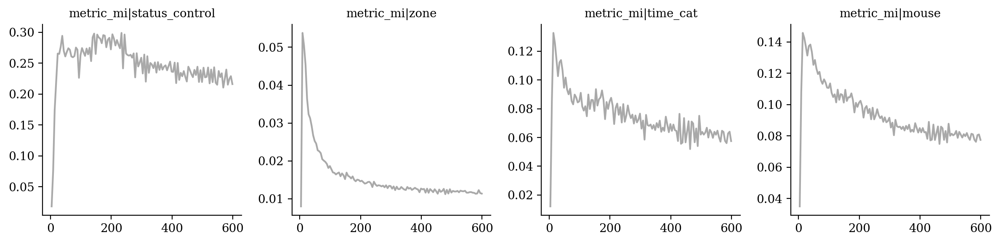

In [12]:
vae.plot_training_history(
    ignore_first=0,
    n_col=4,
    metrics_name=["metric_mi|status_control", "metric_mi|zone", "metric_mi|time_cat", "metric_mi|mouse"]
)

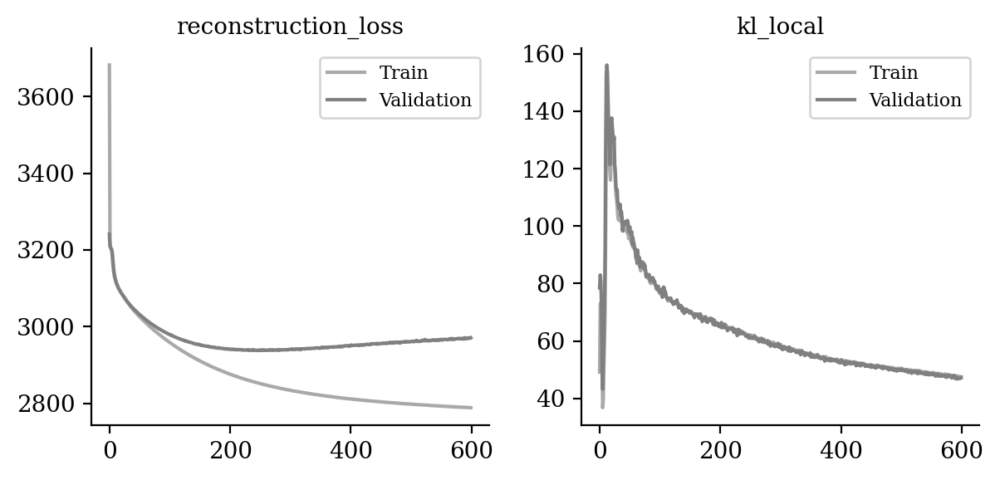

In [13]:
vae.plot_training_history(
    ignore_first=0,
    n_col=4,
    metrics_name=["reconstruction_loss", "kl_local"]
)

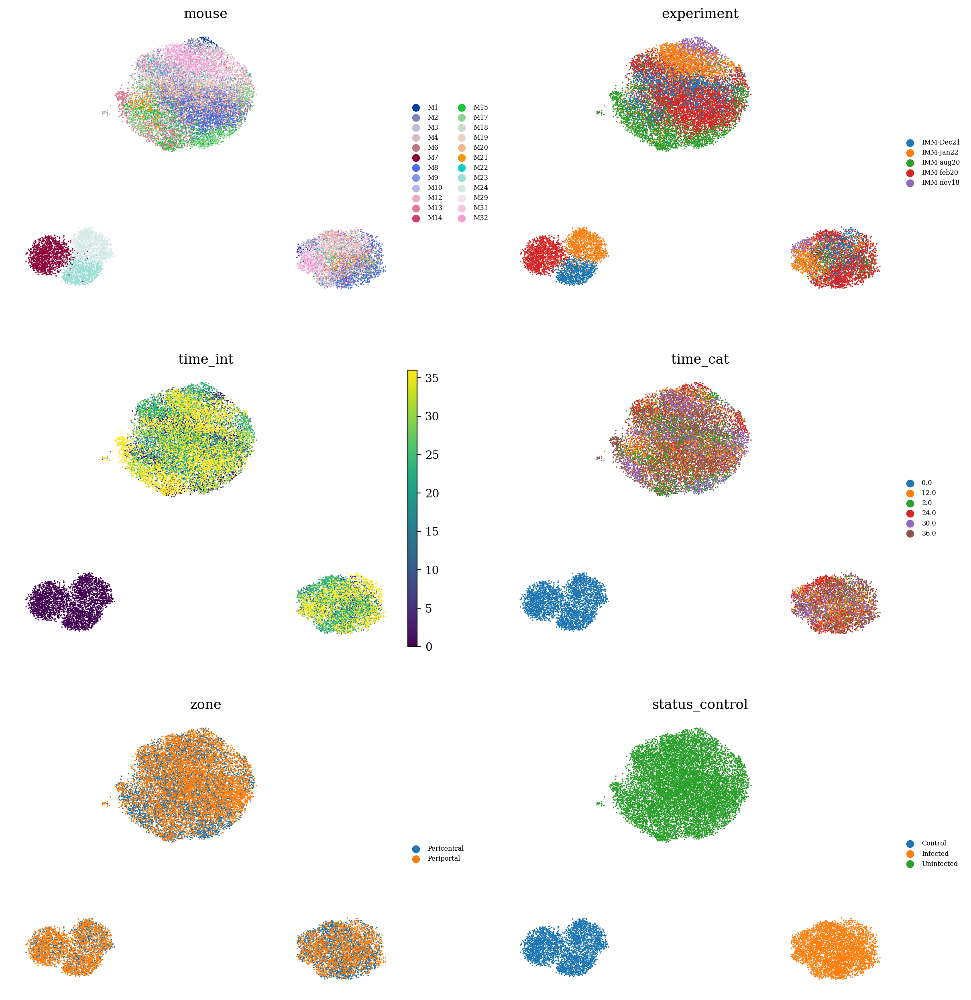

In [14]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_int', 'time_cat', 'zone', 'status_control'], 
        ncols=2,
        frameon=False,
        legend_fontsize="xx-small"
    )

In [15]:
from tardis._disentanglementmanager import DisentanglementManager as DM

In [16]:
latent = ad.AnnData(X=vae.get_latent_representation()[:, DM.configurations.get_by_obs_key("status_control").unreserved_latent_indices], obs=adata.obs.copy())
sc.pp.neighbors(latent, n_neighbors = 30)
sc.tl.umap(latent)

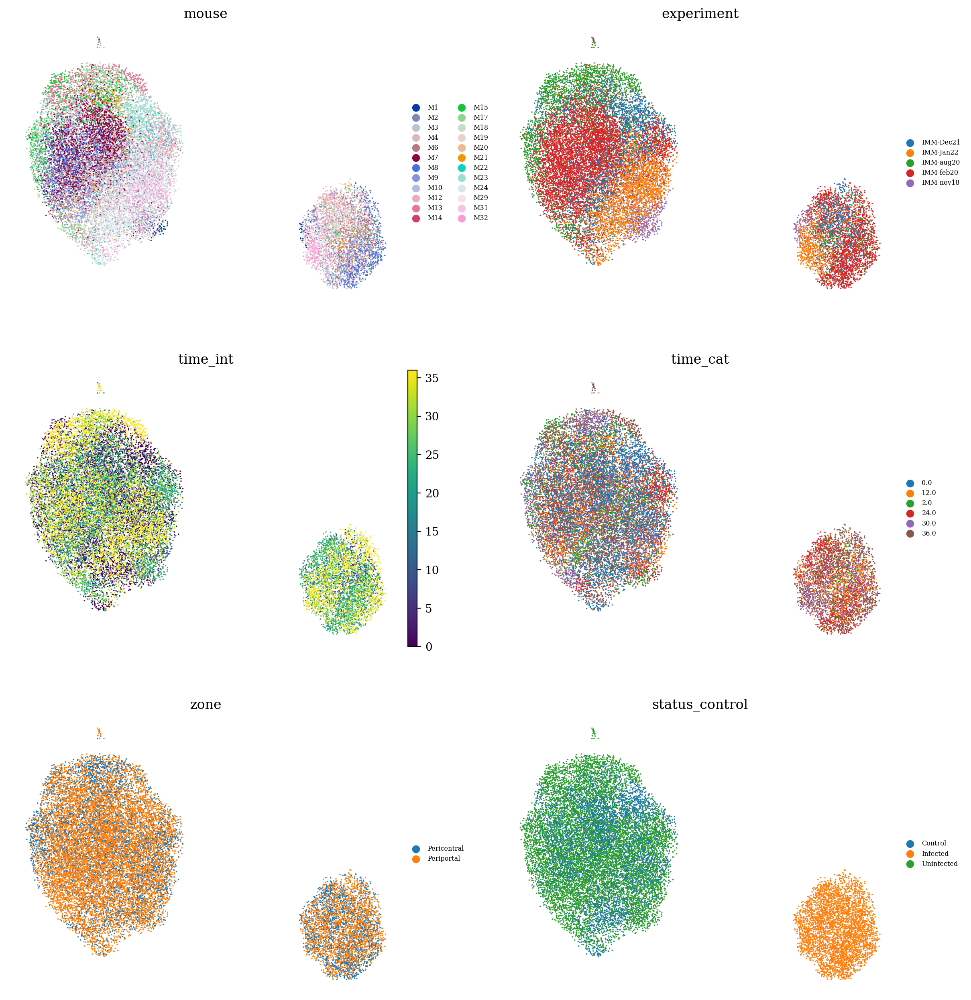

In [17]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_int', 'time_cat', 'zone', 'status_control'], 
        ncols=2,
        frameon=False,
        legend_fontsize="xx-small"
    )

In [18]:
latent = ad.AnnData(X=vae.get_latent_representation()[:, DM.configurations.get_by_obs_key("status_control").reserved_latent_indices], obs=adata.obs.copy())
sc.pp.neighbors(latent, n_neighbors = 30)
sc.tl.umap(latent)

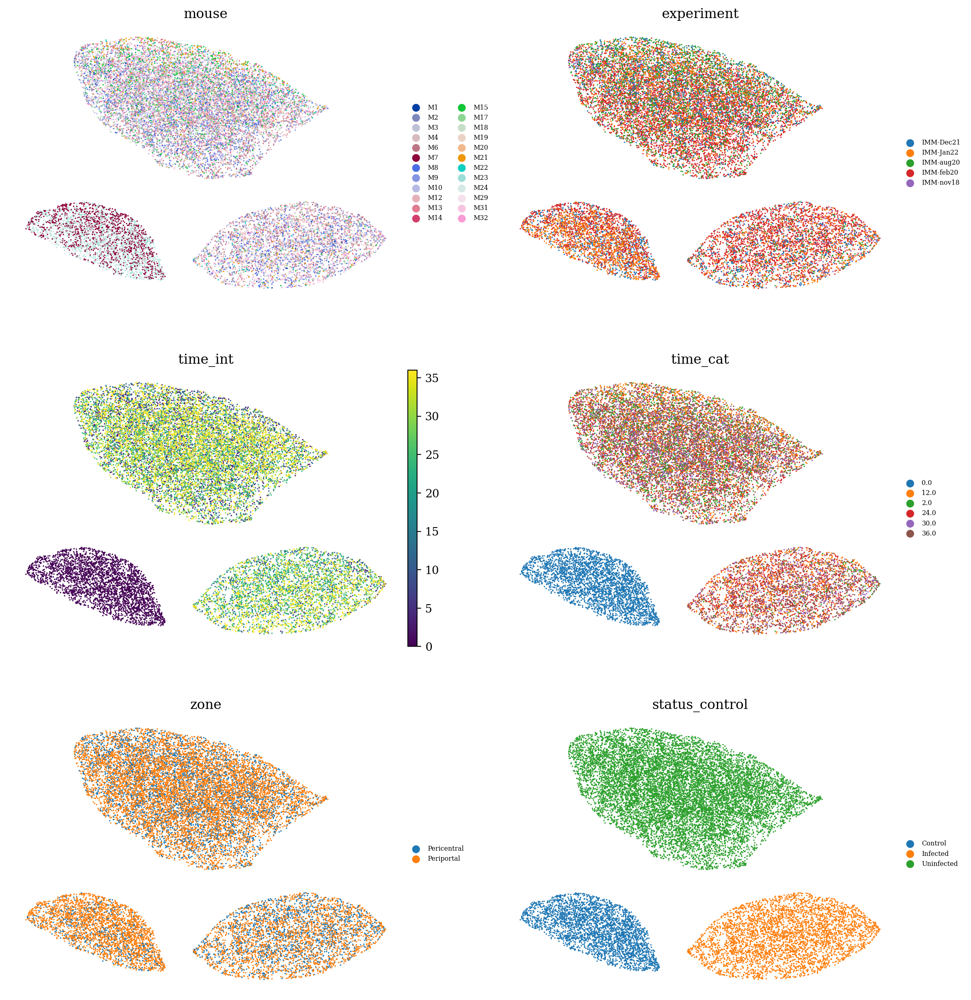

In [19]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_int', 'time_cat', 'zone', 'status_control'], 
        ncols=2,
        frameon=False,
        legend_fontsize="xx-small"
    )

In [20]:
latent = ad.AnnData(X=vae.get_latent_representation(indices=vae.validation_indices)[:, DM.configurations.get_by_obs_key("status_control").reserved_latent_indices], obs=adata.obs.copy().iloc[vae.validation_indices, :])
sc.pp.neighbors(latent, n_neighbors = 30)
sc.tl.umap(latent)

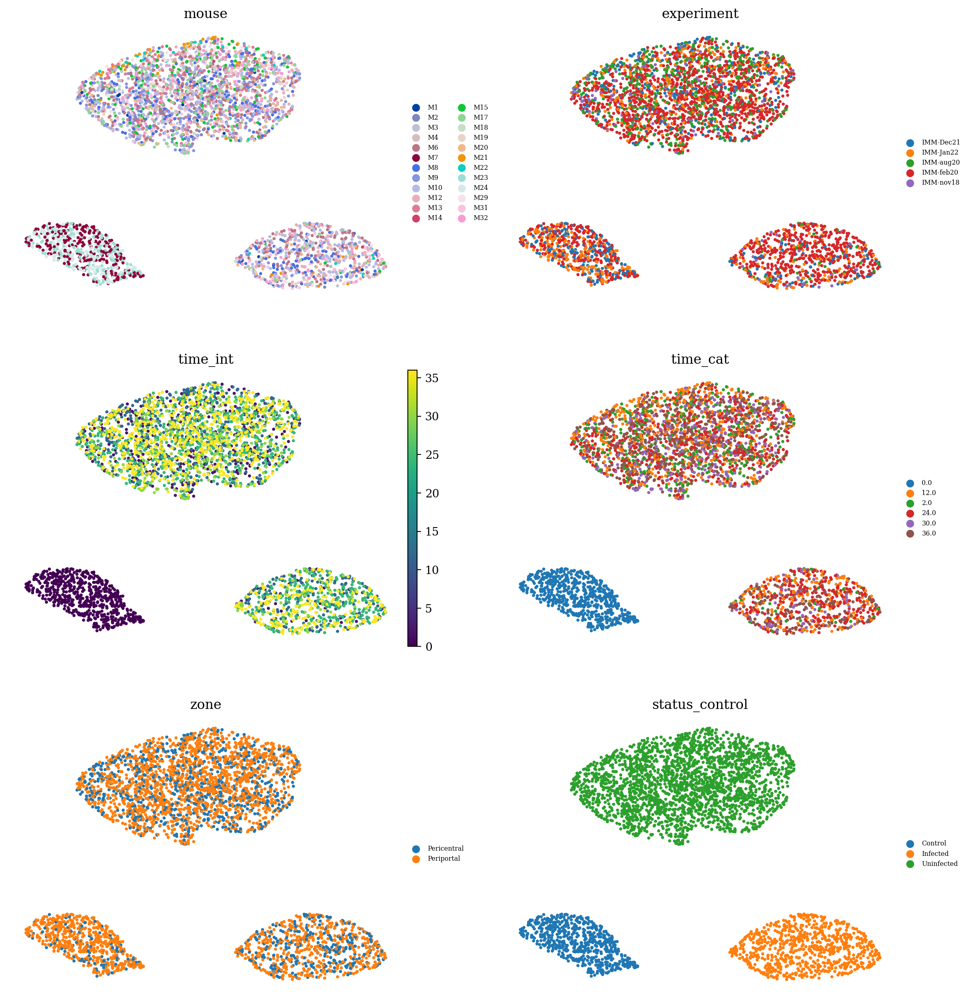

In [21]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_int', 'time_cat', 'zone', 'status_control'], 
        ncols=2,
        frameon=False,
        legend_fontsize="xx-small"
    )

In [22]:
latent = ad.AnnData(X=vae.get_latent_representation(indices=vae.validation_indices)[:, DM.configurations.get_by_obs_key("status_control").unreserved_latent_indices], obs=adata.obs.copy().iloc[vae.validation_indices, :])
sc.pp.neighbors(latent, n_neighbors = 30)
sc.tl.umap(latent)

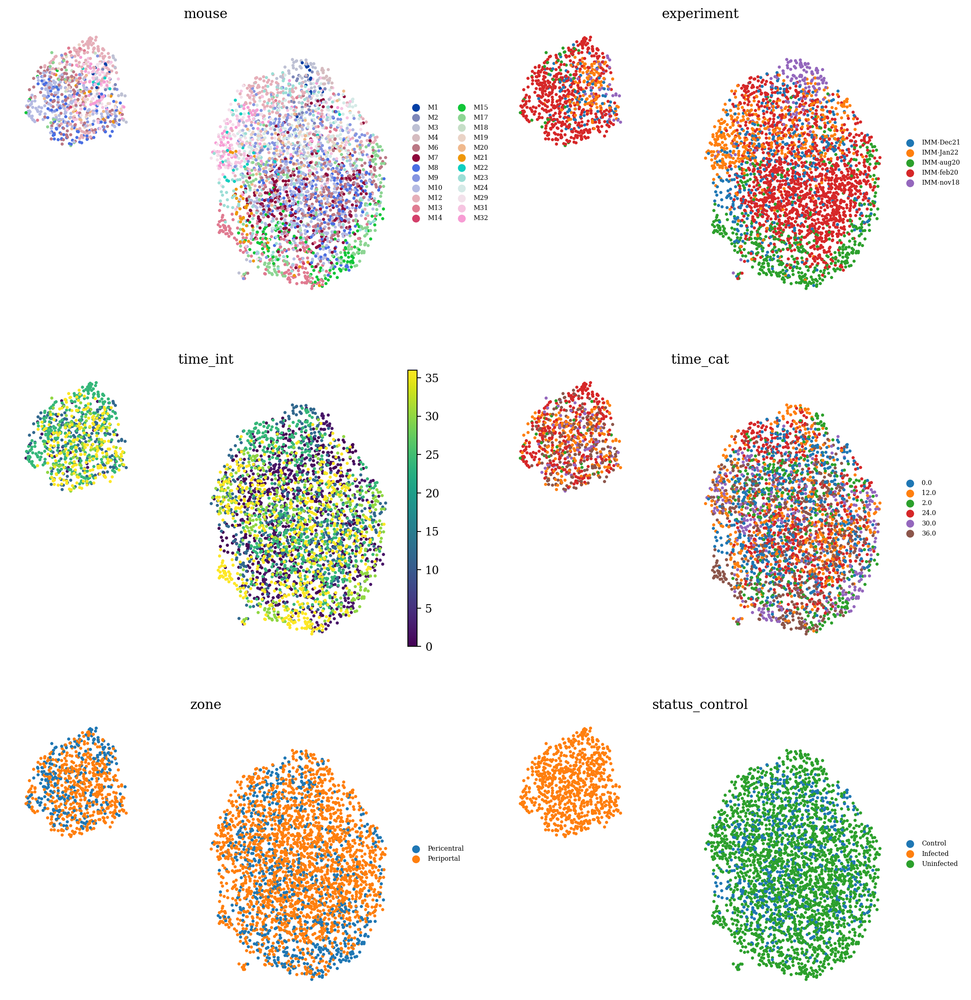

In [23]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_int', 'time_cat', 'zone', 'status_control'], 
        ncols=2,
        frameon=False,
        legend_fontsize="xx-small"
    )